# Reject Inference using Generative Adversarial Neural Networks
---
*V. Simoncikova*
(submitted 2020)

## Conditional Semi-supervised GAN (CSGAN)

Generator is a conditional network that takes as input random noise and a label (0,1) and outputs a sample from the distribution.

Discriminator is composed of two stacked networks: supervised classifier (predicting good/bad; trained on accepts only) and unsupervised discriminator (predicting fake or real; trained on all real data + generated data).

Architecture based on Brownlee (2019).

## Four methods of applying GANs to Reject Inference

* **Method 1**: using the GAN's classifier as a scoring model
* **Method 2**: using the GAN's classifier to label rejects
* **Method 3**: using the GAN's generator to create a pre-labeled representative sample
* **Method 2&3**: training a scorecard on both accepts and output of Method 2 and Method 3

Out proposed CSGAN-based methods are compared to:

* **Benchmark**: Scoring model trained on accepts only
* **Oracle***: Scoring model trained on all real applications with ground truth labels
* both implemented as a Logistic Regression or a Random Forest

### 1. Defining Functions

In [3]:
# Loading packages

%matplotlib inline

import numpy as np
import pandas as pd
import random
import math
import os
import time

import matplotlib.pyplot as plt
import seaborn as sns

from tqdm import tqdm_notebook as tqdm

from sklearn.datasets import make_classification
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import auc, accuracy_score, roc_auc_score, precision_recall_curve, brier_score_loss, f1_score, average_precision_score

from keras import layers
from keras import backend
from keras.layers import Input, Dense, Conv2D, LeakyReLU, Dropout, Lambda, Activation, Concatenate, Reshape, Embedding, Flatten, multiply
from keras.optimizers import Adam
from keras.initializers import RandomNormal
from keras.models import Model
from keras.models import load_model
from keras.callbacks import TensorBoard

In [5]:
# Manual parameters

seed = 1307
target_col = "BAD"
reject_col = "REJECT"

# for synthetising data
h = 2000 # holdout sample size
b = 0.20 # overall bad rate (for class weighting)
alpha = 0.40 # acceptance ratio

# for training GAN
n_classes = 2 # good and bad
noise_dim = 30 # dimension of latent space
learning_rate = 0.0002
dropout = 0.5
epochs = 100
batch_size = 128
threshold = 0.5 # smallest probability of defazlt that gives label bad 

# for acceptance loop
n_0 = 500 # sample size for first pre-training
n = 275 # sample size for each iteration
j_max = 100 #number of iterations for accceptance loop

# directory
os.chdir('Documents/MEMS/Thesis/')

In [6]:
# Helper Functions

def get_best_feat(df, target_col, plot = True):
    """finds the feature with highest difference between target_col's classes""" 

    column_diffs = df.groupby(df[target_col]).mean().transpose()
    column_diffs["diff"] = abs(column_diffs[0] - column_diffs[1])
    print(column_diffs)

    best_feat = str(column_diffs[column_diffs["diff"] == np.max(column_diffs["diff"])].index[0]) 
    feat_idx = df.columns.get_loc(best_feat)
    print("Column with biggest difference in means: " + best_feat)

    if (column_diffs.loc[best_feat, 1] - column_diffs.loc[best_feat, 0]) > 0:
        df[best_feat] = -df[best_feat]
        print("Warning: Feature was inverted")
        # want this deciding feature to mimic a bureau score, so the good risk cases should have higher values

    if (plot == True):
        sns.kdeplot(df[best_feat], label="all")
        sns.kdeplot(df[df[target_col]==0][best_feat], label="good")
        sns.kdeplot(df[df[target_col]==1][best_feat], label="bad")
        plt.legend()

    return df, best_feat, feat_idx


def accept_reject_split(df, feat, reject_col, alpha = 0.5):
    """ Simple business rule: accept alpha% apllications with highest feat """
    
    tau = np.percentile(df[feat], q = (1-alpha)*100)
    print(str(int((1-alpha)*100)) + "th percentile of " + feat + ": " + str(round(tau, 3)))

    df[reject_col] = np.where(df[feat] >= tau, 0, 1)

    return df


def X_y_split(df, column):
    X = df.loc[:, df.columns != column]
    y = df[column]
    return X, y


def make_labels(probs, threshold = 0.5):
    labels = np.where(probs > threshold, 1, 0)
    return labels


def get_scores(preds_proba, y_test, reject_col, alpha = 0.5, threshold = 0.5):
    """Computes accuracy, ROC-AUC, Brier Score, F1 score, Average Bad Rate"""
   
    def get_goodbad_rates(preds_proba, y_true, reject_col, alpha = 0.5): 
        """Computes Accepts Bad Rate and Rejects Good Rate"""
        dt = pd.DataFrame()
        dt["preds"] = 1 - preds_proba
        dt = accept_reject_split(dt, "preds", reject_col=reject_col, alpha = alpha)
        # accept best alpha% in terms of repayment probability
        dt["TARGET"] = y_true
        dt_accepts = dt[dt[reject_col]==0] #accepts only
        dt_rejects = dt[dt[reject_col]==1]
        abr = sum(dt_accepts["TARGET"]) / dt_accepts.shape[0] # accepts bad rate
        rgr = 1 - (sum(dt_rejects["TARGET"]) / dt_rejects.shape[0]) # rejects good rate

        return abr, rgr

    preds = np.where(preds_proba > threshold , 1, 0)

    accuracy = accuracy_score(y_test, preds)
    F1 = f1_score(y_test, preds)

    AUC_ROC = roc_auc_score(y_test, preds_proba)
    BS = brier_score_loss(y_test, preds_proba)

  #  precision, recall, thresholds = precision_recall_curve(y_test, preds_proba)
  # AUC_PR = auc(recall, precision)

    AUC_PR = average_precision_score(y_test, preds_proba)

    ABR, RGR = get_goodbad_rates(preds_proba, y_test, reject_col, alpha)

    return accuracy, AUC_ROC, AUC_PR, BS, ABR, RGR


def plot_distributions(df, target_col, fake_df = None, save = True):
    """plots data distribution by class with the option to compare to fake data"""
    data_cols = list(df.columns[ df.columns != target_col ])

    axarr = [[]]*len(data_cols)
    columns = 5
    rows = int( np.ceil( len(data_cols) / columns ) )
    f, fig = plt.subplots( figsize=(columns*3.5, rows*2) )

    f.suptitle('Data Distributions by Feature and ' + target_col, size=16)

    if (target_col == "REJECT"):
        label = ['accept','reject'] 
    elif (target_col == "TARGET"):
        label = ['good','bad']
    else :
        label = ['0','1'] 

    if (fake_df is not None):
        label = label + ['real'] + ['fake']
    
    for i, col in enumerate(data_cols[:]):
        axarr[i] = plt.subplot2grid( (int(rows), int(columns)), (int(i//columns), int(i%columns)) )
        if (fake_df is None):
            axarr[i].hist( [ df.loc[df[target_col] == 0, col], df.loc[df[target_col] == 1, col] ], 
                            label=label, bins=20, density=True)
        else :
            axarr[i].hist( [ df.loc[df[target_col] == 0, col], df.loc[df[target_col] == 1, col], df.loc[:, col], fake_df.loc[:, col] ], 
                          label=label, bins=20, density=True)
            
        axarr[i].set_xlabel(col, size=12)
        axarr[i].tick_params(axis='both', labelsize=10)
        if i == 0: 
            legend = axarr[i].legend()
            legend.get_frame().set_facecolor('white')
        if i%4 != 0 : 
            axarr[i].tick_params(axis='y', left='off', labelleft='off')

    plt.tight_layout(rect=[0,0,1,0.95]) # xmin, ymin, xmax, ymax
    
    if (save == True):
        timestamp = time.strftime('%Y%m%d-%H%M%S')
        plt.savefig(timestamp + '_' + target_col + '_Distributions.png')

    plt.show()


def plot_losses(losses_df, bat_per_epo, iter = None, save = True):
    """plots GAN's training losses"""
    losses_epochs = losses_df.groupby(losses_df.index//bat_per_epo) #.agg([np.mean, np.std])
    losses_means = pd.DataFrame(losses_epochs.mean())

    fig, ax = plt.subplots(1,3, figsize=(20,4))
    fig.suptitle("Training losses: "+str(iter))

    ax[0].plot(losses_df, alpha=0.5)
    ax[0].set(xlabel="steps")

    ax[1].plot(losses_means)
    ax[1].set(xlabel="epochs")
    ax[1].legend(labels=["classifier","generator","discriminator: real","discriminator: fake"])

    ax[2].plot(losses_means)
    ax[2].set(xlabel="epochs", ylabel="log loss")
    ax[2].set_yscale("log")

    if save :
        timestamp = time.strftime('%Y%m%d-%H%M%S')
        fig.savefig("losses_cond_iter_" + str(iter) + ".png")

    plt.show()

    
def make_gaps(score_df, benchmark_df):
    """computes the difference in each metric between a model and the benchmark in acceptance loop"""
    metrics = list(score_df.columns)
    gap_df = pd.DataFrame(columns = metrics)
    for col in metrics:
        gap_df[col] = score_df[col] - benchmark_df[col]
    gap_max = gap_df.max()
    gap_min = gap_df.min()
    gap_mean = gap_df.mean()
    return pd.DataFrame([gap_max, gap_min, gap_mean], columns = metrics, index=["max","min","mean"])


In [7]:
# Experiment Framework

def evaluate_methods(clf, c_model, g_model, conditional,
                     df, test, target_col, reject_col,
                     noise_dim, alpha, threshold):
    """Performs the experiment with four described method, a benchmark and an oracle
    Six metrics: Accuracy, AUC-ROC, AUC-PR, Brier Score, Bad rate among Accepts, Good rate among Rejects
    Choose classifier (baseline scoring model) from ["LR","RF"]"""

    if (clf == "LR"):
        clf_1 = LogisticRegression(penalty='l1', C=0.9, solver='saga', n_jobs=-1, max_iter=500)           
    elif (clf == "RF"):
        clf_1 = RandomForestClassifier(n_estimators = 300, min_samples_leaf = 1, max_features = 'sqrt', 
                                       bootstrap = True, random_state = seed, n_jobs=2)  
    else :
        raise ValueError("choose clf from [LR, RF]")

    clf_2 = clf_1
    clf_3 = clf_1
    clf_4 = clf_1
    clf_5 = clf_1

    scores = pd.DataFrame(index=["accuracy","AUC_ROC","AUC_PR","BS","ABR","RGR"], 
                          columns=["benchmark","method_1","method_2","method_3","method_all","oracle"])

    # Prepare data
    X_test, y_test = X_y_split(test, target_col)
    X_oracle, y_oracle = X_y_split(df.loc[:,df.columns!=reject_col], target_col)
    D_a = df[df[reject_col]==0]
    D_r = df[df[reject_col]==1]
    D_a, _ = X_y_split(D_a, reject_col)
    D_r, _ = X_y_split(D_r, reject_col)

    X_a, y_a = X_y_split(D_a, target_col)
    X_r, y_r = X_y_split(D_r, target_col)

    D_r[target_col] = np.where(D_r[target_col]==1, np.nan, np.nan)
    D_all = D_a.append(D_r)
    X_all, y_all = X_y_split(D_all, target_col)

    # BENCHMARK: clf on accepts
    clf_1.fit(X_a, y_a)
    benchmark_preds = clf_1.predict_proba(X_test)[:,1]
    scores["benchmark"] = get_scores(preds_proba=benchmark_preds, y_test=y_test, reject_col=reject_col, alpha=alpha, threshold=threshold)

    # METHOD 1: GAN as scoring model
    m1_preds = c_model.predict(X_test)[:,1]
    scores["method_1"] = get_scores(preds_proba=m1_preds, y_test=y_test, reject_col=reject_col, alpha=alpha, threshold=threshold)

    # METHOD 2: labeling rejects + clf
    y_r_pred = c_model.predict(X_r)[:,1]
    y_r_pred = make_labels(probs=y_r_pred, threshold=threshold)
    clf_2.fit(X_a.append(X_r), pd.concat([y_a, pd.Series(y_r_pred)]))
    m2_preds = clf_2.predict_proba(X_test)[:,1]
    scores["method_2"] = get_scores(preds_proba=m2_preds, y_test=y_test, reject_col=reject_col, alpha=alpha, threshold=threshold)

    # METHOD 3: generating fakes + clf
   # fake_data=pd.DataFrame()
    z_input = np.random.randn(noise_dim * X_all.shape[0])
    z_input = z_input.reshape(X_all.shape[0], noise_dim)
    if conditional: 
        in_label = np.random.randint(0, 2, X_all.shape[0])
        X_fake = g_model.predict([z_input, in_label])
        fake_data = pd.DataFrame(X_fake, columns=X_a.columns)
        fake_data[target_col] = in_label
    else:
        X_fake = g_model.predict(z_input)
        fake_data = pd.DataFrame(X_fake, columns=X_a.columns)
        fake_data[target_col] = c_model.predict(X_fake)[:,1]
        fake_data[target_col] = make_labels(fake_data[target_col], threshold)
    X_fake, y_fake = X_y_split(fake_data, target_col)

    print(fake_data.describe())

    clf_3.fit(X_a.append(X_fake), pd.concat([y_a, y_fake]))
    m3_preds = clf_3.predict_proba(X_test)[:,1]
    scores["method_3"] = get_scores(preds_proba=m3_preds, y_test=y_test, reject_col=reject_col, alpha=alpha, threshold=threshold)

    # METHOD 2&3: rejects+fakes + clf
    clf_4.fit(X_a.append(X_r).append(X_fake), pd.concat([y_a, pd.Series(y_r_pred), pd.Series(y_fake)]))
    m4_preds = clf_4.predict_proba(X_test)[:,1]
    scores["method_all"] = get_scores(preds_proba=m4_preds, y_test=y_test, reject_col=reject_col, alpha=alpha, threshold=threshold)

    # ORACLE: clf on all
    clf_5.fit(X_oracle, y_oracle)
    oracle_preds = clf_5.predict_proba(X_test)[:,1]
    scores["oracle"] = get_scores(preds_proba=oracle_preds, y_test=y_test, reject_col=reject_col, alpha=alpha, threshold=threshold)

    return scores, fake_data

### 2. Data Preparation

#### Synthetic data

In [ ]:
def generate_data(target_col, b, seed, n_samples = 100, n_classes = 2, n_features = 10, n_clusters = 2, flip = 0, gender = True, encoding = "one_hot"):
    """ 
    params: 
    - gender (Bool) : include column "gender"?
    - encoding (str): how to handle categorical variables; "one_hot" or "label"
    """
    X, y = make_classification(n_samples = n_samples,
                               n_classes = 2,   # n_classes = np.where(gender == False, n_classes, n_classes*2),
                               weights = (1-b, b), 
                               n_features = n_features, 
                               n_informative = math.ceil(n_features/2), n_redundant = math.floor(n_features/5), 
                               random_state = seed, 
                               n_clusters_per_class = n_clusters,
                               flip_y = flip)
    
    col_list = ['feat_' + str(n) for n in range(1,n_features+1)]

    df = pd.concat([pd.DataFrame(X, columns = col_list), pd.DataFrame(y, columns = [target_col], index=None)], axis=1)

    if (gender == True):
        df["gender"] = np.random.choice(["Female","Male"], df.shape[0], replace=True)
        #for now random - consider having more classes (F-G,F-B,M-G,M-B)
        if (encoding == "one_hot"):
            df = pd.get_dummies(df, columns=["gender"])
        elif (encoding == "label_enc"):
            df["gender"] = LabelEncoder().fit_transform(df["gender"])
        else :
            raise ValueError('choose encoding from ["one_hot", "label_enc"]')

    return df

In [7]:
sample_size = h + n_0 + n*(j_max+1)

df = generate_data(target_col, b, seed, sample_size, n_classes, n_features = 10, n_clusters = 2, flip = 0.04, gender = True, encoding = "one_hot")

scaler = StandardScaler()
X, y = X_y_split(df, target_col)
df = pd.DataFrame(scaler.fit_transform(X, y), columns=X.columns)
df[target_col] = y
df.describe()

df.to_csv('df_synth.csv')

,feat_1,feat_2,feat_3,feat_4,feat_5,feat_6,feat_7,feat_8,feat_9,feat_10,gender_Female,gender_Male,TARGET
count,1.050000e+05,1.050000e+05,1.050000e+05,1.050000e+05,1.050000e+05,1.050000e+05,1.050000e+05,1.050000e+05,1.050000e+05,1.050000e+05,1.050000e+05,1.050000e+05,105000.000000
mean,-1.546065e-17,-1.491452e-17,-2.417801e-17,1.362032e-16,1.238797e-17,-2.145109e-17,4.873350e-17,-1.301816e-17,-3.786389e-18,1.061582e-16,8.485858e-16,-9.282480e-16,0.212629
std,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,0.409169
min,-4.148039e+00,-4.651642e+00,-4.639043e+00,-4.299287e+00,-4.303287e+00,-4.491747e+00,-4.285781e+00,-4.075553e+00,-4.922980e+00,-4.239414e+00,-9.956855e-01,-1.004333e+00,0.000000
25%,-6.612238e-01,-6.693496e-01,-6.761106e-01,-6.943342e-01,-6.797584e-01,-6.579850e-01,-6.184713e-01,-7.000806e-01,-6.728982e-01,-6.988514e-01,-9.956855e-01,-1.004333e+00,0.000000
50%,3.150284e-02,1.362470e-04,-4.670777e-04,-1.326786e-03,-1.235610e-02,-3.885497e-02,4.579280e-02,-5.068843e-02,1.480875e-04,-1.998923e-03,-9.956855e-01,9.956855e-01,0.000000
75%,6.945019e-01,6.743478e-01,6.700318e-01,7.145612e-01,6.582623e-01,6.090185e-01,6.658994e-01,6.657664e-01,6.710352e-01,7.375601e-01,1.004333e+00,9.956855e-01,0.000000
max,4.041761e+00,4.269538e+00,4.524847e+00,4.063615e+00,4.929710e+00,5.547742e+00,4.500599e+00,4.248822e+00,4.840682e+00,4.132161e+00,1.004333e+00,9.956855e-01,1.000000


TARGET                0         1      diff
feat_1         0.246842 -0.914066  1.160908
feat_2        -0.000350  0.001297  0.001648
feat_3         0.001704 -0.006312  0.008016
feat_4        -0.127696  0.472861  0.600557
feat_5         0.126817 -0.469606  0.596423
feat_6        -0.122565  0.453863  0.576428
feat_7         0.150748 -0.558226  0.708974
feat_8         0.111167 -0.411655  0.522822
feat_9        -0.000072  0.000265  0.000337
feat_10       -0.223137  0.826286  1.049423
gender_Female -0.001845  0.006832  0.008677
gender_Male    0.001845 -0.006832  0.008677
Column with biggest difference in means: feat_1
60th percentile of feat_1: 0.285


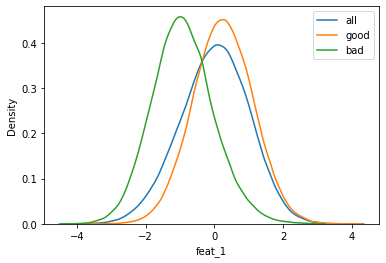

In [8]:
df, best_feat, best_feat_idx = get_best_feat(df, target_col, plot = True)

df = accept_reject_split(df, feat = best_feat, reject_col = reject_col, alpha=alpha)

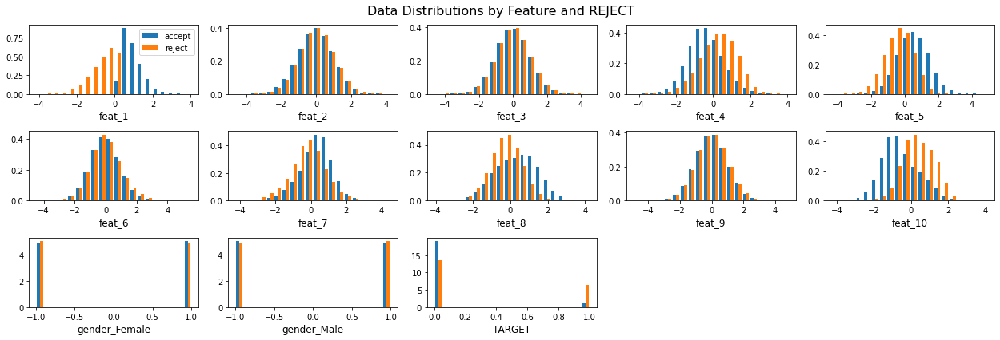

In [ ]:
plot_distributions(df, target_col=reject_col, save=True)

In [9]:
# Prepare data

# create a holdout sample S
S = df.loc[:h, df.columns != reject_col]
df = df[h:sample_size]
X_holdout, y_holdout = X_y_split(S, target_col)

# Separate accepts and rejects
D_a = df[df[reject_col]==0]
D_r = df[df[reject_col]==1]
D_a, _ = X_y_split(D_a, reject_col)
D_r, _ = X_y_split(D_r, reject_col)

print("# Accepts: " + str(D_a.shape[0]) + "\n# Rejects: " + str(D_r.shape[0]) + "\n")

print("% of bad risk in accepts: " + str(round(np.sum(D_a[target_col]==1) / D_a.shape[0] * 100, 1)) + "%")
print("% of bad risk in rejects: " + str(round(np.sum(D_r[target_col]==1) / D_r.shape[0] * 100, 1)) + "%")
print("\n% of bad risk in holdout: " + str(round(np.sum(S[target_col]==1) / S.shape[0] * 100, 1)) + "%")

X_a, y_a = X_y_split(D_a, target_col)
X_r, y_r = X_y_split(D_r, target_col)

D_r[target_col] = np.where(D_r[target_col]==1, np.nan, np.nan) # remove labels from rejects
D_all = D_a.append(D_r) #.sample(frac=1)
X_all, y_all = X_y_split(D_all, target_col)

# Accepts: 41207
# Rejects: 61793

% of bad risk in accepts: 4.9%
% of bad risk in rejects: 32.1%

% of bad risk in holdout: 21.4%


#### Home Credit data

* Source: Kaggle (2017)
* Prepared version provided by Nikita Kozodoi.

In [8]:
df = pd.read_csv("/data/homecredit.csv")
df[target_col] = np.where(df["BAD"]=="BAD",1,0)

scaler = StandardScaler()
X, y = X_y_split(df, target_col)
df = pd.DataFrame(scaler.fit_transform(X, y), columns=X.columns)
df[target_col] = y
df.describe()

,app_CNT_CHILDREN,app_AMT_INCOME_TOTAL,app_AMT_CREDIT,app_AMT_ANNUITY,app_AMT_GOODS_PRICE,app_REGION_POPULATION_RELATIVE,app_DAYS_BIRTH,app_DAYS_EMPLOYED,app_DAYS_REGISTRATION,app_DAYS_ID_PUBLISH,app_OWN_CAR_AGE,app_FLAG_MOBIL,app_FLAG_EMP_PHONE,app_FLAG_WORK_PHONE,app_FLAG_CONT_MOBILE,app_FLAG_PHONE,app_FLAG_EMAIL,app_CNT_FAM_MEMBERS,app_REGION_RATING_CLIENT,app_REGION_RATING_CLIENT_W_CITY,app_HOUR_APPR_PROCESS_START,app_REG_REGION_NOT_LIVE_REGION,app_REG_REGION_NOT_WORK_REGION,app_LIVE_REGION_NOT_WORK_REGION,app_REG_CITY_NOT_LIVE_CITY,app_REG_CITY_NOT_WORK_CITY,app_LIVE_CITY_NOT_WORK_CITY,app_EXT_SOURCE_1,app_EXT_SOURCE_2,app_EXT_SOURCE_3,app_APARTMENTS_AVG,app_BASEMENTAREA_AVG,app_YEARS_BEGINEXPLUATATION_AVG,app_YEARS_BUILD_AVG,app_COMMONAREA_AVG,app_ELEVATORS_AVG,app_ENTRANCES_AVG,app_FLOORSMAX_AVG,app_FLOORSMIN_AVG,app_LANDAREA_AVG,...,app_FLAG_DOCUMENT_4,app_FLAG_DOCUMENT_5,app_FLAG_DOCUMENT_6,app_FLAG_DOCUMENT_7,app_FLAG_DOCUMENT_8,app_FLAG_DOCUMENT_9,app_FLAG_DOCUMENT_10,app_FLAG_DOCUMENT_11,app_FLAG_DOCUMENT_12,app_FLAG_DOCUMENT_13,app_FLAG_DOCUMENT_14,app_FLAG_DOCUMENT_15,app_FLAG_DOCUMENT_16,app_FLAG_DOCUMENT_17,app_FLAG_DOCUMENT_18,app_FLAG_DOCUMENT_19,app_FLAG_DOCUMENT_20,app_FLAG_DOCUMENT_21,app_AMT_REQ_CREDIT_BUREAU_HOUR,app_AMT_REQ_CREDIT_BUREAU_DAY,app_AMT_REQ_CREDIT_BUREAU_WEEK,app_AMT_REQ_CREDIT_BUREAU_MON,app_AMT_REQ_CREDIT_BUREAU_QRT,app_AMT_REQ_CREDIT_BUREAU_YEAR,app_CREDIT_BY_INCOME,app_ANNUITY_BY_INCOME,app_GOODS_PRICE_BY_INCOME,app_INCOME_PER_PERSON,app_PERCENT_WORKED,app_CNT_ADULTS,app_CHILDREN_RATIO,app_ANNUITY.LENGTH,app_EXT_SOURCE_MEAN,app_NUM_EXT_SOURCES,app_NUM_DOCUMENTS,app_OWN_CAR_AGE_RATIO,app_DAYS_ID_PUBLISHED_RATIO,app_DAYS_REGISTRATION_RATIO,app_DAYS_LAST_PHONE_CHANGE_RATIO,BAD
count,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,...,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,3.075110e+05,307511.000000
mean,-3.193704e-15,3.041338e-15,3.955445e-15,-2.943849e-15,-6.197733e-16,8.965010e-17,2.892538e-16,7.855166e-16,3.954148e-16,1.997514e-16,7.450401e-16,2.917601e-14,-3.102083e-15,-9.642254e-16,6.732933e-16,2.429606e-15,-5.371189e-15,-4.276341e-15,3.490052e-15,3.454056e-15,-5.383671e-16,1.546912e-15,-1.849818e-15,-6.706394e-15,4.845894e-15,3.348602e-16,1.939923e-15,-7.203765e-16,2.580355e-16,1.362504e-16,-2.776772e-16,1.523652e-15,2.920370e-15,4.624312e-15,1.271653e-16,6.143098e-16,1.794754e-15,1.423858e-15,-1.363147e-15,-8.161434e-17,...,-1.281257e-14,3.536623e-16,6.209816e-15,-8.306858e-15,2.124324e-15,6.884047e-16,-2.522339e-15,-5.509080e-15,1.646529e-15,2.960333e-15,-4.107762e-15,2.682108e-15,-2.853425e-15,6.458429e-15,3.762494e-15,4.450950e-15,4.986820e-15,-1.535583e-15,-1.085740e-15,-4.728452e-15,9.493449e-15,9.990133e-17,6.762063e-16,1.702306e-15,2.366798e-16,-6.273406e-16,-4.265378e-17,-1.030366e-16,-1.671214e-16,-7.128792e-15,-2.724928e-16,-4.067964e-16,-1.211004e-15,-7.732710e-16,-9.697713e-17,3.950379e-16,2.316142e-16,-2.539069e-16,-2.951237e-16,0.080729
std,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.00

BAD                                      0         1      diff
app_CNT_CHILDREN                 -0.005686  0.064747  0.070433
app_AMT_INCOME_TOTAL              0.005477 -0.062368  0.067845
app_AMT_CREDIT                    0.003610 -0.041105  0.044715
app_AMT_ANNUITY                  -0.000231  0.002627  0.002858
app_AMT_GOODS_PRICE               0.006642 -0.075637  0.082279
...                                    ...       ...       ...
app_NUM_DOCUMENTS                -0.005095  0.058019  0.063114
app_OWN_CAR_AGE_RATIO            -0.008028  0.091418  0.099446
app_DAYS_ID_PUBLISHED_RATIO       0.003382 -0.038515  0.041897
app_DAYS_REGISTRATION_RATIO       0.002725 -0.031027  0.033751
app_DAYS_LAST_PHONE_CHANGE_RATIO  0.010061 -0.114569  0.124631

[91 rows x 3 columns]
Column with biggest difference in means: app_EXT_SOURCE_MEAN
60th percentile of app_EXT_SOURCE_MEAN: 0.363


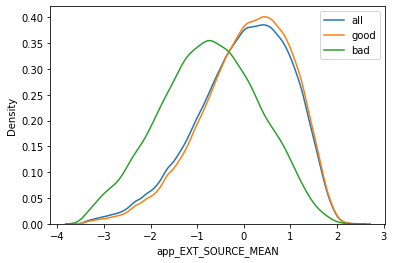

In [9]:
df, best_feat, best_feat_idx = get_best_feat(df, target_col, plot = True)

df = accept_reject_split(df, feat = best_feat, reject_col = reject_col, alpha=alpha)

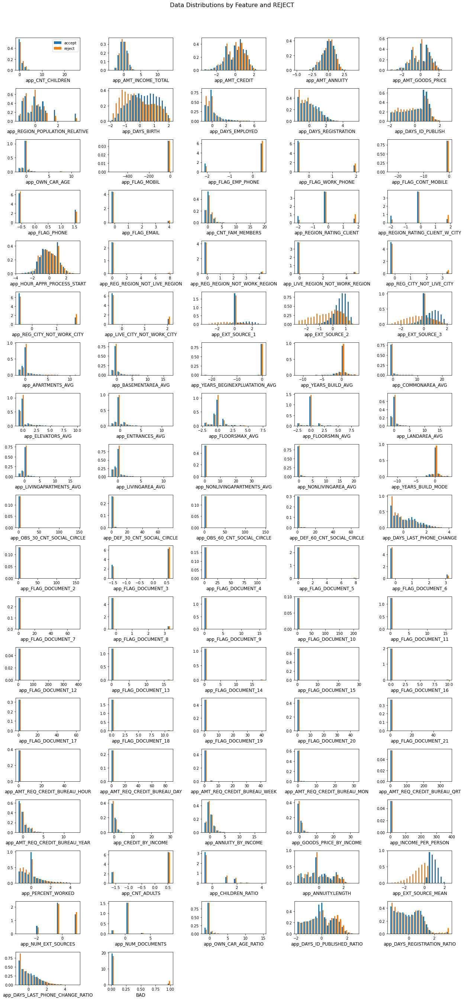

In [40]:
plot_distributions(df, target_col=reject_col, save=True)

In [12]:
# Prepare data

# create a holdout sample S
S = df.loc[:h, df.columns != reject_col]
df = df[h:sample_size]
X_holdout, y_holdout = X_y_split(S, target_col)

# Separate accepts and rejects
D_a = df[df[reject_col]==0]
D_r = df[df[reject_col]==1]
D_a, _ = X_y_split(D_a, reject_col)
D_r, _ = X_y_split(D_r, reject_col)

print("# Accepts: " + str(D_a.shape[0]) + "\n# Rejects: " + str(D_r.shape[0]) + "\n")

print("% of bad risk in accepts: " + str(round(np.sum(D_a[target_col]==1) / D_a.shape[0] * 100, 1)) + "%")
print("% of bad risk in rejects: " + str(round(np.sum(D_r[target_col]==1) / D_r.shape[0] * 100, 1)) + "%")
print("\n% of bad risk in holdout: " + str(round(np.sum(S[target_col]==1) / S.shape[0] * 100, 1)) + "%")

X_a, y_a = X_y_split(D_a, target_col)
X_r, y_r = X_y_split(D_r, target_col)

D_r[target_col] = np.where(D_r[target_col]==1, np.nan, np.nan) # remove labels from rejects
D_all = D_a.append(D_r) 
X_all, y_all = X_y_split(D_all, target_col)

# Accepts: 41138
# Rejects: 61862

% of bad risk in accepts: 3.3%
% of bad risk in rejects: 11.4%

% of bad risk in holdout: 7.2%


#### UK data
* Source: Baesens et al. (2003)
* Provided by Nikita Kozodoi

In [7]:
# Synthetic data
df = pd.read_csv("data/uk.csv")
df[target_col] = np.where(df[target_col]=="BAD",1,0)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 15 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   BAD       30000 non-null  int64  
 1   Age       30000 non-null  int64  
 2   Amount    30000 non-null  int64  
 3   Curadd    30000 non-null  float64
 4   Curremp   30000 non-null  float64
 5   Custgend  30000 non-null  object 
 6   Depchild  30000 non-null  int64  
 7   Freqpaid  30000 non-null  object 
 8   Homephon  30000 non-null  object 
 9   Insprem   30000 non-null  int64  
 10  Loantype  30000 non-null  object 
 11  Marstat   30000 non-null  object 
 12  Term      30000 non-null  int64  
 13  Homeowns  30000 non-null  object 
 14  Purpose   30000 non-null  object 
dtypes: float64(2), int64(6), object(7)
memory usage: 3.4+ MB


In [8]:
df = pd.get_dummies(df)

scaler = StandardScaler()
X, y = X_y_split(df, target_col)
df = pd.DataFrame(scaler.fit_transform(X, y), columns=X.columns)
df[target_col] = y
df.describe()

,Age,Amount,Curadd,Curremp,Depchild,Insprem,Term,Custgend_X1,Custgend_X2,Freqpaid_X1,Freqpaid_X2,Freqpaid_X3,Freqpaid_X4,Freqpaid_X5,Homephon_X1,Homephon_X2,Loantype_X1,Loantype_X2,Marstat_X1,Marstat_X2,Marstat_X3,Marstat_X4,Homeowns_X1,Homeowns_X2,Purpose_X1,Purpose_X10,Purpose_X11,Purpose_X12,Purpose_X13,Purpose_X14,Purpose_X15,Purpose_X16,Purpose_X17,Purpose_X18,Purpose_X19,Purpose_X2,Purpose_X20,Purpose_X21,Purpose_X22,Purpose_X23,Purpose_X24,Purpose_X25,Purpose_X26,Purpose_X27,Purpose_X3,Purpose_X4,Purpose_X5,Purpose_X6,Purpose_X7,Purpose_X8,Purpose_X9,BAD
count,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,3.000000e+04,30000.000000
mean,-2.737070e-17,-7.969292e-16,6.880792e-17,-9.643305e-17,6.489254e-16,-2.091512e-16,4.460728e-16,-3.616366e-16,3.745966e-16,1.539731e-16,-3.039402e-16,-4.103014e-16,7.004305e-17,-1.325583e-17,1.416970e-15,-1.549144e-15,-1.510658e-15,1.510658e-15,-8.679872e-16,5.898097e-16,-5.980401e-18,2.847879e-16,-7.530421e-16,7.530421e-16,2.212198e-15,-3.416341e-16,-1.630674e-15,-6.607778e-15,-5.902169e-15,1.066916e-15,4.652681e-16,1.408938e-16,5.154395e-17,9.019748e-16,-8.505215e-16,1.354843e-15,-2.326744e-15,-2.673565e-16,1.508682e-16,1.567973e-16,-2.007526e-15,-6.950736e-17,-1.695681e-17,-3.311331e-15,-1.316516e-15,-1.516900e-15,1.478902e-15,2.789473e-15,1.846090e-15,-1.283184e-16,-3.780704e-15,0.040000
std,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,0.195962
min,-1.618553e+00,-9.548191e-01,-1.001348e+00,-1.013134e+00,-5.844234e-01,-6.503503e-01,-1.705273e+00,-7.197673e-01,-1.389338e+00,-7.159822e-01,-1.868448e-01,-1.259270e+00,-1.169818e-01,-2.450225e-02,-4.322620e+00,-2.313412e-01,-1.705519e+00,-5.863318e-01,-7.703611e-01,-1.090624e+00,-2.818640e-01,-1.039987e-01,-1.171769e+00,-8.534106e-01,-1.291102e-02,-3.439739e-01,-1.243743e-01,-8.653902e-02,-1.826046e-02,-1.171281e-01,-3.267730e-02,-8.634332e-02,-4.699491e-01,-2.542097e-01,-2.473016e-01,-1.163948e-01,-1.000050e-02,-3.585851e-01,-7.660001e-02,-5.235289e-02,-2.259332e-01,-4.285675e-02,-5.034872e-01,-3.267730e-02,-1.201618e-01,-1.059462e-01,-1.464598e-01,-6.310676e-02,-3.484415e-01,-2.236627e-02,-3.267730e-02,0.000000
25%,-8.064203e-01,-6.410923e-01,-7.616362e-01,-7.422153e-01,-5.844234e-01,-6.503503e-01,-1.078634e+00,-7.197673e-01,-1.389338e+00,-7.159822e-01,-1.868448e-01,-1.259270e+00,-1.169818e-01,-2.450225e-02,2.313412e-01,-2.313412e-01,-1.705519e+00,-5.863318e-01,-7.703611e-01,-1.090624e+00,-2.818640e-01,-1.039987e-01,-1.171769e+00,-8.534106e-01,-1.291102e-02,-3.439739e-01,-1.243743e-01,-8.653902e-02,-1.826046e-02,-1.171281e-01,-3.267730e-02,-8.634332e-02,-4.699491e-01,-2.542097e-01,-2.473016e-01,-1.163948e-01,-1.000050e-02,-3.585851e-01,-7.660001e-02,-5.235289e-02,-2.259332e-01,-4.285675e-02,-5.034872e-01,-3.267730e-02,-1.201618e-01,-1.059462

BAD                 0         1      diff
Age          0.013204 -0.316885  0.330089
Amount      -0.004375  0.105002  0.109377
Curadd       0.009107 -0.218578  0.227686
Curremp      0.018263 -0.438301  0.456563
Depchild    -0.000532  0.012765  0.013296
Insprem     -0.017366  0.416776  0.434141
Term        -0.010388  0.249319  0.259707
Custgend_X1  0.002894 -0.069460  0.072354
Custgend_X2 -0.002894  0.069460  0.072354
Freqpaid_X1 -0.008900  0.213590  0.222490
Freqpaid_X2 -0.000100  0.002400  0.002500
Freqpaid_X3  0.009049 -0.217179  0.226228
Freqpaid_X4 -0.001745  0.041882  0.043627
Freqpaid_X5  0.001021 -0.024502  0.025523
Homephon_X1  0.003327 -0.079846  0.083173
Homephon_X2 -0.003327  0.079846  0.083173
Loantype_X1 -0.004377  0.105043  0.109420
Loantype_X2  0.004377 -0.105043  0.109420
Marstat_X1  -0.007547  0.181128  0.188675
Marstat_X2   0.008847 -0.212330  0.221177
Marstat_X3  -0.003548  0.085146  0.088694
Marstat_X4   0.001633 -0.039202  0.040835
Homeowns_X1  0.011344 -0.272252  0

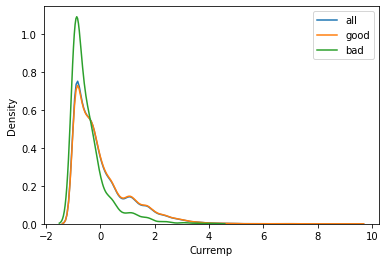

In [9]:
df, best_feat, best_feat_idx = get_best_feat(df, target_col, plot = True)

df = accept_reject_split(df, feat = best_feat, reject_col = reject_col, alpha=alpha)

In [10]:
# Prepare data

# create a holdout sample S
S = df.loc[:h, df.columns != reject_col]
df = df[h:sample_size]
X_holdout, y_holdout = X_y_split(S, target_col)

# Separate accepts and rejects
D_a = df[df[reject_col]==0]
D_r = df[df[reject_col]==1]
D_a, _ = X_y_split(D_a, reject_col)
D_r, _ = X_y_split(D_r, reject_col)

print("# Accepts: " + str(D_a.shape[0]) + "\n# Rejects: " + str(D_r.shape[0]) + "\n")

print("% of bad risk in accepts: " + str(round(np.sum(D_a[target_col]==1) / D_a.shape[0] * 100, 1)) + "%")
print("% of bad risk in rejects: " + str(round(np.sum(D_r[target_col]==1) / D_r.shape[0] * 100, 1)) + "%")
print("\n% of bad risk in holdout: " + str(round(np.sum(S[target_col]==1) / S.shape[0] * 100, 1)) + "%")

X_a, y_a = X_y_split(D_a, target_col)
X_r, y_r = X_y_split(D_r, target_col)

D_r[target_col] = np.where(D_r[target_col]==1, np.nan, np.nan) # remove labels from rejects
D_all = D_a.append(D_r) #.sample(frac=1)
X_all, y_all = X_y_split(D_all, target_col)

# Accepts: 11220
# Rejects: 16780

% of bad risk in accepts: 1.9%
% of bad risk in rejects: 5.4%

% of bad risk in holdout: 4.0%


### 3. CSGAN

* Architecture based on Brownlee (2019)
* Lambda activation function based on Salimans et al. (2016)

In [11]:
class SGAN():
    """Semi-Supervised GAN which can be built with or without a Conditional generator"""
    
    def __init__(self, data_dim, conditional: bool = False, n_classes = 2, noise_dim = 30, learning_rate = 0.0002, dropout = 0):
        self.conditional = conditional
        self.data_dim = data_dim
        self.n_classes = 2
        self.noise_dim = noise_dim
        self.lr = learning_rate
        self.dropout = dropout

        optimizer = Adam(self.lr, beta_1 = 0.5)

        # Build and compile the discriminator and classifier
        self.d_model, self.c_model = self.build_stacked_discriminator(input_shape = self.data_dim)
        self.c_model.compile(loss = 'sparse_categorical_crossentropy', optimizer = optimizer, metrics = ['accuracy'])
        self.d_model.compile(loss = 'binary_crossentropy', optimizer = optimizer)

        self.d_model.summary()
        self.c_model.summary()

        # Build the generator
        self.g_model = self.build_generator(output_dim = self.data_dim)
        self.g_model.summary()

        # Build the combined GAN
        self.gan_model = self.define_gan()
        self.gan_model.compile(loss = 'binary_crossentropy', optimizer = optimizer)


    def custom_activation(self, output):
        logexpsum = backend.sum(backend.exp(output), axis=-1, keepdims=True)
        return logexpsum / (logexpsum + 1.0)


    def build_stacked_discriminator(self, input_shape):
        input_data = Input(shape = (input_shape,))

        x = Dense(100)(input_data)
        x = layers.BatchNormalization()(x)
        x = layers.LeakyReLU()(x)
        x = Dropout(self.dropout)(x)

        x = Dense(100)(x)
        x = layers.BatchNormalization()(x)
        x = layers.LeakyReLU()(x)
        x = Dropout(self.dropout)(x)

        x = Dense(50)(x)
        x = layers.BatchNormalization()(x)
        x = layers.LeakyReLU()(x)
        x = Dropout(self.dropout)(x)
        
        x = Dense(50)(x)
        x = layers.BatchNormalization()(x)
        x = layers.LeakyReLU()(x)
        x = Dropout(self.dropout)(x)
        
        x = Dense(self.n_classes)(x)

        # supervised output
        c_out_layer = Activation('softmax')(x)
        c_model = Model(input_data, c_out_layer, name="classifier")
        
        # unsupervised output
        d_out_layer = Lambda(self.custom_activation)(x)
        d_model = Model(input_data, d_out_layer, name="discriminator")
        
        return d_model, c_model


    def build_generator(self, output_dim):
        input_noise = Input(shape=(self.noise_dim,))
        
        input_label = Input(shape=(1,), dtype='int32')
        label_embedding = Embedding(self.n_classes, self.noise_dim, input_length=1)(input_label)
        label_embedding = Flatten()(label_embedding)

        input_layer = multiply([input_noise, label_embedding]) if self.conditional else input_noise

        gen = Dense(12)(input_layer)
        gen = layers.BatchNormalization()(gen)
        gen = layers.ReLU()(gen)

        gen = Dense(16)(gen)
        gen = layers.BatchNormalization()(gen)
        gen = layers.ReLU()(gen)

        gen = Dense(32)(gen)
        gen = layers.BatchNormalization()(gen)
        gen = layers.ReLU()(gen)

        gen = Dense(64)(gen)
        gen = layers.BatchNormalization()(gen)
        gen = layers.ReLU()(gen)
          
        out_layer = Dense(output_dim)(gen)
        g_model = Model([input_noise, input_label] if self.conditional else input_noise,
                        out_layer, name="generator")
          
        return g_model


    def define_gan(self):
        self.d_model.trainable = False
        gan_output = self.d_model(self.g_model.output)
        gan_model = Model(self.g_model.input, gan_output)

        return gan_model


    def select_supervised_samples(self, X, y, n_samples = 100):
        X_list, y_list = list(), list()
        n_per_class = int(n_samples / self.n_classes)
        for i in range(self.n_classes):
            X_of_class = X[y == i].reset_index(drop=True)
            ix = np.random.randint(0, len(X_of_class), n_per_class)
            [X_list.append(X_of_class.loc[j]) for j in ix]
            [y_list.append(i) for j in ix]
            
        return np.asarray(X_list), np.asarray(y_list)


    def select_real_samples(self, data, labels, n_samples = 100):
        ix = np.random.randint(0, data.shape[0], n_samples)
        X, labels = np.asarray(data)[ix], np.asarray(labels)[ix]
        y = np.ones((n_samples, 1)) # 1 = real
        
        return [X, labels], y


    def generate_noise(self, n_samples = 100):
        x_input = np.random.randn(self.noise_dim * n_samples)
        x_input = x_input.reshape(n_samples, self.noise_dim)
        if self.conditional: 
            labels = np.random.randint(0, self.n_classes, n_samples)
        z_input = [x_input, labels] if self.conditional else x_input

        return z_input


    def generate_fake_samples_uncond(self, n_samples = 100):
      z_input = self.generate_noise(n_samples)  
      samples = self.g_model.predict(z_input)
      y = np.zeros((n_samples, 1))

      return samples, y


    def generate_fake_samples_cond(self, n_samples = 100):
      z_input, labels_input = self.generate_noise(n_samples)
      samples = self.g_model.predict([z_input, labels_input])
      y = np.zeros((n_samples, 1))

      return [samples, labels_input], y


    def summarize_performance(self, step, data, labels, feat_idx, n_samples):
        timestamp = time.strftime('%Y%m%d-%H%M%S')

        if self.conditional:
            [X, y], _ = self.generate_fake_samples_cond(n_samples)
        else: 
            X, _ = self.generate_fake_samples_uncond(n_samples)
        fig = plt.figure()
        sns.kdeplot(pd.DataFrame(X).iloc[:, feat_idx], label="fake")
        sns.kdeplot(data.iloc[:, feat_idx], label="real")
        plt.legend()
        plt.savefig('gen_distributions_%05d.png' % (step+1))
        plt.show()
        plt.close()

        filename1 = timestamp + '_g_model_%05d.h5' % (step+1)
        self.g_model.save(filename1)
        filename2 = timestamp + '_c_model_%05d.h5' % (step+1)
        self.c_model.save(filename2)
        print('>Saved: %s, and %s' % (filename1, filename2))


    def train(self, data, labels, feat_idx, n_epochs = 100, n_batch = 100, n_samples = 100, verbose = True, plot_every = 10):

        d_loss1 = []
        d_loss2 = []
        c_loss = []
        g_loss = []

        # select supervised dataset (accepts)
        X_accept, y_accept = self.select_supervised_samples(data, labels, n_samples)
        print(X_accept.shape, y_accept.shape)

        bat_per_epo = int(data.shape[0] / n_batch) #number of batches per training epoch
        n_steps = bat_per_epo * n_epochs #number of training iterations
        half_batch = int(n_batch / 2) #size of half a batch of samples
        print('n_epochs=%d, n_batch=%d, 1/2=%d, b/e=%d, steps=%d' % (n_epochs, n_batch, half_batch, bat_per_epo, n_steps))

        e_range = range(n_steps)
        if verbose:
            e_range = tqdm(e_range)

        for i in e_range:
            # update supervised classifier (c)
            [X_a_real, y_a_real], _ = self.select_real_samples(X_accept, y_accept, half_batch)
            c_loss.append(self.c_model.train_on_batch(X_a_real, y_a_real))

            # update unsupervised discriminator (d)
            [X_real, _], y_real = self.select_real_samples(data, labels, half_batch)
            d_loss1.append(self.d_model.train_on_batch(X_real, y_real))
            if self.conditional : 
                [X_fake, _], y_fake = self.generate_fake_samples_cond(half_batch)
            else :
                X_fake, y_fake = self.generate_fake_samples_uncond(half_batch)
            d_loss2.append(self.d_model.train_on_batch(X_fake, y_fake))
            # discriminator is updated 1.5x more than generator (focus on better classifier)

            # update generator (g)    
            if self.conditional :
                [X_gen, labels_gen], y_gen = self.generate_noise(n_batch), np.ones((n_batch, 1))
                g_loss.append(self.gan_model.train_on_batch([X_gen, labels_gen], y_gen))
            else :
                X_gen, y_gen = self.generate_noise(n_batch), np.ones((n_batch, 1))
                g_loss.append(self.gan_model.train_on_batch(X_gen, y_gen))

            if (i+1) % (bat_per_epo * plot_every) == 0:
                self.summarize_performance(i, data, labels, feat_idx, n_samples = n_batch)

            plot_losses

        return c_loss, g_loss, d_loss1, d_loss2

In [13]:
metrics = ["accuracy","AUC_ROC","AUC_PR","BS","ABR","RGR"]
col_names = ["benchmark","method_1","method_2","method_3","method_all","oracle"]
scores_cond_LR = pd.DataFrame(index=metrics, columns=col_names)
scores_uncond_LR = pd.DataFrame(index=metrics, columns=col_names)

scores_cond_rf = pd.DataFrame(index=metrics, columns=col_names)
scores_uncond_rf = pd.DataFrame(index=metrics, columns=col_names)

### 4. Single Run

In [ ]:
# depends on which dataset's section you ran last

data = X_all 
labels = y_all 
data_dim = data.shape[1] # number of columns
n_samples = math.floor(min(np.sum(labels), len(labels) - np.sum(labels)) /100) * 100 # rounded down to nearest 100

#### Synthetic data

In [ ]:
gan_cond = SGAN(data_dim, conditional=True, n_classes=n_classes, noise_dim=noise_dim, learning_rate=learning_rate, dropout=dropout)

Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 12)]              0         
_________________________________________________________________
dense (Dense)                (None, 100)               1300      
_________________________________________________________________
batch_normalization (BatchNo (None, 100)               400       
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 100)               0         
_________________________________________________________________
dropout (Dropout)            (None, 100)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               10100     
_________________________________________________________________
batch_normalization_1 (Batch (None, 100)             

(20596, 12) (20596,)
n_epochs=100, n_batch=128, 1/2=64, b/e=402, steps=40200


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


>Saved: drive/My Drive/GANs/synthetic/20201028-200843_g_model_00402.h5, and drive/My Drive/GANs/synthetic/20201028-200843_c_model_00402.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-200932_g_model_00804.h5, and drive/My Drive/GANs/synthetic/20201028-200932_c_model_00804.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-201024_g_model_01206.h5, and drive/My Drive/GANs/synthetic/20201028-201024_c_model_01206.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-201118_g_model_01608.h5, and drive/My Drive/GANs/synthetic/20201028-201118_c_model_01608.h5


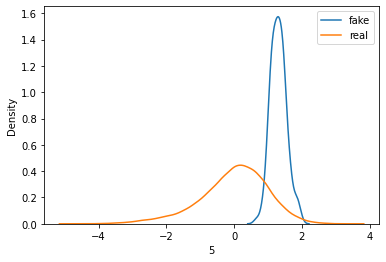

>Saved: drive/My Drive/GANs/synthetic/20201028-201204_g_model_02010.h5, and drive/My Drive/GANs/synthetic/20201028-201204_c_model_02010.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-201250_g_model_02412.h5, and drive/My Drive/GANs/synthetic/20201028-201250_c_model_02412.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-201336_g_model_02814.h5, and drive/My Drive/GANs/synthetic/20201028-201336_c_model_02814.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-201423_g_model_03216.h5, and drive/My Drive/GANs/synthetic/20201028-201423_c_model_03216.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-201508_g_model_03618.h5, and drive/My Drive/GANs/synthetic/20201028-201508_c_model_03618.h5


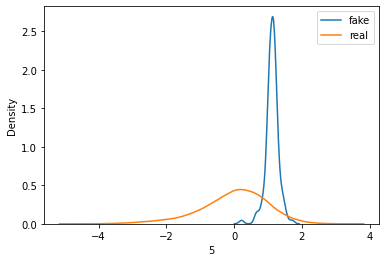

>Saved: drive/My Drive/GANs/synthetic/20201028-201556_g_model_04020.h5, and drive/My Drive/GANs/synthetic/20201028-201556_c_model_04020.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-201644_g_model_04422.h5, and drive/My Drive/GANs/synthetic/20201028-201644_c_model_04422.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-201735_g_model_04824.h5, and drive/My Drive/GANs/synthetic/20201028-201735_c_model_04824.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-201826_g_model_05226.h5, and drive/My Drive/GANs/synthetic/20201028-201826_c_model_05226.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-201917_g_model_05628.h5, and drive/My Drive/GANs/synthetic/20201028-201917_c_model_05628.h5


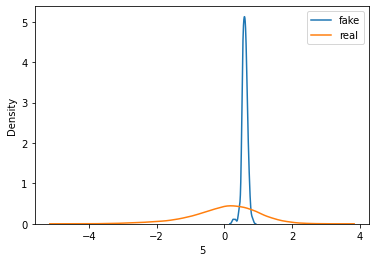

>Saved: drive/My Drive/GANs/synthetic/20201028-202002_g_model_06030.h5, and drive/My Drive/GANs/synthetic/20201028-202002_c_model_06030.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-202050_g_model_06432.h5, and drive/My Drive/GANs/synthetic/20201028-202050_c_model_06432.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-202137_g_model_06834.h5, and drive/My Drive/GANs/synthetic/20201028-202137_c_model_06834.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-202224_g_model_07236.h5, and drive/My Drive/GANs/synthetic/20201028-202224_c_model_07236.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-202310_g_model_07638.h5, and drive/My Drive/GANs/synthetic/20201028-202310_c_model_07638.h5


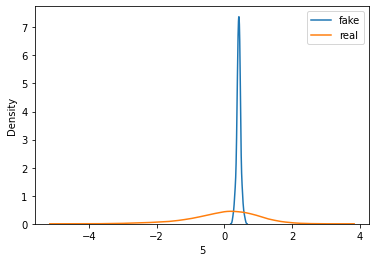

>Saved: drive/My Drive/GANs/synthetic/20201028-202356_g_model_08040.h5, and drive/My Drive/GANs/synthetic/20201028-202356_c_model_08040.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-202443_g_model_08442.h5, and drive/My Drive/GANs/synthetic/20201028-202443_c_model_08442.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-202534_g_model_08844.h5, and drive/My Drive/GANs/synthetic/20201028-202534_c_model_08844.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-202623_g_model_09246.h5, and drive/My Drive/GANs/synthetic/20201028-202623_c_model_09246.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-202713_g_model_09648.h5, and drive/My Drive/GANs/synthetic/20201028-202713_c_model_09648.h5


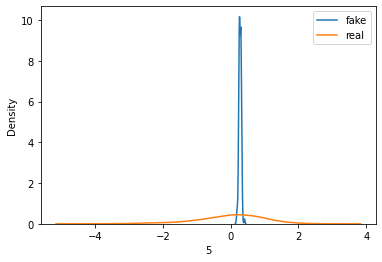

>Saved: drive/My Drive/GANs/synthetic/20201028-202802_g_model_10050.h5, and drive/My Drive/GANs/synthetic/20201028-202802_c_model_10050.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-202851_g_model_10452.h5, and drive/My Drive/GANs/synthetic/20201028-202851_c_model_10452.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-202940_g_model_10854.h5, and drive/My Drive/GANs/synthetic/20201028-202940_c_model_10854.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-203030_g_model_11256.h5, and drive/My Drive/GANs/synthetic/20201028-203030_c_model_11256.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-203120_g_model_11658.h5, and drive/My Drive/GANs/synthetic/20201028-203120_c_model_11658.h5


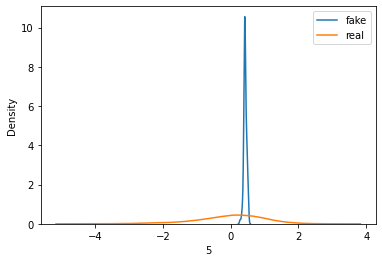

>Saved: drive/My Drive/GANs/synthetic/20201028-203207_g_model_12060.h5, and drive/My Drive/GANs/synthetic/20201028-203207_c_model_12060.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-203254_g_model_12462.h5, and drive/My Drive/GANs/synthetic/20201028-203254_c_model_12462.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-203341_g_model_12864.h5, and drive/My Drive/GANs/synthetic/20201028-203341_c_model_12864.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-203426_g_model_13266.h5, and drive/My Drive/GANs/synthetic/20201028-203426_c_model_13266.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-203513_g_model_13668.h5, and drive/My Drive/GANs/synthetic/20201028-203513_c_model_13668.h5


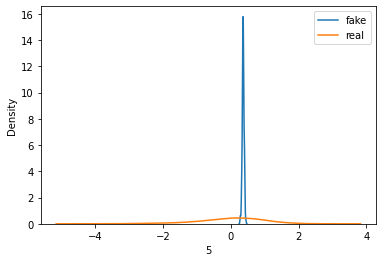

>Saved: drive/My Drive/GANs/synthetic/20201028-203559_g_model_14070.h5, and drive/My Drive/GANs/synthetic/20201028-203559_c_model_14070.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-203649_g_model_14472.h5, and drive/My Drive/GANs/synthetic/20201028-203649_c_model_14472.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-203741_g_model_14874.h5, and drive/My Drive/GANs/synthetic/20201028-203741_c_model_14874.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-203830_g_model_15276.h5, and drive/My Drive/GANs/synthetic/20201028-203830_c_model_15276.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-203917_g_model_15678.h5, and drive/My Drive/GANs/synthetic/20201028-203917_c_model_15678.h5


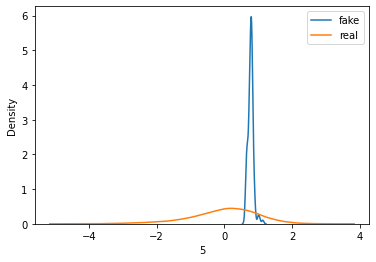

>Saved: drive/My Drive/GANs/synthetic/20201028-204004_g_model_16080.h5, and drive/My Drive/GANs/synthetic/20201028-204004_c_model_16080.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-204052_g_model_16482.h5, and drive/My Drive/GANs/synthetic/20201028-204052_c_model_16482.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-204138_g_model_16884.h5, and drive/My Drive/GANs/synthetic/20201028-204138_c_model_16884.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-204224_g_model_17286.h5, and drive/My Drive/GANs/synthetic/20201028-204224_c_model_17286.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-204311_g_model_17688.h5, and drive/My Drive/GANs/synthetic/20201028-204311_c_model_17688.h5


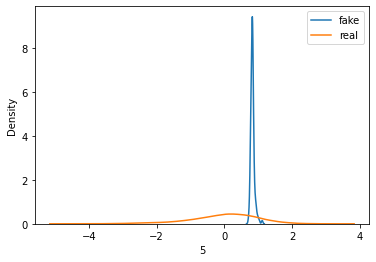

>Saved: drive/My Drive/GANs/synthetic/20201028-204357_g_model_18090.h5, and drive/My Drive/GANs/synthetic/20201028-204357_c_model_18090.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-204448_g_model_18492.h5, and drive/My Drive/GANs/synthetic/20201028-204448_c_model_18492.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-204536_g_model_18894.h5, and drive/My Drive/GANs/synthetic/20201028-204536_c_model_18894.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-204624_g_model_19296.h5, and drive/My Drive/GANs/synthetic/20201028-204624_c_model_19296.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-204710_g_model_19698.h5, and drive/My Drive/GANs/synthetic/20201028-204710_c_model_19698.h5


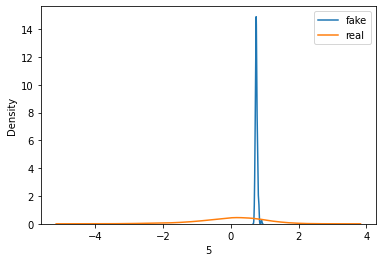

>Saved: drive/My Drive/GANs/synthetic/20201028-204756_g_model_20100.h5, and drive/My Drive/GANs/synthetic/20201028-204756_c_model_20100.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-204844_g_model_20502.h5, and drive/My Drive/GANs/synthetic/20201028-204844_c_model_20502.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-204929_g_model_20904.h5, and drive/My Drive/GANs/synthetic/20201028-204929_c_model_20904.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-205016_g_model_21306.h5, and drive/My Drive/GANs/synthetic/20201028-205016_c_model_21306.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-205107_g_model_21708.h5, and drive/My Drive/GANs/synthetic/20201028-205107_c_model_21708.h5


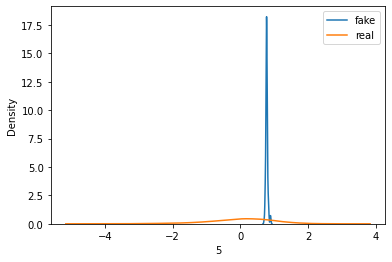

>Saved: drive/My Drive/GANs/synthetic/20201028-205159_g_model_22110.h5, and drive/My Drive/GANs/synthetic/20201028-205159_c_model_22110.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-205247_g_model_22512.h5, and drive/My Drive/GANs/synthetic/20201028-205247_c_model_22512.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-205334_g_model_22914.h5, and drive/My Drive/GANs/synthetic/20201028-205334_c_model_22914.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-205420_g_model_23316.h5, and drive/My Drive/GANs/synthetic/20201028-205420_c_model_23316.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-205506_g_model_23718.h5, and drive/My Drive/GANs/synthetic/20201028-205506_c_model_23718.h5


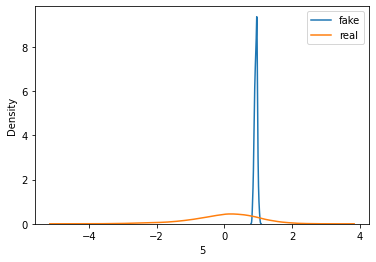

>Saved: drive/My Drive/GANs/synthetic/20201028-205553_g_model_24120.h5, and drive/My Drive/GANs/synthetic/20201028-205553_c_model_24120.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-205641_g_model_24522.h5, and drive/My Drive/GANs/synthetic/20201028-205641_c_model_24522.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-205726_g_model_24924.h5, and drive/My Drive/GANs/synthetic/20201028-205726_c_model_24924.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-205813_g_model_25326.h5, and drive/My Drive/GANs/synthetic/20201028-205813_c_model_25326.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-205859_g_model_25728.h5, and drive/My Drive/GANs/synthetic/20201028-205859_c_model_25728.h5


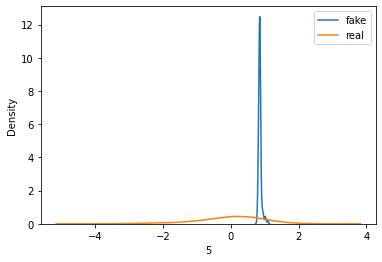

>Saved: drive/My Drive/GANs/synthetic/20201028-205945_g_model_26130.h5, and drive/My Drive/GANs/synthetic/20201028-205945_c_model_26130.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-210034_g_model_26532.h5, and drive/My Drive/GANs/synthetic/20201028-210034_c_model_26532.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-210120_g_model_26934.h5, and drive/My Drive/GANs/synthetic/20201028-210120_c_model_26934.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-210204_g_model_27336.h5, and drive/My Drive/GANs/synthetic/20201028-210204_c_model_27336.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-210249_g_model_27738.h5, and drive/My Drive/GANs/synthetic/20201028-210249_c_model_27738.h5


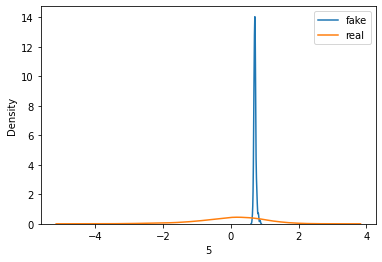

>Saved: drive/My Drive/GANs/synthetic/20201028-210335_g_model_28140.h5, and drive/My Drive/GANs/synthetic/20201028-210335_c_model_28140.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-210422_g_model_28542.h5, and drive/My Drive/GANs/synthetic/20201028-210422_c_model_28542.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-210510_g_model_28944.h5, and drive/My Drive/GANs/synthetic/20201028-210510_c_model_28944.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-210559_g_model_29346.h5, and drive/My Drive/GANs/synthetic/20201028-210559_c_model_29346.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-210648_g_model_29748.h5, and drive/My Drive/GANs/synthetic/20201028-210648_c_model_29748.h5


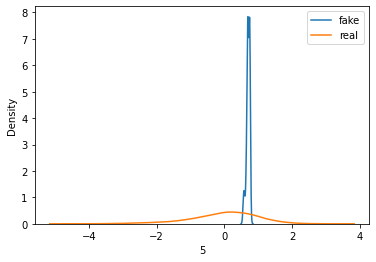

>Saved: drive/My Drive/GANs/synthetic/20201028-210737_g_model_30150.h5, and drive/My Drive/GANs/synthetic/20201028-210737_c_model_30150.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-210822_g_model_30552.h5, and drive/My Drive/GANs/synthetic/20201028-210822_c_model_30552.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-210907_g_model_30954.h5, and drive/My Drive/GANs/synthetic/20201028-210907_c_model_30954.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-210953_g_model_31356.h5, and drive/My Drive/GANs/synthetic/20201028-210953_c_model_31356.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-211040_g_model_31758.h5, and drive/My Drive/GANs/synthetic/20201028-211040_c_model_31758.h5


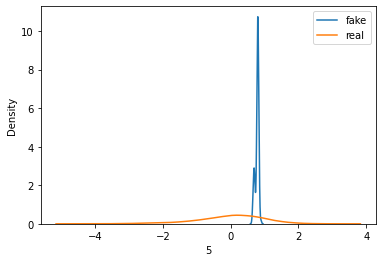

>Saved: drive/My Drive/GANs/synthetic/20201028-211128_g_model_32160.h5, and drive/My Drive/GANs/synthetic/20201028-211128_c_model_32160.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-211217_g_model_32562.h5, and drive/My Drive/GANs/synthetic/20201028-211217_c_model_32562.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-211309_g_model_32964.h5, and drive/My Drive/GANs/synthetic/20201028-211309_c_model_32964.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-211400_g_model_33366.h5, and drive/My Drive/GANs/synthetic/20201028-211400_c_model_33366.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-211451_g_model_33768.h5, and drive/My Drive/GANs/synthetic/20201028-211451_c_model_33768.h5


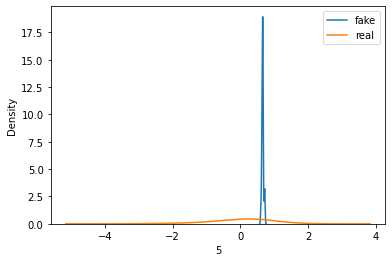

>Saved: drive/My Drive/GANs/synthetic/20201028-211540_g_model_34170.h5, and drive/My Drive/GANs/synthetic/20201028-211540_c_model_34170.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-211630_g_model_34572.h5, and drive/My Drive/GANs/synthetic/20201028-211630_c_model_34572.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-211718_g_model_34974.h5, and drive/My Drive/GANs/synthetic/20201028-211718_c_model_34974.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-211808_g_model_35376.h5, and drive/My Drive/GANs/synthetic/20201028-211808_c_model_35376.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-211857_g_model_35778.h5, and drive/My Drive/GANs/synthetic/20201028-211857_c_model_35778.h5
Buffered data was truncated after reaching the output size limit.

In [ ]:
c_loss, g_loss, d_loss1, d_loss2 = gan_cond.train(X_all, y_all, best_feat_idx, n_epochs=epochs, n_batch=batch_size, n_samples=X_a.shape[0], verbose = True, plot_every=5)

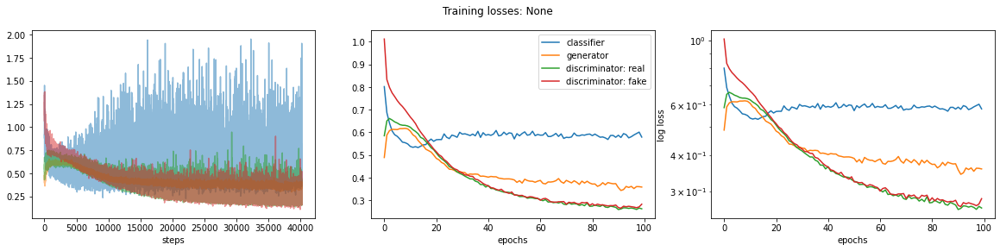

In [ ]:
losses_steps = pd.DataFrame({
    'clf': pd.DataFrame(c_loss)[0], 
    'gen': g_loss,
    'dis_real': d_loss1,
    'dis_fake': d_loss2
    })

bat_per_epo = int(data.shape[0] / batch_size) #number of batches per training epoch
n_steps = bat_per_epo * epochs #number of training iterations

plot_losses(losses_steps, bat_per_epo)

Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 12)]              0         
_________________________________________________________________
dense_10 (Dense)             (None, 100)               1300      
_________________________________________________________________
batch_normalization_8 (Batch (None, 100)               400       
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 100)               0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 100)               0         
_________________________________________________________________
dense_11 (Dense)             (None, 100)               10100     
_________________________________________________________________
batch_normalization_9 (Batch (None, 100)             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


>Saved: drive/My Drive/GANs/synthetic/20201028-215528_g_model_00402.h5, and drive/My Drive/GANs/synthetic/20201028-215528_c_model_00402.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-215613_g_model_00804.h5, and drive/My Drive/GANs/synthetic/20201028-215613_c_model_00804.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-215659_g_model_01206.h5, and drive/My Drive/GANs/synthetic/20201028-215659_c_model_01206.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-215746_g_model_01608.h5, and drive/My Drive/GANs/synthetic/20201028-215746_c_model_01608.h5


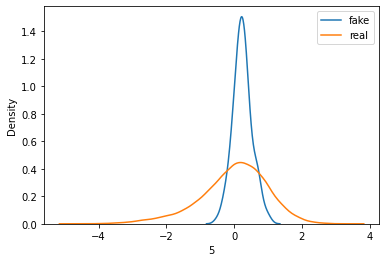

>Saved: drive/My Drive/GANs/synthetic/20201028-215827_g_model_02010.h5, and drive/My Drive/GANs/synthetic/20201028-215827_c_model_02010.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-215910_g_model_02412.h5, and drive/My Drive/GANs/synthetic/20201028-215910_c_model_02412.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-215952_g_model_02814.h5, and drive/My Drive/GANs/synthetic/20201028-215952_c_model_02814.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-220034_g_model_03216.h5, and drive/My Drive/GANs/synthetic/20201028-220034_c_model_03216.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-220119_g_model_03618.h5, and drive/My Drive/GANs/synthetic/20201028-220119_c_model_03618.h5


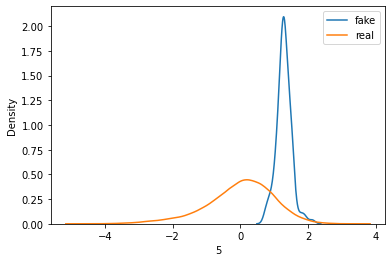

>Saved: drive/My Drive/GANs/synthetic/20201028-220200_g_model_04020.h5, and drive/My Drive/GANs/synthetic/20201028-220200_c_model_04020.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-220243_g_model_04422.h5, and drive/My Drive/GANs/synthetic/20201028-220243_c_model_04422.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-220326_g_model_04824.h5, and drive/My Drive/GANs/synthetic/20201028-220326_c_model_04824.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-220411_g_model_05226.h5, and drive/My Drive/GANs/synthetic/20201028-220411_c_model_05226.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-220455_g_model_05628.h5, and drive/My Drive/GANs/synthetic/20201028-220455_c_model_05628.h5


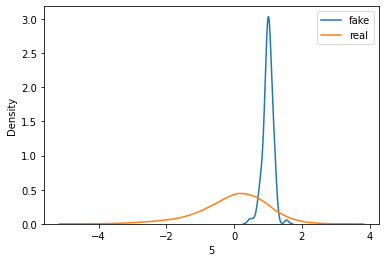

>Saved: drive/My Drive/GANs/synthetic/20201028-220539_g_model_06030.h5, and drive/My Drive/GANs/synthetic/20201028-220539_c_model_06030.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-220621_g_model_06432.h5, and drive/My Drive/GANs/synthetic/20201028-220621_c_model_06432.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-220707_g_model_06834.h5, and drive/My Drive/GANs/synthetic/20201028-220707_c_model_06834.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-220751_g_model_07236.h5, and drive/My Drive/GANs/synthetic/20201028-220751_c_model_07236.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-220834_g_model_07638.h5, and drive/My Drive/GANs/synthetic/20201028-220834_c_model_07638.h5


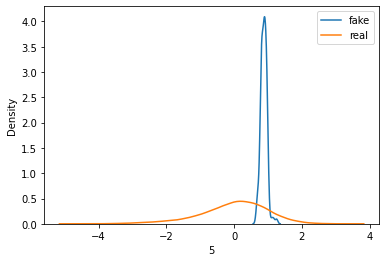

>Saved: drive/My Drive/GANs/synthetic/20201028-220916_g_model_08040.h5, and drive/My Drive/GANs/synthetic/20201028-220916_c_model_08040.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-220959_g_model_08442.h5, and drive/My Drive/GANs/synthetic/20201028-220959_c_model_08442.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-221041_g_model_08844.h5, and drive/My Drive/GANs/synthetic/20201028-221041_c_model_08844.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-221128_g_model_09246.h5, and drive/My Drive/GANs/synthetic/20201028-221128_c_model_09246.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-221214_g_model_09648.h5, and drive/My Drive/GANs/synthetic/20201028-221214_c_model_09648.h5


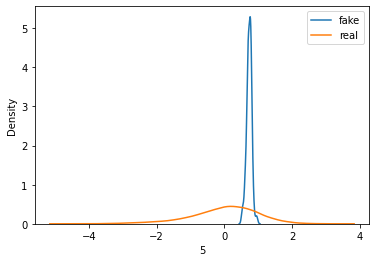

>Saved: drive/My Drive/GANs/synthetic/20201028-221303_g_model_10050.h5, and drive/My Drive/GANs/synthetic/20201028-221303_c_model_10050.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-221348_g_model_10452.h5, and drive/My Drive/GANs/synthetic/20201028-221348_c_model_10452.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-221431_g_model_10854.h5, and drive/My Drive/GANs/synthetic/20201028-221431_c_model_10854.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-221515_g_model_11256.h5, and drive/My Drive/GANs/synthetic/20201028-221515_c_model_11256.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-221559_g_model_11658.h5, and drive/My Drive/GANs/synthetic/20201028-221559_c_model_11658.h5


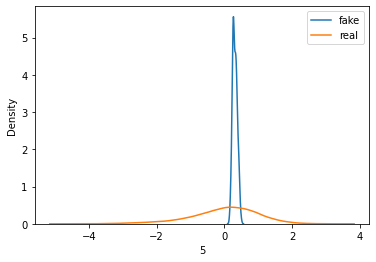

>Saved: drive/My Drive/GANs/synthetic/20201028-221646_g_model_12060.h5, and drive/My Drive/GANs/synthetic/20201028-221646_c_model_12060.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-221728_g_model_12462.h5, and drive/My Drive/GANs/synthetic/20201028-221728_c_model_12462.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-221810_g_model_12864.h5, and drive/My Drive/GANs/synthetic/20201028-221810_c_model_12864.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-221853_g_model_13266.h5, and drive/My Drive/GANs/synthetic/20201028-221853_c_model_13266.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-221933_g_model_13668.h5, and drive/My Drive/GANs/synthetic/20201028-221933_c_model_13668.h5


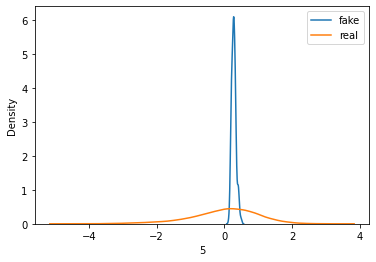

>Saved: drive/My Drive/GANs/synthetic/20201028-222015_g_model_14070.h5, and drive/My Drive/GANs/synthetic/20201028-222015_c_model_14070.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-222058_g_model_14472.h5, and drive/My Drive/GANs/synthetic/20201028-222058_c_model_14472.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-222141_g_model_14874.h5, and drive/My Drive/GANs/synthetic/20201028-222141_c_model_14874.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-222225_g_model_15276.h5, and drive/My Drive/GANs/synthetic/20201028-222225_c_model_15276.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-222309_g_model_15678.h5, and drive/My Drive/GANs/synthetic/20201028-222309_c_model_15678.h5


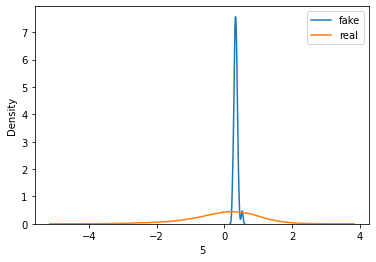

>Saved: drive/My Drive/GANs/synthetic/20201028-222354_g_model_16080.h5, and drive/My Drive/GANs/synthetic/20201028-222354_c_model_16080.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-222440_g_model_16482.h5, and drive/My Drive/GANs/synthetic/20201028-222440_c_model_16482.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-222526_g_model_16884.h5, and drive/My Drive/GANs/synthetic/20201028-222526_c_model_16884.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-222611_g_model_17286.h5, and drive/My Drive/GANs/synthetic/20201028-222611_c_model_17286.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-222655_g_model_17688.h5, and drive/My Drive/GANs/synthetic/20201028-222655_c_model_17688.h5


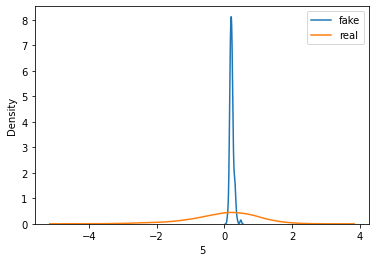

>Saved: drive/My Drive/GANs/synthetic/20201028-222741_g_model_18090.h5, and drive/My Drive/GANs/synthetic/20201028-222741_c_model_18090.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-222824_g_model_18492.h5, and drive/My Drive/GANs/synthetic/20201028-222824_c_model_18492.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-222907_g_model_18894.h5, and drive/My Drive/GANs/synthetic/20201028-222907_c_model_18894.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-222950_g_model_19296.h5, and drive/My Drive/GANs/synthetic/20201028-222950_c_model_19296.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-223034_g_model_19698.h5, and drive/My Drive/GANs/synthetic/20201028-223034_c_model_19698.h5


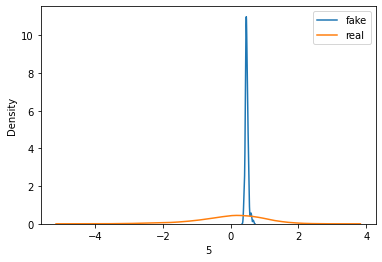

>Saved: drive/My Drive/GANs/synthetic/20201028-223119_g_model_20100.h5, and drive/My Drive/GANs/synthetic/20201028-223119_c_model_20100.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-223205_g_model_20502.h5, and drive/My Drive/GANs/synthetic/20201028-223205_c_model_20502.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-223249_g_model_20904.h5, and drive/My Drive/GANs/synthetic/20201028-223249_c_model_20904.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-223336_g_model_21306.h5, and drive/My Drive/GANs/synthetic/20201028-223336_c_model_21306.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-223421_g_model_21708.h5, and drive/My Drive/GANs/synthetic/20201028-223421_c_model_21708.h5


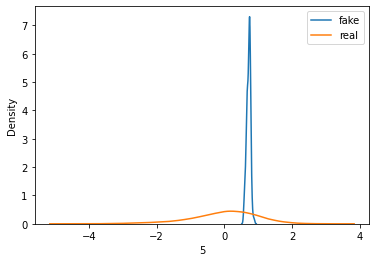

>Saved: drive/My Drive/GANs/synthetic/20201028-223505_g_model_22110.h5, and drive/My Drive/GANs/synthetic/20201028-223505_c_model_22110.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-223551_g_model_22512.h5, and drive/My Drive/GANs/synthetic/20201028-223551_c_model_22512.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-223637_g_model_22914.h5, and drive/My Drive/GANs/synthetic/20201028-223637_c_model_22914.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-223721_g_model_23316.h5, and drive/My Drive/GANs/synthetic/20201028-223721_c_model_23316.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-223804_g_model_23718.h5, and drive/My Drive/GANs/synthetic/20201028-223804_c_model_23718.h5


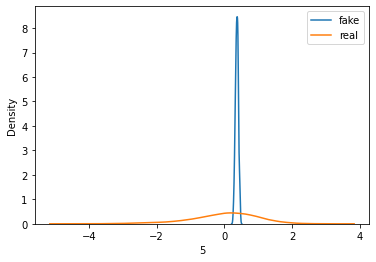

>Saved: drive/My Drive/GANs/synthetic/20201028-223846_g_model_24120.h5, and drive/My Drive/GANs/synthetic/20201028-223846_c_model_24120.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-223931_g_model_24522.h5, and drive/My Drive/GANs/synthetic/20201028-223931_c_model_24522.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-224017_g_model_24924.h5, and drive/My Drive/GANs/synthetic/20201028-224017_c_model_24924.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-224104_g_model_25326.h5, and drive/My Drive/GANs/synthetic/20201028-224104_c_model_25326.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-224151_g_model_25728.h5, and drive/My Drive/GANs/synthetic/20201028-224151_c_model_25728.h5


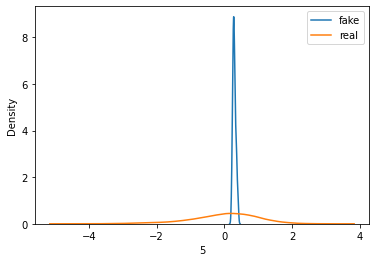

>Saved: drive/My Drive/GANs/synthetic/20201028-224234_g_model_26130.h5, and drive/My Drive/GANs/synthetic/20201028-224234_c_model_26130.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-224316_g_model_26532.h5, and drive/My Drive/GANs/synthetic/20201028-224316_c_model_26532.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-224359_g_model_26934.h5, and drive/My Drive/GANs/synthetic/20201028-224359_c_model_26934.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-224444_g_model_27336.h5, and drive/My Drive/GANs/synthetic/20201028-224444_c_model_27336.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-224529_g_model_27738.h5, and drive/My Drive/GANs/synthetic/20201028-224529_c_model_27738.h5


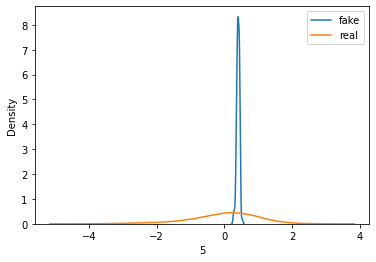

>Saved: drive/My Drive/GANs/synthetic/20201028-224618_g_model_28140.h5, and drive/My Drive/GANs/synthetic/20201028-224618_c_model_28140.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-224707_g_model_28542.h5, and drive/My Drive/GANs/synthetic/20201028-224707_c_model_28542.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-224751_g_model_28944.h5, and drive/My Drive/GANs/synthetic/20201028-224751_c_model_28944.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-224836_g_model_29346.h5, and drive/My Drive/GANs/synthetic/20201028-224836_c_model_29346.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-224922_g_model_29748.h5, and drive/My Drive/GANs/synthetic/20201028-224922_c_model_29748.h5


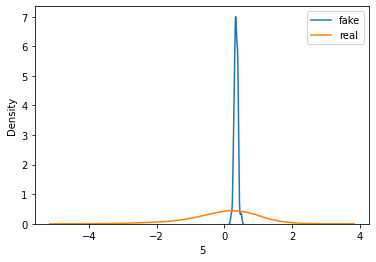

>Saved: drive/My Drive/GANs/synthetic/20201028-225009_g_model_30150.h5, and drive/My Drive/GANs/synthetic/20201028-225009_c_model_30150.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-225054_g_model_30552.h5, and drive/My Drive/GANs/synthetic/20201028-225054_c_model_30552.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-225137_g_model_30954.h5, and drive/My Drive/GANs/synthetic/20201028-225137_c_model_30954.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-225221_g_model_31356.h5, and drive/My Drive/GANs/synthetic/20201028-225221_c_model_31356.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-225304_g_model_31758.h5, and drive/My Drive/GANs/synthetic/20201028-225304_c_model_31758.h5


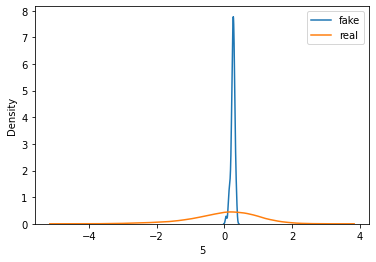

>Saved: drive/My Drive/GANs/synthetic/20201028-225348_g_model_32160.h5, and drive/My Drive/GANs/synthetic/20201028-225348_c_model_32160.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-225432_g_model_32562.h5, and drive/My Drive/GANs/synthetic/20201028-225432_c_model_32562.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-225516_g_model_32964.h5, and drive/My Drive/GANs/synthetic/20201028-225516_c_model_32964.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-225602_g_model_33366.h5, and drive/My Drive/GANs/synthetic/20201028-225602_c_model_33366.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-225649_g_model_33768.h5, and drive/My Drive/GANs/synthetic/20201028-225649_c_model_33768.h5


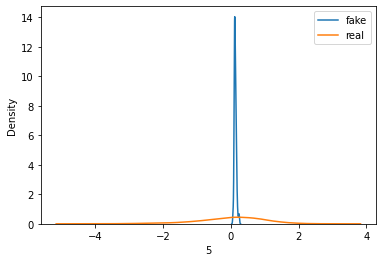

>Saved: drive/My Drive/GANs/synthetic/20201028-225734_g_model_34170.h5, and drive/My Drive/GANs/synthetic/20201028-225734_c_model_34170.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-225824_g_model_34572.h5, and drive/My Drive/GANs/synthetic/20201028-225824_c_model_34572.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-225909_g_model_34974.h5, and drive/My Drive/GANs/synthetic/20201028-225909_c_model_34974.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-225954_g_model_35376.h5, and drive/My Drive/GANs/synthetic/20201028-225954_c_model_35376.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-230039_g_model_35778.h5, and drive/My Drive/GANs/synthetic/20201028-230039_c_model_35778.h5


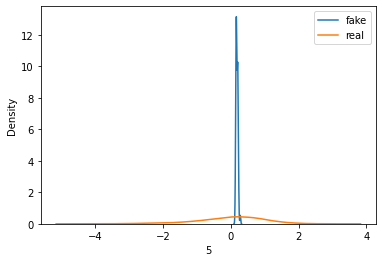

>Saved: drive/My Drive/GANs/synthetic/20201028-230126_g_model_36180.h5, and drive/My Drive/GANs/synthetic/20201028-230126_c_model_36180.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-230210_g_model_36582.h5, and drive/My Drive/GANs/synthetic/20201028-230210_c_model_36582.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-230255_g_model_36984.h5, and drive/My Drive/GANs/synthetic/20201028-230255_c_model_36984.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-230338_g_model_37386.h5, and drive/My Drive/GANs/synthetic/20201028-230338_c_model_37386.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-230423_g_model_37788.h5, and drive/My Drive/GANs/synthetic/20201028-230423_c_model_37788.h5


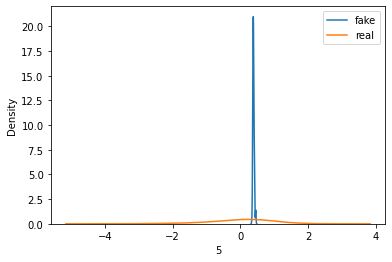

>Saved: drive/My Drive/GANs/synthetic/20201028-230507_g_model_38190.h5, and drive/My Drive/GANs/synthetic/20201028-230507_c_model_38190.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-230553_g_model_38592.h5, and drive/My Drive/GANs/synthetic/20201028-230553_c_model_38592.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-230639_g_model_38994.h5, and drive/My Drive/GANs/synthetic/20201028-230639_c_model_38994.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-230724_g_model_39396.h5, and drive/My Drive/GANs/synthetic/20201028-230724_c_model_39396.h5
>Saved: drive/My Drive/GANs/synthetic/20201028-230812_g_model_39798.h5, and drive/My Drive/GANs/synthetic/20201028-230812_c_model_39798.h5


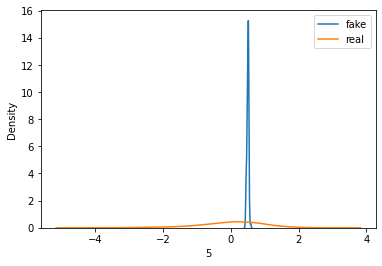

>Saved: drive/My Drive/GANs/synthetic/20201028-230858_g_model_40200.h5, and drive/My Drive/GANs/synthetic/20201028-230858_c_model_40200.h5



In [ ]:
gan_uncond = SGAN(data_dim, conditional=False, n_classes=n_classes, noise_dim=noise_dim, learning_rate=learning_rate, dropout=dropout)
c_loss_uncond, g_loss_uncond, d_loss1_uncond, d_loss2_uncond = gan_uncond.train(X_all, y_all, best_feat_idx, n_epochs=epochs, n_batch=batch_size, n_samples=X_a.shape[0], verbose = True, plot_every=10)

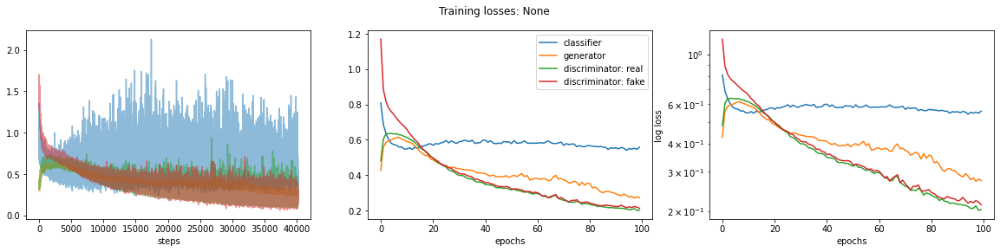

In [ ]:
losses_steps_uncond = pd.DataFrame({
    'clf': pd.DataFrame(c_loss_uncond)[0], 
    'gen': g_loss_uncond,
    'dis_real': d_loss1_uncond,
    'dis_fake': d_loss2_uncond
    })

plot_losses(losses_steps_uncond, bat_per_epo)

In [ ]:
scores_cond_LR, fake_data_cond = evaluate_methods(clf="LR", c_model = gan_cond.c_model, g_model = gan_cond.g_model,
                                                  conditional=True, 
                                                  df=df, test=S, target_col=target_col, reject_col=reject_col,
                                                  noise_dim=noise_dim, alpha=alpha, threshold=threshold)

60th percentile of preds: 0.951
60th percentile of preds: 0.813


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.97
             feat_1        feat_2  ...   gender_Male        TARGET
count  51500.000000  51500.000000  ...  51500.000000  51500.000000
mean      -0.647928     -0.942345  ...      0.851546      0.500990
std        0.024517      0.043448  ...      0.042254      0.500004
min       -0.919016     -1.199083  ...      0.672590      0.000000
25%       -0.666839     -0.970542  ...      0.829962      0.000000
50%       -0.650716     -0.946887  ...      0.854322      1.000000
75%       -0.631566     -0.915181  ...      0.875411      1.000000
max       -0.495608     -0.731312  ...      1.164423      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.938
60th percentile of preds: 0.966
60th percentile of preds: 0.957


In [ ]:
scores_cond_RF, fake_data_cond = evaluate_methods(clf="RF", c_model = gan_cond.c_model, g_model = gan_cond.g_model,
                                                  conditional=True, 
                                                  df=df, test=S, target_col=target_col, reject_col=reject_col,
                                                  noise_dim=noise_dim, alpha=alpha, threshold=threshold)

60th percentile of preds: 0.933
60th percentile of preds: 0.813
60th percentile of preds: 0.983
             feat_1        feat_2  ...   gender_Male        TARGET
count  51500.000000  51500.000000  ...  51500.000000  51500.000000
mean      -0.648015     -0.942355  ...      0.851532      0.500447
std        0.024645      0.043311  ...      0.042183      0.500005
min       -0.884167     -1.169803  ...      0.685234      0.000000
25%       -0.666998     -0.970555  ...      0.830042      0.000000
50%       -0.650766     -0.946935  ...      0.854251      1.000000
75%       -0.631472     -0.915554  ...      0.875561      1.000000
max       -0.520042     -0.747163  ...      1.151777      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.93
60th percentile of preds: 0.98
60th percentile of preds: 0.967


In [ ]:
scores_uncond_LR, fake_data_uncond = evaluate_methods(clf="LR", c_model = gan_uncond.c_model, g_model = gan_uncond.g_model,
                                                      conditional=False, 
                                                      df=df, test=S, target_col=target_col, reject_col=reject_col,
                                                      noise_dim=noise_dim, alpha=alpha, threshold=threshold)

60th percentile of preds: 0.951
60th percentile of preds: 0.791
60th percentile of preds: 0.989
             feat_1        feat_2  ...   gender_Male   TARGET
count  51500.000000  51500.000000  ...  51500.000000  51500.0
mean      -0.442393     -1.399847  ...     -0.028203      0.0
std        0.033428      0.046091  ...      0.050267      0.0
min       -0.646216     -1.865465  ...     -0.303699      0.0
25%       -0.465394     -1.435764  ...     -0.062272      0.0
50%       -0.440885     -1.404176  ...     -0.037325      0.0
75%       -0.422831     -1.373070  ...     -0.004136      0.0
max       -0.249354     -1.060183  ...      0.374232      0.0

[8 rows x 13 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.953


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.99
60th percentile of preds: 0.957


In [ ]:
scores_uncond_RF, fake_data_uncond = evaluate_methods(clf="RF", c_model = gan_uncond.c_model, g_model = gan_uncond.g_model,
                                                      conditional=False, 
                                                      df=df, test=S, target_col=target_col, reject_col=reject_col,
                                                      noise_dim=noise_dim, alpha=alpha, threshold=threshold)

60th percentile of preds: 0.933
60th percentile of preds: 0.791
60th percentile of preds: 0.99
             feat_1        feat_2  ...   gender_Male   TARGET
count  51500.000000  51500.000000  ...  51500.000000  51500.0
mean      -0.442016     -1.399724  ...     -0.027866      0.0
std        0.033438      0.045907  ...      0.050781      0.0
min       -0.649587     -1.834378  ...     -0.308503      0.0
25%       -0.465023     -1.435336  ...     -0.062278      0.0
50%       -0.440616     -1.404049  ...     -0.037590      0.0
75%       -0.422464     -1.373296  ...     -0.003453      0.0
max       -0.156984     -1.093825  ...      0.378118      0.0

[8 rows x 13 columns]
60th percentile of preds: 0.937
60th percentile of preds: 0.99
60th percentile of preds: 0.967


In [ ]:
print(scores_cond_LR)
print(scores_cond_RF)

          benchmark  method_1  method_2  method_3  method_all    oracle
accuracy   0.822089  0.863568  0.847076  0.833583    0.848576  0.898551
AUC_ROC    0.848096  0.853223  0.855670  0.847728    0.853021  0.904313
AUC_PR     0.653739  0.685204  0.640937  0.648192    0.640007  0.783388
BS         0.124822  0.128163  0.113820  0.117240    0.113854  0.080175
ABR        0.051186  0.044944  0.031211  0.047441    0.032459  0.031211
RGR        0.685000  0.680833  0.671667  0.682500    0.672500  0.671667
          benchmark  method_1  method_2  method_3  method_all    oracle
accuracy   0.838581  0.863568  0.863068  0.829585    0.861569  0.936032
AUC_ROC    0.911219  0.853223  0.841737  0.912628    0.841813  0.939486
AUC_PR     0.776179  0.685204  0.708035  0.790987    0.700303  0.884815
BS         0.100270  0.128163  0.109697  0.100947    0.109334  0.051589
ABR        0.021792  0.044944  0.065920  0.023086    0.066106  0.022222
RGR        0.658723  0.680833  0.694236  0.660441    0.688623  0

In [ ]:
print(scores_uncond_LR)
print(scores_uncond_RF)

          benchmark  method_1  method_2  method_3  method_all    oracle
accuracy   0.822089  0.857071  0.843578  0.819590    0.843578  0.898551
AUC_ROC    0.848093  0.845392  0.800387  0.848100    0.800995  0.904311
AUC_PR     0.653733  0.675942  0.574038  0.654603    0.574635  0.783385
BS         0.124823  0.125091  0.132715  0.126741    0.132732  0.080175
ABR        0.051186  0.049938  0.057428  0.051186    0.057428  0.031211
RGR        0.685000  0.684167  0.689167  0.685000    0.689167  0.671667
          benchmark  method_1  method_2  method_3  method_all    oracle
accuracy   0.838581  0.857071  0.856572  0.831084    0.857071  0.936032
AUC_ROC    0.911219  0.845392  0.718106  0.913647    0.723622  0.939486
AUC_PR     0.776179  0.675942  0.606482  0.780644    0.613854  0.884815
BS         0.100270  0.125091  0.126323  0.098776    0.126668  0.051589
ABR        0.021792  0.049938  0.141291  0.023114    0.137637  0.022222
RGR        0.658723  0.684167  0.743220  0.660729    0.740678  0

#### Home Credit

In [14]:
gan_cond = SGAN(data_dim, conditional=True, n_classes=n_classes, noise_dim=noise_dim, learning_rate=learning_rate, dropout=dropout)

Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 91)]              0         
_________________________________________________________________
dense (Dense)                (None, 100)               9200      
_________________________________________________________________
batch_normalization (BatchNo (None, 100)               400       
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 100)               0         
_________________________________________________________________
dropout (Dropout)            (None, 100)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               10100     
_________________________________________________________________
batch_normalization_1 (Batch (None, 100)             

(19808, 91) (19808,)
n_epochs=100, n_batch=128, 1/2=64, b/e=386, steps=38600


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


>Saved: drive/My Drive/GANs/20201027-110809_g_model_00386.h5, and drive/My Drive/GANs/20201027-110809_c_model_00386.h5
>Saved: drive/My Drive/GANs/20201027-110844_g_model_00772.h5, and drive/My Drive/GANs/20201027-110844_c_model_00772.h5
>Saved: drive/My Drive/GANs/20201027-110918_g_model_01158.h5, and drive/My Drive/GANs/20201027-110918_c_model_01158.h5
>Saved: drive/My Drive/GANs/20201027-110953_g_model_01544.h5, and drive/My Drive/GANs/20201027-110953_c_model_01544.h5


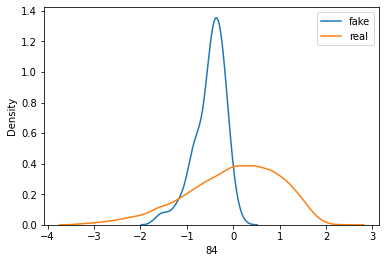

>Saved: drive/My Drive/GANs/20201027-111028_g_model_01930.h5, and drive/My Drive/GANs/20201027-111028_c_model_01930.h5
>Saved: drive/My Drive/GANs/20201027-111103_g_model_02316.h5, and drive/My Drive/GANs/20201027-111103_c_model_02316.h5
>Saved: drive/My Drive/GANs/20201027-111136_g_model_02702.h5, and drive/My Drive/GANs/20201027-111136_c_model_02702.h5
>Saved: drive/My Drive/GANs/20201027-111209_g_model_03088.h5, and drive/My Drive/GANs/20201027-111209_c_model_03088.h5
>Saved: drive/My Drive/GANs/20201027-111241_g_model_03474.h5, and drive/My Drive/GANs/20201027-111241_c_model_03474.h5


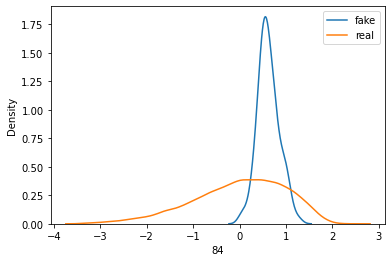

>Saved: drive/My Drive/GANs/20201027-111317_g_model_03860.h5, and drive/My Drive/GANs/20201027-111317_c_model_03860.h5
>Saved: drive/My Drive/GANs/20201027-111353_g_model_04246.h5, and drive/My Drive/GANs/20201027-111353_c_model_04246.h5
>Saved: drive/My Drive/GANs/20201027-111425_g_model_04632.h5, and drive/My Drive/GANs/20201027-111425_c_model_04632.h5
>Saved: drive/My Drive/GANs/20201027-111457_g_model_05018.h5, and drive/My Drive/GANs/20201027-111457_c_model_05018.h5
>Saved: drive/My Drive/GANs/20201027-111529_g_model_05404.h5, and drive/My Drive/GANs/20201027-111529_c_model_05404.h5


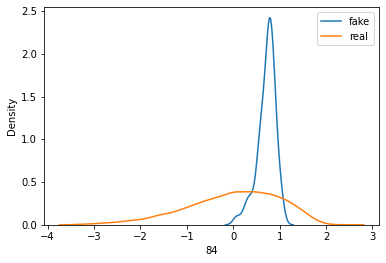

>Saved: drive/My Drive/GANs/20201027-111601_g_model_05790.h5, and drive/My Drive/GANs/20201027-111601_c_model_05790.h5
>Saved: drive/My Drive/GANs/20201027-111633_g_model_06176.h5, and drive/My Drive/GANs/20201027-111633_c_model_06176.h5
>Saved: drive/My Drive/GANs/20201027-111705_g_model_06562.h5, and drive/My Drive/GANs/20201027-111705_c_model_06562.h5
>Saved: drive/My Drive/GANs/20201027-111737_g_model_06948.h5, and drive/My Drive/GANs/20201027-111737_c_model_06948.h5
>Saved: drive/My Drive/GANs/20201027-111810_g_model_07334.h5, and drive/My Drive/GANs/20201027-111810_c_model_07334.h5


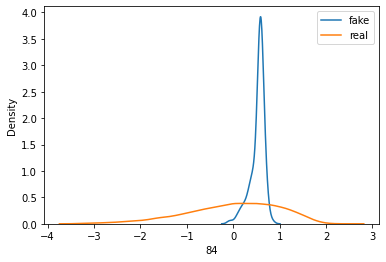

>Saved: drive/My Drive/GANs/20201027-111843_g_model_07720.h5, and drive/My Drive/GANs/20201027-111843_c_model_07720.h5
>Saved: drive/My Drive/GANs/20201027-111916_g_model_08106.h5, and drive/My Drive/GANs/20201027-111916_c_model_08106.h5
>Saved: drive/My Drive/GANs/20201027-111948_g_model_08492.h5, and drive/My Drive/GANs/20201027-111948_c_model_08492.h5
>Saved: drive/My Drive/GANs/20201027-112021_g_model_08878.h5, and drive/My Drive/GANs/20201027-112021_c_model_08878.h5
>Saved: drive/My Drive/GANs/20201027-112053_g_model_09264.h5, and drive/My Drive/GANs/20201027-112053_c_model_09264.h5


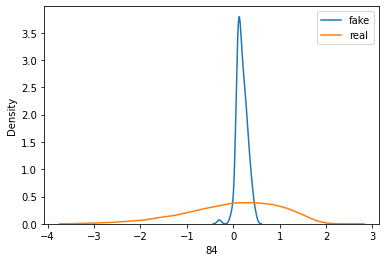

>Saved: drive/My Drive/GANs/20201027-112125_g_model_09650.h5, and drive/My Drive/GANs/20201027-112125_c_model_09650.h5
>Saved: drive/My Drive/GANs/20201027-112158_g_model_10036.h5, and drive/My Drive/GANs/20201027-112158_c_model_10036.h5
>Saved: drive/My Drive/GANs/20201027-112230_g_model_10422.h5, and drive/My Drive/GANs/20201027-112230_c_model_10422.h5
>Saved: drive/My Drive/GANs/20201027-112303_g_model_10808.h5, and drive/My Drive/GANs/20201027-112303_c_model_10808.h5
>Saved: drive/My Drive/GANs/20201027-112336_g_model_11194.h5, and drive/My Drive/GANs/20201027-112336_c_model_11194.h5


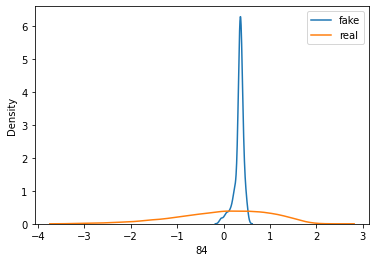

>Saved: drive/My Drive/GANs/20201027-112408_g_model_11580.h5, and drive/My Drive/GANs/20201027-112408_c_model_11580.h5
>Saved: drive/My Drive/GANs/20201027-112441_g_model_11966.h5, and drive/My Drive/GANs/20201027-112441_c_model_11966.h5
>Saved: drive/My Drive/GANs/20201027-112514_g_model_12352.h5, and drive/My Drive/GANs/20201027-112514_c_model_12352.h5
>Saved: drive/My Drive/GANs/20201027-112546_g_model_12738.h5, and drive/My Drive/GANs/20201027-112546_c_model_12738.h5
>Saved: drive/My Drive/GANs/20201027-112619_g_model_13124.h5, and drive/My Drive/GANs/20201027-112619_c_model_13124.h5


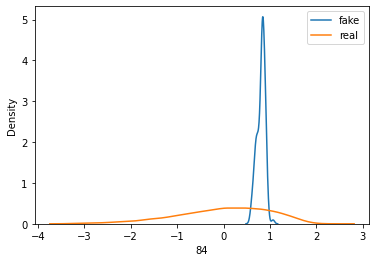

>Saved: drive/My Drive/GANs/20201027-112651_g_model_13510.h5, and drive/My Drive/GANs/20201027-112651_c_model_13510.h5
>Saved: drive/My Drive/GANs/20201027-112723_g_model_13896.h5, and drive/My Drive/GANs/20201027-112723_c_model_13896.h5
>Saved: drive/My Drive/GANs/20201027-112755_g_model_14282.h5, and drive/My Drive/GANs/20201027-112755_c_model_14282.h5
>Saved: drive/My Drive/GANs/20201027-112827_g_model_14668.h5, and drive/My Drive/GANs/20201027-112827_c_model_14668.h5
>Saved: drive/My Drive/GANs/20201027-112858_g_model_15054.h5, and drive/My Drive/GANs/20201027-112858_c_model_15054.h5


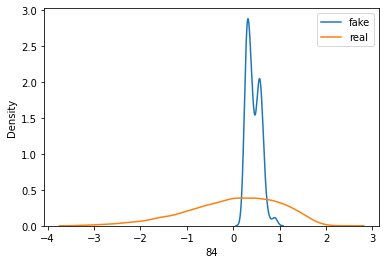

>Saved: drive/My Drive/GANs/20201027-112931_g_model_15440.h5, and drive/My Drive/GANs/20201027-112931_c_model_15440.h5
>Saved: drive/My Drive/GANs/20201027-113003_g_model_15826.h5, and drive/My Drive/GANs/20201027-113003_c_model_15826.h5
>Saved: drive/My Drive/GANs/20201027-113034_g_model_16212.h5, and drive/My Drive/GANs/20201027-113034_c_model_16212.h5
>Saved: drive/My Drive/GANs/20201027-113105_g_model_16598.h5, and drive/My Drive/GANs/20201027-113105_c_model_16598.h5
>Saved: drive/My Drive/GANs/20201027-113139_g_model_16984.h5, and drive/My Drive/GANs/20201027-113139_c_model_16984.h5


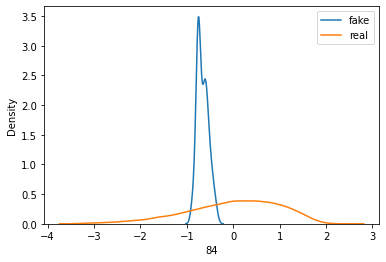

>Saved: drive/My Drive/GANs/20201027-113210_g_model_17370.h5, and drive/My Drive/GANs/20201027-113210_c_model_17370.h5
>Saved: drive/My Drive/GANs/20201027-113241_g_model_17756.h5, and drive/My Drive/GANs/20201027-113241_c_model_17756.h5
>Saved: drive/My Drive/GANs/20201027-113313_g_model_18142.h5, and drive/My Drive/GANs/20201027-113313_c_model_18142.h5
>Saved: drive/My Drive/GANs/20201027-113344_g_model_18528.h5, and drive/My Drive/GANs/20201027-113344_c_model_18528.h5
>Saved: drive/My Drive/GANs/20201027-113415_g_model_18914.h5, and drive/My Drive/GANs/20201027-113415_c_model_18914.h5


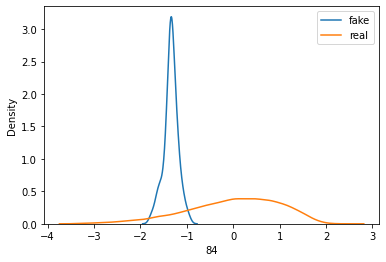

>Saved: drive/My Drive/GANs/20201027-113446_g_model_19300.h5, and drive/My Drive/GANs/20201027-113446_c_model_19300.h5
>Saved: drive/My Drive/GANs/20201027-113518_g_model_19686.h5, and drive/My Drive/GANs/20201027-113518_c_model_19686.h5
>Saved: drive/My Drive/GANs/20201027-113552_g_model_20072.h5, and drive/My Drive/GANs/20201027-113552_c_model_20072.h5
>Saved: drive/My Drive/GANs/20201027-113628_g_model_20458.h5, and drive/My Drive/GANs/20201027-113628_c_model_20458.h5
>Saved: drive/My Drive/GANs/20201027-113704_g_model_20844.h5, and drive/My Drive/GANs/20201027-113704_c_model_20844.h5


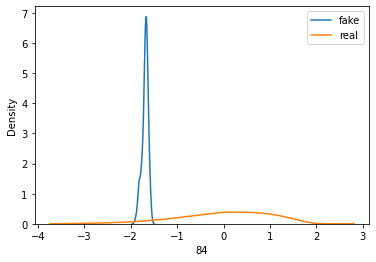

>Saved: drive/My Drive/GANs/20201027-113739_g_model_21230.h5, and drive/My Drive/GANs/20201027-113739_c_model_21230.h5
>Saved: drive/My Drive/GANs/20201027-113814_g_model_21616.h5, and drive/My Drive/GANs/20201027-113814_c_model_21616.h5
>Saved: drive/My Drive/GANs/20201027-113849_g_model_22002.h5, and drive/My Drive/GANs/20201027-113849_c_model_22002.h5
>Saved: drive/My Drive/GANs/20201027-113924_g_model_22388.h5, and drive/My Drive/GANs/20201027-113924_c_model_22388.h5
>Saved: drive/My Drive/GANs/20201027-113957_g_model_22774.h5, and drive/My Drive/GANs/20201027-113957_c_model_22774.h5


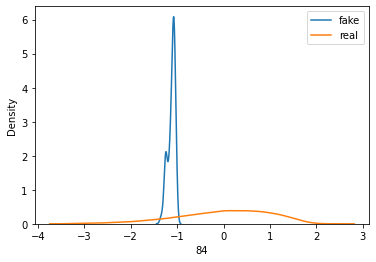

>Saved: drive/My Drive/GANs/20201027-114031_g_model_23160.h5, and drive/My Drive/GANs/20201027-114031_c_model_23160.h5
>Saved: drive/My Drive/GANs/20201027-114107_g_model_23546.h5, and drive/My Drive/GANs/20201027-114107_c_model_23546.h5
>Saved: drive/My Drive/GANs/20201027-114146_g_model_23932.h5, and drive/My Drive/GANs/20201027-114146_c_model_23932.h5
>Saved: drive/My Drive/GANs/20201027-114222_g_model_24318.h5, and drive/My Drive/GANs/20201027-114222_c_model_24318.h5
>Saved: drive/My Drive/GANs/20201027-114256_g_model_24704.h5, and drive/My Drive/GANs/20201027-114256_c_model_24704.h5


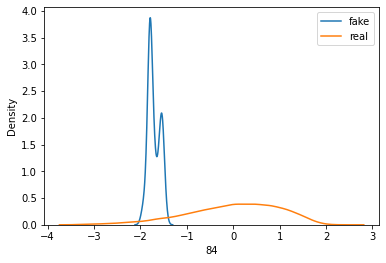

>Saved: drive/My Drive/GANs/20201027-114331_g_model_25090.h5, and drive/My Drive/GANs/20201027-114331_c_model_25090.h5
>Saved: drive/My Drive/GANs/20201027-114405_g_model_25476.h5, and drive/My Drive/GANs/20201027-114405_c_model_25476.h5
>Saved: drive/My Drive/GANs/20201027-114437_g_model_25862.h5, and drive/My Drive/GANs/20201027-114437_c_model_25862.h5
>Saved: drive/My Drive/GANs/20201027-114510_g_model_26248.h5, and drive/My Drive/GANs/20201027-114510_c_model_26248.h5
>Saved: drive/My Drive/GANs/20201027-114542_g_model_26634.h5, and drive/My Drive/GANs/20201027-114542_c_model_26634.h5


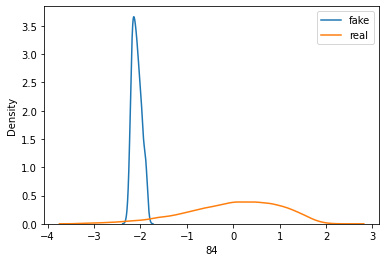

>Saved: drive/My Drive/GANs/20201027-114616_g_model_27020.h5, and drive/My Drive/GANs/20201027-114616_c_model_27020.h5
>Saved: drive/My Drive/GANs/20201027-114650_g_model_27406.h5, and drive/My Drive/GANs/20201027-114650_c_model_27406.h5
>Saved: drive/My Drive/GANs/20201027-114723_g_model_27792.h5, and drive/My Drive/GANs/20201027-114723_c_model_27792.h5
>Saved: drive/My Drive/GANs/20201027-114756_g_model_28178.h5, and drive/My Drive/GANs/20201027-114756_c_model_28178.h5
>Saved: drive/My Drive/GANs/20201027-114828_g_model_28564.h5, and drive/My Drive/GANs/20201027-114828_c_model_28564.h5


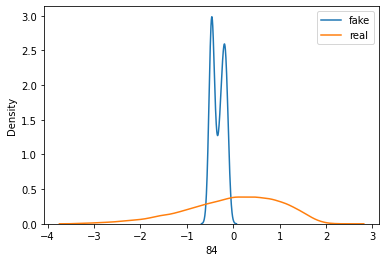

>Saved: drive/My Drive/GANs/20201027-114902_g_model_28950.h5, and drive/My Drive/GANs/20201027-114902_c_model_28950.h5
>Saved: drive/My Drive/GANs/20201027-114937_g_model_29336.h5, and drive/My Drive/GANs/20201027-114937_c_model_29336.h5
>Saved: drive/My Drive/GANs/20201027-115011_g_model_29722.h5, and drive/My Drive/GANs/20201027-115011_c_model_29722.h5
>Saved: drive/My Drive/GANs/20201027-115047_g_model_30108.h5, and drive/My Drive/GANs/20201027-115047_c_model_30108.h5
>Saved: drive/My Drive/GANs/20201027-115123_g_model_30494.h5, and drive/My Drive/GANs/20201027-115123_c_model_30494.h5


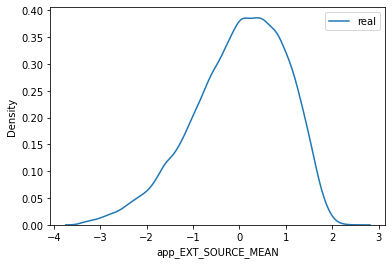

>Saved: drive/My Drive/GANs/20201027-115159_g_model_30880.h5, and drive/My Drive/GANs/20201027-115159_c_model_30880.h5
>Saved: drive/My Drive/GANs/20201027-115235_g_model_31266.h5, and drive/My Drive/GANs/20201027-115235_c_model_31266.h5
>Saved: drive/My Drive/GANs/20201027-115311_g_model_31652.h5, and drive/My Drive/GANs/20201027-115311_c_model_31652.h5
>Saved: drive/My Drive/GANs/20201027-115347_g_model_32038.h5, and drive/My Drive/GANs/20201027-115347_c_model_32038.h5
>Saved: drive/My Drive/GANs/20201027-115425_g_model_32424.h5, and drive/My Drive/GANs/20201027-115425_c_model_32424.h5


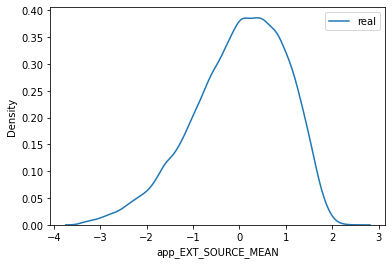

>Saved: drive/My Drive/GANs/20201027-115501_g_model_32810.h5, and drive/My Drive/GANs/20201027-115501_c_model_32810.h5
>Saved: drive/My Drive/GANs/20201027-115538_g_model_33196.h5, and drive/My Drive/GANs/20201027-115538_c_model_33196.h5
>Saved: drive/My Drive/GANs/20201027-115614_g_model_33582.h5, and drive/My Drive/GANs/20201027-115614_c_model_33582.h5
>Saved: drive/My Drive/GANs/20201027-115649_g_model_33968.h5, and drive/My Drive/GANs/20201027-115649_c_model_33968.h5
>Saved: drive/My Drive/GANs/20201027-115724_g_model_34354.h5, and drive/My Drive/GANs/20201027-115724_c_model_34354.h5


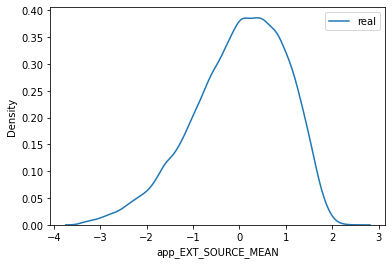

>Saved: drive/My Drive/GANs/20201027-115758_g_model_34740.h5, and drive/My Drive/GANs/20201027-115758_c_model_34740.h5
>Saved: drive/My Drive/GANs/20201027-115831_g_model_35126.h5, and drive/My Drive/GANs/20201027-115831_c_model_35126.h5
>Saved: drive/My Drive/GANs/20201027-115902_g_model_35512.h5, and drive/My Drive/GANs/20201027-115902_c_model_35512.h5
>Saved: drive/My Drive/GANs/20201027-115935_g_model_35898.h5, and drive/My Drive/GANs/20201027-115935_c_model_35898.h5
>Saved: drive/My Drive/GANs/20201027-120006_g_model_36284.h5, and drive/My Drive/GANs/20201027-120006_c_model_36284.h5


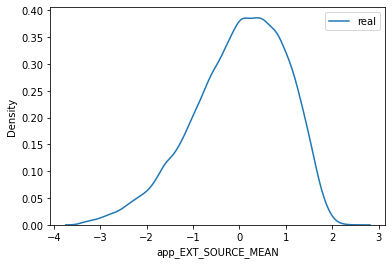

>Saved: drive/My Drive/GANs/20201027-120041_g_model_36670.h5, and drive/My Drive/GANs/20201027-120041_c_model_36670.h5
>Saved: drive/My Drive/GANs/20201027-120116_g_model_37056.h5, and drive/My Drive/GANs/20201027-120116_c_model_37056.h5
>Saved: drive/My Drive/GANs/20201027-120149_g_model_37442.h5, and drive/My Drive/GANs/20201027-120149_c_model_37442.h5
>Saved: drive/My Drive/GANs/20201027-120222_g_model_37828.h5, and drive/My Drive/GANs/20201027-120222_c_model_37828.h5
>Saved: drive/My Drive/GANs/20201027-120255_g_model_38214.h5, and drive/My Drive/GANs/20201027-120255_c_model_38214.h5


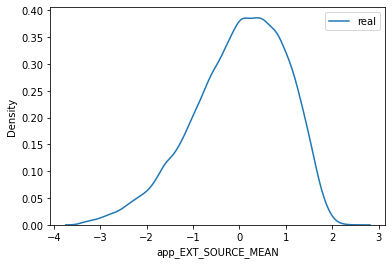

>Saved: drive/My Drive/GANs/20201027-120329_g_model_38600.h5, and drive/My Drive/GANs/20201027-120329_c_model_38600.h5



In [15]:
c_loss, g_loss, d_loss1, d_loss2 = gan_cond.train(X_all, y_all, best_feat_idx, n_epochs=epochs, n_batch=batch_size, n_samples=X_a.shape[0], verbose = True, plot_every=5)

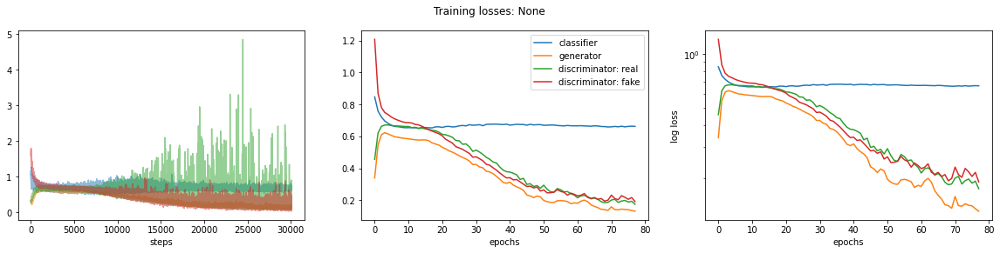

In [17]:
losses_steps = pd.DataFrame({
    'clf': pd.DataFrame(c_loss)[0], 
    'gen': g_loss,
    'dis_real': d_loss1,
    'dis_fake': d_loss2
    })

bat_per_epo = int(data.shape[0] / batch_size) #number of batches per training epoch
n_steps = bat_per_epo * epochs #number of training iterationsplot_losses(losses_steps, bat_per_epo)

Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 91)]              0         
_________________________________________________________________
dense_10 (Dense)             (None, 100)               9200      
_________________________________________________________________
batch_normalization_8 (Batch (None, 100)               400       
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 100)               0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 100)               0         
_________________________________________________________________
dense_11 (Dense)             (None, 100)               10100     
_________________________________________________________________
batch_normalization_9 (Batch (None, 100)             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


>Saved: drive/My Drive/GANs/20201027-120545_g_model_00386.h5, and drive/My Drive/GANs/20201027-120545_c_model_00386.h5
>Saved: drive/My Drive/GANs/20201027-120618_g_model_00772.h5, and drive/My Drive/GANs/20201027-120618_c_model_00772.h5
>Saved: drive/My Drive/GANs/20201027-120651_g_model_01158.h5, and drive/My Drive/GANs/20201027-120651_c_model_01158.h5
>Saved: drive/My Drive/GANs/20201027-120724_g_model_01544.h5, and drive/My Drive/GANs/20201027-120724_c_model_01544.h5


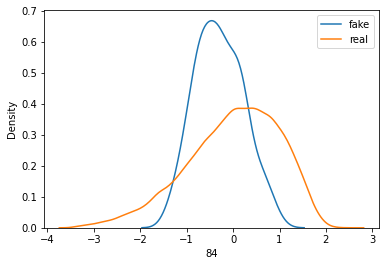

>Saved: drive/My Drive/GANs/20201027-120757_g_model_01930.h5, and drive/My Drive/GANs/20201027-120757_c_model_01930.h5
>Saved: drive/My Drive/GANs/20201027-120830_g_model_02316.h5, and drive/My Drive/GANs/20201027-120830_c_model_02316.h5
>Saved: drive/My Drive/GANs/20201027-120904_g_model_02702.h5, and drive/My Drive/GANs/20201027-120904_c_model_02702.h5
>Saved: drive/My Drive/GANs/20201027-120936_g_model_03088.h5, and drive/My Drive/GANs/20201027-120936_c_model_03088.h5
>Saved: drive/My Drive/GANs/20201027-121009_g_model_03474.h5, and drive/My Drive/GANs/20201027-121009_c_model_03474.h5


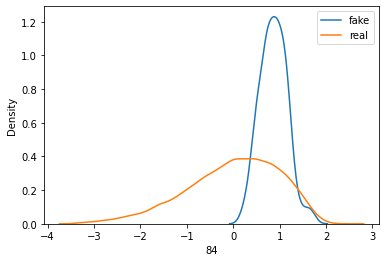

>Saved: drive/My Drive/GANs/20201027-121042_g_model_03860.h5, and drive/My Drive/GANs/20201027-121042_c_model_03860.h5
>Saved: drive/My Drive/GANs/20201027-121116_g_model_04246.h5, and drive/My Drive/GANs/20201027-121116_c_model_04246.h5
>Saved: drive/My Drive/GANs/20201027-121150_g_model_04632.h5, and drive/My Drive/GANs/20201027-121150_c_model_04632.h5
>Saved: drive/My Drive/GANs/20201027-121224_g_model_05018.h5, and drive/My Drive/GANs/20201027-121224_c_model_05018.h5
>Saved: drive/My Drive/GANs/20201027-121259_g_model_05404.h5, and drive/My Drive/GANs/20201027-121259_c_model_05404.h5


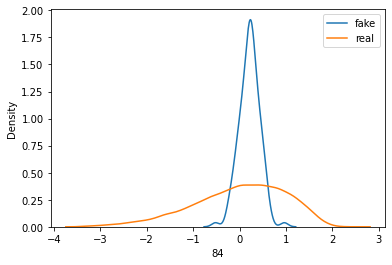

>Saved: drive/My Drive/GANs/20201027-121332_g_model_05790.h5, and drive/My Drive/GANs/20201027-121332_c_model_05790.h5
>Saved: drive/My Drive/GANs/20201027-121406_g_model_06176.h5, and drive/My Drive/GANs/20201027-121406_c_model_06176.h5
>Saved: drive/My Drive/GANs/20201027-121440_g_model_06562.h5, and drive/My Drive/GANs/20201027-121440_c_model_06562.h5
>Saved: drive/My Drive/GANs/20201027-121512_g_model_06948.h5, and drive/My Drive/GANs/20201027-121512_c_model_06948.h5
>Saved: drive/My Drive/GANs/20201027-121545_g_model_07334.h5, and drive/My Drive/GANs/20201027-121545_c_model_07334.h5


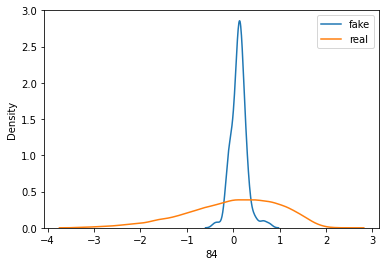

>Saved: drive/My Drive/GANs/20201027-121619_g_model_07720.h5, and drive/My Drive/GANs/20201027-121619_c_model_07720.h5
>Saved: drive/My Drive/GANs/20201027-121653_g_model_08106.h5, and drive/My Drive/GANs/20201027-121653_c_model_08106.h5
>Saved: drive/My Drive/GANs/20201027-121726_g_model_08492.h5, and drive/My Drive/GANs/20201027-121726_c_model_08492.h5
>Saved: drive/My Drive/GANs/20201027-121759_g_model_08878.h5, and drive/My Drive/GANs/20201027-121759_c_model_08878.h5
>Saved: drive/My Drive/GANs/20201027-121832_g_model_09264.h5, and drive/My Drive/GANs/20201027-121832_c_model_09264.h5


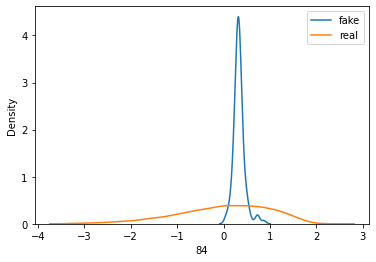

>Saved: drive/My Drive/GANs/20201027-121905_g_model_09650.h5, and drive/My Drive/GANs/20201027-121905_c_model_09650.h5
>Saved: drive/My Drive/GANs/20201027-121939_g_model_10036.h5, and drive/My Drive/GANs/20201027-121939_c_model_10036.h5
>Saved: drive/My Drive/GANs/20201027-122011_g_model_10422.h5, and drive/My Drive/GANs/20201027-122011_c_model_10422.h5
>Saved: drive/My Drive/GANs/20201027-122043_g_model_10808.h5, and drive/My Drive/GANs/20201027-122043_c_model_10808.h5
>Saved: drive/My Drive/GANs/20201027-122115_g_model_11194.h5, and drive/My Drive/GANs/20201027-122115_c_model_11194.h5


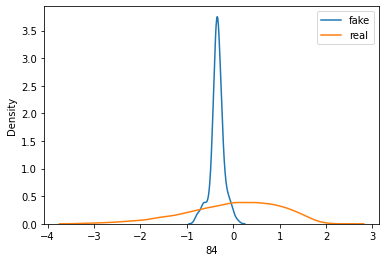

>Saved: drive/My Drive/GANs/20201027-122148_g_model_11580.h5, and drive/My Drive/GANs/20201027-122148_c_model_11580.h5
>Saved: drive/My Drive/GANs/20201027-122221_g_model_11966.h5, and drive/My Drive/GANs/20201027-122221_c_model_11966.h5
>Saved: drive/My Drive/GANs/20201027-122254_g_model_12352.h5, and drive/My Drive/GANs/20201027-122254_c_model_12352.h5
>Saved: drive/My Drive/GANs/20201027-122326_g_model_12738.h5, and drive/My Drive/GANs/20201027-122326_c_model_12738.h5
>Saved: drive/My Drive/GANs/20201027-122358_g_model_13124.h5, and drive/My Drive/GANs/20201027-122358_c_model_13124.h5


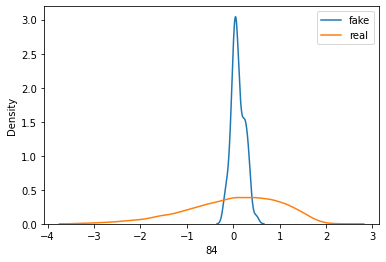

>Saved: drive/My Drive/GANs/20201027-122431_g_model_13510.h5, and drive/My Drive/GANs/20201027-122431_c_model_13510.h5
>Saved: drive/My Drive/GANs/20201027-122505_g_model_13896.h5, and drive/My Drive/GANs/20201027-122505_c_model_13896.h5
>Saved: drive/My Drive/GANs/20201027-122539_g_model_14282.h5, and drive/My Drive/GANs/20201027-122539_c_model_14282.h5
>Saved: drive/My Drive/GANs/20201027-122612_g_model_14668.h5, and drive/My Drive/GANs/20201027-122612_c_model_14668.h5
>Saved: drive/My Drive/GANs/20201027-122644_g_model_15054.h5, and drive/My Drive/GANs/20201027-122644_c_model_15054.h5


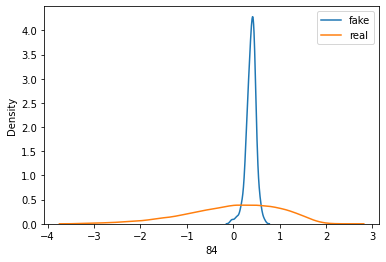

>Saved: drive/My Drive/GANs/20201027-122717_g_model_15440.h5, and drive/My Drive/GANs/20201027-122717_c_model_15440.h5
>Saved: drive/My Drive/GANs/20201027-122750_g_model_15826.h5, and drive/My Drive/GANs/20201027-122750_c_model_15826.h5
>Saved: drive/My Drive/GANs/20201027-122823_g_model_16212.h5, and drive/My Drive/GANs/20201027-122823_c_model_16212.h5
>Saved: drive/My Drive/GANs/20201027-122855_g_model_16598.h5, and drive/My Drive/GANs/20201027-122855_c_model_16598.h5
>Saved: drive/My Drive/GANs/20201027-122928_g_model_16984.h5, and drive/My Drive/GANs/20201027-122928_c_model_16984.h5


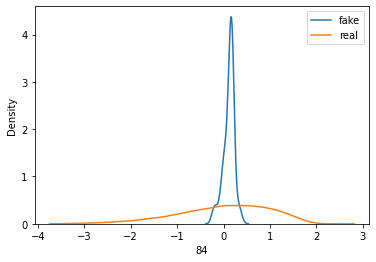

>Saved: drive/My Drive/GANs/20201027-123001_g_model_17370.h5, and drive/My Drive/GANs/20201027-123001_c_model_17370.h5
>Saved: drive/My Drive/GANs/20201027-123034_g_model_17756.h5, and drive/My Drive/GANs/20201027-123034_c_model_17756.h5
>Saved: drive/My Drive/GANs/20201027-123106_g_model_18142.h5, and drive/My Drive/GANs/20201027-123106_c_model_18142.h5
>Saved: drive/My Drive/GANs/20201027-123139_g_model_18528.h5, and drive/My Drive/GANs/20201027-123139_c_model_18528.h5
>Saved: drive/My Drive/GANs/20201027-123213_g_model_18914.h5, and drive/My Drive/GANs/20201027-123213_c_model_18914.h5


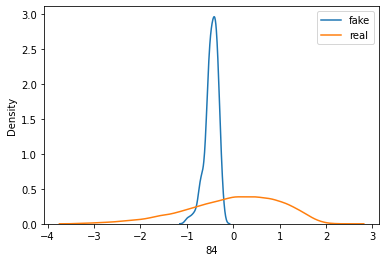

>Saved: drive/My Drive/GANs/20201027-123246_g_model_19300.h5, and drive/My Drive/GANs/20201027-123246_c_model_19300.h5
>Saved: drive/My Drive/GANs/20201027-123319_g_model_19686.h5, and drive/My Drive/GANs/20201027-123319_c_model_19686.h5
>Saved: drive/My Drive/GANs/20201027-123352_g_model_20072.h5, and drive/My Drive/GANs/20201027-123352_c_model_20072.h5
>Saved: drive/My Drive/GANs/20201027-123426_g_model_20458.h5, and drive/My Drive/GANs/20201027-123426_c_model_20458.h5
>Saved: drive/My Drive/GANs/20201027-123459_g_model_20844.h5, and drive/My Drive/GANs/20201027-123459_c_model_20844.h5


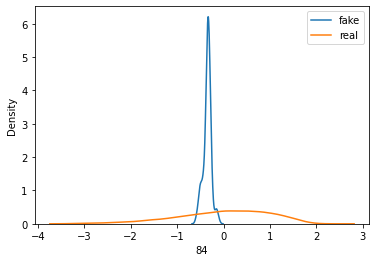

>Saved: drive/My Drive/GANs/20201027-123533_g_model_21230.h5, and drive/My Drive/GANs/20201027-123533_c_model_21230.h5
>Saved: drive/My Drive/GANs/20201027-123606_g_model_21616.h5, and drive/My Drive/GANs/20201027-123606_c_model_21616.h5
>Saved: drive/My Drive/GANs/20201027-123639_g_model_22002.h5, and drive/My Drive/GANs/20201027-123639_c_model_22002.h5
>Saved: drive/My Drive/GANs/20201027-123713_g_model_22388.h5, and drive/My Drive/GANs/20201027-123713_c_model_22388.h5
>Saved: drive/My Drive/GANs/20201027-123748_g_model_22774.h5, and drive/My Drive/GANs/20201027-123748_c_model_22774.h5


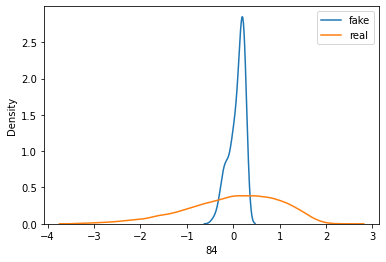

>Saved: drive/My Drive/GANs/20201027-123824_g_model_23160.h5, and drive/My Drive/GANs/20201027-123824_c_model_23160.h5
>Saved: drive/My Drive/GANs/20201027-123858_g_model_23546.h5, and drive/My Drive/GANs/20201027-123858_c_model_23546.h5
>Saved: drive/My Drive/GANs/20201027-123932_g_model_23932.h5, and drive/My Drive/GANs/20201027-123932_c_model_23932.h5
>Saved: drive/My Drive/GANs/20201027-124006_g_model_24318.h5, and drive/My Drive/GANs/20201027-124006_c_model_24318.h5
>Saved: drive/My Drive/GANs/20201027-124039_g_model_24704.h5, and drive/My Drive/GANs/20201027-124039_c_model_24704.h5


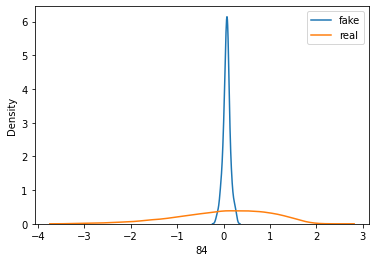

>Saved: drive/My Drive/GANs/20201027-124112_g_model_25090.h5, and drive/My Drive/GANs/20201027-124112_c_model_25090.h5
>Saved: drive/My Drive/GANs/20201027-124146_g_model_25476.h5, and drive/My Drive/GANs/20201027-124146_c_model_25476.h5
>Saved: drive/My Drive/GANs/20201027-124220_g_model_25862.h5, and drive/My Drive/GANs/20201027-124220_c_model_25862.h5
>Saved: drive/My Drive/GANs/20201027-124256_g_model_26248.h5, and drive/My Drive/GANs/20201027-124256_c_model_26248.h5
>Saved: drive/My Drive/GANs/20201027-124330_g_model_26634.h5, and drive/My Drive/GANs/20201027-124330_c_model_26634.h5


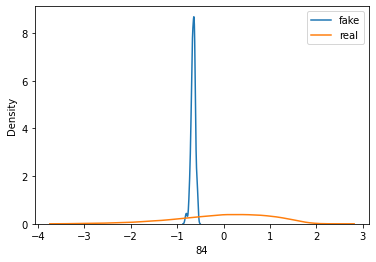

>Saved: drive/My Drive/GANs/20201027-124404_g_model_27020.h5, and drive/My Drive/GANs/20201027-124404_c_model_27020.h5
>Saved: drive/My Drive/GANs/20201027-124438_g_model_27406.h5, and drive/My Drive/GANs/20201027-124438_c_model_27406.h5
>Saved: drive/My Drive/GANs/20201027-124512_g_model_27792.h5, and drive/My Drive/GANs/20201027-124512_c_model_27792.h5
>Saved: drive/My Drive/GANs/20201027-124546_g_model_28178.h5, and drive/My Drive/GANs/20201027-124546_c_model_28178.h5
>Saved: drive/My Drive/GANs/20201027-124620_g_model_28564.h5, and drive/My Drive/GANs/20201027-124620_c_model_28564.h5


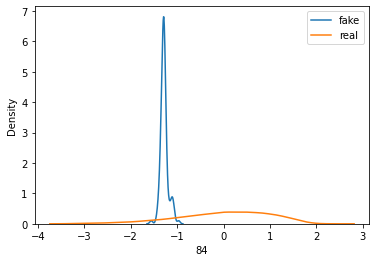

>Saved: drive/My Drive/GANs/20201027-124654_g_model_28950.h5, and drive/My Drive/GANs/20201027-124654_c_model_28950.h5
>Saved: drive/My Drive/GANs/20201027-124730_g_model_29336.h5, and drive/My Drive/GANs/20201027-124730_c_model_29336.h5
>Saved: drive/My Drive/GANs/20201027-124804_g_model_29722.h5, and drive/My Drive/GANs/20201027-124804_c_model_29722.h5
>Saved: drive/My Drive/GANs/20201027-124841_g_model_30108.h5, and drive/My Drive/GANs/20201027-124841_c_model_30108.h5
>Saved: drive/My Drive/GANs/20201027-124914_g_model_30494.h5, and drive/My Drive/GANs/20201027-124914_c_model_30494.h5


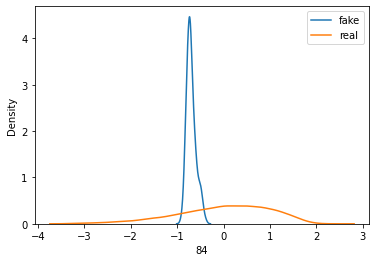

>Saved: drive/My Drive/GANs/20201027-124947_g_model_30880.h5, and drive/My Drive/GANs/20201027-124947_c_model_30880.h5
>Saved: drive/My Drive/GANs/20201027-125022_g_model_31266.h5, and drive/My Drive/GANs/20201027-125022_c_model_31266.h5
>Saved: drive/My Drive/GANs/20201027-125055_g_model_31652.h5, and drive/My Drive/GANs/20201027-125055_c_model_31652.h5
>Saved: drive/My Drive/GANs/20201027-125129_g_model_32038.h5, and drive/My Drive/GANs/20201027-125129_c_model_32038.h5
>Saved: drive/My Drive/GANs/20201027-125203_g_model_32424.h5, and drive/My Drive/GANs/20201027-125203_c_model_32424.h5


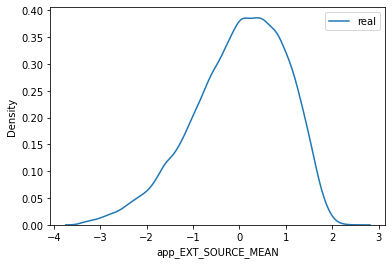

>Saved: drive/My Drive/GANs/20201027-125238_g_model_32810.h5, and drive/My Drive/GANs/20201027-125238_c_model_32810.h5
>Saved: drive/My Drive/GANs/20201027-125315_g_model_33196.h5, and drive/My Drive/GANs/20201027-125315_c_model_33196.h5
>Saved: drive/My Drive/GANs/20201027-125355_g_model_33582.h5, and drive/My Drive/GANs/20201027-125355_c_model_33582.h5
>Saved: drive/My Drive/GANs/20201027-125430_g_model_33968.h5, and drive/My Drive/GANs/20201027-125430_c_model_33968.h5
>Saved: drive/My Drive/GANs/20201027-125504_g_model_34354.h5, and drive/My Drive/GANs/20201027-125504_c_model_34354.h5


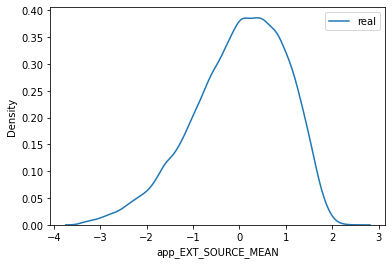

>Saved: drive/My Drive/GANs/20201027-125538_g_model_34740.h5, and drive/My Drive/GANs/20201027-125538_c_model_34740.h5
>Saved: drive/My Drive/GANs/20201027-125613_g_model_35126.h5, and drive/My Drive/GANs/20201027-125613_c_model_35126.h5
>Saved: drive/My Drive/GANs/20201027-125647_g_model_35512.h5, and drive/My Drive/GANs/20201027-125647_c_model_35512.h5
>Saved: drive/My Drive/GANs/20201027-125720_g_model_35898.h5, and drive/My Drive/GANs/20201027-125720_c_model_35898.h5
>Saved: drive/My Drive/GANs/20201027-125753_g_model_36284.h5, and drive/My Drive/GANs/20201027-125753_c_model_36284.h5


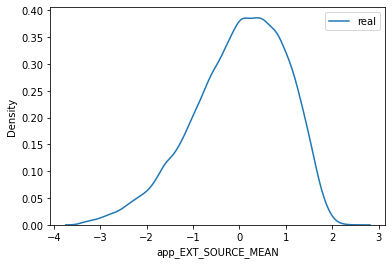

>Saved: drive/My Drive/GANs/20201027-125825_g_model_36670.h5, and drive/My Drive/GANs/20201027-125825_c_model_36670.h5
>Saved: drive/My Drive/GANs/20201027-125900_g_model_37056.h5, and drive/My Drive/GANs/20201027-125900_c_model_37056.h5
>Saved: drive/My Drive/GANs/20201027-125936_g_model_37442.h5, and drive/My Drive/GANs/20201027-125936_c_model_37442.h5
>Saved: drive/My Drive/GANs/20201027-130010_g_model_37828.h5, and drive/My Drive/GANs/20201027-130010_c_model_37828.h5
>Saved: drive/My Drive/GANs/20201027-130044_g_model_38214.h5, and drive/My Drive/GANs/20201027-130044_c_model_38214.h5


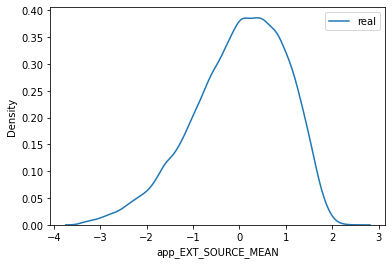

>Saved: drive/My Drive/GANs/20201027-130116_g_model_38600.h5, and drive/My Drive/GANs/20201027-130116_c_model_38600.h5



In [18]:
gan_uncond = SGAN(data_dim, conditional=False, n_classes=n_classes, noise_dim=noise_dim, learning_rate=learning_rate, dropout=dropout)
c_loss_uncond, g_loss_uncond, d_loss1_uncond, d_loss2_uncond = gan_uncond.train(X_all, y_all, best_feat_idx, n_epochs=epochs, n_batch=batch_size, n_samples=X_a.shape[0], verbose = True, plot_every=10)

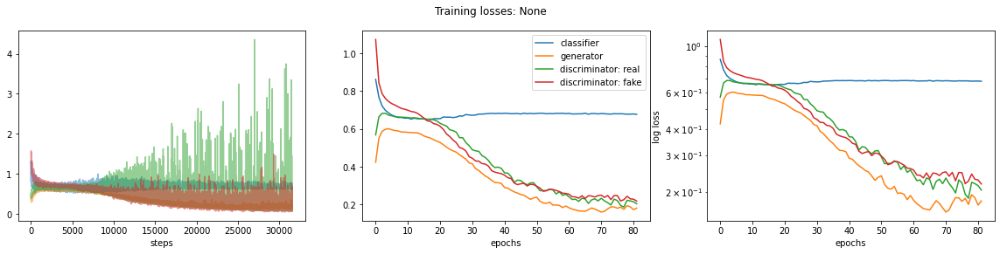

In [20]:
losses_steps_uncond = pd.DataFrame({
    'clf': pd.DataFrame(c_loss_uncond)[0], 
    'gen': g_loss_uncond,
    'dis_real': d_loss1_uncond,
    'dis_fake': d_loss2_uncond
    })

plot_losses(losses_steps_uncond, bat_per_epo)

In [117]:
scores_cond_LR, fake_data_cond = evaluate_methods(clf="LR", c_model = gan_cond.c_model, g_model = gan_cond.g_model,
                                                  conditional=True, 
                                                  df=df, test=S, target_col=target_col, reject_col=reject_col,
                                                  noise_dim=noise_dim, alpha=alpha, threshold=threshold)

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.952
60th percentile of preds: 0.53


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.963
       app_CNT_CHILDREN  ...          BAD
count       2001.000000  ...  2001.000000
mean          -0.810157  ...     0.509245
std            0.070147  ...     0.500039
min           -1.027175  ...     0.000000
25%           -0.853741  ...     0.000000
50%           -0.814335  ...     1.000000
75%           -0.779548  ...     1.000000
max           -0.567960  ...     1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.952


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.961
60th percentile of preds: 0.954


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


In [118]:
scores_cond_RF, fake_data_cond = evaluate_methods(clf="RF", c_model = gan_cond.c_model, g_model = gan_cond.g_model,
                                                  conditional=True, 
                                                  df=df, test=S, target_col=target_col, reject_col=reject_col,
                                                  noise_dim=noise_dim, alpha=alpha, threshold=threshold)

60th percentile of preds: 0.88
60th percentile of preds: 0.53
60th percentile of preds: 0.88
       app_CNT_CHILDREN  ...          BAD
count       2001.000000  ...  2001.000000
mean          -0.812282  ...     0.485257
std            0.071778  ...     0.499908
min           -1.077654  ...     0.000000
25%           -0.857533  ...     0.000000
50%           -0.817423  ...     0.000000
75%           -0.781719  ...     1.000000
max           -0.571808  ...     1.000000

[8 rows x 92 columns]
60th percentile of preds: 0.88
60th percentile of preds: 0.88
60th percentile of preds: 0.947


In [88]:
scores_uncond_LR, fake_data_uncond = evaluate_methods(clf="LR", c_model = gan_uncond.c_model, g_model = gan_uncond.g_model,
                                                      conditional=False, 
                                                      df=df, test=S, target_col=target_col, reject_col=reject_col,
                                                      noise_dim=noise_dim, alpha=alpha, threshold=threshold)

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.952
60th percentile of preds: 0.475


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.619
       app_CNT_CHILDREN  ...     BAD
count       2001.000000  ...  2001.0
mean          -1.691521  ...     0.0
std            0.112560  ...     0.0
min           -2.198538  ...     0.0
25%           -1.761550  ...     0.0
50%           -1.691235  ...     0.0
75%           -1.607966  ...     0.0
max           -1.326616  ...     0.0

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.953


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.617
60th percentile of preds: 0.954


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


In [89]:
scores_uncond_RF, fake_data_uncond = evaluate_methods(clf="RF", c_model = c_model_uncond, g_model = g_model_uncond,
                                                      conditional=False, 
                                                      df=df, test=S, target_col=target_col, reject_col=reject_col,
                                                      noise_dim=noise_dim, alpha=alpha, threshold=threshold)

60th percentile of preds: 0.88
60th percentile of preds: 0.475
60th percentile of preds: 0.807
       app_CNT_CHILDREN  ...     BAD
count       2001.000000  ...  2001.0
mean          -1.688435  ...     0.0
std            0.113716  ...     0.0
min           -2.328926  ...     0.0
25%           -1.762784  ...     0.0
50%           -1.687207  ...     0.0
75%           -1.602706  ...     0.0
max           -1.310914  ...     0.0

[8 rows x 92 columns]
60th percentile of preds: 0.877
60th percentile of preds: 0.823
60th percentile of preds: 0.947


In [119]:
print(scores_cond_LR)
print(scores_cond_RF)

          benchmark  method_1  method_2  method_3  method_all    oracle
accuracy   0.924038  0.670165  0.687656  0.922539    0.687656  0.926537
AUC_ROC    0.780496  0.758621  0.766067  0.777438    0.766141  0.788143
AUC-PR     0.207440  0.208455  0.210495  0.208826    0.209833  0.225083
BS         0.063677  0.251768  0.264592  0.063820    0.264117  0.061562
ABR        0.018727  0.021223  0.019975  0.017478    0.019975  0.016230
RGR        0.891667  0.893333  0.892500  0.890833    0.892500  0.890000
          benchmark  method_1  method_2  method_3  method_all    oracle
accuracy   0.928036  0.670165  0.692154  0.928036    0.693153  0.927536
AUC_ROC    0.681116  0.758621  0.768666  0.692927    0.766428  0.782941
AUC-PR     0.125750  0.208455  0.202893  0.137799    0.191669  0.239640
BS         0.081840  0.251768  0.227583  0.079330    0.227788  0.061476
ABR        0.024876  0.021223  0.018519  0.023720    0.019656  0.016230
RGR        0.895572  0.893333  0.890848  0.895000    0.891323  0

In [91]:
print(scores_uncond_LR)
print(scores_uncond_RF)

# unconditional is a lot worse than conditional model

          benchmark  method_1  method_2  method_3  method_all    oracle
accuracy   0.924038  0.202899  0.484258  0.925037    0.485257  0.926537
AUC_ROC    0.780492  0.692665  0.745634  0.779392    0.745340  0.788139
AUC-PR     0.203674  0.142356  0.203998  0.202029    0.203771  0.221078
BS         0.063678  0.272415  0.455888  0.063421    0.455957  0.061562
ABR        0.018727  0.027466  0.027466  0.018727    0.026217  0.016230
RGR        0.891667  0.897500  0.897500  0.891667    0.896667  0.890000
          benchmark  method_1  method_2  method_3  method_all    oracle
accuracy   0.928036  0.202899  0.475762  0.928036    0.474763  0.927536
AUC_ROC    0.681116  0.692665  0.723025  0.688951    0.717654  0.782941
AUC-PR     0.124459  0.142356  0.202175  0.131769    0.210183  0.238099
BS         0.081840  0.272415  0.462003  0.079499    0.464991  0.061476
ABR        0.024876  0.027466  0.024876  0.023573    0.024969  0.016230
RGR        0.895572  0.897500  0.895572  0.894561    0.895833  0

#### UK data

In [24]:
gan_cond = SGAN(data_dim, conditional=True, n_classes=n_classes, noise_dim=noise_dim, learning_rate=learning_rate, dropout=dropout)

Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 51)]              0         
_________________________________________________________________
dense (Dense)                (None, 100)               5200      
_________________________________________________________________
batch_normalization (BatchNo (None, 100)               400       
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 100)               0         
_________________________________________________________________
dropout (Dropout)            (None, 100)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               10100     
_________________________________________________________________
batch_normalization_1 (Batch (None, 100)             

(11220, 51) (11220,)
n_epochs=100, n_batch=128, 1/2=64, b/e=218, steps=21800


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


>Saved: drive/My Drive/Thesis/20201031-101143_g_model_00218.h5, and drive/My Drive/Thesis/20201031-101143_c_model_00218.h5
>Saved: drive/My Drive/Thesis/20201031-101202_g_model_00436.h5, and drive/My Drive/Thesis/20201031-101202_c_model_00436.h5
>Saved: drive/My Drive/Thesis/20201031-101221_g_model_00654.h5, and drive/My Drive/Thesis/20201031-101221_c_model_00654.h5
>Saved: drive/My Drive/Thesis/20201031-101240_g_model_00872.h5, and drive/My Drive/Thesis/20201031-101240_c_model_00872.h5


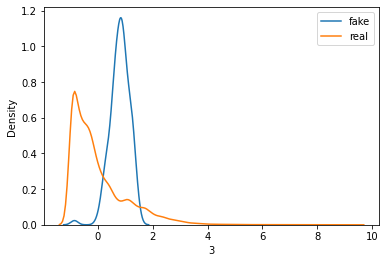

>Saved: drive/My Drive/Thesis/20201031-101259_g_model_01090.h5, and drive/My Drive/Thesis/20201031-101259_c_model_01090.h5
>Saved: drive/My Drive/Thesis/20201031-101319_g_model_01308.h5, and drive/My Drive/Thesis/20201031-101319_c_model_01308.h5
>Saved: drive/My Drive/Thesis/20201031-101338_g_model_01526.h5, and drive/My Drive/Thesis/20201031-101338_c_model_01526.h5
>Saved: drive/My Drive/Thesis/20201031-101357_g_model_01744.h5, and drive/My Drive/Thesis/20201031-101357_c_model_01744.h5
>Saved: drive/My Drive/Thesis/20201031-101416_g_model_01962.h5, and drive/My Drive/Thesis/20201031-101416_c_model_01962.h5


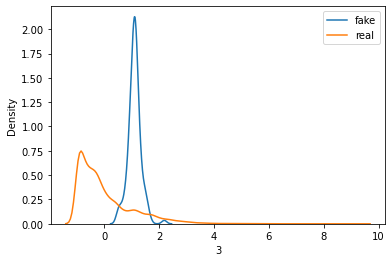

>Saved: drive/My Drive/Thesis/20201031-101435_g_model_02180.h5, and drive/My Drive/Thesis/20201031-101435_c_model_02180.h5
>Saved: drive/My Drive/Thesis/20201031-101455_g_model_02398.h5, and drive/My Drive/Thesis/20201031-101455_c_model_02398.h5
>Saved: drive/My Drive/Thesis/20201031-101514_g_model_02616.h5, and drive/My Drive/Thesis/20201031-101514_c_model_02616.h5
>Saved: drive/My Drive/Thesis/20201031-101534_g_model_02834.h5, and drive/My Drive/Thesis/20201031-101534_c_model_02834.h5
>Saved: drive/My Drive/Thesis/20201031-101553_g_model_03052.h5, and drive/My Drive/Thesis/20201031-101553_c_model_03052.h5


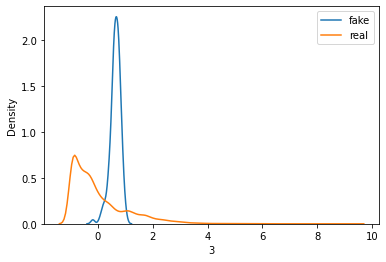

>Saved: drive/My Drive/Thesis/20201031-101613_g_model_03270.h5, and drive/My Drive/Thesis/20201031-101613_c_model_03270.h5
>Saved: drive/My Drive/Thesis/20201031-101632_g_model_03488.h5, and drive/My Drive/Thesis/20201031-101632_c_model_03488.h5
>Saved: drive/My Drive/Thesis/20201031-101652_g_model_03706.h5, and drive/My Drive/Thesis/20201031-101652_c_model_03706.h5
>Saved: drive/My Drive/Thesis/20201031-101711_g_model_03924.h5, and drive/My Drive/Thesis/20201031-101711_c_model_03924.h5
>Saved: drive/My Drive/Thesis/20201031-101731_g_model_04142.h5, and drive/My Drive/Thesis/20201031-101731_c_model_04142.h5


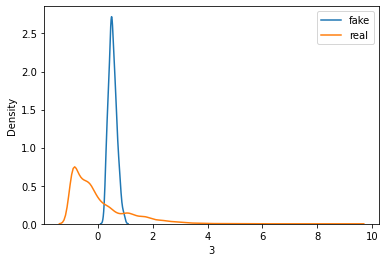

>Saved: drive/My Drive/Thesis/20201031-101750_g_model_04360.h5, and drive/My Drive/Thesis/20201031-101750_c_model_04360.h5
>Saved: drive/My Drive/Thesis/20201031-101810_g_model_04578.h5, and drive/My Drive/Thesis/20201031-101810_c_model_04578.h5
>Saved: drive/My Drive/Thesis/20201031-101829_g_model_04796.h5, and drive/My Drive/Thesis/20201031-101829_c_model_04796.h5
>Saved: drive/My Drive/Thesis/20201031-101848_g_model_05014.h5, and drive/My Drive/Thesis/20201031-101848_c_model_05014.h5
>Saved: drive/My Drive/Thesis/20201031-101907_g_model_05232.h5, and drive/My Drive/Thesis/20201031-101907_c_model_05232.h5


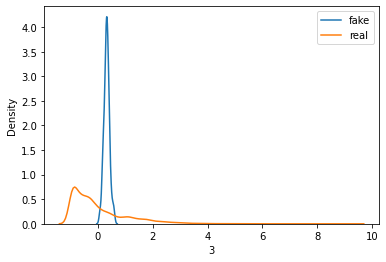

>Saved: drive/My Drive/Thesis/20201031-101927_g_model_05450.h5, and drive/My Drive/Thesis/20201031-101927_c_model_05450.h5
>Saved: drive/My Drive/Thesis/20201031-101946_g_model_05668.h5, and drive/My Drive/Thesis/20201031-101946_c_model_05668.h5
>Saved: drive/My Drive/Thesis/20201031-102005_g_model_05886.h5, and drive/My Drive/Thesis/20201031-102005_c_model_05886.h5
>Saved: drive/My Drive/Thesis/20201031-102024_g_model_06104.h5, and drive/My Drive/Thesis/20201031-102024_c_model_06104.h5
>Saved: drive/My Drive/Thesis/20201031-102044_g_model_06322.h5, and drive/My Drive/Thesis/20201031-102044_c_model_06322.h5


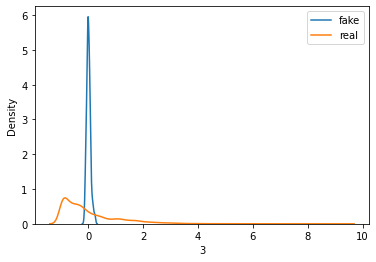

>Saved: drive/My Drive/Thesis/20201031-102103_g_model_06540.h5, and drive/My Drive/Thesis/20201031-102103_c_model_06540.h5
>Saved: drive/My Drive/Thesis/20201031-102123_g_model_06758.h5, and drive/My Drive/Thesis/20201031-102123_c_model_06758.h5
>Saved: drive/My Drive/Thesis/20201031-102142_g_model_06976.h5, and drive/My Drive/Thesis/20201031-102142_c_model_06976.h5
>Saved: drive/My Drive/Thesis/20201031-102201_g_model_07194.h5, and drive/My Drive/Thesis/20201031-102201_c_model_07194.h5
>Saved: drive/My Drive/Thesis/20201031-102220_g_model_07412.h5, and drive/My Drive/Thesis/20201031-102220_c_model_07412.h5


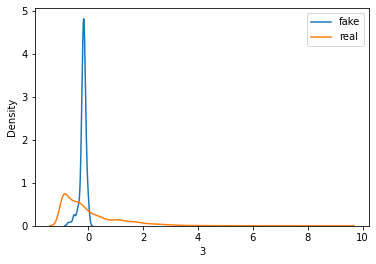

>Saved: drive/My Drive/Thesis/20201031-102239_g_model_07630.h5, and drive/My Drive/Thesis/20201031-102239_c_model_07630.h5
>Saved: drive/My Drive/Thesis/20201031-102258_g_model_07848.h5, and drive/My Drive/Thesis/20201031-102258_c_model_07848.h5
>Saved: drive/My Drive/Thesis/20201031-102317_g_model_08066.h5, and drive/My Drive/Thesis/20201031-102317_c_model_08066.h5
>Saved: drive/My Drive/Thesis/20201031-102336_g_model_08284.h5, and drive/My Drive/Thesis/20201031-102336_c_model_08284.h5
>Saved: drive/My Drive/Thesis/20201031-102355_g_model_08502.h5, and drive/My Drive/Thesis/20201031-102355_c_model_08502.h5


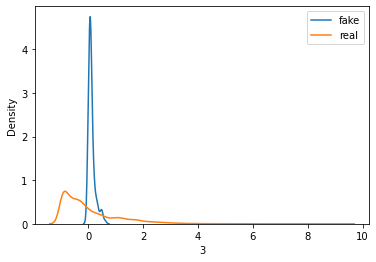

>Saved: drive/My Drive/Thesis/20201031-102414_g_model_08720.h5, and drive/My Drive/Thesis/20201031-102414_c_model_08720.h5
>Saved: drive/My Drive/Thesis/20201031-102433_g_model_08938.h5, and drive/My Drive/Thesis/20201031-102433_c_model_08938.h5
>Saved: drive/My Drive/Thesis/20201031-102453_g_model_09156.h5, and drive/My Drive/Thesis/20201031-102453_c_model_09156.h5
>Saved: drive/My Drive/Thesis/20201031-102511_g_model_09374.h5, and drive/My Drive/Thesis/20201031-102511_c_model_09374.h5
>Saved: drive/My Drive/Thesis/20201031-102530_g_model_09592.h5, and drive/My Drive/Thesis/20201031-102530_c_model_09592.h5


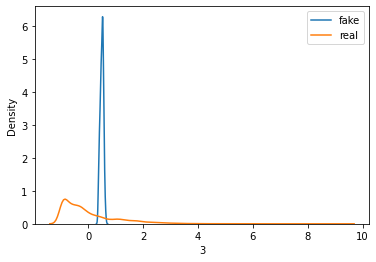

>Saved: drive/My Drive/Thesis/20201031-102549_g_model_09810.h5, and drive/My Drive/Thesis/20201031-102549_c_model_09810.h5
>Saved: drive/My Drive/Thesis/20201031-102608_g_model_10028.h5, and drive/My Drive/Thesis/20201031-102608_c_model_10028.h5
>Saved: drive/My Drive/Thesis/20201031-102627_g_model_10246.h5, and drive/My Drive/Thesis/20201031-102627_c_model_10246.h5
>Saved: drive/My Drive/Thesis/20201031-102645_g_model_10464.h5, and drive/My Drive/Thesis/20201031-102645_c_model_10464.h5
>Saved: drive/My Drive/Thesis/20201031-102704_g_model_10682.h5, and drive/My Drive/Thesis/20201031-102704_c_model_10682.h5


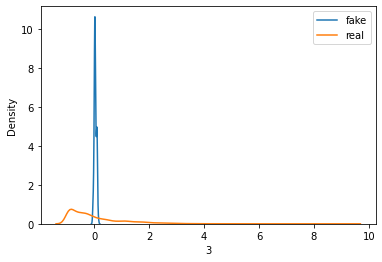

>Saved: drive/My Drive/Thesis/20201031-102723_g_model_10900.h5, and drive/My Drive/Thesis/20201031-102723_c_model_10900.h5
>Saved: drive/My Drive/Thesis/20201031-102742_g_model_11118.h5, and drive/My Drive/Thesis/20201031-102742_c_model_11118.h5
>Saved: drive/My Drive/Thesis/20201031-102801_g_model_11336.h5, and drive/My Drive/Thesis/20201031-102801_c_model_11336.h5
>Saved: drive/My Drive/Thesis/20201031-102820_g_model_11554.h5, and drive/My Drive/Thesis/20201031-102820_c_model_11554.h5
>Saved: drive/My Drive/Thesis/20201031-102839_g_model_11772.h5, and drive/My Drive/Thesis/20201031-102839_c_model_11772.h5


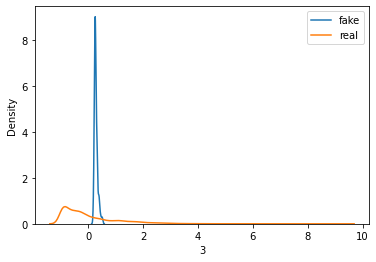

>Saved: drive/My Drive/Thesis/20201031-102858_g_model_11990.h5, and drive/My Drive/Thesis/20201031-102858_c_model_11990.h5
>Saved: drive/My Drive/Thesis/20201031-102918_g_model_12208.h5, and drive/My Drive/Thesis/20201031-102918_c_model_12208.h5
>Saved: drive/My Drive/Thesis/20201031-102937_g_model_12426.h5, and drive/My Drive/Thesis/20201031-102937_c_model_12426.h5
>Saved: drive/My Drive/Thesis/20201031-102956_g_model_12644.h5, and drive/My Drive/Thesis/20201031-102956_c_model_12644.h5
>Saved: drive/My Drive/Thesis/20201031-103016_g_model_12862.h5, and drive/My Drive/Thesis/20201031-103016_c_model_12862.h5


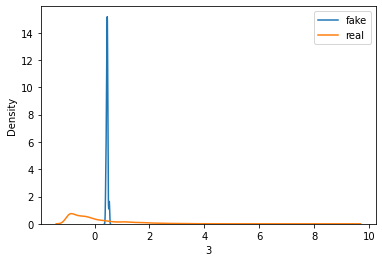

>Saved: drive/My Drive/Thesis/20201031-103035_g_model_13080.h5, and drive/My Drive/Thesis/20201031-103035_c_model_13080.h5
>Saved: drive/My Drive/Thesis/20201031-103055_g_model_13298.h5, and drive/My Drive/Thesis/20201031-103055_c_model_13298.h5
>Saved: drive/My Drive/Thesis/20201031-103114_g_model_13516.h5, and drive/My Drive/Thesis/20201031-103114_c_model_13516.h5
>Saved: drive/My Drive/Thesis/20201031-103133_g_model_13734.h5, and drive/My Drive/Thesis/20201031-103133_c_model_13734.h5
>Saved: drive/My Drive/Thesis/20201031-103154_g_model_13952.h5, and drive/My Drive/Thesis/20201031-103154_c_model_13952.h5


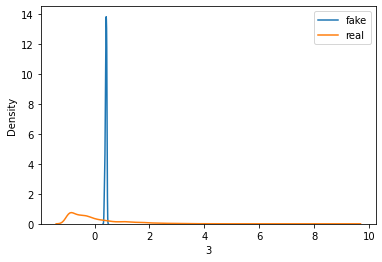

>Saved: drive/My Drive/Thesis/20201031-103214_g_model_14170.h5, and drive/My Drive/Thesis/20201031-103214_c_model_14170.h5
>Saved: drive/My Drive/Thesis/20201031-103234_g_model_14388.h5, and drive/My Drive/Thesis/20201031-103234_c_model_14388.h5
>Saved: drive/My Drive/Thesis/20201031-103253_g_model_14606.h5, and drive/My Drive/Thesis/20201031-103253_c_model_14606.h5
>Saved: drive/My Drive/Thesis/20201031-103312_g_model_14824.h5, and drive/My Drive/Thesis/20201031-103312_c_model_14824.h5
>Saved: drive/My Drive/Thesis/20201031-103331_g_model_15042.h5, and drive/My Drive/Thesis/20201031-103331_c_model_15042.h5


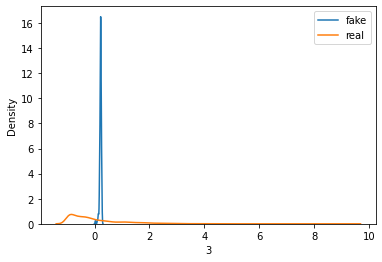

>Saved: drive/My Drive/Thesis/20201031-103350_g_model_15260.h5, and drive/My Drive/Thesis/20201031-103350_c_model_15260.h5
>Saved: drive/My Drive/Thesis/20201031-103409_g_model_15478.h5, and drive/My Drive/Thesis/20201031-103409_c_model_15478.h5
>Saved: drive/My Drive/Thesis/20201031-103429_g_model_15696.h5, and drive/My Drive/Thesis/20201031-103429_c_model_15696.h5
>Saved: drive/My Drive/Thesis/20201031-103448_g_model_15914.h5, and drive/My Drive/Thesis/20201031-103448_c_model_15914.h5
>Saved: drive/My Drive/Thesis/20201031-103507_g_model_16132.h5, and drive/My Drive/Thesis/20201031-103507_c_model_16132.h5


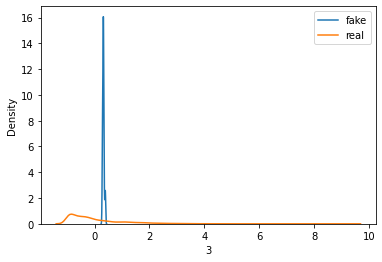

>Saved: drive/My Drive/Thesis/20201031-103526_g_model_16350.h5, and drive/My Drive/Thesis/20201031-103526_c_model_16350.h5
>Saved: drive/My Drive/Thesis/20201031-103545_g_model_16568.h5, and drive/My Drive/Thesis/20201031-103545_c_model_16568.h5
>Saved: drive/My Drive/Thesis/20201031-103605_g_model_16786.h5, and drive/My Drive/Thesis/20201031-103605_c_model_16786.h5
>Saved: drive/My Drive/Thesis/20201031-103624_g_model_17004.h5, and drive/My Drive/Thesis/20201031-103624_c_model_17004.h5
>Saved: drive/My Drive/Thesis/20201031-103643_g_model_17222.h5, and drive/My Drive/Thesis/20201031-103643_c_model_17222.h5


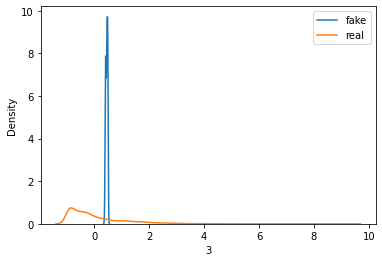

>Saved: drive/My Drive/Thesis/20201031-103702_g_model_17440.h5, and drive/My Drive/Thesis/20201031-103702_c_model_17440.h5
>Saved: drive/My Drive/Thesis/20201031-103721_g_model_17658.h5, and drive/My Drive/Thesis/20201031-103721_c_model_17658.h5
>Saved: drive/My Drive/Thesis/20201031-103740_g_model_17876.h5, and drive/My Drive/Thesis/20201031-103740_c_model_17876.h5
>Saved: drive/My Drive/Thesis/20201031-103759_g_model_18094.h5, and drive/My Drive/Thesis/20201031-103759_c_model_18094.h5
>Saved: drive/My Drive/Thesis/20201031-103818_g_model_18312.h5, and drive/My Drive/Thesis/20201031-103818_c_model_18312.h5


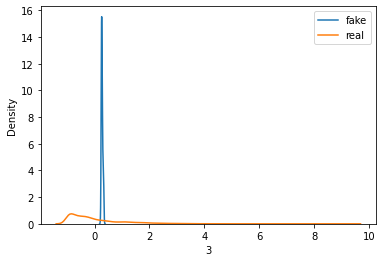

>Saved: drive/My Drive/Thesis/20201031-103837_g_model_18530.h5, and drive/My Drive/Thesis/20201031-103837_c_model_18530.h5
>Saved: drive/My Drive/Thesis/20201031-103856_g_model_18748.h5, and drive/My Drive/Thesis/20201031-103856_c_model_18748.h5
>Saved: drive/My Drive/Thesis/20201031-103915_g_model_18966.h5, and drive/My Drive/Thesis/20201031-103915_c_model_18966.h5
>Saved: drive/My Drive/Thesis/20201031-103934_g_model_19184.h5, and drive/My Drive/Thesis/20201031-103934_c_model_19184.h5
>Saved: drive/My Drive/Thesis/20201031-103954_g_model_19402.h5, and drive/My Drive/Thesis/20201031-103954_c_model_19402.h5


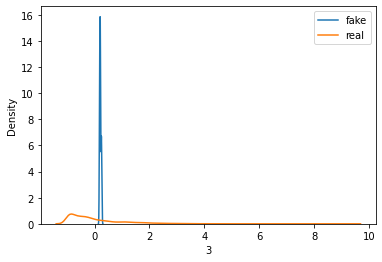

>Saved: drive/My Drive/Thesis/20201031-104013_g_model_19620.h5, and drive/My Drive/Thesis/20201031-104013_c_model_19620.h5
>Saved: drive/My Drive/Thesis/20201031-104032_g_model_19838.h5, and drive/My Drive/Thesis/20201031-104032_c_model_19838.h5
>Saved: drive/My Drive/Thesis/20201031-104051_g_model_20056.h5, and drive/My Drive/Thesis/20201031-104051_c_model_20056.h5
>Saved: drive/My Drive/Thesis/20201031-104110_g_model_20274.h5, and drive/My Drive/Thesis/20201031-104110_c_model_20274.h5
>Saved: drive/My Drive/Thesis/20201031-104129_g_model_20492.h5, and drive/My Drive/Thesis/20201031-104129_c_model_20492.h5


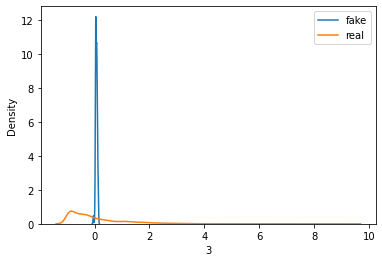

>Saved: drive/My Drive/Thesis/20201031-104148_g_model_20710.h5, and drive/My Drive/Thesis/20201031-104148_c_model_20710.h5
>Saved: drive/My Drive/Thesis/20201031-104211_g_model_20928.h5, and drive/My Drive/Thesis/20201031-104211_c_model_20928.h5
>Saved: drive/My Drive/Thesis/20201031-104230_g_model_21146.h5, and drive/My Drive/Thesis/20201031-104230_c_model_21146.h5
>Saved: drive/My Drive/Thesis/20201031-104248_g_model_21364.h5, and drive/My Drive/Thesis/20201031-104248_c_model_21364.h5
>Saved: drive/My Drive/Thesis/20201031-104307_g_model_21582.h5, and drive/My Drive/Thesis/20201031-104307_c_model_21582.h5


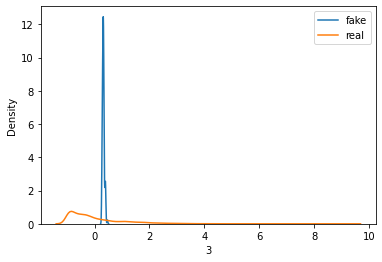

>Saved: drive/My Drive/Thesis/20201031-104326_g_model_21800.h5, and drive/My Drive/Thesis/20201031-104326_c_model_21800.h5



In [25]:
c_loss, g_loss, d_loss1, d_loss2 = gan_cond.train(X_all, y_all, best_feat_idx, n_epochs=epochs, n_batch=batch_size, n_samples=X_a.shape[0], verbose = True, plot_every=5)

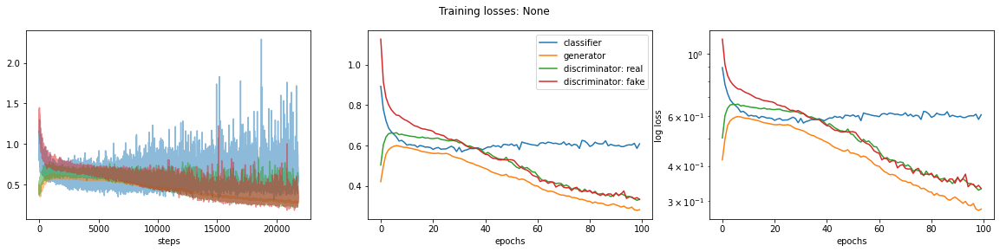

In [27]:
losses_steps = pd.DataFrame({
    'clf': pd.DataFrame(c_loss)[0], 
    'gen': g_loss,
    'dis_real': d_loss1,
    'dis_fake': d_loss2
    })

bat_per_epo = int(data.shape[0] / batch_size) #number of batches per training epoch
n_steps = bat_per_epo * epochs #number of training iterations

plot_losses(losses_steps, bat_per_epo)

Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_301 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_1000 (Dense)           (None, 100)               5200      
_________________________________________________________________
batch_normalization_800 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_400 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_400 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_1001 (Dense)           (None, 100)               10100     
_________________________________________________________________
batch_normalization_801 (Bat (None, 100)             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:199: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


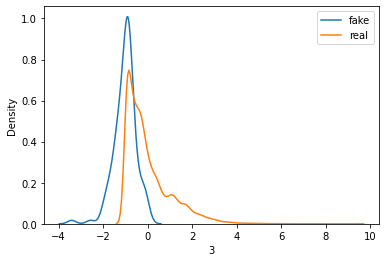

>Saved: drive/My Drive/Thesis/20201101-100453_g_model_02180.h5, and drive/My Drive/Thesis/20201101-100453_c_model_02180.h5


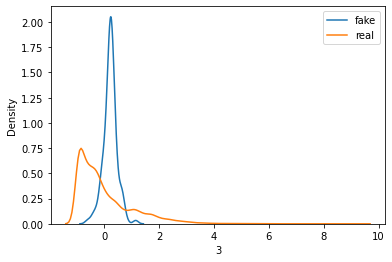

>Saved: drive/My Drive/Thesis/20201101-100754_g_model_04360.h5, and drive/My Drive/Thesis/20201101-100754_c_model_04360.h5


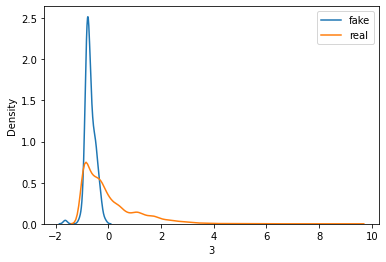

>Saved: drive/My Drive/Thesis/20201101-101058_g_model_06540.h5, and drive/My Drive/Thesis/20201101-101058_c_model_06540.h5


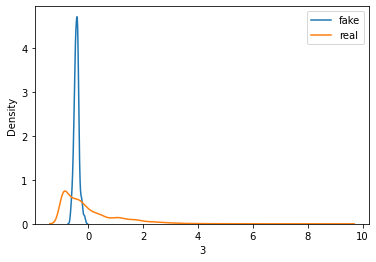

>Saved: drive/My Drive/Thesis/20201101-101401_g_model_08720.h5, and drive/My Drive/Thesis/20201101-101401_c_model_08720.h5


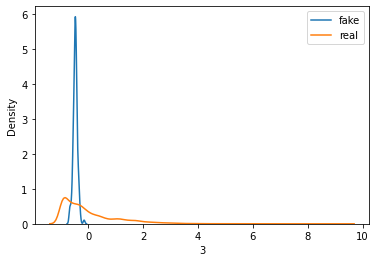

>Saved: drive/My Drive/Thesis/20201101-101703_g_model_10900.h5, and drive/My Drive/Thesis/20201101-101703_c_model_10900.h5


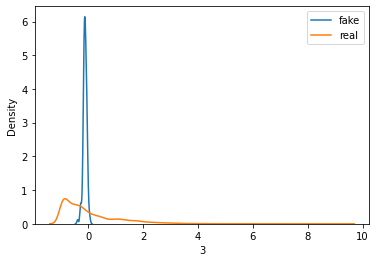

>Saved: drive/My Drive/Thesis/20201101-102005_g_model_13080.h5, and drive/My Drive/Thesis/20201101-102005_c_model_13080.h5


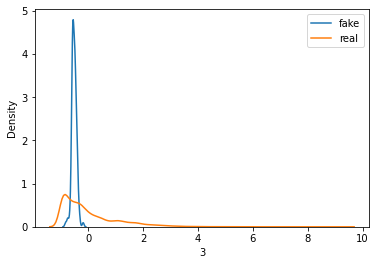

>Saved: drive/My Drive/Thesis/20201101-102308_g_model_15260.h5, and drive/My Drive/Thesis/20201101-102308_c_model_15260.h5


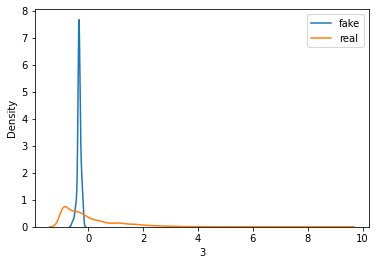

>Saved: drive/My Drive/Thesis/20201101-102611_g_model_17440.h5, and drive/My Drive/Thesis/20201101-102611_c_model_17440.h5


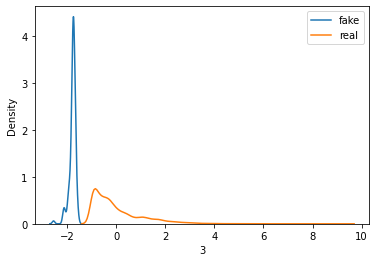

>Saved: drive/My Drive/Thesis/20201101-102918_g_model_19620.h5, and drive/My Drive/Thesis/20201101-102918_c_model_19620.h5


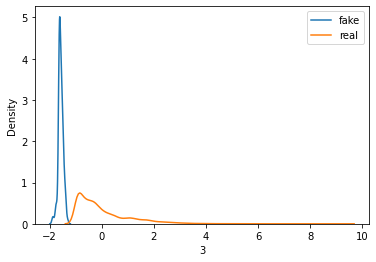

>Saved: drive/My Drive/Thesis/20201101-103217_g_model_21800.h5, and drive/My Drive/Thesis/20201101-103217_c_model_21800.h5



In [25]:
# Compare to unconditional SGAN

gan_uncond = SGAN(data_dim, conditional=False, n_classes=n_classes, noise_dim=noise_dim, learning_rate=learning_rate, dropout=dropout)
c_loss_uncond, g_loss_uncond, d_loss1_uncond, d_loss2_uncond = gan_uncond.train(X_all, y_all, best_feat_idx, n_epochs=epochs, n_batch=batch_size, n_samples=X_a.shape[0], verbose = True, plot_every=10)

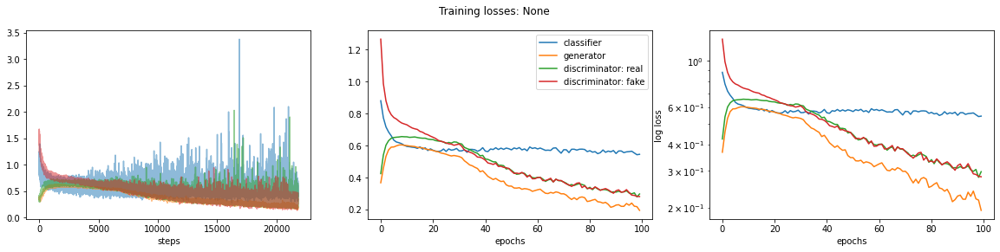

In [29]:
losses_steps_uncond = pd.DataFrame({
    'clf': pd.DataFrame(c_loss_uncond)[0], 
    'gen': g_loss_uncond,
    'dis_real': d_loss1_uncond,
    'dis_fake': d_loss2_uncond
    })

bat_per_epo = int(data.shape[0] / batch_size) #number of batches per training epoch
n_steps = bat_per_epo * epochs #number of training iterations

plot_losses(losses_steps_uncond, bat_per_epo)

In [30]:
scores_cond_LR, fake_data_cond = evaluate_methods(clf="LR", c_model = gan_cond.c_model, g_model = gan_cond.g_model,
                                                  conditional=True, 
                                                  df=df, test=S, target_col=target_col, reject_col=reject_col,
                                                  noise_dim=noise_dim, alpha=alpha, threshold=threshold)

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.986
60th percentile of preds: 0.365
60th percentile of preds: 0.73
                Age        Amount  ...    Purpose_X9           BAD
count  28000.000000  28000.000000  ...  28000.000000  28000.000000
mean       0.453493     -0.076206  ...     -0.139569      0.502464
std        0.039481      0.025407  ...      0.031921      0.500003
min        0.370827     -0.225230  ...     -0.463528      0.000000
25%        0.422855     -0.092937  ...     -0.161368      0.000000
50%        0.465279     -0.079473  ...     -0.152814      1.000000
75%        0.470705     -0.059169  ...     -0.123669      1.000000
max        0.905746     -0.013311  ...     -0.044130      1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.983


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.723
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


In [31]:
scores_cond_RF, fake_data_cond = evaluate_methods(clf="RF", c_model = gan_cond.c_model, g_model = gan_cond.g_model,
                                                  conditional=True, 
                                                  df=df, test=S, target_col=target_col, reject_col=reject_col,
                                                  noise_dim=noise_dim, alpha=alpha, threshold=threshold)

60th percentile of preds: 0.983
60th percentile of preds: 0.365
60th percentile of preds: 0.857
                Age        Amount  ...    Purpose_X9           BAD
count  28000.000000  28000.000000  ...  28000.000000  28000.000000
mean       0.453414     -0.076079  ...     -0.139560      0.498607
std        0.039128      0.025208  ...      0.031691      0.500007
min        0.369722     -0.227191  ...     -0.402004      0.000000
25%        0.422510     -0.092676  ...     -0.161433      0.000000
50%        0.465306     -0.079183  ...     -0.152910      0.000000
75%        0.470687     -0.059015  ...     -0.123616      1.000000
max        0.813306     -0.013902  ...     -0.044949      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.983
60th percentile of preds: 0.857
60th percentile of preds: 0.983


In [30]:
scores_uncond_LR, fake_data_uncond = evaluate_methods(clf="LR", c_model = gan_uncond.c_model, g_model = gan_uncond.g_model,
                                                      conditional=False, 
                                                      df=df, test=S, target_col=target_col, reject_col=reject_col,
                                                      noise_dim=noise_dim, alpha=alpha, threshold=threshold)

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.986
60th percentile of preds: 0.843
60th percentile of preds: 0.994
                Age        Amount  ...    Purpose_X9      BAD
count  28000.000000  28000.000000  ...  28000.000000  28000.0
mean      -2.020300     -1.491247  ...     -0.775480      1.0
std        0.116424      0.107666  ...      0.063052      0.0
min       -2.739908     -2.427309  ...     -1.295163      1.0
25%       -2.085485     -1.531146  ...     -0.806460      1.0
50%       -2.045361     -1.483877  ...     -0.770459      1.0
75%       -1.956566     -1.438347  ...     -0.734492      1.0
max       -1.389659     -1.004809  ...     -0.542656      1.0

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.986
60th percentile of preds: 0.994
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


In [31]:
scores_uncond_RF, fake_data_uncond = evaluate_methods(clf="RF", c_model = gan_uncond.c_model, g_model = gan_uncond.g_model,
                                                      conditional=False, 
                                                      df=df, test=S, target_col=target_col, reject_col=reject_col,
                                                      noise_dim=noise_dim, alpha=alpha, threshold=threshold)

60th percentile of preds: 0.983
60th percentile of preds: 0.843
60th percentile of preds: 0.983
                Age        Amount  ...    Purpose_X9      BAD
count  28000.000000  28000.000000  ...  28000.000000  28000.0
mean      -2.021685     -1.490644  ...     -0.774965      1.0
std        0.115720      0.106104  ...      0.062543      0.0
min       -2.561845     -2.289920  ...     -1.267794      1.0
25%       -2.085755     -1.531373  ...     -0.806514      1.0
50%       -2.046370     -1.483626  ...     -0.769897      1.0
75%       -1.959651     -1.438160  ...     -0.734322      1.0
max       -1.376762     -1.007792  ...     -0.540975      1.0

[8 rows x 52 columns]
60th percentile of preds: 0.977
60th percentile of preds: 0.983
60th percentile of preds: 0.983


In [32]:
print(scores_cond_LR)
print(scores_cond_RF)

          benchmark  method_1  method_2  method_3  method_all    oracle
accuracy   0.960020  0.225387  0.489755  0.960020    0.489255  0.960020
AUC_ROC    0.662884  0.643233  0.677987  0.661088    0.677824  0.686641
AUC_PR     0.083030  0.081803  0.084218  0.085714    0.083934  0.085613
BS         0.038029  0.431197  0.428909  0.037895    0.428018  0.037925
ABR        0.019975  0.016230  0.012484  0.022472    0.012484  0.014981
RGR        0.946667  0.944167  0.941667  0.948333    0.941667  0.943333
          benchmark  method_1  method_2  method_3  method_all    oracle
accuracy   0.959520  0.225387  0.492254  0.959520    0.492254  0.960020
AUC_ROC    0.622374  0.643233  0.624499  0.626789    0.615083  0.648331
AUC_PR     0.060717  0.081803  0.055927  0.058095    0.052362  0.072577
BS         0.039622  0.431197  0.445305  0.039713    0.446050  0.039358
ABR        0.021077  0.016230  0.021118  0.019978    0.021144  0.022782
RGR        0.945946  0.944167  0.947324  0.943636    0.947368  0

In [34]:
print(scores_uncond_LR)
print(scores_uncond_RF)

          benchmark  method_1  method_2  method_3  method_all    oracle
accuracy   0.960020  0.779110  0.851574  0.959520    0.852074  0.960020
AUC_ROC    0.662884  0.630368  0.681826  0.661914    0.681904  0.686641
AUC_PR     0.083030  0.072295  0.084841  0.079710    0.084960  0.085613
BS         0.038029  0.134700  0.109674  0.038453    0.109803  0.037925
ABR        0.019975  0.019975  0.012484  0.023720    0.011236  0.014981
RGR        0.946667  0.946667  0.941667  0.949167    0.940833  0.943333
          benchmark  method_1  method_2  method_3  method_all    oracle
accuracy   0.959520  0.779110  0.856572  0.959520    0.856572  0.960020
AUC_ROC    0.622374  0.630368  0.656507  0.633866    0.652079  0.648331
AUC_PR     0.060717  0.072295  0.079184  0.066946    0.075262  0.072577
BS         0.039622  0.134700  0.110436  0.040022    0.110102  0.039358
ABR        0.021077  0.019975  0.020631  0.024600    0.022619  0.022782
RGR        0.945946  0.946667  0.946474  0.949495    0.947459  0

### 5. Acceptance loop

In [ ]:
# Finetuning the GAN in each epoch

def acceptance_loop(clf, # choice of classifier 
                    train, test, # input data
                    target_col, reject_col, feat_idx,
                    n_0, n, h, alpha, j_max, # input parameters
                    conditional, noise_dim, learning_rate, dropout, max_epochs, batch_size # GAN arguments
                    ):

    if (clf == "LR"):
        clf_0 = LogisticRegression(penalty='l1', C=0.9, solver='saga', n_jobs=-1)           
    elif (clf == "RF"):
        clf_0 = RandomForestClassifier(n_estimators = 300, min_samples_leaf = 1, max_features = 'sqrt', 
                                       bootstrap = True, random_state = seed, n_jobs=2)  
    else :
        raise ValueError("choose clf from [LR, RF]")
                             
    benchmark = pd.DataFrame(columns=metrics, index=(j for j in range(j_max)))
    method_1 = pd.DataFrame(columns=metrics, index=(j for j in range(j_max)))
    method_2 = pd.DataFrame(columns=metrics, index=(j for j in range(j_max)))
    method_3 = pd.DataFrame(columns=metrics, index=(j for j in range(j_max)))
    method_all = pd.DataFrame(columns=metrics, index=(j for j in range(j_max)))
    oracle = pd.DataFrame(columns=metrics, index=(j for j in range(j_max)))

    # get data for first batch
    df_0 = train[:n_0]
    D_a_0 = df_0[df_0[reject_col]==0]
    D_a_0, _ = X_y_split(D_a_0, reject_col)
    D_r_0 = df_0[df_0[reject_col]==1]
    D_r_0, _ = X_y_split(D_r_0, reject_col)
    D_r_0[target_col] = np.where(1==1, np.nan, np.nan) #remove labels from rejects
    D_all_0 = D_a_0.append(D_r_0) #all data
    X_all_0, y_all_0 = X_y_split(D_all_0, target_col)
    df_all, _ = X_y_split(train, reject_col) #for next rounds

    X_test, y_test = X_y_split(test, target_col)

    # initialize and pre-train GAN
    data_dim = X_test.shape[1]
    gan = SGAN(data_dim, conditional, n_classes=2, noise_dim=noise_dim, learning_rate=learning_rate, dropout=dropout)
    gan.train(X_all_0, y_all_0, feat_idx, n_epochs = max_epochs, n_batch = batch_size, n_samples = D_a_0.shape[0], verbose = True, plot_every=10)
    
    timestamp = time.strftime('%Y%m%d%-%H')
    filename_c = timestamp + '_c_model_init.h5'
    filename_g = timestamp + '_g_model_init.h5'
    gan.c_model.save(filename_c)
    gan.g_model.save(filename_g)


    for j in range(0, j_max):
      
        # prepare data; make sure y_r is missing
        X_a_j, y_a_j = X_y_split(D_a_0, target_col)

        # check dimensions
        print('\n> iteration %d: #accepts %d' % (j+1, X_a_j.shape[0]))

        scores_j, _ = evaluate_methods(clf=clf, c_model=gan.c_model, g_model=gan.g_model, conditional=conditional, 
                                       df=train[:n_0 + j*n], test=test, target_col=target_col, reject_col=reject_col,
                                       noise_dim=noise_dim, alpha=alpha, threshold=threshold)
        scores_j = scores_j.transpose()
        scores_j.to_csv("scores_iter_" + str(j) + clf + ".csv")
        benchmark.iloc[j] = scores_j.iloc[0]
        method_1.iloc[j] = scores_j.iloc[1]
        method_2.iloc[j] = scores_j.iloc[2]
        method_3.iloc[j] = scores_j.iloc[3]
        method_all.iloc[j] = scores_j.iloc[4]
        oracle.iloc[j] = scores_j.iloc[5]
   
        # fetch new applications in this round from the original sampling
        df_j = df_all[n_0+j*n : n_0+(j+1)*n]
        X_j, y_j = X_y_split(df_j, target_col)

        # predict with benchmark model on X_j
        clf_0.fit(X_a_j, y_a_j) 
        y_pred = clf_0.predict_proba(X_j)[:,1] # probability of default

        # make decision to accept or reject based on predicted probability
        tao = np.percentile(y_pred, q = alpha*100)

        # want the lowest alpha% to be accepted, rest rejected
        D_a_j = X_j[y_pred <= tao]
        D_r_j = X_j[y_pred > tao]

        # observe repayment behaviour for accepts (ground truth)
        D_a_j[target_col] = y_j[y_pred <= tao]
        # remove labels of rejects
        D_r_j[target_col] = np.where(1==1, np.nan, np.nan)
        D_new_j = D_a_j.append(D_r_j)
        X_new_j, y_new_j = X_y_split(D_new_j, target_col)
        y_new_j[1] = 1 # to have at least one bad
        print("iter " + str(j) +": \ntao: " + str(tao) +"\naccepts: " + str(D_a_j.shape[0]) + " with " + str(sum(D_a_j[target_col])/D_a_j.shape[0]) + "% bad")

        # train GAN on new data only
        epochs_j = max(10, int(math.ceil((max_epochs-10-(j**0.9))/5) * 5)) # diminishing function, rounded up to nearest 5
        gan.train(X_new_j, y_new_j, feat_idx, n_epochs = epochs_j, n_batch = batch_size, n_samples = X_new_j.shape[0], verbose = True, plot_every=10)

        # save GAN for later comparisons
        filename_c = timestamp + '_c_model_iter_' + str(j) + '.h5'
        filename_g = timestamp + '_g_model_iter_' + str(j) + '.h5'
        gan.c_model.save(filename_c)
        gan.g_model.save(filename_g)

        # append
        D_a_0 = D_a_0.append(D_a_j)
        D_r_0 = D_r_0.append(D_r_j)
        D_all_0 = D_all_0.append(D_a_j)
        D_all_0 = D_all_0.append(D_r_j)

    return D_all_0, gan.c_model, gan.g_model, benchmark, method_1, method_2, method_3, method_all, oracle

In [ ]:
# retraining the GAN in each iteration

def acceptance_loop_retrain(clf, # choice of classifier 
                            train, test, # input data
                            target_col, reject_col, feat_idx,
                            n_0, n, h, alpha, j_max, # input parameters
                            conditional, noise_dim, learning_rate, dropout, max_epochs, batch_size # GAN arguments
                            ):

    if (clf == "LR"):
        clf_0 = LogisticRegression(penalty='l1', C=0.9, solver='saga', n_jobs=-1)           
    elif (clf == "RF"):
        clf_0 = RandomForestClassifier(n_estimators = 300, min_samples_leaf = 1, max_features = 'sqrt', 
                                       bootstrap = True, random_state = seed, n_jobs=2)  
    else :
        raise ValueError("choose clf from [LR, RF]")
                             
    benchmark = pd.DataFrame(columns=metrics, index=(j for j in range(j_max)))
    method_1 = pd.DataFrame(columns=metrics, index=(j for j in range(j_max)))
    method_2 = pd.DataFrame(columns=metrics, index=(j for j in range(j_max)))
    method_3 = pd.DataFrame(columns=metrics, index=(j for j in range(j_max)))
    method_all = pd.DataFrame(columns=metrics, index=(j for j in range(j_max)))
    oracle = pd.DataFrame(columns=metrics, index=(j for j in range(j_max)))

    # get data for first batch
    df_0 = train[:n_0]
    D_a_0 = df_0[df_0[reject_col]==0]
    D_a_0, _ = X_y_split(D_a_0, reject_col)
    D_r_0 = df_0[df_0[reject_col]==1]
    D_r_0, _ = X_y_split(D_r_0, reject_col)
    D_r_0[target_col] = np.where(1==1, np.nan, np.nan) #remove labels from rejects
    D_all_0 = D_a_0.append(D_r_0) #all data
    df_all, _ = X_y_split(train, reject_col) #for next rounds

    X_test, y_test = X_y_split(test, target_col)

    # initialize and pre-train GAN
    data_dim = X_test.shape[1]
    timestamp = time.strftime('%Y%m%d%-%H')

    for j in range(1, j_max):

        # prepare data; make sure y_r is missing
        X_a_j, y_a_j = X_y_split(D_a_0, target_col)
        X_all_j, y_all_j = X_y_split(D_all_0, target_col)

        # check dimensions
        print('\n> iteration %d: #accepts %d' % (j, X_a_j.shape[0]))

        # train GAN from scratch in each round
        gan = SGAN(data_dim, conditional, n_classes=2, noise_dim=noise_dim, learning_rate=learning_rate, dropout=dropout)
        gan.train(X_all_j, y_all_j, feat_idx, n_epochs = max_epochs, n_batch = batch_size, n_samples = X_a_j.shape[0], verbose = False, plot_every=10)

        # save GAN for later comparisons
        filename_c = timestamp + '_c_model_iter_' + str(j) + '.h5'
        filename_g = timestamp + '_g_model_iter_' + str(j) + '.h5'
        gan.c_model.save(filename_c)
        gan.g_model.save(filename_g)
  
        # evalute
        scores_j, _ = evaluate_methods(clf=clf, c_model=gan.c_model, g_model=gan.g_model, conditional=conditional, 
                                       df=train[:n_0 + (j-1)*n], test=test, target_col=target_col, reject_col=reject_col,
                                       noise_dim=noise_dim, alpha=alpha, threshold=threshold)
        scores_j = scores_j.transpose()
        scores_j.to_csv("scores_iter_" + str(j) + clf + ".csv")
        benchmark.iloc[j-1] = scores_j.iloc[0]
        method_1.iloc[j-1] = scores_j.iloc[1]
        method_2.iloc[j-1] = scores_j.iloc[2]
        method_3.iloc[j-1] = scores_j.iloc[3]
        method_all.iloc[j-1] = scores_j.iloc[4]
        oracle.iloc[j-1] = scores_j.iloc[5]
   
        # fetch new applications in this round from the original sampling
        df_j = df_all[n_0+(j-1)*n : n_0+j*n]
        X_j, y_j = X_y_split(df_j, target_col)

        # predict with benchmark model on X_j
        clf_0.fit(X_a_j, y_a_j) 
        y_pred = clf_0.predict_proba(X_j)[:,1] # probability of default

        # make decision to accept or reject based on predicted probability
        tao = np.percentile(y_pred, q = alpha*100)

        # want the lowest alpha% to be accepted, rest rejected
        D_a_j = X_j[y_pred <= tao]
        D_r_j = X_j[y_pred > tao]

        # observe repayment behaviour for accepts (ground truth)
        D_a_j[target_col] = y_j[y_pred <= tao]
        # remove labels of rejects
        D_r_j[target_col] = np.where(1==1, np.nan, np.nan)
        D_new_j = D_a_j.append(D_r_j)
        X_new_j, y_new_j = X_y_split(D_new_j, target_col)
        y_new_j[1] = 1 # to have at least one bad
        print("iter " + str(j) +": \ntao: " + str(tao) +"\naccepts: " + str(D_a_j.shape[0]) + " with " + str(sum(D_a_j[target_col])/D_a_j.shape[0]) + "% bad")

        # append
        D_a_0 = D_a_0.append(D_a_j)
        D_r_0 = D_r_0.append(D_r_j)
        D_all_0 = D_all_0.append(D_a_j)
        D_all_0 = D_all_0.append(D_r_j)

    return D_all_0, gan.c_model, gan.g_model, benchmark, method_1, method_2, method_3, method_all, oracle

In [8]:
metrics = ["accuracy","AUC_ROC","AUC_PR","BS","ABR","RGR"]

#### Synthetic data

Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 12)]              0         
_________________________________________________________________
dense (Dense)                (None, 100)               1300      
_________________________________________________________________
batch_normalization (BatchNo (None, 100)               400       
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 100)               0         
_________________________________________________________________
dropout (Dropout)            (None, 100)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               10100     
_________________________________________________________________
batch_normalization_1 (Batch (None, 100)             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:199: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


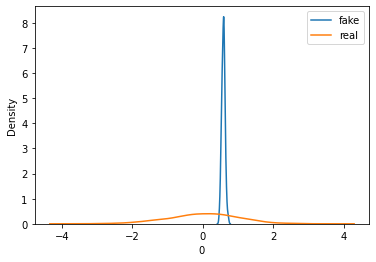

>Saved: drive/My Drive/GANs/synthetic/20201102-140212_g_model_00150.h5, and drive/My Drive/GANs/synthetic/20201102-140212_c_model_00150.h5


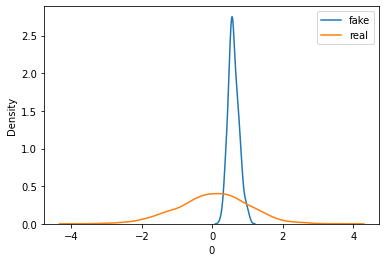

>Saved: drive/My Drive/GANs/synthetic/20201102-140254_g_model_00300.h5, and drive/My Drive/GANs/synthetic/20201102-140254_c_model_00300.h5


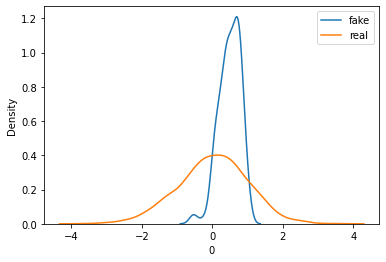

>Saved: drive/My Drive/GANs/synthetic/20201102-140308_g_model_00450.h5, and drive/My Drive/GANs/synthetic/20201102-140308_c_model_00450.h5


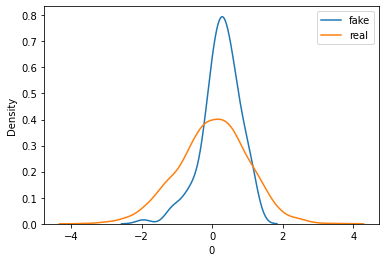

>Saved: drive/My Drive/GANs/synthetic/20201102-140322_g_model_00600.h5, and drive/My Drive/GANs/synthetic/20201102-140322_c_model_00600.h5


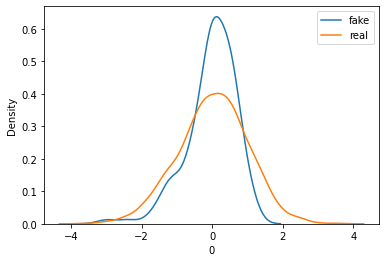

>Saved: drive/My Drive/GANs/synthetic/20201102-140336_g_model_00750.h5, and drive/My Drive/GANs/synthetic/20201102-140336_c_model_00750.h5


> iteration 1: #accepts 818
60th percentile of preds: 0.942
60th percentile of preds: 0.613
60th percentile of preds: 0.956
            feat_1       feat_2  ...  gender_Male       TARGET
count  2000.000000  2000.000000  ...  2000.000000  2000.000000
mean     -0.006680     0.571556  ...     0.140841     0.483000
std       0.668423     0.538151  ...     0.474663     0.499836
min      -4.942341    -1.215598  ...    -1.896997     0.000000
25%      -0.365823     0.230096  ...    -0.169855     0.000000
50%       0.099968     0.556062  ...     0.138991     0.000000
75%       0.454599     0.873453  ...     0.456938     1.000000
max       1.394984     3.203825  ...     1.962437     1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.809
60th percentile of preds: 0.718
60th percentile of preds: 0.961
iter 0: 
tao: 0.06605216362375528
accepts: 400 wi

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

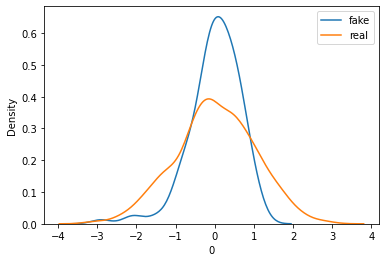

>Saved: drive/My Drive/GANs/synthetic/20201102-140345_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-140345_c_model_00070.h5


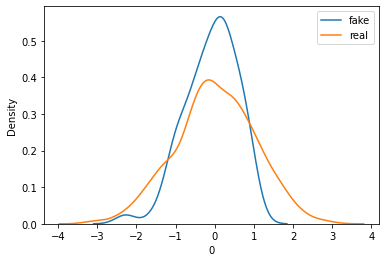

>Saved: drive/My Drive/GANs/synthetic/20201102-140352_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-140352_c_model_00140.h5


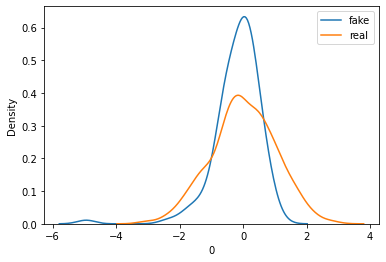

>Saved: drive/My Drive/GANs/synthetic/20201102-140359_g_model_00210.h5, and drive/My Drive/GANs/synthetic/20201102-140359_c_model_00210.h5


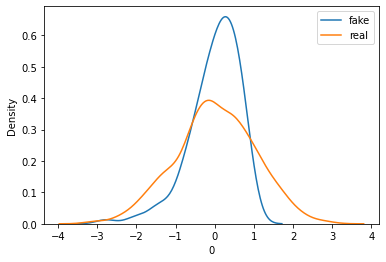

>Saved: drive/My Drive/GANs/synthetic/20201102-140406_g_model_00280.h5, and drive/My Drive/GANs/synthetic/20201102-140406_c_model_00280.h5


> iteration 2: #accepts 1218
60th percentile of preds: 0.937
60th percentile of preds: 0.553
60th percentile of preds: 0.877
            feat_1       feat_2  ...  gender_Male       TARGET
count  3000.000000  3000.000000  ...  3000.000000  3000.000000
mean     -0.113332     0.494867  ...     0.204400     0.500000
std       0.726442     0.550009  ...     0.486227     0.500083
min      -5.505750    -1.208768  ...    -2.129476     0.000000
25%      -0.485255     0.144534  ...    -0.113209     0.000000
50%       0.012515     0.481323  ...     0.201751     0.500000
75%       0.384424     0.808061  ...     0.514314     1.000000
max       1.246654     4.038852  ...     2.932745     1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.807
60th percentile of preds: 0.611


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.958
iter 1: 
tao: 0.0646828624767074
accepts: 400 with 0.0375% bad
(1000, 12) (1000,)
n_epochs=40, n_batch=128, 1/2=64, b/e=7, steps=280


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

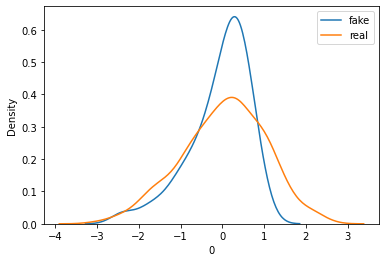

>Saved: drive/My Drive/GANs/synthetic/20201102-140416_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-140416_c_model_00070.h5


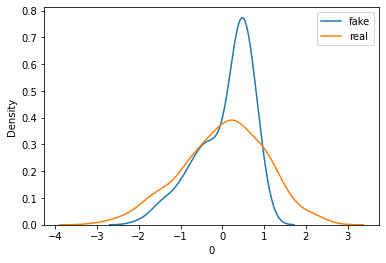

>Saved: drive/My Drive/GANs/synthetic/20201102-140422_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-140422_c_model_00140.h5


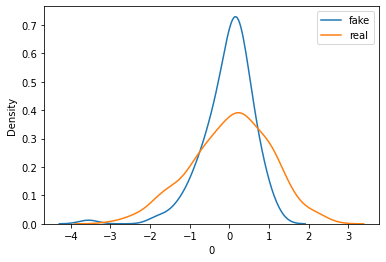

>Saved: drive/My Drive/GANs/synthetic/20201102-140429_g_model_00210.h5, and drive/My Drive/GANs/synthetic/20201102-140429_c_model_00210.h5


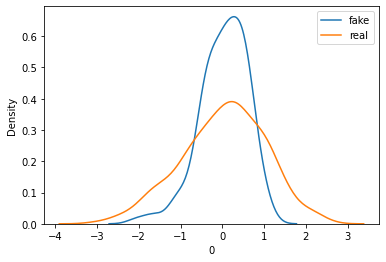

>Saved: drive/My Drive/GANs/synthetic/20201102-140436_g_model_00280.h5, and drive/My Drive/GANs/synthetic/20201102-140436_c_model_00280.h5


> iteration 3: #accepts 1618


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.939
60th percentile of preds: 0.511
60th percentile of preds: 0.837
            feat_1       feat_2  ...  gender_Male       TARGET
count  4000.000000  4000.000000  ...  4000.000000  4000.000000
mean     -0.018243     0.391736  ...     0.320872     0.489000
std       0.627810     0.514554  ...     0.460141     0.499941
min      -4.143776    -1.852837  ...    -1.729782     0.000000
25%      -0.344280     0.058535  ...     0.031230     0.000000
50%       0.074191     0.393918  ...     0.305315     0.000000
75%       0.418174     0.715697  ...     0.603743     1.000000
max       1.611860     2.918112  ...     2.411294     1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.813
60th percentile of preds: 0.569


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolea

60th percentile of preds: 0.956
iter 2: 
tao: 0.0756861495505738
accepts: 400 with 0.04% bad
(1000, 12) (1000,)
n_epochs=40, n_batch=128, 1/2=64, b/e=7, steps=280


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:199: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


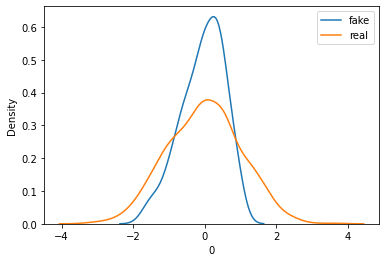

>Saved: drive/My Drive/GANs/synthetic/20201102-140445_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-140445_c_model_00070.h5


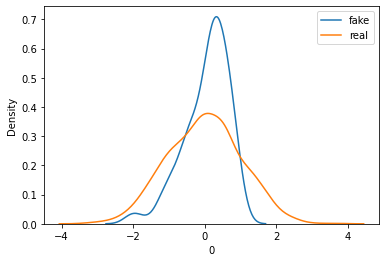

>Saved: drive/My Drive/GANs/synthetic/20201102-140452_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-140452_c_model_00140.h5


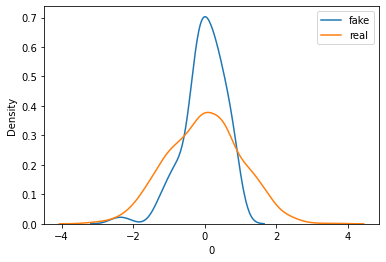

>Saved: drive/My Drive/GANs/synthetic/20201102-140459_g_model_00210.h5, and drive/My Drive/GANs/synthetic/20201102-140459_c_model_00210.h5


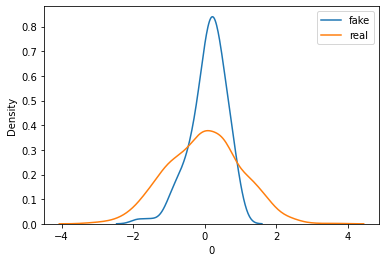

>Saved: drive/My Drive/GANs/synthetic/20201102-140506_g_model_00280.h5, and drive/My Drive/GANs/synthetic/20201102-140506_c_model_00280.h5


> iteration 4: #accepts 2018


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.946
60th percentile of preds: 0.533
60th percentile of preds: 0.868
            feat_1       feat_2  ...  gender_Male       TARGET
count  5000.000000  5000.000000  ...  5000.000000  5000.000000
mean      0.085028     0.371161  ...     0.347730     0.501000
std       0.571668     0.491918  ...     0.450842     0.500049
min      -3.150536    -1.662414  ...    -2.378241     0.000000
25%      -0.217976     0.054698  ...     0.076559     0.000000
50%       0.170904     0.384719  ...     0.342327     1.000000
75%       0.479696     0.687241  ...     0.615777     1.000000
max       1.770616     3.023218  ...     3.194858     1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.795
60th percentile of preds: 0.607


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolea

60th percentile of preds: 0.953
iter 3: 
tao: 0.07502081292016341
accepts: 400 with 0.0325% bad
(1000, 12) (1000,)
n_epochs=40, n_batch=128, 1/2=64, b/e=7, steps=280


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:199: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


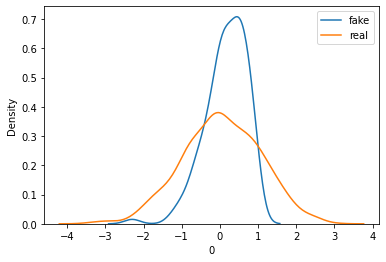

>Saved: drive/My Drive/GANs/synthetic/20201102-140516_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-140516_c_model_00070.h5


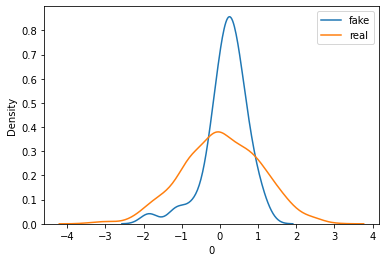

>Saved: drive/My Drive/GANs/synthetic/20201102-140522_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-140522_c_model_00140.h5


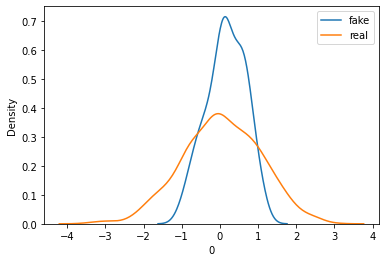

>Saved: drive/My Drive/GANs/synthetic/20201102-140529_g_model_00210.h5, and drive/My Drive/GANs/synthetic/20201102-140529_c_model_00210.h5


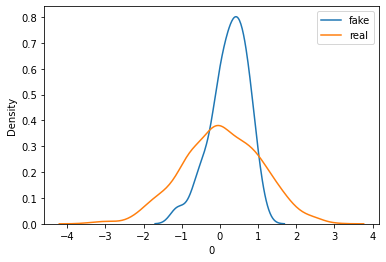

>Saved: drive/My Drive/GANs/synthetic/20201102-140536_g_model_00280.h5, and drive/My Drive/GANs/synthetic/20201102-140536_c_model_00280.h5


> iteration 5: #accepts 2418


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.944
60th percentile of preds: 0.511
60th percentile of preds: 0.823
            feat_1       feat_2  ...  gender_Male       TARGET
count  6000.000000  6000.000000  ...  6000.000000  6000.000000
mean      0.144448     0.285399  ...     0.447813     0.502833
std       0.518494     0.479983  ...     0.438915     0.500034
min      -3.219624    -1.716313  ...    -1.501833     0.000000
25%      -0.144503    -0.030608  ...     0.164502     0.000000
50%       0.212781     0.310896  ...     0.435281     1.000000
75%       0.501958     0.610112  ...     0.706508     1.000000
max       1.636527     2.506891  ...     3.026295     1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.804
60th percentile of preds: 0.57


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
iter 4: 
tao: 0.07491758341465113
accepts: 400 with 0.025% bad
(1000, 12) (1000,)
n_epochs=40, n_batch=128, 1/2=64, b/e=7, steps=280


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

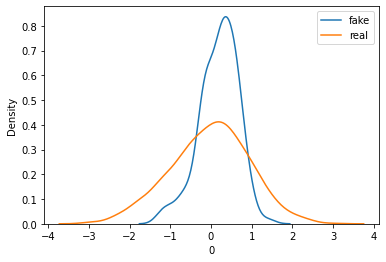

>Saved: drive/My Drive/GANs/synthetic/20201102-140546_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-140546_c_model_00070.h5


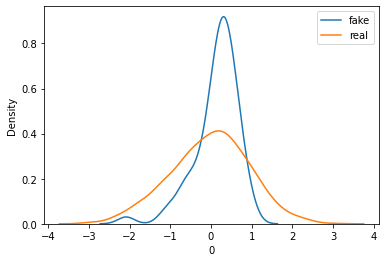

>Saved: drive/My Drive/GANs/synthetic/20201102-140553_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-140553_c_model_00140.h5


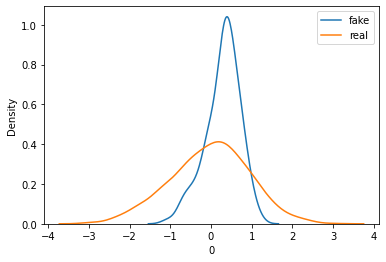

>Saved: drive/My Drive/GANs/synthetic/20201102-140559_g_model_00210.h5, and drive/My Drive/GANs/synthetic/20201102-140559_c_model_00210.h5


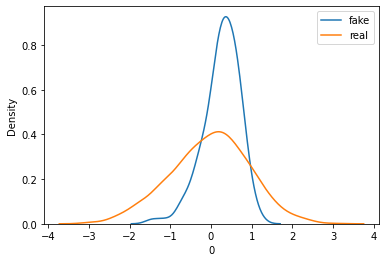

>Saved: drive/My Drive/GANs/synthetic/20201102-140606_g_model_00280.h5, and drive/My Drive/GANs/synthetic/20201102-140606_c_model_00280.h5


> iteration 6: #accepts 2818
60th percentile of preds: 0.942
60th percentile of preds: 0.512
60th percentile of preds: 0.781
            feat_1       feat_2  ...  gender_Male       TARGET
count  7000.000000  7000.000000  ...  7000.000000  7000.000000
mean      0.228301     0.242780  ...     0.510587     0.508143
std       0.458776     0.462268  ...     0.418974     0.499969
min      -3.994521    -2.345001  ...    -1.692173     0.000000
25%      -0.019006    -0.048733  ...     0.236694     0.000000
50%       0.282720     0.268932  ...     0.489930     1.000000
75%       0.533679     0.558002  ...     0.759771     1.000000
max       1.875065     2.392277  ...     2.649139     1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.779
60th percentile of preds: 0.541


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolea

60th percentile of preds: 0.954
iter 5: 
tao: 0.07046113199631361
accepts: 400 with 0.0325% bad
(1000, 12) (1000,)
n_epochs=40, n_batch=128, 1/2=64, b/e=7, steps=280


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:199: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


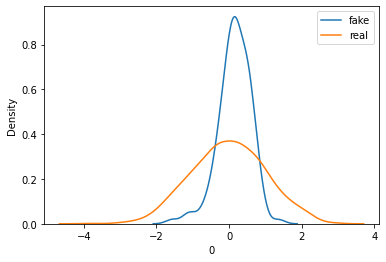

>Saved: drive/My Drive/GANs/synthetic/20201102-140616_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-140616_c_model_00070.h5


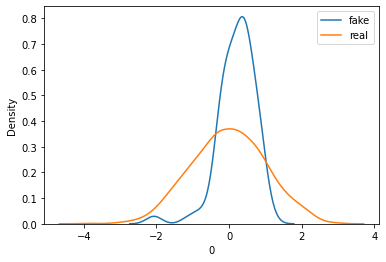

>Saved: drive/My Drive/GANs/synthetic/20201102-140623_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-140623_c_model_00140.h5


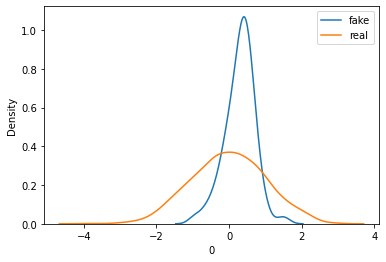

>Saved: drive/My Drive/GANs/synthetic/20201102-140630_g_model_00210.h5, and drive/My Drive/GANs/synthetic/20201102-140630_c_model_00210.h5


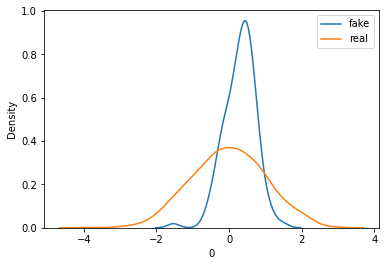

>Saved: drive/My Drive/GANs/synthetic/20201102-140637_g_model_00280.h5, and drive/My Drive/GANs/synthetic/20201102-140637_c_model_00280.h5


> iteration 7: #accepts 3218
60th percentile of preds: 0.945
60th percentile of preds: 0.522
60th percentile of preds: 0.771
            feat_1       feat_2  ...  gender_Male       TARGET
count  8000.000000  8000.000000  ...  8000.000000  8000.000000
mean      0.290982     0.232750  ...     0.542920     0.503375
std       0.420096     0.438336  ...     0.407197     0.500020
min      -2.029248    -3.518824  ...    -1.599866     0.000000
25%       0.046022    -0.046103  ...     0.274477     0.000000
50%       0.323605     0.259019  ...     0.523987     1.000000
75%       0.572671     0.525116  ...     0.779473     1.000000
max       2.050551     3.585488  ...     3.266611     1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.79
60th percentile of preds: 0.606


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


60th percentile of preds: 0.954
iter 6: 
tao: 0.07598086950210321
accepts: 400 with 0.0225% bad
(1000, 12) (1000,)
n_epochs=35, n_batch=128, 1/2=64, b/e=7, steps=245


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:199: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


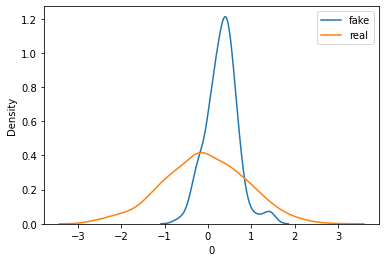

>Saved: drive/My Drive/GANs/synthetic/20201102-140647_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-140647_c_model_00070.h5


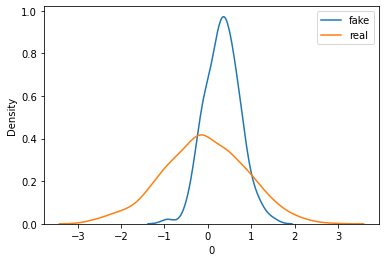

>Saved: drive/My Drive/GANs/synthetic/20201102-140654_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-140654_c_model_00140.h5


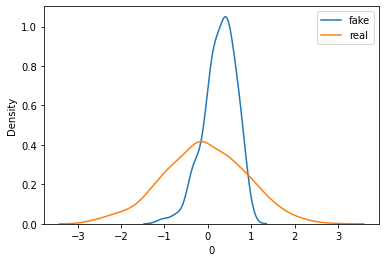

>Saved: drive/My Drive/GANs/synthetic/20201102-140701_g_model_00210.h5, and drive/My Drive/GANs/synthetic/20201102-140701_c_model_00210.h5


> iteration 8: #accepts 3618
60th percentile of preds: 0.947
60th percentile of preds: 0.518
60th percentile of preds: 0.764
            feat_1       feat_2  ...  gender_Male       TARGET
count  9000.000000  9000.000000  ...  9000.000000  9000.000000
mean      0.320288     0.242327  ...     0.591180     0.497444
std       0.388962     0.425107  ...     0.408152     0.500021
min      -1.799949    -2.579150  ...    -1.412576     0.000000
25%       0.097372    -0.030666  ...     0.326059     0.000000
50%       0.345424     0.265416  ...     0.567296     0.000000
75%       0.575379     0.525643  ...     0.818708     1.000000
max       2.158360     2.502109  ...     3.459970     1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.775
60th percentile of preds: 0.599


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolea

60th percentile of preds: 0.955
iter 7: 
tao: 0.07250639242680139
accepts: 400 with 0.025% bad
(1000, 12) (1000,)
n_epochs=35, n_batch=128, 1/2=64, b/e=7, steps=245


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:199: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


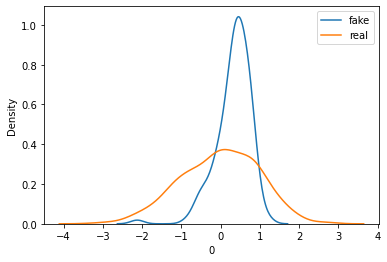

>Saved: drive/My Drive/GANs/synthetic/20201102-140715_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-140715_c_model_00070.h5


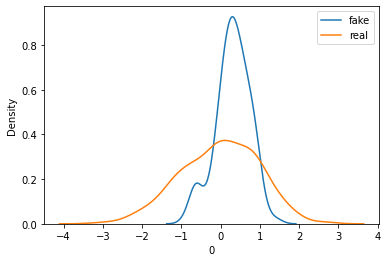

>Saved: drive/My Drive/GANs/synthetic/20201102-140722_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-140722_c_model_00140.h5


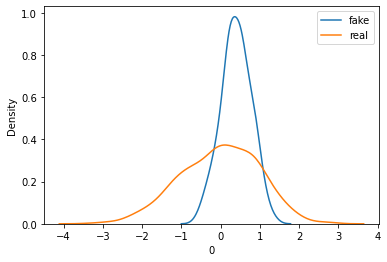

>Saved: drive/My Drive/GANs/synthetic/20201102-140729_g_model_00210.h5, and drive/My Drive/GANs/synthetic/20201102-140729_c_model_00210.h5


> iteration 9: #accepts 4018
60th percentile of preds: 0.948
60th percentile of preds: 0.521
60th percentile of preds: 0.848
             feat_1        feat_2  ...   gender_Male        TARGET
count  10000.000000  10000.000000  ...  10000.000000  10000.000000
mean       0.394920      0.223632  ...      0.627177      0.503100
std        0.373165      0.423274  ...      0.398208      0.500015
min       -1.959767     -2.388985  ...     -1.342278      0.000000
25%        0.170585     -0.043684  ...      0.368012      0.000000
50%        0.408019      0.248600  ...      0.607206      1.000000
75%        0.630795      0.510353  ...      0.854214      1.000000
max        2.106348      2.607357  ...      3.020412      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.779
60th percentile of preds: 0.698


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

iter 8: 
tao: 0.06430714954461651
accepts: 400 with 0.0375% bad
(1000, 12) (1000,)
n_epochs=35, n_batch=128, 1/2=64, b/e=7, steps=245


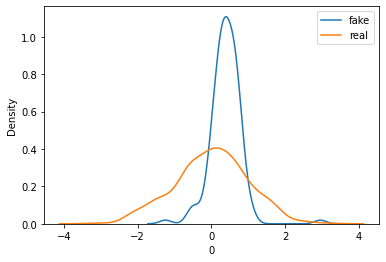

>Saved: drive/My Drive/GANs/synthetic/20201102-140743_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-140743_c_model_00070.h5


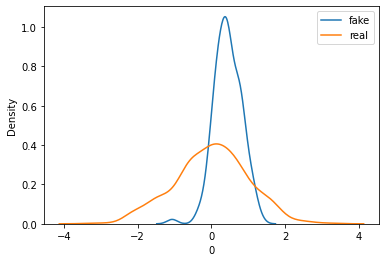

>Saved: drive/My Drive/GANs/synthetic/20201102-140750_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-140750_c_model_00140.h5


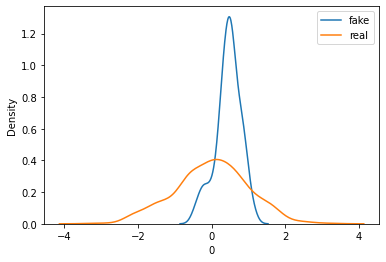

>Saved: drive/My Drive/GANs/synthetic/20201102-140757_g_model_00210.h5, and drive/My Drive/GANs/synthetic/20201102-140757_c_model_00210.h5


> iteration 10: #accepts 4418
60th percentile of preds: 0.951
60th percentile of preds: 0.523
60th percentile of preds: 0.901
             feat_1        feat_2  ...   gender_Male        TARGET
count  11000.000000  11000.000000  ...  11000.000000  11000.000000
mean       0.494292      0.198248  ...      0.650486      0.504909
std        0.353351      0.410914  ...      0.386380      0.499999
min       -2.160210     -2.337771  ...     -1.063614      0.000000
25%        0.283226     -0.062504  ...      0.395515      0.000000
50%        0.499496      0.235106  ...      0.626953      1.000000
75%        0.713309      0.488202  ...      0.878383      1.000000
max        2.100470      1.992465  ...      2.822845      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.784
60th percentile of preds: 0.765


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
iter 9: 
tao: 0.06369463243915834
accepts: 400 with 0.0325% bad
(1000, 12) (1000,)
n_epochs=35, n_batch=128, 1/2=64, b/e=7, steps=245


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

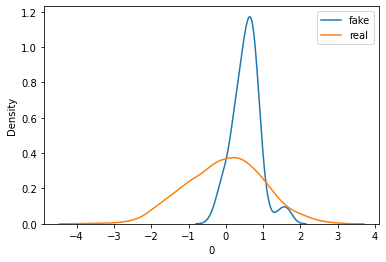

>Saved: drive/My Drive/GANs/synthetic/20201102-140811_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-140811_c_model_00070.h5


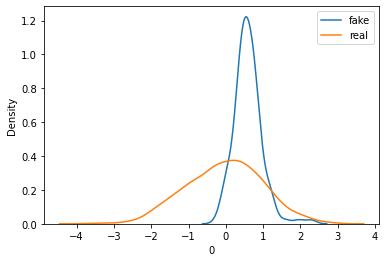

>Saved: drive/My Drive/GANs/synthetic/20201102-140818_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-140818_c_model_00140.h5


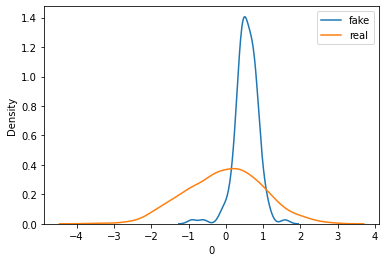

>Saved: drive/My Drive/GANs/synthetic/20201102-140824_g_model_00210.h5, and drive/My Drive/GANs/synthetic/20201102-140824_c_model_00210.h5


> iteration 11: #accepts 4818
60th percentile of preds: 0.951
60th percentile of preds: 0.551
60th percentile of preds: 0.942
             feat_1        feat_2  ...   gender_Male        TARGET
count  12000.000000  12000.000000  ...  12000.000000  12000.000000
mean       0.573340      0.161676  ...      0.676132      0.496250
std        0.343234      0.392287  ...      0.375163      0.500007
min       -1.397186     -2.423321  ...     -1.381725      0.000000
25%        0.362407     -0.086045  ...      0.424456      0.000000
50%        0.579299      0.189490  ...      0.660160      0.000000
75%        0.781065      0.436813  ...      0.897298      1.000000
max        2.446104      3.227439  ...      3.657392      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.79
60th percentile of preds: 0.849


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
iter 10: 
tao: 0.06389870000130812
accepts: 400 with 0.03% bad
(1000, 12) (1000,)
n_epochs=35, n_batch=128, 1/2=64, b/e=7, steps=245


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolea

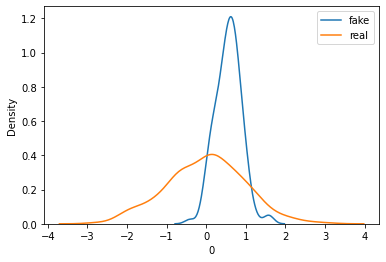

>Saved: drive/My Drive/GANs/synthetic/20201102-140839_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-140839_c_model_00070.h5


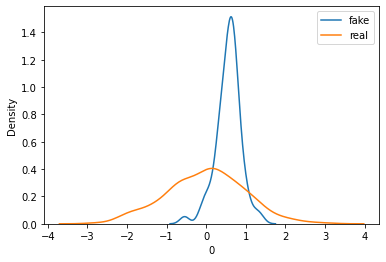

>Saved: drive/My Drive/GANs/synthetic/20201102-140846_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-140846_c_model_00140.h5


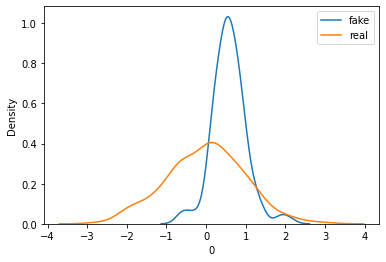

>Saved: drive/My Drive/GANs/synthetic/20201102-140852_g_model_00210.h5, and drive/My Drive/GANs/synthetic/20201102-140852_c_model_00210.h5


> iteration 12: #accepts 5218
60th percentile of preds: 0.951
60th percentile of preds: 0.525
60th percentile of preds: 0.881
             feat_1        feat_2  ...   gender_Male        TARGET
count  13000.000000  13000.000000  ...  13000.000000  13000.000000
mean       0.597636      0.109092  ...      0.669405      0.502923
std        0.333767      0.401806  ...      0.367523      0.500011
min       -1.016622     -3.122451  ...     -1.698546      0.000000
25%        0.395604     -0.134879  ...      0.429175      0.000000
50%        0.596262      0.141218  ...      0.654401      1.000000
75%        0.791157      0.391566  ...      0.884199      1.000000
max        2.549045      2.436699  ...      3.562325      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.782
60th percentile of preds: 0.733


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
iter 11: 
tao: 0.05648497544499616
accepts: 400 with 0.0225% bad
(1000, 12) (1000,)
n_epochs=35, n_batch=128, 1/2=64, b/e=7, steps=245


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

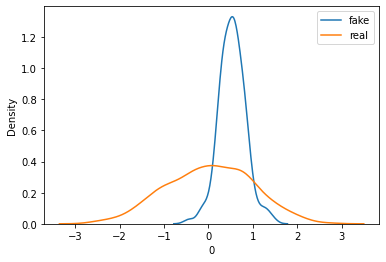

>Saved: drive/My Drive/GANs/synthetic/20201102-140907_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-140907_c_model_00070.h5


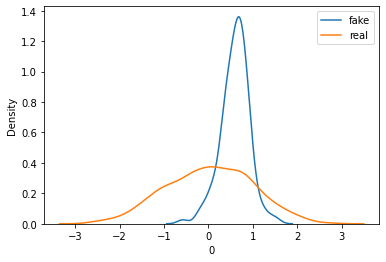

>Saved: drive/My Drive/GANs/synthetic/20201102-140914_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-140914_c_model_00140.h5


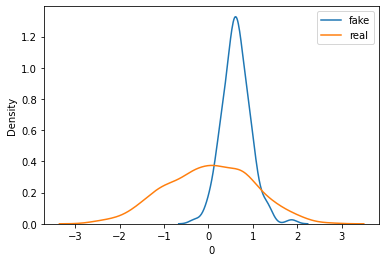

>Saved: drive/My Drive/GANs/synthetic/20201102-140921_g_model_00210.h5, and drive/My Drive/GANs/synthetic/20201102-140921_c_model_00210.h5


> iteration 13: #accepts 5618
60th percentile of preds: 0.95
60th percentile of preds: 0.511
60th percentile of preds: 0.844
             feat_1        feat_2  ...   gender_Male        TARGET
count  14000.000000  14000.000000  ...  14000.000000  14000.000000
mean       0.598652      0.060369  ...      0.655003      0.504643
std        0.326316      0.390728  ...      0.359808      0.499996
min       -1.092160     -3.719667  ...     -1.223409      0.000000
25%        0.402428     -0.175251  ...      0.427371      0.000000
50%        0.599740      0.099490  ...      0.640156      1.000000
75%        0.795050      0.333018  ...      0.864692      1.000000
max        2.621530      2.002839  ...      3.066472      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.79
60th percentile of preds: 0.676
60th percentile of preds: 0.953
iter 12: 
tao

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

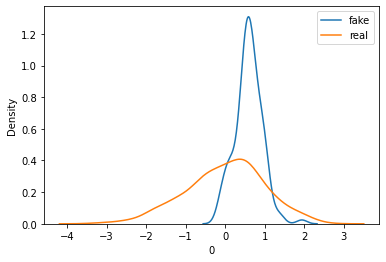

>Saved: drive/My Drive/GANs/synthetic/20201102-140935_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-140935_c_model_00070.h5


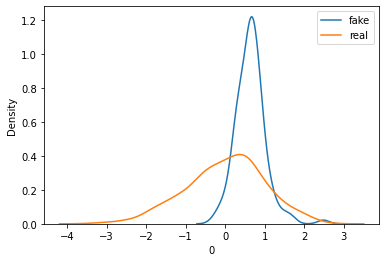

>Saved: drive/My Drive/GANs/synthetic/20201102-140942_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-140942_c_model_00140.h5


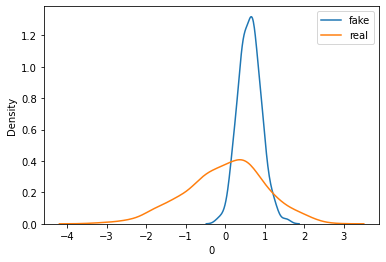

>Saved: drive/My Drive/GANs/synthetic/20201102-140949_g_model_00210.h5, and drive/My Drive/GANs/synthetic/20201102-140949_c_model_00210.h5


> iteration 14: #accepts 6018
60th percentile of preds: 0.949
60th percentile of preds: 0.529
60th percentile of preds: 0.904
             feat_1        feat_2  ...   gender_Male        TARGET
count  15000.000000  15000.000000  ...  15000.000000  15000.000000
mean       0.622976      0.068952  ...      0.692352      0.498000
std        0.321027      0.378097  ...      0.360262      0.500013
min       -1.248362     -2.673885  ...     -1.160204      0.000000
25%        0.429030     -0.163723  ...      0.460638      0.000000
50%        0.620737      0.105196  ...      0.671530      0.000000
75%        0.805960      0.331055  ...      0.892213      1.000000
max        2.619731      1.763130  ...      3.448797      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.795
60th percentile of preds: 0.779


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.953


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


iter 13: 
tao: 0.06083729083878523
accepts: 400 with 0.0275% bad
(1000, 12) (1000,)
n_epochs=30, n_batch=128, 1/2=64, b/e=7, steps=210


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:199: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


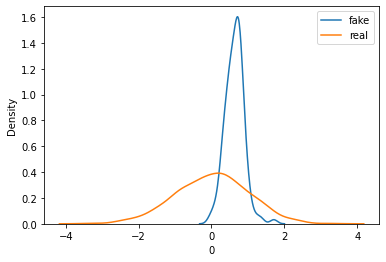

>Saved: drive/My Drive/GANs/synthetic/20201102-141004_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-141004_c_model_00070.h5


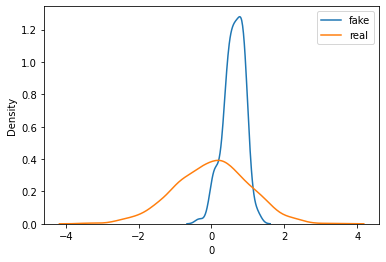

>Saved: drive/My Drive/GANs/synthetic/20201102-141011_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-141011_c_model_00140.h5


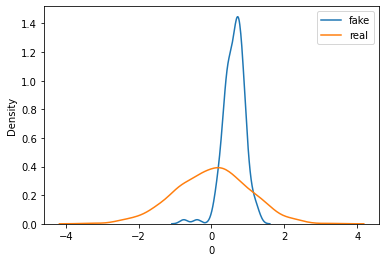

>Saved: drive/My Drive/GANs/synthetic/20201102-141018_g_model_00210.h5, and drive/My Drive/GANs/synthetic/20201102-141018_c_model_00210.h5


> iteration 15: #accepts 6418
60th percentile of preds: 0.946
60th percentile of preds: 0.51
60th percentile of preds: 0.801
             feat_1        feat_2  ...   gender_Male        TARGET
count  16000.000000  16000.000000  ...  16000.000000  16000.000000
mean       0.613479      0.047984  ...      0.655171      0.497000
std        0.308427      0.361267  ...      0.341784      0.500007
min       -0.909292     -2.501372  ...     -1.061777      0.000000
25%        0.428235     -0.180054  ...      0.432366      0.000000
50%        0.613110      0.076382  ...      0.640584      0.000000
75%        0.795714      0.300955  ...      0.859836      1.000000
max        2.176815      2.259219  ...      3.037203      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.813
60th percentile of preds: 0.682


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
iter 14: 
tao: 0.057966379816059774
accepts: 400 with 0.02% bad
(1000, 12) (1000,)
n_epochs=30, n_batch=128, 1/2=64, b/e=7, steps=210


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

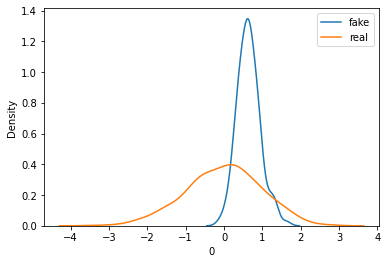

>Saved: drive/My Drive/GANs/synthetic/20201102-141031_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-141031_c_model_00070.h5


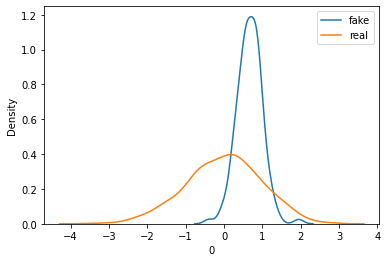

>Saved: drive/My Drive/GANs/synthetic/20201102-141038_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-141038_c_model_00140.h5


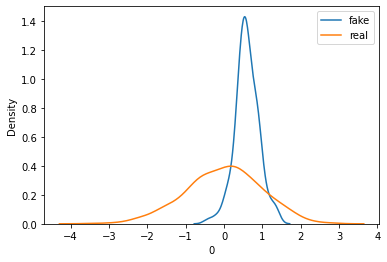

>Saved: drive/My Drive/GANs/synthetic/20201102-141045_g_model_00210.h5, and drive/My Drive/GANs/synthetic/20201102-141045_c_model_00210.h5


> iteration 16: #accepts 6818
60th percentile of preds: 0.946
60th percentile of preds: 0.513
60th percentile of preds: 0.8
             feat_1        feat_2  ...   gender_Male        TARGET
count  17000.000000  17000.000000  ...  17000.000000  17000.000000
mean       0.612298     -0.030968  ...      0.622591      0.496588
std        0.305609      0.361259  ...      0.330318      0.500003
min       -1.393238     -2.960497  ...     -1.268054      0.000000
25%        0.429316     -0.251801  ...      0.408320      0.000000
50%        0.611999     -0.000007  ...      0.610091      0.000000
75%        0.787605      0.222437  ...      0.817317      1.000000
max        2.302437      1.917519  ...      2.751313      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.808
60th percentile of preds: 0.665


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
iter 15: 
tao: 0.057520138758192715
accepts: 400 with 0.04% bad
(1000, 12) (1000,)
n_epochs=30, n_batch=128, 1/2=64, b/e=7, steps=210


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

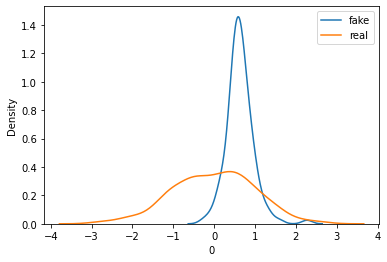

>Saved: drive/My Drive/GANs/synthetic/20201102-141058_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-141058_c_model_00070.h5


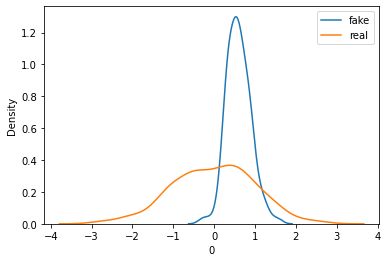

>Saved: drive/My Drive/GANs/synthetic/20201102-141105_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-141105_c_model_00140.h5


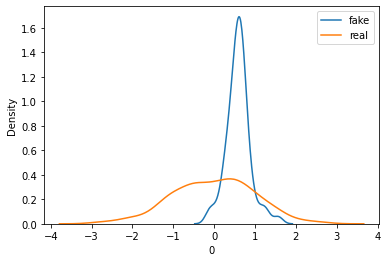

>Saved: drive/My Drive/GANs/synthetic/20201102-141112_g_model_00210.h5, and drive/My Drive/GANs/synthetic/20201102-141112_c_model_00210.h5


> iteration 17: #accepts 7218
60th percentile of preds: 0.946
60th percentile of preds: 0.511
60th percentile of preds: 0.753
             feat_1        feat_2  ...   gender_Male        TARGET
count  18000.000000  18000.000000  ...  18000.000000  18000.000000
mean       0.599187     -0.058445  ...      0.590495      0.506778
std        0.297167      0.350163  ...      0.316267      0.499968
min       -0.804294     -2.703359  ...     -1.168200      0.000000
25%        0.417277     -0.274406  ...      0.387001      0.000000
50%        0.597665     -0.026474  ...      0.581350      1.000000
75%        0.772311      0.187567  ...      0.783549      1.000000
max        2.397128      1.605120  ...      2.786000      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.814
60th percentile of preds: 0.65


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.953
iter 16: 
tao: 0.05137074612409444
accepts: 400 with 0.015% bad
(1000, 12) (1000,)
n_epochs=30, n_batch=128, 1/2=64, b/e=7, steps=210


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

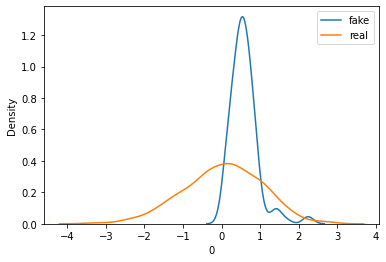

>Saved: drive/My Drive/GANs/synthetic/20201102-141125_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-141125_c_model_00070.h5


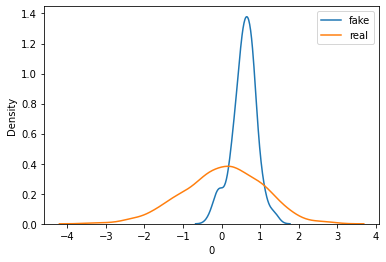

>Saved: drive/My Drive/GANs/synthetic/20201102-141132_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-141132_c_model_00140.h5


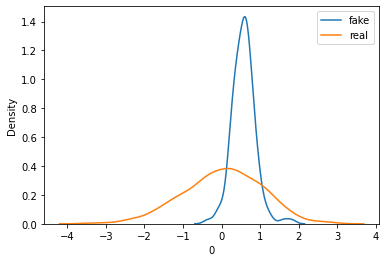

>Saved: drive/My Drive/GANs/synthetic/20201102-141138_g_model_00210.h5, and drive/My Drive/GANs/synthetic/20201102-141138_c_model_00210.h5


> iteration 18: #accepts 7618
60th percentile of preds: 0.947
60th percentile of preds: 0.508
60th percentile of preds: 0.758
             feat_1        feat_2  ...   gender_Male        TARGET
count  19000.000000  19000.000000  ...  19000.000000  19000.000000
mean       0.572517     -0.088919  ...      0.562986      0.501421
std        0.292202      0.349127  ...      0.312827      0.500011
min       -1.207844     -3.087696  ...     -1.749363      0.000000
25%        0.399345     -0.298678  ...      0.363016      0.000000
50%        0.564916     -0.057334  ...      0.555820      1.000000
75%        0.734908      0.154123  ...      0.755106      1.000000
max        2.674834      1.447810  ...      2.498913      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.814
60th percentile of preds: 0.65


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
iter 17: 
tao: 0.057152645913550376
accepts: 400 with 0.0375% bad
(1000, 12) (1000,)
n_epochs=30, n_batch=128, 1/2=64, b/e=7, steps=210


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

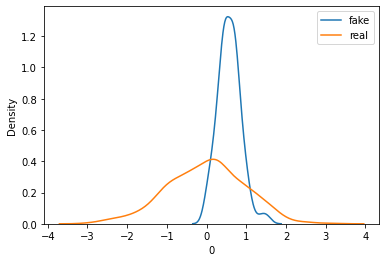

>Saved: drive/My Drive/GANs/synthetic/20201102-141152_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-141152_c_model_00070.h5


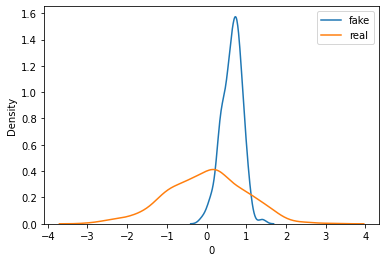

>Saved: drive/My Drive/GANs/synthetic/20201102-141158_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-141158_c_model_00140.h5


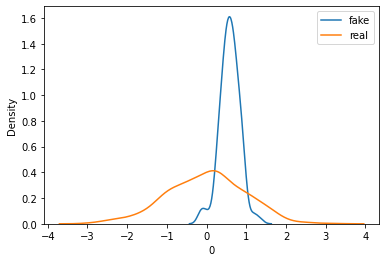

>Saved: drive/My Drive/GANs/synthetic/20201102-141205_g_model_00210.h5, and drive/My Drive/GANs/synthetic/20201102-141205_c_model_00210.h5


> iteration 19: #accepts 8018
60th percentile of preds: 0.946
60th percentile of preds: 0.503
60th percentile of preds: 0.772
             feat_1        feat_2  ...   gender_Male        TARGET
count  20000.000000  20000.000000  ...  20000.000000  20000.000000
mean       0.596294     -0.110321  ...      0.540012      0.501800
std        0.286438      0.347907  ...      0.301911      0.500009
min       -0.705252     -2.877834  ...     -1.385059      0.000000
25%        0.424762     -0.314966  ...      0.346022      0.000000
50%        0.588234     -0.077621  ...      0.536294      1.000000
75%        0.757777      0.129758  ...      0.726529      1.000000
max        2.386715      1.237554  ...      2.844469      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.827
60th percentile of preds: 0.682


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.953
iter 18: 
tao: 0.05566139607881122
accepts: 400 with 0.0275% bad
(1000, 12) (1000,)
n_epochs=30, n_batch=128, 1/2=64, b/e=7, steps=210


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

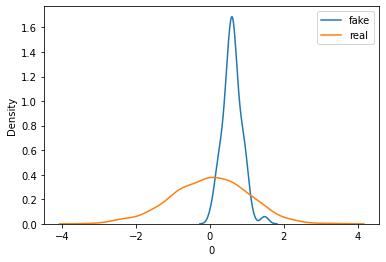

>Saved: drive/My Drive/GANs/synthetic/20201102-141219_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-141219_c_model_00070.h5


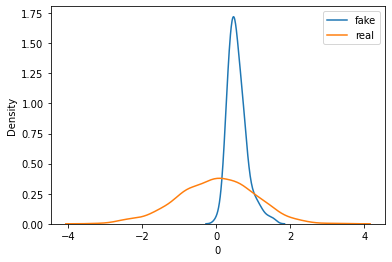

>Saved: drive/My Drive/GANs/synthetic/20201102-141226_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-141226_c_model_00140.h5


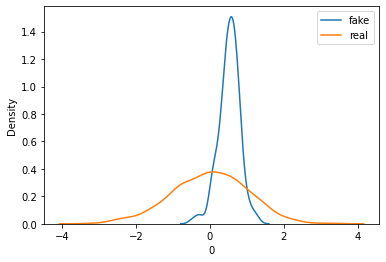

>Saved: drive/My Drive/GANs/synthetic/20201102-141233_g_model_00210.h5, and drive/My Drive/GANs/synthetic/20201102-141233_c_model_00210.h5


> iteration 20: #accepts 8418
60th percentile of preds: 0.947
60th percentile of preds: 0.488
60th percentile of preds: 0.748
             feat_1        feat_2  ...   gender_Male        TARGET
count  21000.000000  21000.000000  ...  21000.000000  21000.000000
mean       0.575410     -0.114877  ...      0.542125      0.493238
std        0.282571      0.339016  ...      0.295290      0.499966
min       -0.920430     -2.770998  ...     -1.340732      0.000000
25%        0.404194     -0.317337  ...      0.350373      0.000000
50%        0.565351     -0.084454  ...      0.536168      0.000000
75%        0.734600      0.119020  ...      0.726098      1.000000
max        2.451790      1.475047  ...      2.869956      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.823
60th percentile of preds: 0.638


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.953
iter 19: 
tao: 0.05696479679987136
accepts: 400 with 0.025% bad
(1000, 12) (1000,)
n_epochs=30, n_batch=128, 1/2=64, b/e=7, steps=210


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

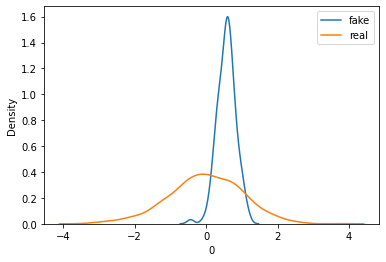

>Saved: drive/My Drive/GANs/synthetic/20201102-141248_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-141248_c_model_00070.h5


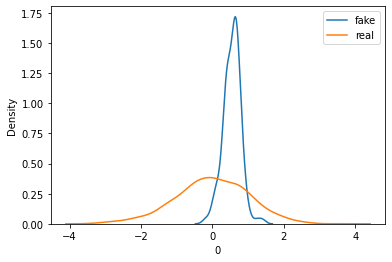

>Saved: drive/My Drive/GANs/synthetic/20201102-141255_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-141255_c_model_00140.h5


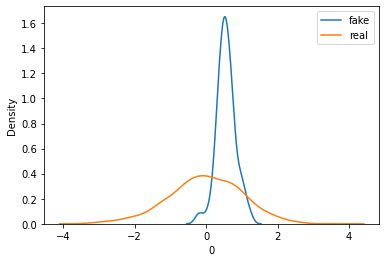

>Saved: drive/My Drive/GANs/synthetic/20201102-141302_g_model_00210.h5, and drive/My Drive/GANs/synthetic/20201102-141302_c_model_00210.h5


> iteration 21: #accepts 8818
60th percentile of preds: 0.947
60th percentile of preds: 0.495
60th percentile of preds: 0.746
             feat_1        feat_2  ...   gender_Male        TARGET
count  22000.000000  22000.000000  ...  22000.000000  22000.000000
mean       0.560457     -0.129772  ...      0.534400      0.495364
std        0.277188      0.328285  ...      0.294856      0.499990
min       -0.995651     -2.853775  ...     -1.547844      0.000000
25%        0.393467     -0.326342  ...      0.348901      0.000000
50%        0.551828     -0.097807  ...      0.530566      0.000000
75%        0.714691      0.095978  ...      0.715947      1.000000
max        2.335426      1.200469  ...      2.224422      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.826
60th percentile of preds: 0.626


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.953
iter 20: 
tao: 0.05027510814065245
accepts: 400 with 0.05% bad
(1000, 12) (1000,)
n_epochs=30, n_batch=128, 1/2=64, b/e=7, steps=210


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

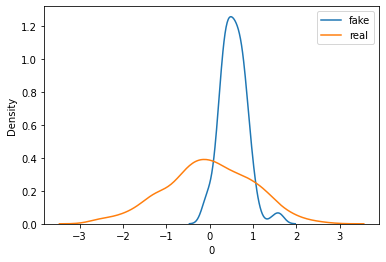

>Saved: drive/My Drive/GANs/synthetic/20201102-141317_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-141317_c_model_00070.h5


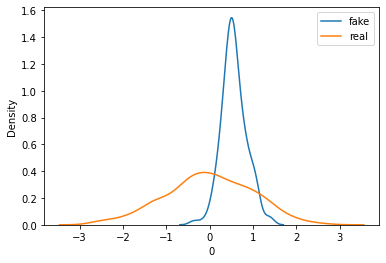

>Saved: drive/My Drive/GANs/synthetic/20201102-141324_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-141324_c_model_00140.h5


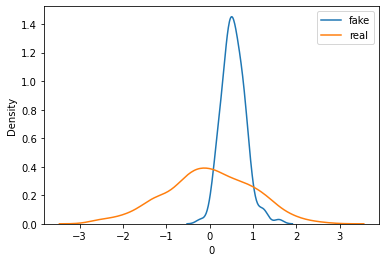

>Saved: drive/My Drive/GANs/synthetic/20201102-141331_g_model_00210.h5, and drive/My Drive/GANs/synthetic/20201102-141331_c_model_00210.h5


> iteration 22: #accepts 9218
60th percentile of preds: 0.944
60th percentile of preds: 0.489
60th percentile of preds: 0.732
             feat_1        feat_2  ...   gender_Male        TARGET
count  23000.000000  23000.000000  ...  23000.000000  23000.000000
mean       0.546748     -0.126193  ...      0.522115      0.498565
std        0.273660      0.317838  ...      0.290138      0.500009
min       -1.052415     -2.479124  ...     -1.302485      0.000000
25%        0.379758     -0.315328  ...      0.337101      0.000000
50%        0.535656     -0.101792  ...      0.518134      0.000000
75%        0.696863      0.091250  ...      0.702686      1.000000
max        2.268294      1.460502  ...      2.943128      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.809
60th percentile of preds: 0.612


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.952
iter 21: 
tao: 0.06020553954583678
accepts: 400 with 0.0225% bad
(1000, 12) (1000,)
n_epochs=25, n_batch=128, 1/2=64, b/e=7, steps=175


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

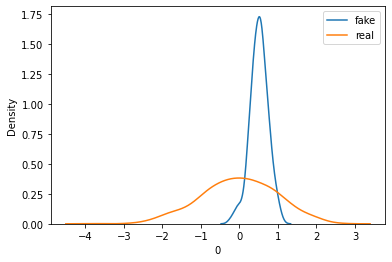

>Saved: drive/My Drive/GANs/synthetic/20201102-141347_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-141347_c_model_00070.h5


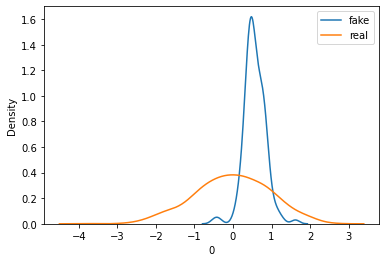

>Saved: drive/My Drive/GANs/synthetic/20201102-141353_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-141353_c_model_00140.h5


> iteration 23: #accepts 9618
60th percentile of preds: 0.945
60th percentile of preds: 0.489
60th percentile of preds: 0.702
             feat_1        feat_2  ...   gender_Male       TARGET
count  24000.000000  24000.000000  ...  24000.000000  24000.00000
mean       0.592177     -0.150566  ...      0.516243      0.50025
std        0.275256      0.323433  ...      0.286183      0.50001
min       -0.763588     -2.608948  ...     -1.193329      0.00000
25%        0.425404     -0.343287  ...      0.336642      0.00000
50%        0.579030     -0.122430  ...      0.513676      1.00000
75%        0.738147      0.070177  ...      0.690403      1.00000
max        2.740961      1.505067  ...      2.337284      1.00000

[8 rows x 13 columns]
60th percentile of preds: 0.813
60th percentile of preds: 0.584


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.953
iter 22: 
tao: 0.06078333394950386
accepts: 400 with 0.035% bad
(1000, 12) (1000,)
n_epochs=25, n_batch=128, 1/2=64, b/e=7, steps=175


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

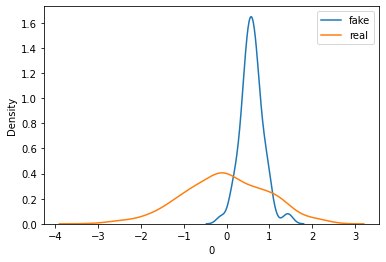

>Saved: drive/My Drive/GANs/synthetic/20201102-141412_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-141412_c_model_00070.h5


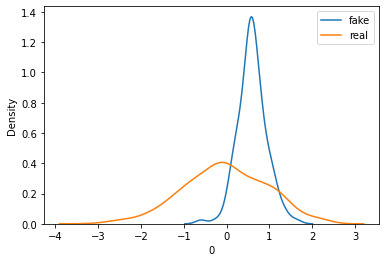

>Saved: drive/My Drive/GANs/synthetic/20201102-141419_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-141419_c_model_00140.h5


> iteration 24: #accepts 10018
60th percentile of preds: 0.946
60th percentile of preds: 0.49
60th percentile of preds: 0.739
             feat_1        feat_2  ...   gender_Male        TARGET
count  25000.000000  25000.000000  ...  25000.000000  25000.000000
mean       0.605552     -0.178626  ...      0.513941      0.499200
std        0.268522      0.316932  ...      0.285851      0.500009
min       -0.779921     -2.359524  ...     -1.220760      0.000000
25%        0.443484     -0.364532  ...      0.332805      0.000000
50%        0.593818     -0.152499  ...      0.508090      0.000000
75%        0.747485      0.036512  ...      0.688799      1.000000
max        2.776332      1.429116  ...      2.384865      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.821
60th percentile of preds: 0.618


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.952
iter 23: 
tao: 0.0505320710222556
accepts: 400 with 0.0225% bad
(1000, 12) (1000,)
n_epochs=25, n_batch=128, 1/2=64, b/e=7, steps=175


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

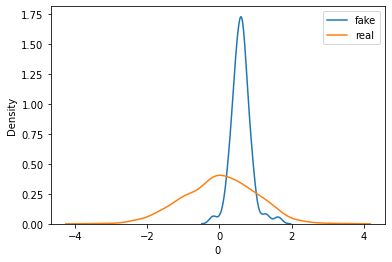

>Saved: drive/My Drive/GANs/synthetic/20201102-141439_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-141439_c_model_00070.h5


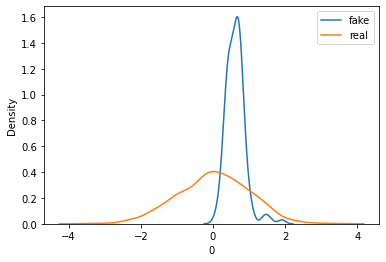

>Saved: drive/My Drive/GANs/synthetic/20201102-141445_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-141445_c_model_00140.h5


> iteration 25: #accepts 10418
60th percentile of preds: 0.947
60th percentile of preds: 0.489
60th percentile of preds: 0.714
             feat_1        feat_2  ...   gender_Male        TARGET
count  26000.000000  26000.000000  ...  26000.000000  26000.000000
mean       0.587876     -0.192960  ...      0.499899      0.496962
std        0.262036      0.313071  ...      0.280313      0.500000
min       -0.792820     -2.780096  ...     -1.246087      0.000000
25%        0.431170     -0.381102  ...      0.322192      0.000000
50%        0.577634     -0.167353  ...      0.494051      0.000000
75%        0.734065      0.018160  ...      0.673815      1.000000
max        2.859861      1.305657  ...      2.183484      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.819
60th percentile of preds: 0.584


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.952
iter 24: 
tao: 0.05452053025041566
accepts: 400 with 0.025% bad
(1000, 12) (1000,)
n_epochs=25, n_batch=128, 1/2=64, b/e=7, steps=175


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

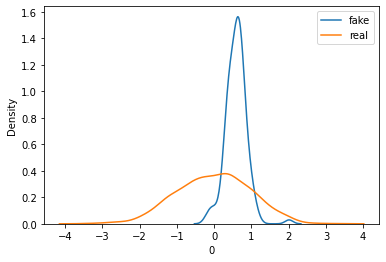

>Saved: drive/My Drive/GANs/synthetic/20201102-141504_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-141504_c_model_00070.h5


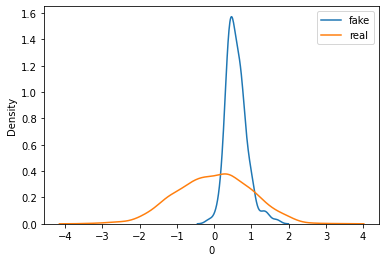

>Saved: drive/My Drive/GANs/synthetic/20201102-141511_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-141511_c_model_00140.h5


> iteration 26: #accepts 10818
60th percentile of preds: 0.948
60th percentile of preds: 0.497
60th percentile of preds: 0.739
             feat_1        feat_2  ...   gender_Male        TARGET
count  27000.000000  27000.000000  ...  27000.000000  27000.000000
mean       0.588995     -0.176719  ...      0.510367      0.498296
std        0.253436      0.308980  ...      0.280202      0.500006
min       -0.845865     -2.363903  ...     -1.162263      0.000000
25%        0.435766     -0.364008  ...      0.331366      0.000000
50%        0.582174     -0.148963  ...      0.504398      0.000000
75%        0.732487      0.035372  ...      0.680526      1.000000
max        2.516574      1.269755  ...      2.626751      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.828
60th percentile of preds: 0.624


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.952
iter 25: 
tao: 0.05320951396939541
accepts: 400 with 0.01% bad
(1000, 12) (1000,)
n_epochs=25, n_batch=128, 1/2=64, b/e=7, steps=175


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

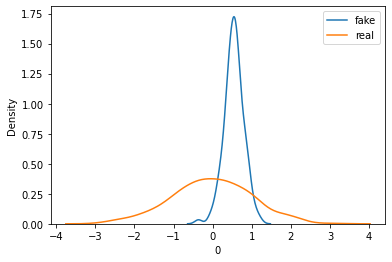

>Saved: drive/My Drive/GANs/synthetic/20201102-141531_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-141531_c_model_00070.h5


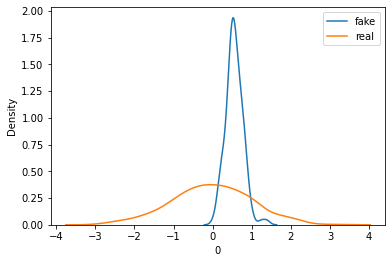

>Saved: drive/My Drive/GANs/synthetic/20201102-141538_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-141538_c_model_00140.h5


> iteration 27: #accepts 11218
60th percentile of preds: 0.949
60th percentile of preds: 0.5
60th percentile of preds: 0.779
             feat_1        feat_2  ...   gender_Male        TARGET
count  28000.000000  28000.000000  ...  28000.000000  28000.000000
mean       0.525835     -0.163102  ...      0.530676      0.500500
std        0.245818      0.295920  ...      0.277212      0.500009
min       -1.054813     -2.262833  ...     -1.256800      0.000000
25%        0.381313     -0.342066  ...      0.354648      0.000000
50%        0.524494     -0.142903  ...      0.522335      1.000000
75%        0.671657      0.036667  ...      0.697581      1.000000
max        2.307842      1.700365  ...      2.513655      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.837
60th percentile of preds: 0.658


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.953
iter 26: 
tao: 0.051089750482662136
accepts: 400 with 0.0175% bad
(1000, 12) (1000,)
n_epochs=25, n_batch=128, 1/2=64, b/e=7, steps=175


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

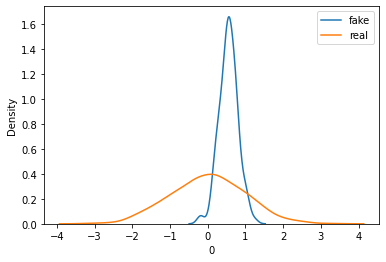

>Saved: drive/My Drive/GANs/synthetic/20201102-141559_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-141559_c_model_00070.h5


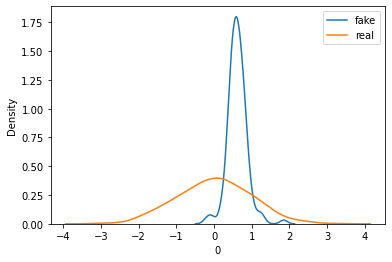

>Saved: drive/My Drive/GANs/synthetic/20201102-141605_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-141605_c_model_00140.h5


> iteration 28: #accepts 11618
60th percentile of preds: 0.95
60th percentile of preds: 0.486
60th percentile of preds: 0.709
             feat_1        feat_2  ...   gender_Male        TARGET
count  29000.000000  29000.000000  ...  29000.000000  29000.000000
mean       0.596715     -0.201628  ...      0.498742      0.494966
std        0.251924      0.300456  ...      0.271452      0.499983
min       -0.670134     -2.443875  ...     -1.074784      0.000000
25%        0.446709     -0.382381  ...      0.327217      0.000000
50%        0.587916     -0.175273  ...      0.494802      0.000000
75%        0.735552      0.001452  ...      0.662945      1.000000
max        2.770105      1.293556  ...      2.699621      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.837
60th percentile of preds: 0.599


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.953
iter 27: 
tao: 0.055869218533607774
accepts: 400 with 0.0175% bad
(1000, 12) (1000,)
n_epochs=25, n_batch=128, 1/2=64, b/e=7, steps=175


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

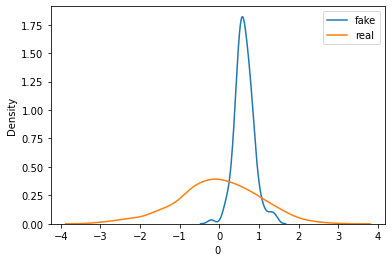

>Saved: drive/My Drive/GANs/synthetic/20201102-141626_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-141626_c_model_00070.h5


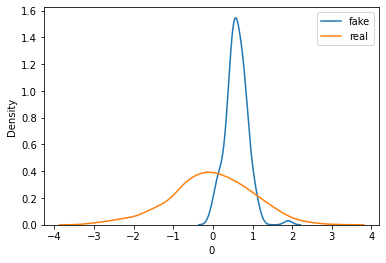

>Saved: drive/My Drive/GANs/synthetic/20201102-141633_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-141633_c_model_00140.h5


> iteration 29: #accepts 12018
60th percentile of preds: 0.948
60th percentile of preds: 0.49
60th percentile of preds: 0.704
             feat_1        feat_2  ...   gender_Male      TARGET
count  30000.000000  30000.000000  ...  30000.000000  30000.0000
mean       0.594773     -0.201988  ...      0.483506      0.5029
std        0.241847      0.295477  ...      0.266910      0.5000
min       -0.941403     -2.484238  ...     -1.089312      0.0000
25%        0.449475     -0.380236  ...      0.317690      0.0000
50%        0.589812     -0.180728  ...      0.477105      1.0000
75%        0.731010     -0.001521  ...      0.644347      1.0000
max        2.073859      1.374049  ...      2.220871      1.0000

[8 rows x 13 columns]
60th percentile of preds: 0.84
60th percentile of preds: 0.592


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
iter 28: 
tao: 0.05070139572767501
accepts: 400 with 0.0075% bad
(1000, 12) (1000,)
n_epochs=20, n_batch=128, 1/2=64, b/e=7, steps=140


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

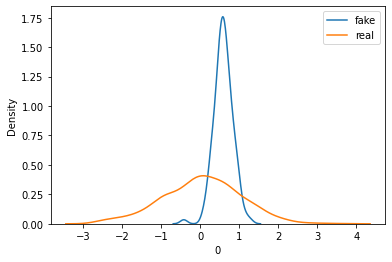

>Saved: drive/My Drive/GANs/synthetic/20201102-141654_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-141654_c_model_00070.h5


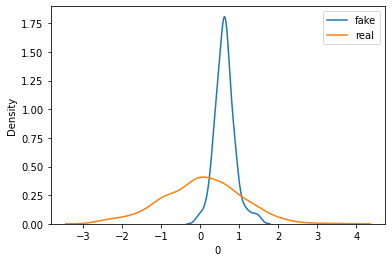

>Saved: drive/My Drive/GANs/synthetic/20201102-141700_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-141700_c_model_00140.h5


> iteration 30: #accepts 12418
60th percentile of preds: 0.949
60th percentile of preds: 0.493
60th percentile of preds: 0.719
             feat_1        feat_2  ...   gender_Male        TARGET
count  31000.000000  31000.000000  ...  31000.000000  31000.000000
mean       0.588755     -0.177001  ...      0.497351      0.502129
std        0.238993      0.285928  ...      0.266294      0.500004
min       -0.943845     -1.999956  ...     -1.323194      0.000000
25%        0.447054     -0.350665  ...      0.328387      0.000000
50%        0.582805     -0.156034  ...      0.491373      1.000000
75%        0.724225      0.014586  ...      0.655877      1.000000
max        2.058727      1.313281  ...      2.213852      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.85
60th percentile of preds: 0.604


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


iter 29: 
tao: 0.049849592810868655
accepts: 400 with 0.0125% bad
(1000, 12) (1000,)
n_epochs=20, n_batch=128, 1/2=64, b/e=7, steps=140


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:199: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


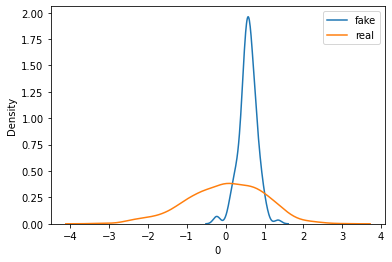

>Saved: drive/My Drive/GANs/synthetic/20201102-141720_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-141720_c_model_00070.h5


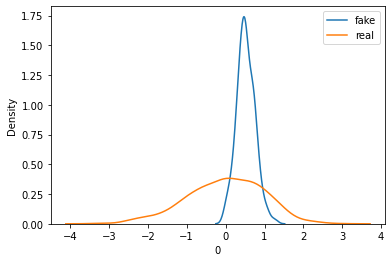

>Saved: drive/My Drive/GANs/synthetic/20201102-141727_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-141727_c_model_00140.h5


> iteration 31: #accepts 12818
60th percentile of preds: 0.95
60th percentile of preds: 0.479
60th percentile of preds: 0.75
             feat_1        feat_2  ...   gender_Male        TARGET
count  32000.000000  32000.000000  ...  32000.000000  32000.000000
mean       0.540282     -0.169904  ...      0.483405      0.499000
std        0.236752      0.284661  ...      0.259103      0.500007
min       -1.158053     -2.277109  ...     -1.121264      0.000000
25%        0.401287     -0.341089  ...      0.320924      0.000000
50%        0.541078     -0.152383  ...      0.481452      0.000000
75%        0.678128      0.019951  ...      0.644790      1.000000
max        2.074199      1.805979  ...      2.693185      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.845
60th percentile of preds: 0.642


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 30: 
tao: 0.053746859137688396
accepts: 400 with 0.0225% bad
(1000, 12) (1000,)
n_epochs=20, n_batch=128, 1/2=64, b/e=7, steps=140


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

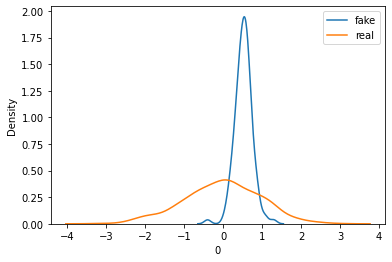

>Saved: drive/My Drive/GANs/synthetic/20201102-141747_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-141747_c_model_00070.h5


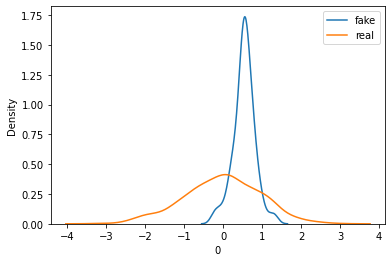

>Saved: drive/My Drive/GANs/synthetic/20201102-141754_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-141754_c_model_00140.h5


> iteration 32: #accepts 13218
60th percentile of preds: 0.951
60th percentile of preds: 0.466
60th percentile of preds: 0.682
             feat_1        feat_2  ...   gender_Male        TARGET
count  33000.000000  33000.000000  ...  33000.000000  33000.000000
mean       0.551829     -0.196484  ...      0.475593      0.500727
std        0.236711      0.280051  ...      0.254422      0.500007
min       -0.721541     -2.336066  ...     -1.098310      0.000000
25%        0.411861     -0.363271  ...      0.315598      0.000000
50%        0.545462     -0.175132  ...      0.475073      1.000000
75%        0.684847     -0.008532  ...      0.634423      1.000000
max        2.062761      1.314449  ...      2.309915      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.838
60th percentile of preds: 0.564


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 31: 
tao: 0.04812710892514577
accepts: 400 with 0.0225% bad
(1000, 12) (1000,)
n_epochs=20, n_batch=128, 1/2=64, b/e=7, steps=140


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

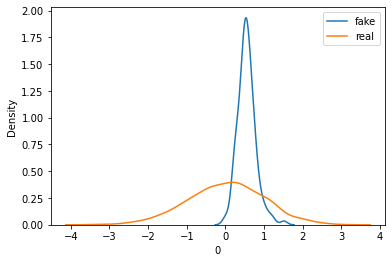

>Saved: drive/My Drive/GANs/synthetic/20201102-141816_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-141816_c_model_00070.h5


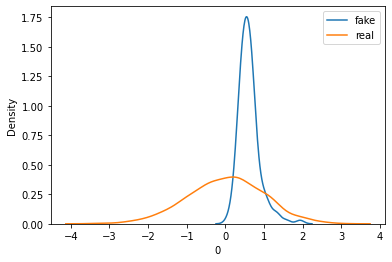

>Saved: drive/My Drive/GANs/synthetic/20201102-141823_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-141823_c_model_00140.h5


> iteration 33: #accepts 13618
60th percentile of preds: 0.952
60th percentile of preds: 0.476
60th percentile of preds: 0.725
             feat_1        feat_2  ...   gender_Male        TARGET
count  34000.000000  34000.000000  ...  34000.000000  34000.000000
mean       0.558585     -0.197221  ...      0.474604      0.499471
std        0.234073      0.281393  ...      0.251160      0.500007
min       -0.758500     -3.123090  ...     -1.576041      0.000000
25%        0.417020     -0.360301  ...      0.315544      0.000000
50%        0.549880     -0.172783  ...      0.472853      0.000000
75%        0.687960     -0.009405  ...      0.631488      1.000000
max        2.171801      1.297764  ...      1.998535      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.842
60th percentile of preds: 0.61


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 32: 
tao: 0.048862280797404324
accepts: 400 with 0.02% bad
(1000, 12) (1000,)
n_epochs=20, n_batch=128, 1/2=64, b/e=7, steps=140


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

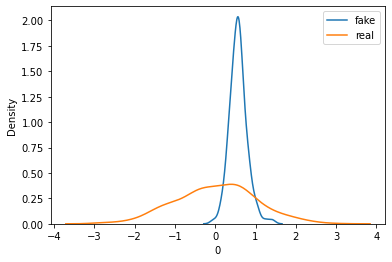

>Saved: drive/My Drive/GANs/synthetic/20201102-141843_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-141843_c_model_00070.h5


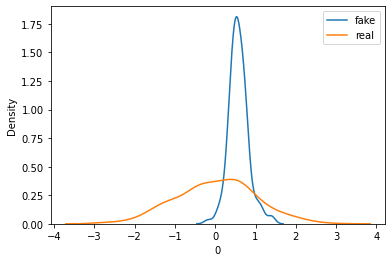

>Saved: drive/My Drive/GANs/synthetic/20201102-141850_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-141850_c_model_00140.h5


> iteration 34: #accepts 14018
60th percentile of preds: 0.952
60th percentile of preds: 0.474
60th percentile of preds: 0.669
             feat_1        feat_2  ...   gender_Male        TARGET
count  35000.000000  35000.000000  ...  35000.000000  35000.000000
mean       0.552847     -0.202312  ...      0.468958      0.499686
std        0.230040      0.278281  ...      0.251748      0.500007
min       -1.025885     -2.808489  ...     -1.386897      0.000000
25%        0.415084     -0.367266  ...      0.306648      0.000000
50%        0.547647     -0.181568  ...      0.465380      0.000000
75%        0.683675     -0.014158  ...      0.627429      1.000000
max        2.143019      1.588796  ...      2.111050      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.842
60th percentile of preds: 0.583


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 33: 
tao: 0.05166373781666065
accepts: 400 with 0.025% bad
(1000, 12) (1000,)
n_epochs=20, n_batch=128, 1/2=64, b/e=7, steps=140


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

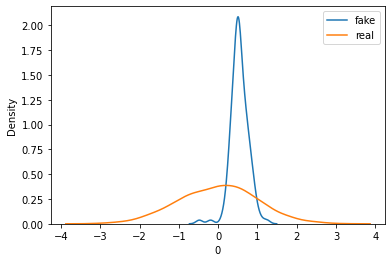

>Saved: drive/My Drive/GANs/synthetic/20201102-141910_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-141910_c_model_00070.h5


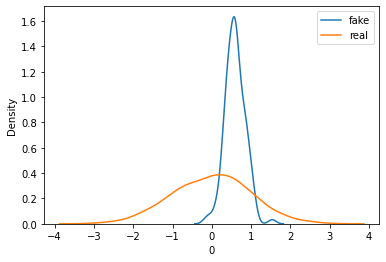

>Saved: drive/My Drive/GANs/synthetic/20201102-141917_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-141917_c_model_00140.h5


> iteration 35: #accepts 14418
60th percentile of preds: 0.952
60th percentile of preds: 0.473
60th percentile of preds: 0.682
             feat_1        feat_2  ...   gender_Male        TARGET
count  36000.000000  36000.000000  ...  36000.000000  36000.000000
mean       0.556991     -0.229487  ...      0.462195      0.497889
std        0.231675      0.277450  ...      0.251254      0.500002
min       -1.139145     -3.420295  ...     -1.219866      0.000000
25%        0.418825     -0.394302  ...      0.301997      0.000000
50%        0.547846     -0.209334  ...      0.458772      0.000000
75%        0.687038     -0.044889  ...      0.617109      1.000000
max        2.158343      1.478513  ...      2.192550      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.835
60th percentile of preds: 0.584


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 34: 
tao: 0.04641020917671081
accepts: 400 with 0.0125% bad
(1000, 12) (1000,)
n_epochs=20, n_batch=128, 1/2=64, b/e=7, steps=140


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

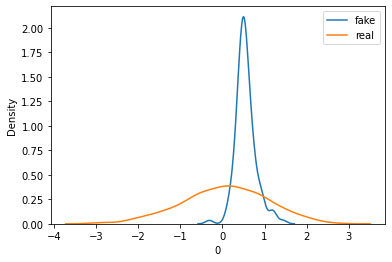

>Saved: drive/My Drive/GANs/synthetic/20201102-141938_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-141938_c_model_00070.h5


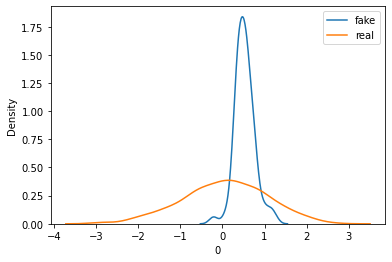

>Saved: drive/My Drive/GANs/synthetic/20201102-141945_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-141945_c_model_00140.h5


> iteration 36: #accepts 14818
60th percentile of preds: 0.952
60th percentile of preds: 0.482
60th percentile of preds: 0.749
             feat_1        feat_2  ...   gender_Male        TARGET
count  37000.000000  37000.000000  ...  37000.000000  37000.000000
mean       0.523075     -0.212692  ...      0.460598      0.494000
std        0.226296      0.273604  ...      0.249213      0.499971
min       -0.734859     -2.821053  ...     -1.245698      0.000000
25%        0.386957     -0.374512  ...      0.301669      0.000000
50%        0.513454     -0.193572  ...      0.455775      0.000000
75%        0.647477     -0.031295  ...      0.613562      1.000000
max        2.104322      1.596296  ...      2.020575      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.83
60th percentile of preds: 0.634


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 35: 
tao: 0.04847682521110361
accepts: 400 with 0.0225% bad
(1000, 12) (1000,)
n_epochs=20, n_batch=128, 1/2=64, b/e=7, steps=140


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

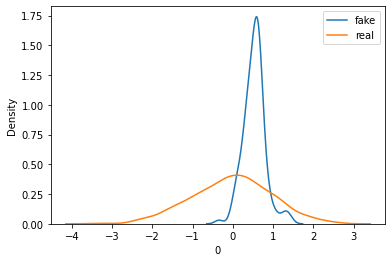

>Saved: drive/My Drive/GANs/synthetic/20201102-142007_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-142007_c_model_00070.h5


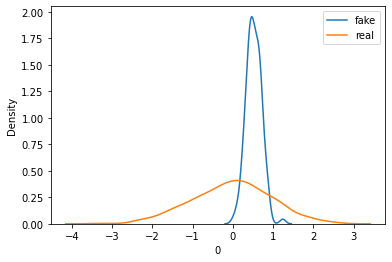

>Saved: drive/My Drive/GANs/synthetic/20201102-142014_g_model_00140.h5, and drive/My Drive/GANs/synthetic/20201102-142014_c_model_00140.h5


> iteration 37: #accepts 15218
60th percentile of preds: 0.952
60th percentile of preds: 0.462
60th percentile of preds: 0.657
             feat_1        feat_2  ...   gender_Male        TARGET
count  38000.000000  38000.000000  ...  38000.000000  38000.000000
mean       0.551375     -0.233832  ...      0.447478      0.500026
std        0.227071      0.277217  ...      0.246470      0.500007
min       -0.554717     -2.697102  ...     -0.981240      0.000000
25%        0.414463     -0.394120  ...      0.288341      0.000000
50%        0.538838     -0.210202  ...      0.440423      1.000000
75%        0.670250     -0.050627  ...      0.595042      1.000000
max        2.311319      1.128237  ...      2.352782      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.828
60th percentile of preds: 0.576


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 36: 
tao: 0.05039678080053351
accepts: 400 with 0.0275% bad
(1000, 12) (1000,)
n_epochs=15, n_batch=128, 1/2=64, b/e=7, steps=105


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

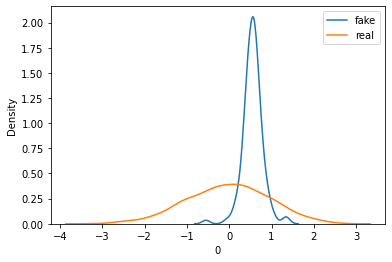

>Saved: drive/My Drive/GANs/synthetic/20201102-142037_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-142037_c_model_00070.h5


> iteration 38: #accepts 15618
60th percentile of preds: 0.952
60th percentile of preds: 0.476
60th percentile of preds: 0.663
             feat_1        feat_2  ...   gender_Male        TARGET
count  39000.000000  39000.000000  ...  39000.000000  39000.000000
mean       0.565487     -0.252665  ...      0.438245      0.500359
std        0.226535      0.278826  ...      0.243158      0.500006
min       -0.576200     -2.607523  ...     -1.116421      0.000000
25%        0.427631     -0.413895  ...      0.282668      0.000000
50%        0.552513     -0.231186  ...      0.434192      1.000000
75%        0.686653     -0.067322  ...      0.587003      1.000000
max        2.204931      1.155810  ...      2.090205      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.826
60th percentile of preds: 0.578


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.956
iter 37: 
tao: 0.046309868759368294
accepts: 400 with 0.0275% bad
(1000, 12) (1000,)
n_epochs=15, n_batch=128, 1/2=64, b/e=7, steps=105


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

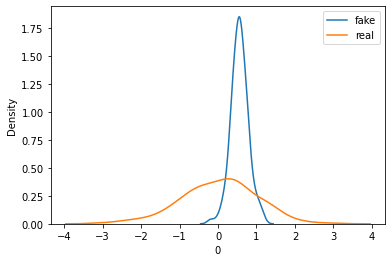

>Saved: drive/My Drive/GANs/synthetic/20201102-142103_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-142103_c_model_00070.h5


> iteration 39: #accepts 16018
60th percentile of preds: 0.952
60th percentile of preds: 0.48
60th percentile of preds: 0.658
             feat_1        feat_2  ...   gender_Male        TARGET
count  40000.000000  40000.000000  ...  40000.000000  40000.000000
mean       0.583702     -0.259557  ...      0.441452      0.500425
std        0.225238      0.274142  ...      0.243518      0.500006
min       -0.856662     -2.643893  ...     -1.127171      0.000000
25%        0.448082     -0.419994  ...      0.283895      0.000000
50%        0.568832     -0.239303  ...      0.437706      1.000000
75%        0.701825     -0.079268  ...      0.588561      1.000000
max        2.640073      1.478978  ...      2.032991      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.829
60th percentile of preds: 0.568


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 38: 
tao: 0.04454222046835654
accepts: 400 with 0.0275% bad
(1000, 12) (1000,)
n_epochs=15, n_batch=128, 1/2=64, b/e=7, steps=105


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

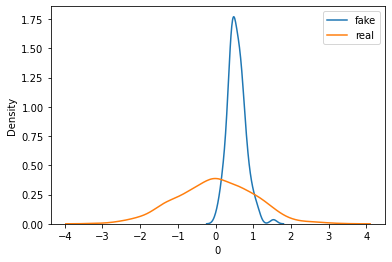

>Saved: drive/My Drive/GANs/synthetic/20201102-142128_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-142128_c_model_00070.h5


> iteration 40: #accepts 16418
60th percentile of preds: 0.952
60th percentile of preds: 0.481
60th percentile of preds: 0.672
             feat_1        feat_2  ...   gender_Male        TARGET
count  41000.000000  41000.000000  ...  41000.000000  41000.000000
mean       0.569173     -0.262220  ...      0.440834      0.498756
std        0.220246      0.269020  ...      0.248603      0.500005
min       -0.590532     -2.453158  ...     -1.185155      0.000000
25%        0.438438     -0.420955  ...      0.280334      0.000000
50%        0.558364     -0.242205  ...      0.433345      0.000000
75%        0.687537     -0.083502  ...      0.588511      1.000000
max        2.470380      1.292951  ...      1.997686      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.832
60th percentile of preds: 0.575


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 39: 
tao: 0.04785444073920225
accepts: 400 with 0.0275% bad
(1000, 12) (1000,)
n_epochs=15, n_batch=128, 1/2=64, b/e=7, steps=105


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

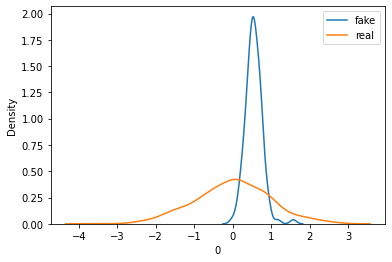

>Saved: drive/My Drive/GANs/synthetic/20201102-142155_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-142155_c_model_00070.h5


> iteration 41: #accepts 16818
60th percentile of preds: 0.952
60th percentile of preds: 0.475
60th percentile of preds: 0.704
             feat_1        feat_2  ...   gender_Male        TARGET
count  42000.000000  42000.000000  ...  42000.000000  42000.000000
mean       0.569337     -0.264375  ...      0.439874      0.499071
std        0.216256      0.261948  ...      0.243362      0.500005
min       -0.904303     -2.221604  ...     -1.167684      0.000000
25%        0.442723     -0.422673  ...      0.283316      0.000000
50%        0.562517     -0.248835  ...      0.434006      0.000000
75%        0.688145     -0.090449  ...      0.587349      1.000000
max        2.002460      0.989695  ...      2.295645      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.834
60th percentile of preds: 0.583


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 40: 
tao: 0.04305437172684979
accepts: 400 with 0.03% bad
(1000, 12) (1000,)
n_epochs=15, n_batch=128, 1/2=64, b/e=7, steps=105


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

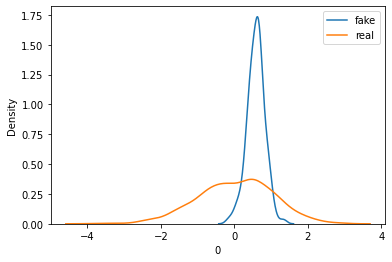

>Saved: drive/My Drive/GANs/synthetic/20201102-142223_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-142223_c_model_00070.h5


> iteration 42: #accepts 17218
60th percentile of preds: 0.952
60th percentile of preds: 0.477
60th percentile of preds: 0.737
             feat_1        feat_2  ...   gender_Male        TARGET
count  43000.000000  43000.000000  ...  43000.000000  43000.000000
mean       0.562898     -0.273619  ...      0.433991      0.496651
std        0.216049      0.259650  ...      0.246579      0.499995
min       -0.661969     -2.185458  ...     -1.294386      0.000000
25%        0.433248     -0.429284  ...      0.276212      0.000000
50%        0.552351     -0.257411  ...      0.425937      0.000000
75%        0.680540     -0.100434  ...      0.578065      1.000000
max        2.013597      0.995193  ...      1.998079      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.82
60th percentile of preds: 0.605


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 41: 
tao: 0.044673634907445386
accepts: 400 with 0.015% bad
(1000, 12) (1000,)
n_epochs=15, n_batch=128, 1/2=64, b/e=7, steps=105


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

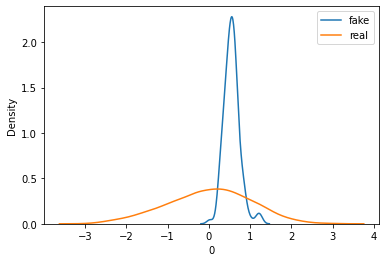

>Saved: drive/My Drive/GANs/synthetic/20201102-142255_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-142255_c_model_00070.h5


> iteration 43: #accepts 17618
60th percentile of preds: 0.951
60th percentile of preds: 0.487
60th percentile of preds: 0.733
             feat_1        feat_2  ...   gender_Male        TARGET
count  44000.000000  44000.000000  ...  44000.000000  44000.000000
mean       0.553538     -0.263005  ...      0.425404      0.500886
std        0.211740      0.256672  ...      0.245059      0.500005
min       -0.651843     -2.321557  ...     -0.911344      0.000000
25%        0.427512     -0.418046  ...      0.266516      0.000000
50%        0.543195     -0.251804  ...      0.416405      1.000000
75%        0.669979     -0.095307  ...      0.567688      1.000000
max        2.152035      1.463188  ...      2.695810      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.815
60th percentile of preds: 0.612


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 42: 
tao: 0.04522158156666396
accepts: 400 with 0.0225% bad
(1000, 12) (1000,)
n_epochs=15, n_batch=128, 1/2=64, b/e=7, steps=105


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

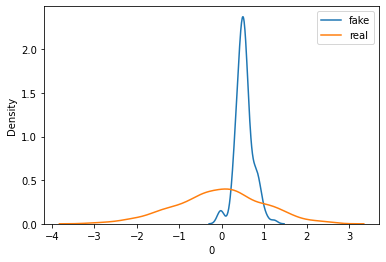

>Saved: drive/My Drive/GANs/synthetic/20201102-142325_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-142325_c_model_00070.h5


> iteration 44: #accepts 18018
60th percentile of preds: 0.952
60th percentile of preds: 0.488
60th percentile of preds: 0.717
             feat_1        feat_2  ...   gender_Male        TARGET
count  45000.000000  45000.000000  ...  45000.000000  45000.000000
mean       0.545272     -0.272501  ...      0.416673      0.500111
std        0.208617      0.254369  ...      0.244696      0.500006
min       -0.890069     -2.285467  ...     -1.072204      0.000000
25%        0.419827     -0.425638  ...      0.259712      0.000000
50%        0.534916     -0.258179  ...      0.406966      1.000000
75%        0.659897     -0.105656  ...      0.558666      1.000000
max        2.154229      1.052382  ...      2.418421      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.821
60th percentile of preds: 0.625


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 43: 
tao: 0.04554674119900241
accepts: 400 with 0.035% bad
(1000, 12) (1000,)
n_epochs=15, n_batch=128, 1/2=64, b/e=7, steps=105


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

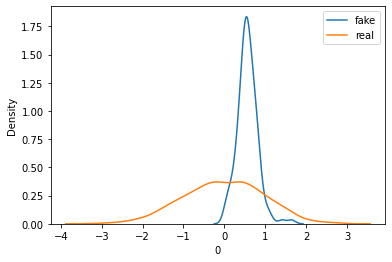

>Saved: drive/My Drive/GANs/synthetic/20201102-142357_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-142357_c_model_00070.h5


> iteration 45: #accepts 18418
60th percentile of preds: 0.953
60th percentile of preds: 0.484
60th percentile of preds: 0.706
             feat_1        feat_2  ...   gender_Male        TARGET
count  46000.000000  46000.000000  ...  46000.000000  46000.000000
mean       0.538806     -0.280707  ...      0.423693      0.499870
std        0.209526      0.256169  ...      0.244547      0.500005
min       -0.728461     -2.251463  ...     -1.067589      0.000000
25%        0.412030     -0.434846  ...      0.265310      0.000000
50%        0.527557     -0.264295  ...      0.413480      0.000000
75%        0.654740     -0.111607  ...      0.561669      1.000000
max        1.985121      1.713550  ...      2.333210      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.821
60th percentile of preds: 0.613


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 44: 
tao: 0.04523598421659779
accepts: 400 with 0.045% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

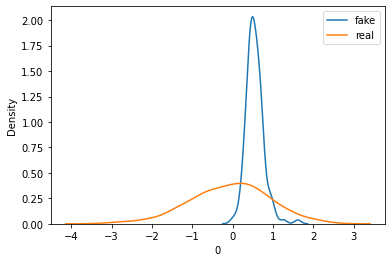

>Saved: drive/My Drive/GANs/synthetic/20201102-142424_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-142424_c_model_00070.h5


> iteration 46: #accepts 18818
60th percentile of preds: 0.952
60th percentile of preds: 0.483
60th percentile of preds: 0.701
             feat_1        feat_2  ...   gender_Male        TARGET
count  47000.000000  47000.000000  ...  47000.000000  47000.000000
mean       0.551501     -0.282680  ...      0.418991      0.502851
std        0.213741      0.253042  ...      0.243261      0.499997
min       -0.823650     -2.379278  ...     -1.139269      0.000000
25%        0.422335     -0.438988  ...      0.262198      0.000000
50%        0.538641     -0.269376  ...      0.410893      1.000000
75%        0.666587     -0.113764  ...      0.557753      1.000000
max        2.202379      0.969042  ...      2.221779      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.82
60th percentile of preds: 0.606


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 45: 
tao: 0.043863345022628814
accepts: 400 with 0.02% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

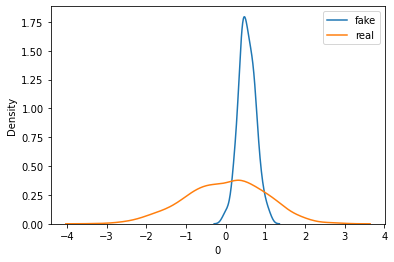

>Saved: drive/My Drive/GANs/synthetic/20201102-142449_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-142449_c_model_00070.h5


> iteration 47: #accepts 19218
60th percentile of preds: 0.952
60th percentile of preds: 0.487
60th percentile of preds: 0.723
             feat_1        feat_2  ...   gender_Male        TARGET
count  48000.000000  48000.000000  ...  48000.000000  48000.000000
mean       0.547517     -0.292557  ...      0.413254      0.501687
std        0.213201      0.251540  ...      0.240479      0.500002
min       -0.972420     -3.292422  ...     -0.927550      0.000000
25%        0.418563     -0.445055  ...      0.258262      0.000000
50%        0.533161     -0.278579  ...      0.403984      1.000000
75%        0.660868     -0.125589  ...      0.549433      1.000000
max        2.084951      1.122060  ...      2.833792      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.814
60th percentile of preds: 0.621


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 46: 
tao: 0.045523352521543915
accepts: 400 with 0.015% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

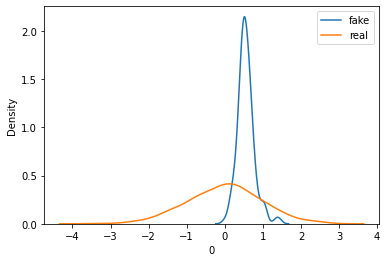

>Saved: drive/My Drive/GANs/synthetic/20201102-142514_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-142514_c_model_00070.h5


> iteration 48: #accepts 19618
60th percentile of preds: 0.952
60th percentile of preds: 0.491
60th percentile of preds: 0.734
             feat_1        feat_2  ...   gender_Male        TARGET
count  49000.000000  49000.000000  ...  49000.000000  49000.000000
mean       0.542443     -0.292799  ...      0.416157      0.498653
std        0.208766      0.249631  ...      0.238167      0.500003
min       -1.019817     -2.471562  ...     -1.169468      0.000000
25%        0.416077     -0.447503  ...      0.262056      0.000000
50%        0.529215     -0.279258  ...      0.408486      0.000000
75%        0.654484     -0.127856  ...      0.552124      1.000000
max        2.001603      1.405274  ...      2.554460      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.815
60th percentile of preds: 0.623


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


iter 47: 
tao: 0.045909171169208035
accepts: 400 with 0.02% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:199: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


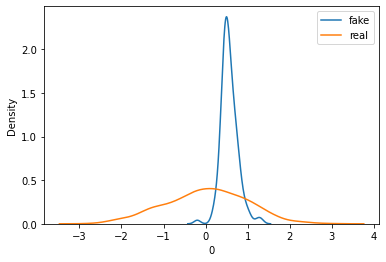

>Saved: drive/My Drive/GANs/synthetic/20201102-142539_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-142539_c_model_00070.h5


> iteration 49: #accepts 20018
60th percentile of preds: 0.952
60th percentile of preds: 0.499
60th percentile of preds: 0.768
             feat_1        feat_2  ...   gender_Male        TARGET
count  50000.000000  50000.000000  ...  50000.000000  50000.000000
mean       0.557680     -0.315664  ...      0.409850      0.500220
std        0.212303      0.251926  ...      0.236636      0.500005
min       -0.739345     -2.684025  ...     -0.905386      0.000000
25%        0.430341     -0.469795  ...      0.258697      0.000000
50%        0.542840     -0.301486  ...      0.401600      1.000000
75%        0.667833     -0.147368  ...      0.545260      1.000000
max        2.323812      1.193800  ...      2.337556      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.812
60th percentile of preds: 0.67


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 48: 
tao: 0.043609893567126745
accepts: 400 with 0.025% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

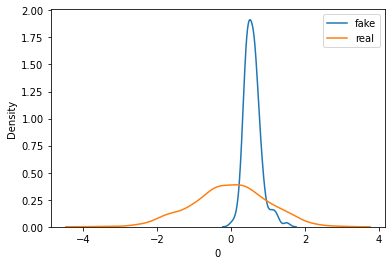

>Saved: drive/My Drive/GANs/synthetic/20201102-142606_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-142606_c_model_00070.h5


> iteration 50: #accepts 20418
60th percentile of preds: 0.953
60th percentile of preds: 0.497
60th percentile of preds: 0.777
             feat_1        feat_2  ...   gender_Male        TARGET
count  51000.000000  51000.000000  ...  51000.000000  51000.000000
mean       0.564676     -0.319053  ...      0.408546      0.500078
std        0.208258      0.250678  ...      0.233144      0.500005
min       -0.609203     -2.550121  ...     -1.069849      0.000000
25%        0.440225     -0.472129  ...      0.259371      0.000000
50%        0.551601     -0.305536  ...      0.401582      1.000000
75%        0.676815     -0.152768  ...      0.542273      1.000000
max        2.144703      1.221824  ...      1.883632      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.814
60th percentile of preds: 0.677


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 49: 
tao: 0.04447474586540511
accepts: 400 with 0.0375% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

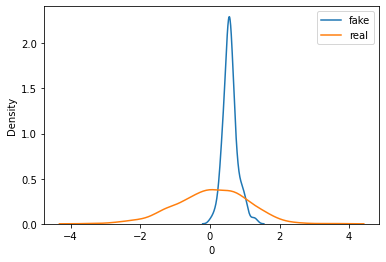

>Saved: drive/My Drive/GANs/synthetic/20201102-142633_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-142633_c_model_00070.h5


> iteration 51: #accepts 20818
60th percentile of preds: 0.953
60th percentile of preds: 0.496
60th percentile of preds: 0.762
             feat_1        feat_2  ...   gender_Male        TARGET
count  52000.000000  52000.000000  ...  52000.000000  52000.000000
mean       0.574532     -0.327840  ...      0.409200      0.506288
std        0.204608      0.249683  ...      0.229057      0.499965
min       -0.907073     -2.036116  ...     -1.210045      0.000000
25%        0.454801     -0.482715  ...      0.265167      0.000000
50%        0.564954     -0.312353  ...      0.402554      1.000000
75%        0.685148     -0.161767  ...      0.542955      1.000000
max        2.079296      1.112889  ...      2.268691      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.823
60th percentile of preds: 0.672


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 50: 
tao: 0.04665867571543868
accepts: 400 with 0.025% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

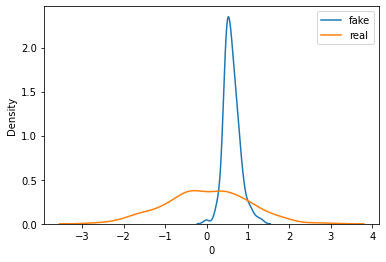

>Saved: drive/My Drive/GANs/synthetic/20201102-142700_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-142700_c_model_00070.h5


> iteration 52: #accepts 21218
60th percentile of preds: 0.953
60th percentile of preds: 0.5
60th percentile of preds: 0.756
             feat_1        feat_2  ...   gender_Male        TARGET
count  53000.000000  53000.000000  ...  53000.000000  53000.000000
mean       0.581984     -0.337022  ...      0.409478      0.499736
std        0.201400      0.251133  ...      0.228492      0.500005
min       -0.684055     -2.799047  ...     -0.924012      0.000000
25%        0.462746     -0.491009  ...      0.264005      0.000000
50%        0.572543     -0.322622  ...      0.403897      0.000000
75%        0.692565     -0.168448  ...      0.543371      1.000000
max        1.948320      1.243921  ...      1.951983      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.831
60th percentile of preds: 0.676


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 51: 
tao: 0.04454844357517901
accepts: 400 with 0.015% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

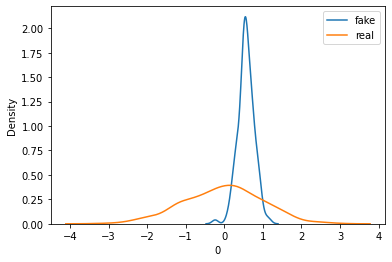

>Saved: drive/My Drive/GANs/synthetic/20201102-142728_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-142728_c_model_00070.h5


> iteration 53: #accepts 21618
60th percentile of preds: 0.954
60th percentile of preds: 0.497
60th percentile of preds: 0.754
             feat_1        feat_2  ...   gender_Male        TARGET
count  54000.000000  54000.000000  ...  54000.000000  54000.000000
mean       0.566383     -0.330644  ...      0.426109      0.501296
std        0.198248      0.248027  ...      0.227152      0.500003
min       -0.798310     -2.068227  ...     -0.959985      0.000000
25%        0.447807     -0.483313  ...      0.281175      0.000000
50%        0.557817     -0.315983  ...      0.421001      1.000000
75%        0.676222     -0.165011  ...      0.560541      1.000000
max        2.059433      1.218042  ...      2.121803      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.829
60th percentile of preds: 0.666


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 52: 
tao: 0.042248110728785884
accepts: 400 with 0.0125% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

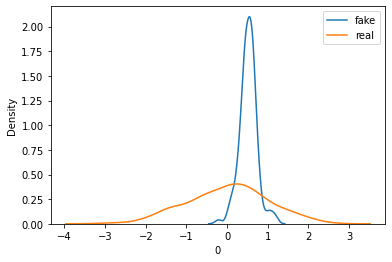

>Saved: drive/My Drive/GANs/synthetic/20201102-142755_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-142755_c_model_00070.h5


> iteration 54: #accepts 22018
60th percentile of preds: 0.954
60th percentile of preds: 0.503
60th percentile of preds: 0.77
             feat_1        feat_2  ...   gender_Male        TARGET
count  55000.000000  55000.000000  ...  55000.000000  55000.000000
mean       0.544483     -0.336598  ...      0.435135      0.502145
std        0.195119      0.249557  ...      0.228452      0.500000
min       -0.770197     -2.191322  ...     -0.863581      0.000000
25%        0.429625     -0.488507  ...      0.290243      0.000000
50%        0.538083     -0.318441  ...      0.429039      1.000000
75%        0.655739     -0.167946  ...      0.569008      1.000000
max        1.982588      1.290108  ...      2.104614      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.824
60th percentile of preds: 0.672


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 53: 
tao: 0.043780283703467274
accepts: 400 with 0.0425% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

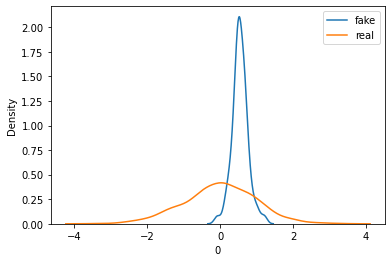

>Saved: drive/My Drive/GANs/synthetic/20201102-142822_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-142822_c_model_00070.h5


> iteration 55: #accepts 22418
60th percentile of preds: 0.954
60th percentile of preds: 0.491
60th percentile of preds: 0.723
             feat_1        feat_2  ...   gender_Male        TARGET
count  56000.000000  56000.000000  ...  56000.000000  56000.000000
mean       0.553343     -0.328528  ...      0.444543      0.503000
std        0.199026      0.245719  ...      0.234693      0.499995
min       -0.843931     -1.949878  ...     -0.811988      0.000000
25%        0.433963     -0.478593  ...      0.293800      0.000000
50%        0.543104     -0.312749  ...      0.435616      1.000000
75%        0.662734     -0.165075  ...      0.578287      1.000000
max        2.043748      0.908857  ...      2.203434      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.814
60th percentile of preds: 0.625


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


iter 54: 
tao: 0.041220329690292594
accepts: 400 with 0.015% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:199: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


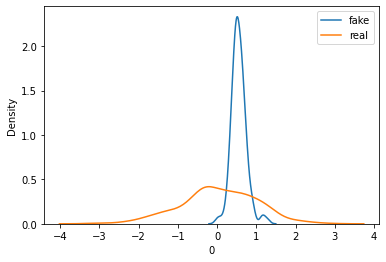

>Saved: drive/My Drive/GANs/synthetic/20201102-142849_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-142849_c_model_00070.h5


> iteration 56: #accepts 22818
60th percentile of preds: 0.954
60th percentile of preds: 0.49
60th percentile of preds: 0.734
             feat_1        feat_2  ...   gender_Male        TARGET
count  57000.000000  57000.000000  ...  57000.000000  57000.000000
mean       0.568923     -0.318525  ...      0.439241      0.499737
std        0.197540      0.241688  ...      0.230419      0.500004
min       -0.696791     -2.044430  ...     -1.000937      0.000000
25%        0.451348     -0.467091  ...      0.290474      0.000000
50%        0.558818     -0.304922  ...      0.430861      0.000000
75%        0.677721     -0.158321  ...      0.573117      1.000000
max        2.194132      1.598120  ...      2.027578      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.82
60th percentile of preds: 0.633


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 55: 
tao: 0.04206767740603172
accepts: 400 with 0.0325% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

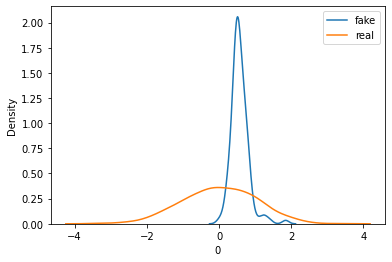

>Saved: drive/My Drive/GANs/synthetic/20201102-142919_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-142919_c_model_00070.h5


> iteration 57: #accepts 23218
60th percentile of preds: 0.954
60th percentile of preds: 0.49
60th percentile of preds: 0.743
             feat_1        feat_2  ...   gender_Male        TARGET
count  58000.000000  58000.000000  ...  58000.000000  58000.000000
mean       0.568879     -0.309918  ...      0.440067      0.504948
std        0.200384      0.242330  ...      0.228489      0.499980
min       -0.681965     -2.209319  ...     -1.017942      0.000000
25%        0.449363     -0.458102  ...      0.292551      0.000000
50%        0.557837     -0.297543  ...      0.433984      1.000000
75%        0.676347     -0.149882  ...      0.572502      1.000000
max        2.212569      1.129937  ...      2.391485      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.809
60th percentile of preds: 0.633


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 56: 
tao: 0.04049878333575958
accepts: 400 with 0.0225% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

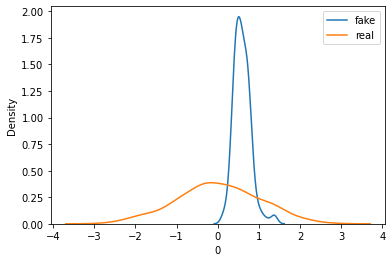

>Saved: drive/My Drive/GANs/synthetic/20201102-142949_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-142949_c_model_00070.h5


> iteration 58: #accepts 23618
60th percentile of preds: 0.953
60th percentile of preds: 0.486
60th percentile of preds: 0.719
             feat_1        feat_2  ...   gender_Male        TARGET
count  59000.000000  59000.000000  ...  59000.000000  59000.000000
mean       0.567968     -0.318306  ...      0.437142      0.503051
std        0.198915      0.240988  ...      0.227923      0.499995
min       -0.698494     -2.140989  ...     -0.811994      0.000000
25%        0.448657     -0.462900  ...      0.289074      0.000000
50%        0.555582     -0.304298  ...      0.431102      1.000000
75%        0.675222     -0.159255  ...      0.571119      1.000000
max        2.000587      1.242044  ...      2.108301      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.811
60th percentile of preds: 0.615


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 57: 
tao: 0.040034253007301686
accepts: 400 with 0.035% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

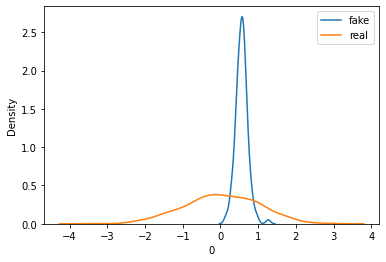

>Saved: drive/My Drive/GANs/synthetic/20201102-143018_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-143018_c_model_00070.h5


> iteration 59: #accepts 24018
60th percentile of preds: 0.953
60th percentile of preds: 0.481
60th percentile of preds: 0.713
             feat_1        feat_2  ...   gender_Male        TARGET
count  60000.000000  60000.000000  ...  60000.000000  60000.000000
mean       0.564090     -0.318173  ...      0.441459      0.498517
std        0.201404      0.239250  ...      0.228274      0.500002
min       -0.732862     -1.960941  ...     -0.841216      0.000000
25%        0.444357     -0.464450  ...      0.293897      0.000000
50%        0.549953     -0.304667  ...      0.433829      0.000000
75%        0.670547     -0.158898  ...      0.574957      1.000000
max        2.122994      1.132896  ...      2.096433      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.805
60th percentile of preds: 0.598


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 58: 
tao: 0.0397889263281877
accepts: 400 with 0.0125% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

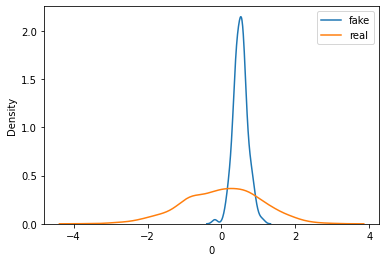

>Saved: drive/My Drive/GANs/synthetic/20201102-143048_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-143048_c_model_00070.h5


> iteration 60: #accepts 24418
60th percentile of preds: 0.953
60th percentile of preds: 0.482
60th percentile of preds: 0.719
             feat_1        feat_2  ...   gender_Male        TARGET
count  61000.000000  61000.000000  ...  61000.000000  61000.000000
mean       0.553355     -0.319534  ...      0.431358      0.502754
std        0.196314      0.239138  ...      0.225286      0.499997
min       -0.828238     -2.119767  ...     -0.882481      0.000000
25%        0.434723     -0.465048  ...      0.285658      0.000000
50%        0.540382     -0.308439  ...      0.425797      1.000000
75%        0.657245     -0.163318  ...      0.565919      1.000000
max        2.131293      1.695491  ...      2.039998      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.802
60th percentile of preds: 0.604


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 59: 
tao: 0.04145201708174548
accepts: 400 with 0.025% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

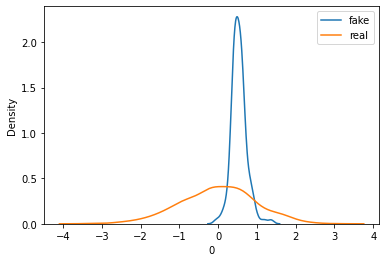

>Saved: drive/My Drive/GANs/synthetic/20201102-143120_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-143120_c_model_00070.h5


> iteration 61: #accepts 24818
60th percentile of preds: 0.953
60th percentile of preds: 0.479
60th percentile of preds: 0.707
             feat_1        feat_2  ...   gender_Male        TARGET
count  62000.000000  62000.000000  ...  62000.000000  62000.000000
mean       0.552990     -0.310026  ...      0.430788      0.498210
std        0.204957      0.236938  ...      0.226537      0.500001
min       -0.757471     -2.117778  ...     -0.873531      0.000000
25%        0.429427     -0.453860  ...      0.284456      0.000000
50%        0.535084     -0.298334  ...      0.423961      0.000000
75%        0.655777     -0.155234  ...      0.563925      1.000000
max        2.243974      1.187938  ...      2.467998      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.791
60th percentile of preds: 0.588


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 60: 
tao: 0.04134560755207152
accepts: 400 with 0.03% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

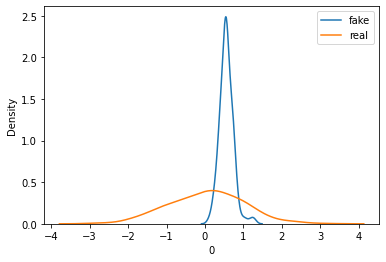

>Saved: drive/My Drive/GANs/synthetic/20201102-143151_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-143151_c_model_00070.h5


> iteration 62: #accepts 25218
60th percentile of preds: 0.953
60th percentile of preds: 0.481
60th percentile of preds: 0.689
             feat_1        feat_2  ...   gender_Male        TARGET
count  63000.000000  63000.000000  ...  63000.000000  63000.000000
mean       0.570445     -0.316761  ...      0.419009      0.500349
std        0.202334      0.236473  ...      0.224091      0.500004
min       -0.499345     -2.497951  ...     -0.830277      0.000000
25%        0.447116     -0.460324  ...      0.273802      0.000000
50%        0.553024     -0.303532  ...      0.412116      1.000000
75%        0.672527     -0.160597  ...      0.550722      1.000000
max        2.171240      1.179537  ...      2.341031      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.792
60th percentile of preds: 0.589


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 61: 
tao: 0.04145008215382151
accepts: 400 with 0.0275% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

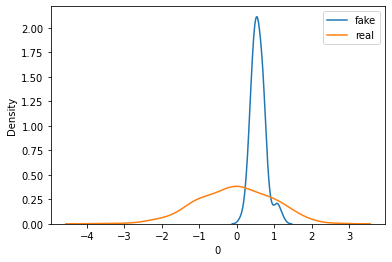

>Saved: drive/My Drive/GANs/synthetic/20201102-143222_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-143222_c_model_00070.h5


> iteration 63: #accepts 25618
60th percentile of preds: 0.954
60th percentile of preds: 0.484
60th percentile of preds: 0.717
             feat_1        feat_2  ...   gender_Male        TARGET
count  64000.000000  64000.000000  ...  64000.000000  64000.000000
mean       0.567067     -0.313759  ...      0.410644      0.500062
std        0.199510      0.236048  ...      0.222120      0.500004
min       -0.993851     -1.946453  ...     -0.997739      0.000000
25%        0.448123     -0.457319  ...      0.268165      0.000000
50%        0.553573     -0.300657  ...      0.406274      1.000000
75%        0.668771     -0.158996  ...      0.544252      1.000000
max        2.440811      1.118981  ...      2.223501      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.804
60th percentile of preds: 0.602


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 62: 
tao: 0.03967418869430065
accepts: 400 with 0.0175% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

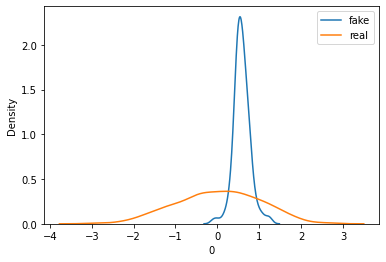

>Saved: drive/My Drive/GANs/synthetic/20201102-143255_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-143255_c_model_00070.h5


> iteration 64: #accepts 26018
60th percentile of preds: 0.954
60th percentile of preds: 0.49
60th percentile of preds: 0.726
             feat_1        feat_2  ...   gender_Male        TARGET
count  65000.000000  65000.000000  ...  65000.000000  65000.000000
mean       0.575925     -0.307626  ...      0.414085      0.500877
std        0.200724      0.233373  ...      0.220813      0.500003
min       -0.915426     -2.262527  ...     -1.144140      0.000000
25%        0.455793     -0.449258  ...      0.272675      0.000000
50%        0.561109     -0.296260  ...      0.409043      1.000000
75%        0.678652     -0.154916  ...      0.546027      1.000000
max        2.452872      1.473796  ...      1.982782      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.799
60th percentile of preds: 0.616


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 63: 
tao: 0.041566824261872276
accepts: 400 with 0.0225% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

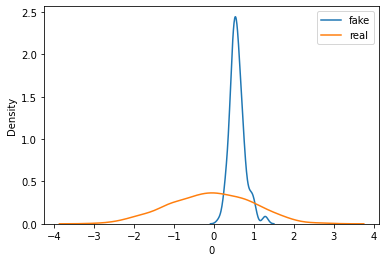

>Saved: drive/My Drive/GANs/synthetic/20201102-143327_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-143327_c_model_00070.h5


> iteration 65: #accepts 26418
60th percentile of preds: 0.954
60th percentile of preds: 0.49
60th percentile of preds: 0.723
             feat_1        feat_2  ...   gender_Male        TARGET
count  66000.000000  66000.000000  ...  66000.000000  66000.000000
mean       0.596826     -0.313877  ...      0.417296      0.499955
std        0.200322      0.232803  ...      0.222842      0.500004
min       -0.506204     -2.322993  ...     -0.894943      0.000000
25%        0.476001     -0.455345  ...      0.274063      0.000000
50%        0.581003     -0.303012  ...      0.411092      0.000000
75%        0.699399     -0.162661  ...      0.548405      1.000000
max        2.479314      1.475682  ...      2.050588      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.804
60th percentile of preds: 0.608


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 64: 
tao: 0.041223654582378116
accepts: 400 with 0.0225% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

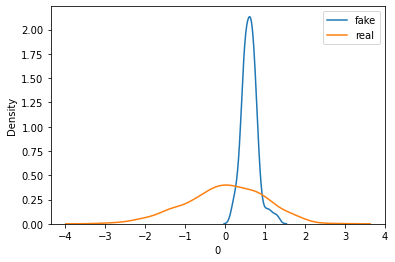

>Saved: drive/My Drive/GANs/synthetic/20201102-143359_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-143359_c_model_00070.h5


> iteration 66: #accepts 26818
60th percentile of preds: 0.954
60th percentile of preds: 0.502
60th percentile of preds: 0.765
             feat_1        feat_2  ...   gender_Male        TARGET
count  67000.000000  67000.000000  ...  67000.000000  67000.000000
mean       0.601145     -0.329887  ...      0.404865      0.497075
std        0.195831      0.233750  ...      0.220607      0.499995
min       -0.586486     -2.386001  ...     -0.925118      0.000000
25%        0.484128     -0.469885  ...      0.261947      0.000000
50%        0.587316     -0.318161  ...      0.398289      0.000000
75%        0.703326     -0.176333  ...      0.534414      1.000000
max        1.961071      1.208002  ...      2.432725      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.814
60th percentile of preds: 0.677


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 65: 
tao: 0.03788257829245608
accepts: 400 with 0.015% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

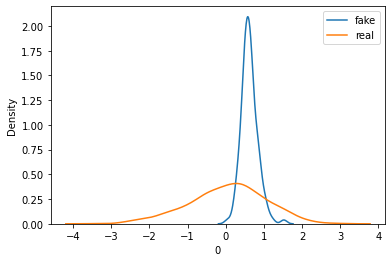

>Saved: drive/My Drive/GANs/synthetic/20201102-143433_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-143433_c_model_00070.h5


> iteration 67: #accepts 27218
60th percentile of preds: 0.954
60th percentile of preds: 0.5
60th percentile of preds: 0.754
             feat_1        feat_2  ...   gender_Male        TARGET
count  68000.000000  68000.000000  ...  68000.000000  68000.000000
mean       0.601528     -0.343200  ...      0.397905      0.500250
std        0.196726      0.231766  ...      0.218829      0.500004
min       -0.749609     -2.386921  ...     -0.907202      0.000000
25%        0.485868     -0.483991  ...      0.258096      0.000000
50%        0.588769     -0.330974  ...      0.393663      1.000000
75%        0.703104     -0.189212  ...      0.526820      1.000000
max        2.020403      1.549860  ...      2.237846      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.812
60th percentile of preds: 0.659


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 66: 
tao: 0.041180171548806606
accepts: 400 with 0.0275% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

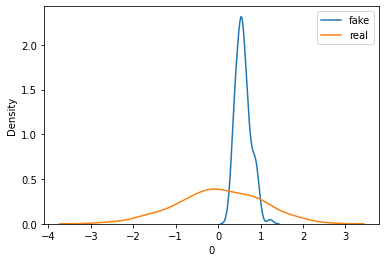

>Saved: drive/My Drive/GANs/synthetic/20201102-143506_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-143506_c_model_00070.h5


> iteration 68: #accepts 27618
60th percentile of preds: 0.954
60th percentile of preds: 0.497
60th percentile of preds: 0.74
             feat_1        feat_2  ...   gender_Male        TARGET
count  69000.000000  69000.000000  ...  69000.000000  69000.000000
mean       0.581749     -0.332749  ...      0.392731      0.498928
std        0.190444      0.229414  ...      0.218940      0.500002
min       -0.646951     -1.979169  ...     -0.864536      0.000000
25%        0.469271     -0.472395  ...      0.251564      0.000000
50%        0.571838     -0.320914  ...      0.387531      0.000000
75%        0.683432     -0.181519  ...      0.521633      1.000000
max        2.089236      1.277753  ...      2.140795      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.803
60th percentile of preds: 0.634


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 67: 
tao: 0.03744665960117828
accepts: 400 with 0.0225% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

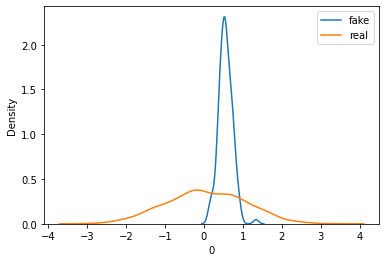

>Saved: drive/My Drive/GANs/synthetic/20201102-143540_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-143540_c_model_00070.h5


> iteration 69: #accepts 28018
60th percentile of preds: 0.953
60th percentile of preds: 0.491
60th percentile of preds: 0.719
             feat_1        feat_2  ...   gender_Male        TARGET
count  70000.000000  70000.000000  ...  70000.000000  70000.000000
mean       0.560252     -0.319879  ...      0.396253      0.500600
std        0.187558      0.226319  ...      0.217183      0.500003
min       -0.655655     -2.185000  ...     -0.845417      0.000000
25%        0.449712     -0.459513  ...      0.258366      0.000000
50%        0.551372     -0.306900  ...      0.390608      1.000000
75%        0.663072     -0.169773  ...      0.524864      1.000000
max        2.105959      0.933022  ...      1.964966      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.803
60th percentile of preds: 0.604


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 68: 
tao: 0.03923051995908271
accepts: 400 with 0.015% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

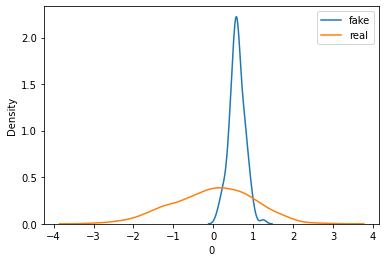

>Saved: drive/My Drive/GANs/synthetic/20201102-143616_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-143616_c_model_00070.h5


> iteration 70: #accepts 28418
60th percentile of preds: 0.953
60th percentile of preds: 0.496
60th percentile of preds: 0.727
             feat_1        feat_2  ...   gender_Male        TARGET
count  71000.000000  71000.000000  ...  71000.000000  71000.000000
mean       0.570610     -0.319208  ...      0.387519      0.502352
std        0.187074      0.227564  ...      0.213714      0.499998
min       -0.680387     -2.005878  ...     -0.920228      0.000000
25%        0.459700     -0.455224  ...      0.253159      0.000000
50%        0.560562     -0.306312  ...      0.382862      1.000000
75%        0.671880     -0.169220  ...      0.515502      1.000000
max        2.208072      1.034591  ...      2.004994      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.798
60th percentile of preds: 0.62


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 69: 
tao: 0.04006746946469478
accepts: 400 with 0.0225% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

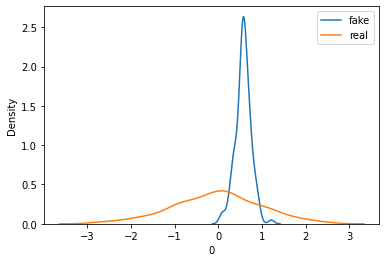

>Saved: drive/My Drive/GANs/synthetic/20201102-143652_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-143652_c_model_00070.h5


> iteration 71: #accepts 28818
60th percentile of preds: 0.953
60th percentile of preds: 0.507
60th percentile of preds: 0.789
             feat_1        feat_2  ...   gender_Male        TARGET
count  72000.000000  72000.000000  ...  72000.000000  72000.000000
mean       0.594382     -0.316748  ...      0.366470      0.497653
std        0.189289      0.225784  ...      0.212675      0.499998
min       -0.740136     -2.512127  ...     -1.012429      0.000000
25%        0.483799     -0.454935  ...      0.233048      0.000000
50%        0.583126     -0.304215  ...      0.363234      0.000000
75%        0.694152     -0.167086  ...      0.493939      1.000000
max        2.098612      1.076214  ...      1.830423      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.806
60th percentile of preds: 0.681


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.956
iter 70: 
tao: 0.03848010635989267
accepts: 400 with 0.0225% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

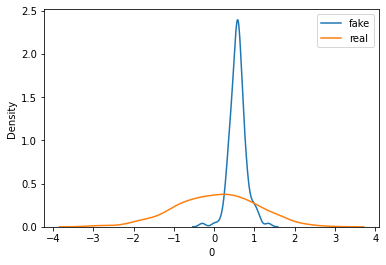

>Saved: drive/My Drive/GANs/synthetic/20201102-143730_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-143730_c_model_00070.h5


> iteration 72: #accepts 29218
60th percentile of preds: 0.954
60th percentile of preds: 0.502
60th percentile of preds: 0.778
             feat_1        feat_2  ...   gender_Male        TARGET
count  73000.000000  73000.000000  ...  73000.000000  73000.000000
mean       0.593571     -0.312354  ...      0.348659      0.503877
std        0.185813      0.226837  ...      0.211559      0.499988
min       -0.565191     -2.292257  ...     -1.127133      0.000000
25%        0.485703     -0.449898  ...      0.217055      0.000000
50%        0.584573     -0.299804  ...      0.347624      1.000000
75%        0.694930     -0.162294  ...      0.478746      1.000000
max        2.229050      1.157246  ...      1.714888      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.807
60th percentile of preds: 0.668


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.956
iter 71: 
tao: 0.03999416577390655
accepts: 400 with 0.0125% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

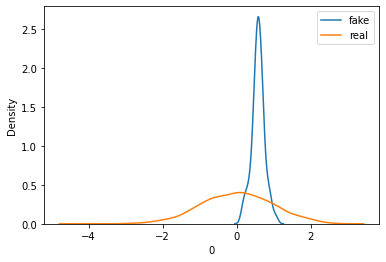

>Saved: drive/My Drive/GANs/synthetic/20201102-143810_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-143810_c_model_00070.h5


> iteration 73: #accepts 29618
60th percentile of preds: 0.954
60th percentile of preds: 0.508
60th percentile of preds: 0.813
             feat_1        feat_2  ...   gender_Male        TARGET
count  74000.000000  74000.000000  ...  74000.000000  74000.000000
mean       0.584626     -0.323697  ...      0.344195      0.499811
std        0.183249      0.224756  ...      0.208413      0.500003
min       -0.506528     -2.252647  ...     -1.026045      0.000000
25%        0.477838     -0.461288  ...      0.214533      0.000000
50%        0.577621     -0.310829  ...      0.344680      0.000000
75%        0.685521     -0.173823  ...      0.473273      1.000000
max        2.223228      1.010188  ...      1.745586      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.817
60th percentile of preds: 0.709


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.956
iter 72: 
tao: 0.03881533014800678
accepts: 400 with 0.0275% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

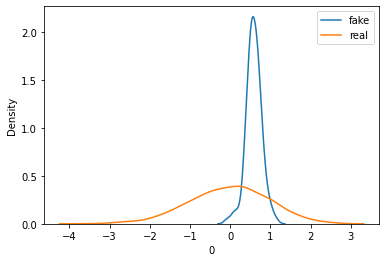

>Saved: drive/My Drive/GANs/synthetic/20201102-143850_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-143850_c_model_00070.h5


> iteration 74: #accepts 30018
60th percentile of preds: 0.953
60th percentile of preds: 0.512
60th percentile of preds: 0.832
             feat_1        feat_2  ...   gender_Male        TARGET
count  75000.000000  75000.000000  ...  75000.000000  75000.000000
mean       0.601947     -0.329354  ...      0.341121      0.502027
std        0.186055      0.224713  ...      0.209161      0.499999
min       -0.895306     -2.346180  ...     -1.308585      0.000000
25%        0.492711     -0.468535  ...      0.211020      0.000000
50%        0.594015     -0.316378  ...      0.341308      1.000000
75%        0.703349     -0.179285  ...      0.469233      1.000000
max        2.373234      0.861385  ...      2.014611      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.817
60th percentile of preds: 0.728


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.956
iter 73: 
tao: 0.03931996692119431
accepts: 400 with 0.025% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

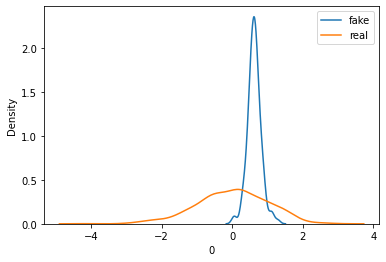

>Saved: drive/My Drive/GANs/synthetic/20201102-143934_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-143934_c_model_00070.h5


> iteration 75: #accepts 30418
60th percentile of preds: 0.954
60th percentile of preds: 0.521
60th percentile of preds: 0.893
             feat_1        feat_2  ...   gender_Male        TARGET
count  76000.000000  76000.000000  ...  76000.000000  76000.000000
mean       0.622491     -0.334764  ...      0.319755      0.496737
std        0.185449      0.223561  ...      0.207856      0.499993
min       -0.617178     -2.397313  ...     -1.090842      0.000000
25%        0.513766     -0.471846  ...      0.191214      0.000000
50%        0.613319     -0.321544  ...      0.320872      0.000000
75%        0.722044     -0.186204  ...      0.448579      1.000000
max        2.006526      0.965166  ...      2.122232      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.822
60th percentile of preds: 0.805


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.956
iter 74: 
tao: 0.03874386078041597
accepts: 400 with 0.0275% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

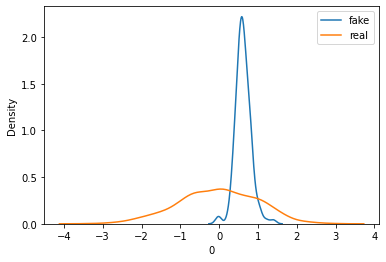

>Saved: drive/My Drive/GANs/synthetic/20201102-144015_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-144015_c_model_00070.h5


> iteration 76: #accepts 30818
60th percentile of preds: 0.954
60th percentile of preds: 0.516
60th percentile of preds: 0.884
             feat_1        feat_2  ...   gender_Male        TARGET
count  77000.000000  77000.000000  ...  77000.000000  77000.000000
mean       0.610917     -0.314560  ...      0.320626      0.500104
std        0.180026      0.218129  ...      0.204721      0.500003
min       -0.822849     -2.263472  ...     -1.416880      0.000000
25%        0.506568     -0.451270  ...      0.195895      0.000000
50%        0.607099     -0.304342  ...      0.323625      1.000000
75%        0.712968     -0.168812  ...      0.451084      1.000000
max        1.946241      1.009240  ...      1.551040      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.836
60th percentile of preds: 0.794


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.956
iter 75: 
tao: 0.041311500328619716
accepts: 400 with 0.025% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

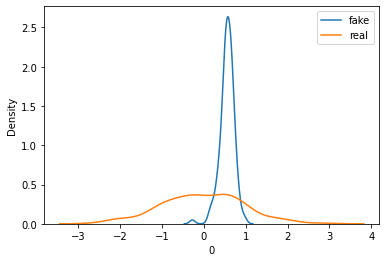

>Saved: drive/My Drive/GANs/synthetic/20201102-144057_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-144057_c_model_00070.h5


> iteration 77: #accepts 31218
60th percentile of preds: 0.954
60th percentile of preds: 0.523
60th percentile of preds: 0.89
             feat_1        feat_2  ...   gender_Male        TARGET
count  78000.000000  78000.000000  ...  78000.000000  78000.000000
mean       0.580419     -0.296751  ...      0.321319      0.504385
std        0.179194      0.217008  ...      0.206104      0.499984
min       -0.927147     -2.090589  ...     -1.103941      0.000000
25%        0.477708     -0.431726  ...      0.194114      0.000000
50%        0.577393     -0.287167  ...      0.323793      1.000000
75%        0.683753     -0.154006  ...      0.451233      1.000000
max        1.841134      1.353196  ...      1.582441      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.827
60th percentile of preds: 0.797


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.956
iter 76: 
tao: 0.040478231034173966
accepts: 400 with 0.0125% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

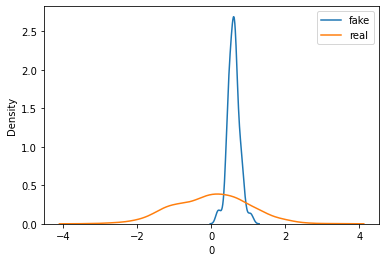

>Saved: drive/My Drive/GANs/synthetic/20201102-144140_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-144140_c_model_00070.h5


> iteration 78: #accepts 31618
60th percentile of preds: 0.954
60th percentile of preds: 0.519
60th percentile of preds: 0.889
             feat_1        feat_2  ...   gender_Male        TARGET
count  79000.000000  79000.000000  ...  79000.000000  79000.000000
mean       0.593583     -0.301659  ...      0.316053      0.500430
std        0.176176      0.217893  ...      0.205485      0.500003
min       -0.727785     -2.181425  ...     -1.347471      0.000000
25%        0.491829     -0.436979  ...      0.189437      0.000000
50%        0.589927     -0.291945  ...      0.317910      1.000000
75%        0.694253     -0.157486  ...      0.444607      1.000000
max        1.933282      0.816431  ...      1.678861      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.829
60th percentile of preds: 0.802


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.956
iter 77: 
tao: 0.04046071571674685
accepts: 400 with 0.0225% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

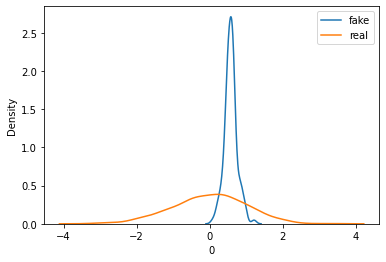

>Saved: drive/My Drive/GANs/synthetic/20201102-144224_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-144224_c_model_00070.h5


> iteration 79: #accepts 32018
60th percentile of preds: 0.954
60th percentile of preds: 0.519
60th percentile of preds: 0.895
             feat_1        feat_2  ...   gender_Male        TARGET
count  80000.000000  80000.000000  ...  80000.000000  80000.000000
mean       0.587227     -0.298204  ...      0.310885      0.500325
std        0.176770      0.216537  ...      0.203052      0.500003
min       -0.509158     -1.859246  ...     -1.102134      0.000000
25%        0.483841     -0.432933  ...      0.184947      0.000000
50%        0.583134     -0.288147  ...      0.313679      1.000000
75%        0.689427     -0.152947  ...      0.438843      1.000000
max        1.854715      1.143748  ...      1.652904      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.831
60th percentile of preds: 0.796


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.956
iter 78: 
tao: 0.03888452381708093
accepts: 400 with 0.0275% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

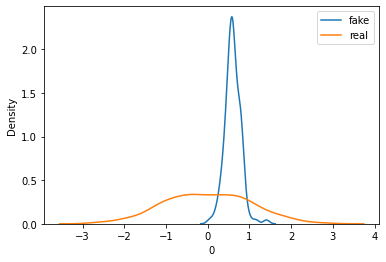

>Saved: drive/My Drive/GANs/synthetic/20201102-144307_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-144307_c_model_00070.h5


> iteration 80: #accepts 32418
60th percentile of preds: 0.954
60th percentile of preds: 0.511
60th percentile of preds: 0.869
             feat_1        feat_2  ...   gender_Male        TARGET
count  81000.000000  81000.000000  ...  81000.000000  81000.000000
mean       0.577533     -0.285469  ...      0.310993      0.499407
std        0.176188      0.214368  ...      0.204581      0.500003
min       -0.946565     -2.246067  ...     -1.132625      0.000000
25%        0.474175     -0.417013  ...      0.183322      0.000000
50%        0.572948     -0.275705  ...      0.312800      0.000000
75%        0.678391     -0.143077  ...      0.440751      1.000000
max        1.987743      0.857337  ...      1.777793      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.824
60th percentile of preds: 0.76


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.956
iter 79: 
tao: 0.037748084169000676
accepts: 400 with 0.0275% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

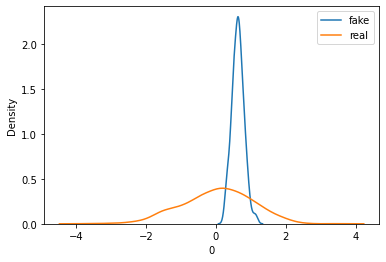

>Saved: drive/My Drive/GANs/synthetic/20201102-144354_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-144354_c_model_00070.h5


> iteration 81: #accepts 32818
60th percentile of preds: 0.955
60th percentile of preds: 0.519
60th percentile of preds: 0.897
             feat_1        feat_2  ...   gender_Male        TARGET
count  82000.000000  82000.000000  ...  82000.000000  82000.000000
mean       0.593357     -0.289577  ...      0.306169      0.498780
std        0.177373      0.213991  ...      0.205786      0.500002
min       -0.868984     -1.999730  ...     -1.166157      0.000000
25%        0.489064     -0.420824  ...      0.178999      0.000000
50%        0.586538     -0.277818  ...      0.309249      0.000000
75%        0.692327     -0.146100  ...      0.436200      1.000000
max        1.996442      0.998430  ...      1.612729      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.832
60th percentile of preds: 0.814


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 80: 
tao: 0.03821292434533166
accepts: 400 with 0.0325% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

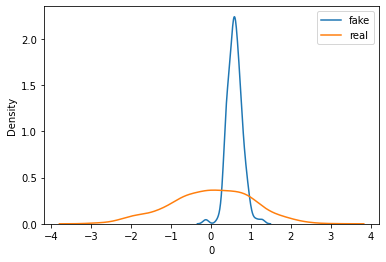

>Saved: drive/My Drive/GANs/synthetic/20201102-144441_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-144441_c_model_00070.h5


> iteration 82: #accepts 33218
60th percentile of preds: 0.955
60th percentile of preds: 0.515
60th percentile of preds: 0.878
             feat_1        feat_2  ...   gender_Male        TARGET
count  83000.000000  83000.000000  ...  83000.000000  83000.000000
mean       0.604273     -0.284215  ...      0.300152      0.502048
std        0.177629      0.217528  ...      0.205119      0.499999
min       -0.711411     -2.211339  ...     -1.198605      0.000000
25%        0.499842     -0.417014  ...      0.174010      0.000000
50%        0.597301     -0.272757  ...      0.303724      1.000000
75%        0.703063     -0.138734  ...      0.430301      1.000000
max        2.025469      1.413808  ...      1.692970      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.823
60th percentile of preds: 0.799


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 81: 
tao: 0.03765573367807703
accepts: 400 with 0.0225% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

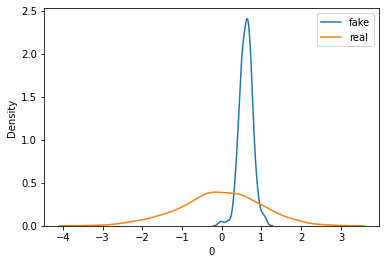

>Saved: drive/My Drive/GANs/synthetic/20201102-144527_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-144527_c_model_00070.h5


> iteration 83: #accepts 33618
60th percentile of preds: 0.954
60th percentile of preds: 0.513
60th percentile of preds: 0.874
             feat_1        feat_2  ...   gender_Male        TARGET
count  84000.000000  84000.000000  ...  84000.000000  84000.000000
mean       0.597153     -0.269472  ...      0.305265      0.499488
std        0.177044      0.214439  ...      0.203537      0.500003
min       -0.668593     -2.044474  ...     -1.083634      0.000000
25%        0.493685     -0.400306  ...      0.179808      0.000000
50%        0.589554     -0.259771  ...      0.307453      0.000000
75%        0.694476     -0.127196  ...      0.434831      1.000000
max        2.229172      1.000396  ...      1.674553      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.82
60th percentile of preds: 0.78


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 82: 
tao: 0.03683840419555766
accepts: 400 with 0.0325% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

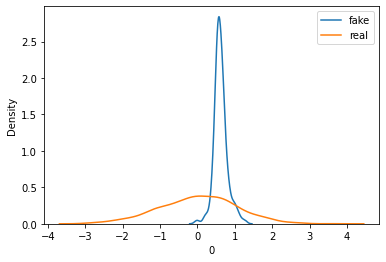

>Saved: drive/My Drive/GANs/synthetic/20201102-144612_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-144612_c_model_00070.h5


> iteration 84: #accepts 34018
60th percentile of preds: 0.954
60th percentile of preds: 0.514
60th percentile of preds: 0.88
             feat_1        feat_2  ...   gender_Male        TARGET
count  85000.000000  85000.000000  ...  85000.000000  85000.000000
mean       0.597359     -0.272560  ...      0.306625      0.498588
std        0.175422      0.213536  ...      0.200526      0.500001
min       -0.438303     -2.146955  ...     -1.074035      0.000000
25%        0.492572     -0.402508  ...      0.180328      0.000000
50%        0.589537     -0.261580  ...      0.308648      0.000000
75%        0.693728     -0.131327  ...      0.433314      1.000000
max        1.988936      1.398941  ...      1.630181      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.818
60th percentile of preds: 0.781


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 83: 
tao: 0.04053263367728496
accepts: 400 with 0.03% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

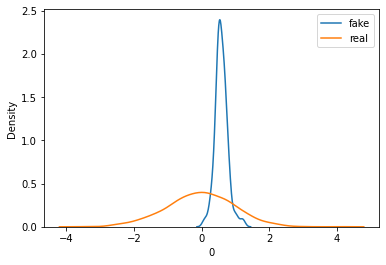

>Saved: drive/My Drive/GANs/synthetic/20201102-144657_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-144657_c_model_00070.h5


> iteration 85: #accepts 34418
60th percentile of preds: 0.954
60th percentile of preds: 0.513
60th percentile of preds: 0.869
             feat_1        feat_2  ...   gender_Male        TARGET
count  86000.000000  86000.000000  ...  86000.000000  86000.000000
mean       0.582430     -0.275633  ...      0.303487      0.498140
std        0.174278      0.213749  ...      0.202986      0.499999
min       -0.659878     -1.836483  ...     -1.054932      0.000000
25%        0.479794     -0.406368  ...      0.177149      0.000000
50%        0.576754     -0.264581  ...      0.306618      0.000000
75%        0.679982     -0.132997  ...      0.433187      1.000000
max        2.138805      0.975550  ...      1.853331      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.817
60th percentile of preds: 0.776


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 84: 
tao: 0.03920100409668767
accepts: 400 with 0.0375% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

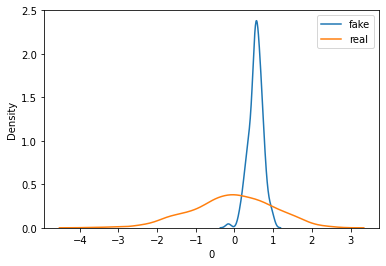

>Saved: drive/My Drive/GANs/synthetic/20201102-144743_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-144743_c_model_00070.h5


> iteration 86: #accepts 34818
60th percentile of preds: 0.953
60th percentile of preds: 0.513
60th percentile of preds: 0.874
             feat_1        feat_2  ...   gender_Male        TARGET
count  87000.000000  87000.000000  ...  87000.000000  87000.000000
mean       0.566058     -0.272557  ...      0.307925      0.497483
std        0.173316      0.212169  ...      0.203944      0.499997
min       -0.726648     -2.097839  ...     -1.044543      0.000000
25%        0.465127     -0.402315  ...      0.180414      0.000000
50%        0.560673     -0.263291  ...      0.311422      0.000000
75%        0.664244     -0.132837  ...      0.438018      1.000000
max        2.205261      1.077274  ...      1.644881      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.819
60th percentile of preds: 0.768


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 85: 
tao: 0.038520279592967374
accepts: 400 with 0.025% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

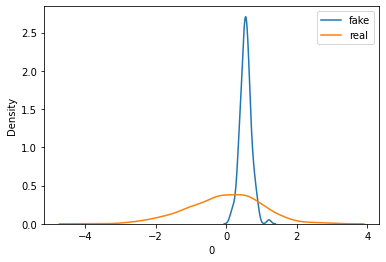

>Saved: drive/My Drive/GANs/synthetic/20201102-144833_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-144833_c_model_00070.h5


> iteration 87: #accepts 35218
60th percentile of preds: 0.953
60th percentile of preds: 0.505
60th percentile of preds: 0.812
             feat_1        feat_2  ...   gender_Male        TARGET
count  88000.000000  88000.000000  ...  88000.000000  88000.000000
mean       0.551874     -0.263269  ...      0.308403      0.503432
std        0.171741      0.210022  ...      0.203795      0.499991
min       -0.757887     -1.886325  ...     -1.191612      0.000000
25%        0.449973     -0.391365  ...      0.181900      0.000000
50%        0.546642     -0.254093  ...      0.311532      1.000000
75%        0.648829     -0.125063  ...      0.438945      1.000000
max        1.900260      1.219299  ...      2.012483      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.811
60th percentile of preds: 0.7


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 86: 
tao: 0.038088979366093574
accepts: 400 with 0.0175% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

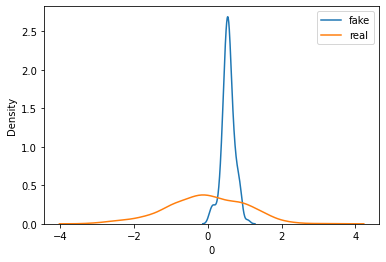

>Saved: drive/My Drive/GANs/synthetic/20201102-144923_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-144923_c_model_00070.h5


> iteration 88: #accepts 35618
60th percentile of preds: 0.953
60th percentile of preds: 0.506
60th percentile of preds: 0.816
             feat_1        feat_2  ...   gender_Male        TARGET
count  89000.000000  89000.000000  ...  89000.000000  89000.000000
mean       0.529222     -0.246492  ...      0.321543      0.498326
std        0.169793      0.208062  ...      0.201431      0.500000
min       -0.602062     -2.272943  ...     -1.098397      0.000000
25%        0.428011     -0.373851  ...      0.194752      0.000000
50%        0.522955     -0.237657  ...      0.322522      0.000000
75%        0.625237     -0.109584  ...      0.450144      1.000000
max        1.915637      1.021330  ...      1.915941      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.804
60th percentile of preds: 0.712


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 87: 
tao: 0.03595723374762539
accepts: 400 with 0.01% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

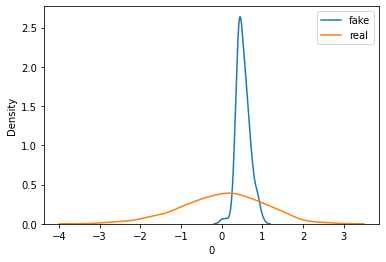

>Saved: drive/My Drive/GANs/synthetic/20201102-145012_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-145012_c_model_00070.h5


> iteration 89: #accepts 36018
60th percentile of preds: 0.952
60th percentile of preds: 0.511
60th percentile of preds: 0.845
             feat_1        feat_2  ...   gender_Male        TARGET
count  90000.000000  90000.000000  ...  90000.000000  90000.000000
mean       0.531570     -0.250924  ...      0.316913      0.501811
std        0.168814      0.207780  ...      0.199670      0.499999
min       -0.453867     -1.973429  ...     -1.076655      0.000000
25%        0.430518     -0.378136  ...      0.190145      0.000000
50%        0.525002     -0.240179  ...      0.317417      1.000000
75%        0.626631     -0.112887  ...      0.444643      1.000000
max        1.961373      0.823498  ...      1.751488      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.798
60th percentile of preds: 0.722


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 88: 
tao: 0.035255803883792056
accepts: 400 with 0.0175% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

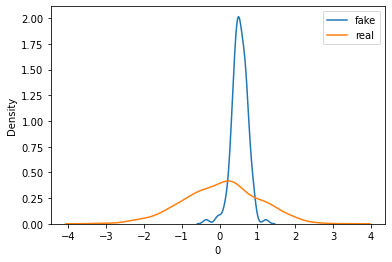

>Saved: drive/My Drive/GANs/synthetic/20201102-145102_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-145102_c_model_00070.h5


> iteration 90: #accepts 36418
60th percentile of preds: 0.952
60th percentile of preds: 0.513
60th percentile of preds: 0.869
             feat_1        feat_2  ...   gender_Male        TARGET
count  91000.000000  91000.000000  ...  91000.000000  91000.000000
mean       0.551801     -0.250605  ...      0.304433      0.502297
std        0.171496      0.205052  ...      0.197404      0.499997
min       -0.401448     -1.653034  ...     -0.884733      0.000000
25%        0.449107     -0.376817  ...      0.177059      0.000000
50%        0.542219     -0.241910  ...      0.304240      1.000000
75%        0.644485     -0.114164  ...      0.429549      1.000000
max        1.906327      1.191205  ...      1.764503      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.793
60th percentile of preds: 0.759


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 89: 
tao: 0.036930677854645884
accepts: 400 with 0.0225% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

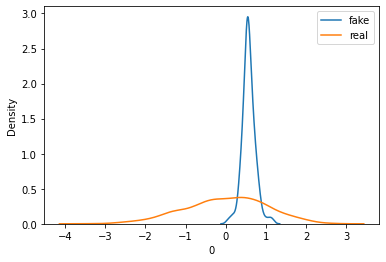

>Saved: drive/My Drive/GANs/synthetic/20201102-145152_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-145152_c_model_00070.h5


> iteration 91: #accepts 36818
60th percentile of preds: 0.952
60th percentile of preds: 0.517
60th percentile of preds: 0.884
             feat_1        feat_2  ...   gender_Male        TARGET
count  92000.000000  92000.000000  ...  92000.000000  92000.000000
mean       0.564628     -0.260729  ...      0.281654      0.501315
std        0.169606      0.207845  ...      0.198584      0.500001
min       -0.536900     -1.935151  ...     -1.061715      0.000000
25%        0.463094     -0.388445  ...      0.157079      0.000000
50%        0.555672     -0.249526  ...      0.284452      1.000000
75%        0.657028     -0.120579  ...      0.409649      1.000000
max        1.892170      1.135914  ...      1.496194      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.801
60th percentile of preds: 0.793


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 90: 
tao: 0.03697508902744576
accepts: 400 with 0.025% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

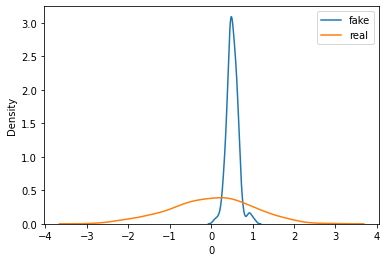

>Saved: drive/My Drive/GANs/synthetic/20201102-145239_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-145239_c_model_00070.h5


> iteration 92: #accepts 37218
60th percentile of preds: 0.951
60th percentile of preds: 0.511
60th percentile of preds: 0.856
             feat_1        feat_2  ...   gender_Male        TARGET
count  93000.000000  93000.000000  ...  93000.000000  93000.000000
mean       0.531845     -0.255687  ...      0.283966      0.499935
std        0.166656      0.207495  ...      0.199654      0.500003
min       -0.548838     -2.080318  ...     -1.243084      0.000000
25%        0.432490     -0.381433  ...      0.158969      0.000000
50%        0.525650     -0.244485  ...      0.286839      0.000000
75%        0.626092     -0.116152  ...      0.412975      1.000000
max        1.798967      1.045876  ...      1.422432      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.797
60th percentile of preds: 0.77


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 91: 
tao: 0.037458585938184075
accepts: 400 with 0.025% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

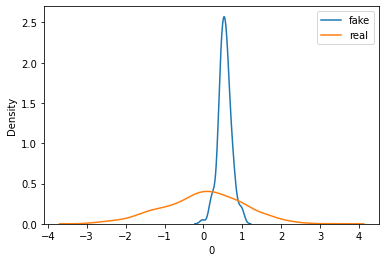

>Saved: drive/My Drive/GANs/synthetic/20201102-145328_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-145328_c_model_00070.h5


> iteration 93: #accepts 37618
60th percentile of preds: 0.952
60th percentile of preds: 0.524
60th percentile of preds: 0.894
             feat_1        feat_2  ...   gender_Male        TARGET
count  94000.000000  94000.000000  ...  94000.000000  94000.000000
mean       0.542835     -0.248428  ...      0.281397      0.501415
std        0.168468      0.206097  ...      0.199930      0.500001
min       -0.433131     -2.057414  ...     -1.177787      0.000000
25%        0.441861     -0.374939  ...      0.157728      0.000000
50%        0.534496     -0.238248  ...      0.284666      1.000000
75%        0.635705     -0.111054  ...      0.409784      1.000000
max        2.158994      0.980338  ...      1.654058      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.805
60th percentile of preds: 0.82


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 92: 
tao: 0.03865199837393685
accepts: 400 with 0.0275% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

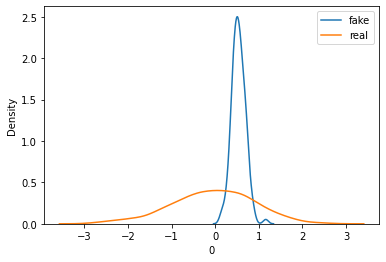

>Saved: drive/My Drive/GANs/synthetic/20201102-145415_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-145415_c_model_00070.h5


> iteration 94: #accepts 38018
60th percentile of preds: 0.952
60th percentile of preds: 0.52
60th percentile of preds: 0.887
             feat_1        feat_2  ...   gender_Male        TARGET
count  95000.000000  95000.000000  ...  95000.000000  95000.000000
mean       0.533094     -0.240548  ...      0.279037      0.499884
std        0.166684      0.203900  ...      0.199342      0.500003
min       -0.680963     -2.205071  ...     -1.299856      0.000000
25%        0.433786     -0.366748  ...      0.154734      0.000000
50%        0.526578     -0.231451  ...      0.282362      0.000000
75%        0.626613     -0.103963  ...      0.407480      1.000000
max        1.878150      1.091841  ...      1.629984      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.813
60th percentile of preds: 0.813


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 93: 
tao: 0.035682315947697524
accepts: 400 with 0.015% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

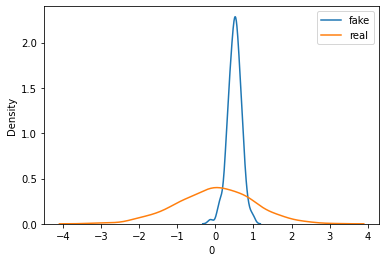

>Saved: drive/My Drive/GANs/synthetic/20201102-145503_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-145503_c_model_00070.h5


> iteration 95: #accepts 38418
60th percentile of preds: 0.952
60th percentile of preds: 0.512
60th percentile of preds: 0.862
             feat_1        feat_2  ...   gender_Male        TARGET
count  96000.000000  96000.000000  ...  96000.000000  96000.000000
mean       0.523348     -0.231403  ...      0.277048      0.497656
std        0.165938      0.202555  ...      0.200999      0.499997
min       -0.555235     -1.931109  ...     -1.141446      0.000000
25%        0.424462     -0.355743  ...      0.154577      0.000000
50%        0.516096     -0.222307  ...      0.282250      0.000000
75%        0.616551     -0.095938  ...      0.408264      1.000000
max        1.838434      1.143487  ...      1.470358      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.798
60th percentile of preds: 0.803


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 94: 
tao: 0.03725361628263214
accepts: 400 with 0.025% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

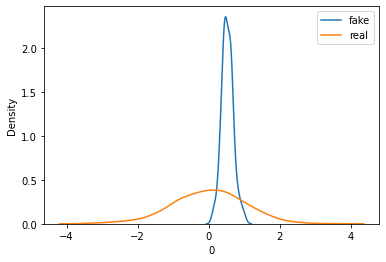

>Saved: drive/My Drive/GANs/synthetic/20201102-145552_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-145552_c_model_00070.h5


> iteration 96: #accepts 38818
60th percentile of preds: 0.953
60th percentile of preds: 0.519
60th percentile of preds: 0.881
             feat_1        feat_2  ...   gender_Male        TARGET
count  97000.000000  97000.000000  ...  97000.000000  97000.000000
mean       0.514899     -0.228157  ...      0.273175      0.497474
std        0.165761      0.202792  ...      0.199980      0.499996
min       -0.705980     -1.926303  ...     -1.292503      0.000000
25%        0.417167     -0.351313  ...      0.151004      0.000000
50%        0.508233     -0.219495  ...      0.279179      0.000000
75%        0.608475     -0.094730  ...      0.405123      1.000000
max        1.773022      1.016793  ...      1.604270      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.795
60th percentile of preds: 0.812


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 95: 
tao: 0.0350939737604251
accepts: 400 with 0.02% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

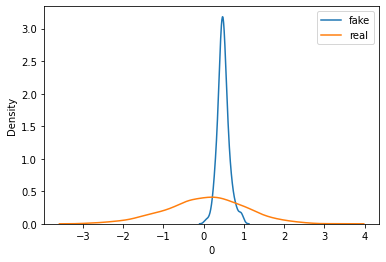

>Saved: drive/My Drive/GANs/synthetic/20201102-145639_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-145639_c_model_00070.h5


> iteration 97: #accepts 39218
60th percentile of preds: 0.953
60th percentile of preds: 0.513
60th percentile of preds: 0.853
             feat_1        feat_2  ...   gender_Male        TARGET
count  98000.000000  98000.000000  ...  98000.000000  98000.000000
mean       0.510685     -0.217504  ...      0.281865      0.500571
std        0.163548      0.201524  ...      0.196729      0.500002
min       -0.750598     -1.972191  ...     -1.085274      0.000000
25%        0.413444     -0.341399  ...      0.159114      0.000000
50%        0.504727     -0.208349  ...      0.284711      1.000000
75%        0.603963     -0.086262  ...      0.408490      1.000000
max        1.654952      1.180393  ...      1.590478      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.792
60th percentile of preds: 0.775


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 96: 
tao: 0.03762133048813144
accepts: 400 with 0.0225% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

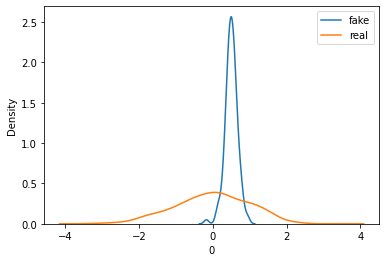

>Saved: drive/My Drive/GANs/synthetic/20201102-145731_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-145731_c_model_00070.h5


> iteration 98: #accepts 39618
60th percentile of preds: 0.953
60th percentile of preds: 0.513
60th percentile of preds: 0.859
             feat_1        feat_2  ...   gender_Male        TARGET
count  99000.000000  99000.000000  ...  99000.000000  99000.000000
mean       0.518904     -0.216158  ...      0.281362      0.499374
std        0.164183      0.201692  ...      0.197823      0.500002
min       -0.683899     -2.096054  ...     -1.069725      0.000000
25%        0.420041     -0.339083  ...      0.156809      0.000000
50%        0.511239     -0.206891  ...      0.283608      0.000000
75%        0.610637     -0.082930  ...      0.409415      1.000000
max        1.768478      0.946281  ...      1.345380      1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.788
60th percentile of preds: 0.777


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 97: 
tao: 0.03596205995958372
accepts: 400 with 0.0125% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

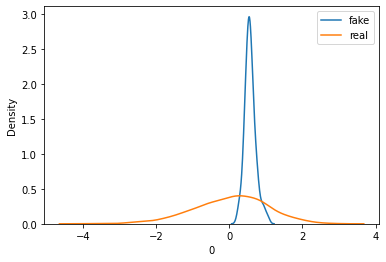

>Saved: drive/My Drive/GANs/synthetic/20201102-145820_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-145820_c_model_00070.h5


> iteration 99: #accepts 40018
60th percentile of preds: 0.952
60th percentile of preds: 0.537
60th percentile of preds: 0.923
              feat_1         feat_2  ...    gender_Male         TARGET
count  100000.000000  100000.000000  ...  100000.000000  100000.000000
mean        0.565101      -0.227184  ...       0.259587       0.499170
std         0.168290       0.201740  ...       0.195487       0.500002
min        -0.386683      -1.893458  ...      -1.243275       0.000000
25%         0.463695      -0.350114  ...       0.137781       0.000000
50%         0.554067      -0.216808  ...       0.262719       0.000000
75%         0.655111      -0.091999  ...       0.386006       1.000000
max         1.943261       1.144453  ...       1.464797       1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.794
60th percentile of preds: 0.852


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


iter 98: 
tao: 0.036536616018031216
accepts: 400 with 0.035% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:199: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


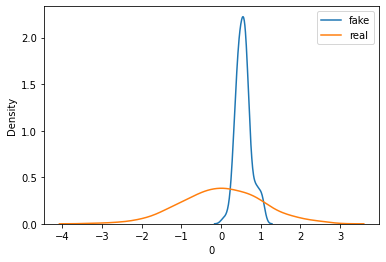

>Saved: drive/My Drive/GANs/synthetic/20201102-145907_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-145907_c_model_00070.h5


> iteration 100: #accepts 40418
60th percentile of preds: 0.953
60th percentile of preds: 0.528
60th percentile of preds: 0.91
              feat_1         feat_2  ...    gender_Male         TARGET
count  101000.000000  101000.000000  ...  101000.000000  101000.000000
mean        0.573447      -0.228557  ...       0.259212       0.501277
std         0.170970       0.201708  ...       0.195726       0.500001
min        -0.566237      -1.974119  ...      -1.002196       0.000000
25%         0.470621      -0.349786  ...       0.136382       0.000000
50%         0.560781      -0.216310  ...       0.261210       1.000000
75%         0.662008      -0.093461  ...       0.385303       1.000000
max         2.042862       0.821095  ...       1.580752       1.000000

[8 rows x 13 columns]
60th percentile of preds: 0.789
60th percentile of preds: 0.833


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
iter 99: 
tao: 0.03709074486336758
accepts: 400 with 0.0225% bad
(1000, 12) (1000,)
n_epochs=10, n_batch=128, 1/2=64, b/e=7, steps=70


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local

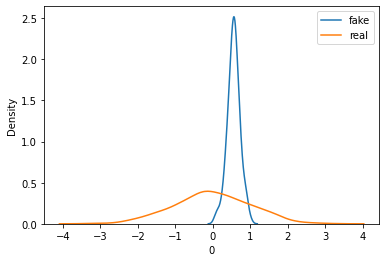

>Saved: drive/My Drive/GANs/synthetic/20201102-145959_g_model_00070.h5, and drive/My Drive/GANs/synthetic/20201102-145959_c_model_00070.h5



In [16]:
D_all_0, c_model, g_model, benchmark, method_1, method_2, method_3, method_all, oracle = acceptance_loop(clf="LR", train=df, test=S, target_col=target_col, reject_col=reject_col, feat_idx=best_feat_idx,
                                                                                                 n_0=n_0, n=n, h=h, alpha=alpha, j_max=j_max, folder=folder, 
                                                                                                 conditional=True, noise_dim=noise_dim,learning_rate=learning_rate/5, 
                                                                                                 dropout=dropout, max_epochs=50, batch_size=batch_size)

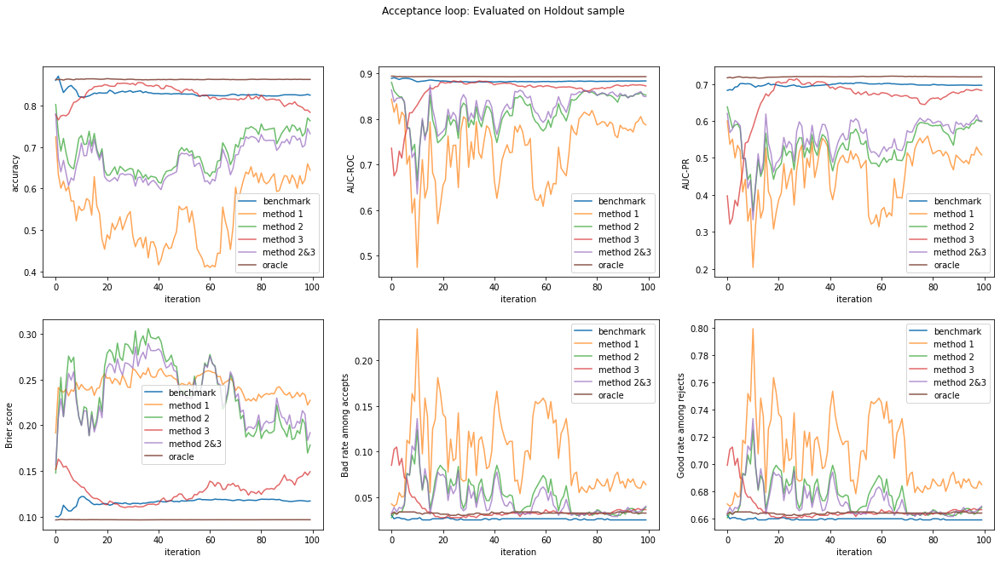

In [19]:
fig, ax = plt.subplots(2,3, figsize=(20,10))
fig.suptitle("Acceptance loop: Evaluated on Holdout sample")

ax[0,0].plot(benchmark.index, benchmark.iloc[:,0], label="benchmark")
ax[0,0].plot(method_1.index, method_1.iloc[:,0], label = "method 1", alpha=0.7)
ax[0,0].plot(method_2.index, method_2.iloc[:,0], label = "method 2", alpha=0.7)
ax[0,0].plot(method_3.index, method_3.iloc[:,0], label = "method 3", alpha=0.7)
ax[0,0].plot(method_all.index, method_all.iloc[:,0], label = "method 2&3", alpha=0.7)
ax[0,0].plot(oracle.index, oracle.iloc[:,0], label="oracle")
ax[0,0].legend()
ax[0,0].set(xlabel="iteration", ylabel="accuracy")

ax[0,1].plot(benchmark.index, benchmark.iloc[:,1], label="benchmark")
ax[0,1].plot(method_1.index, method_1.iloc[:,1], label = "method 1", alpha=0.7)
ax[0,1].plot(method_2.index, method_2.iloc[:,1], label = "method 2", alpha=0.7)
ax[0,1].plot(method_3.index, method_3.iloc[:,1], label = "method 3", alpha=0.7)
ax[0,1].plot(method_all.index, method_all.iloc[:,1], label = "method 2&3", alpha=0.7)
ax[0,1].plot(oracle.index, oracle.iloc[:,1], label="oracle")
ax[0,1].legend()
ax[0,1].set(xlabel="iteration", ylabel="AUC-ROC")

ax[0,2].plot(benchmark.index, benchmark.iloc[:,2], label="benchmark")
ax[0,2].plot(method_1.index, method_1.iloc[:,2], label = "method 1", alpha=0.7)
ax[0,2].plot(method_2.index, method_2.iloc[:,2], label = "method 2", alpha=0.7)
ax[0,2].plot(method_3.index, method_3.iloc[:,2], label = "method 3", alpha=0.7)
ax[0,2].plot(method_all.index, method_all.iloc[:,2], label = "method 2&3", alpha=0.7)
ax[0,2].plot(oracle.index, oracle.iloc[:,2], label="oracle")
ax[0,2].legend()
ax[0,2].set(xlabel="iteration", ylabel="AUC-PR")

ax[1,0].plot(benchmark.index, benchmark.iloc[:,3], label="benchmark")
ax[1,0].plot(method_1.index, method_1.iloc[:,3], label = "method 1", alpha=0.7)
ax[1,0].plot(method_2.index, method_2.iloc[:,3], label = "method 2", alpha=0.7)
ax[1,0].plot(method_3.index, method_3.iloc[:,3], label = "method 3", alpha=0.7)
ax[1,0].plot(method_all.index, method_all.iloc[:,3], label = "method 2&3", alpha=0.7)
ax[1,0].plot(oracle.index, oracle.iloc[:,3], label="oracle")
ax[1,0].legend()
ax[1,0].set(xlabel="iteration", ylabel="Brier score")

ax[1,1].plot(benchmark.index, benchmark.iloc[:,4], label="benchmark")
ax[1,1].plot(method_1.index, method_1.iloc[:,4], label = "method 1", alpha=0.7)
ax[1,1].plot(method_2.index, method_2.iloc[:,4], label = "method 2", alpha=0.7)
ax[1,1].plot(method_3.index, method_3.iloc[:,4], label = "method 3", alpha=0.7)
ax[1,1].plot(method_all.index, method_all.iloc[:,4], label = "method 2&3", alpha=0.7)
ax[1,1].plot(oracle.index, oracle.iloc[:,4], label="oracle")
ax[1,1].legend()
ax[1,1].set(xlabel="iteration", ylabel="Bad rate among accepts")

ax[1,2].plot(benchmark.index, benchmark.iloc[:,5], label="benchmark")
ax[1,2].plot(method_1.index, method_1.iloc[:,5], label = "method 1", alpha=0.7)
ax[1,2].plot(method_2.index, method_2.iloc[:,5], label = "method 2", alpha=0.7)
ax[1,2].plot(method_3.index, method_3.iloc[:,5], label = "method 3", alpha=0.7)
ax[1,2].plot(method_all.index, method_all.iloc[:,5], label = "method 2&3", alpha=0.7)
ax[1,2].plot(oracle.index, oracle.iloc[:,5], label="oracle")
ax[1,2].legend()
ax[1,2].set(xlabel="iteration", ylabel="Good rate among rejects")

fig.savefig("acceptance_loop_results_cond_synth_LR.png")

plt.show()

In [236]:
synth_method1_gaps = make_gaps(method_1, benchmark)
synth_method2_gaps = make_gaps(method_2, benchmark)
synth_method3_gaps = make_gaps(method_3, benchmark)
synth_method4_gaps = make_gaps(method_all, benchmark)

print(synth_method1_gaps)
print(synth_method2_gaps)
print(synth_method3_gaps)
print(synth_method4_gaps)

      accuracy   AUC_ROC    AUC_PR        BS       ABR       RGR
max  -0.136932 -0.045899 -0.082613  0.147483  0.208489  0.139167
min  -0.416292 -0.408007 -0.492846  0.091424  0.012484  0.008333
mean -0.288476 -0.151008 -0.238465  0.127723  0.072697  0.048525
      accuracy   AUC_ROC    AUC_PR        BS       ABR       RGR
max  -0.056972 -0.008642 -0.044519  0.190352  0.097378  0.065000
min  -0.215392 -0.217421 -0.339640  0.047472 -0.002497 -0.001667
mean -0.141409 -0.067098 -0.164123  0.121185  0.024582  0.016408
      accuracy   AUC_ROC    AUC_PR        BS       ABR       RGR
max   0.022989  0.002214  0.020433  0.063287  0.077403  0.051667
min  -0.105947 -0.215917 -0.364413 -0.005227  0.000000  0.000000
mean -0.004498 -0.022896 -0.043989  0.011909  0.010811  0.007217
      accuracy   AUC_ROC    AUC_PR        BS       ABR       RGR
max  -0.080960 -0.011461 -0.062362  0.174025  0.109863  0.073333
min  -0.239380 -0.246719 -0.363413  0.056534  0.002497  0.001667
mean -0.162179 -0.058324 

#### Home Credit data

Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_22 (InputLayer)        [(None, 91)]              0         
_________________________________________________________________
dense_70 (Dense)             (None, 100)               9200      
_________________________________________________________________
batch_normalization_56 (Batc (None, 100)               400       
_________________________________________________________________
leaky_re_lu_28 (LeakyReLU)   (None, 100)               0         
_________________________________________________________________
dropout_28 (Dropout)         (None, 100)               0         
_________________________________________________________________
dense_71 (Dense)             (None, 100)               10100     
_________________________________________________________________
batch_normalization_57 (Batc (None, 100)             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


>Saved: drive/My Drive/GANs/20201027-173102_g_model_00007.h5, and drive/My Drive/GANs/20201027-173102_c_model_00007.h5
>Saved: drive/My Drive/GANs/20201027-173103_g_model_00014.h5, and drive/My Drive/GANs/20201027-173103_c_model_00014.h5
>Saved: drive/My Drive/GANs/20201027-173104_g_model_00021.h5, and drive/My Drive/GANs/20201027-173104_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-173105_g_model_00028.h5, and drive/My Drive/GANs/20201027-173105_c_model_00028.h5
>Saved: drive/My Drive/GANs/20201027-173106_g_model_00035.h5, and drive/My Drive/GANs/20201027-173106_c_model_00035.h5
>Saved: drive/My Drive/GANs/20201027-173107_g_model_00042.h5, and drive/My Drive/GANs/20201027-173107_c_model_00042.h5
>Saved: drive/My Drive/GANs/20201027-173108_g_model_00049.h5, and drive/My Drive/GANs/20201027-173108_c_model_00049.h5
>Saved: drive/My Drive/GANs/20201027-173109_g_model_00056.h5, and drive/My Drive/GANs/20201027-173109_c_model_00056.h5
>Saved: drive/My Drive/GANs/20201027-173110_g_mo

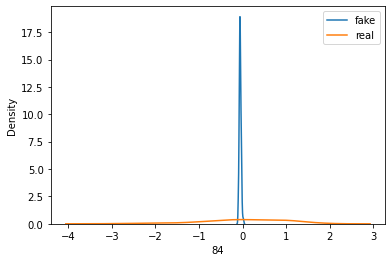

>Saved: drive/My Drive/GANs/20201027-173111_g_model_00070.h5, and drive/My Drive/GANs/20201027-173111_c_model_00070.h5
>Saved: drive/My Drive/GANs/20201027-173113_g_model_00077.h5, and drive/My Drive/GANs/20201027-173113_c_model_00077.h5
>Saved: drive/My Drive/GANs/20201027-173114_g_model_00084.h5, and drive/My Drive/GANs/20201027-173114_c_model_00084.h5
>Saved: drive/My Drive/GANs/20201027-173115_g_model_00091.h5, and drive/My Drive/GANs/20201027-173115_c_model_00091.h5
>Saved: drive/My Drive/GANs/20201027-173116_g_model_00098.h5, and drive/My Drive/GANs/20201027-173116_c_model_00098.h5
>Saved: drive/My Drive/GANs/20201027-173117_g_model_00105.h5, and drive/My Drive/GANs/20201027-173117_c_model_00105.h5
>Saved: drive/My Drive/GANs/20201027-173118_g_model_00112.h5, and drive/My Drive/GANs/20201027-173118_c_model_00112.h5
>Saved: drive/My Drive/GANs/20201027-173119_g_model_00119.h5, and drive/My Drive/GANs/20201027-173119_c_model_00119.h5
>Saved: drive/My Drive/GANs/20201027-173120_g_mo

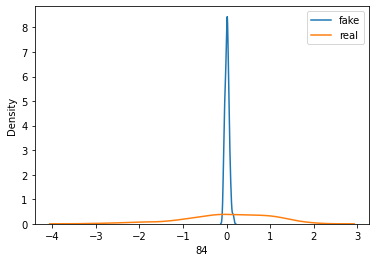

>Saved: drive/My Drive/GANs/20201027-173122_g_model_00140.h5, and drive/My Drive/GANs/20201027-173122_c_model_00140.h5
>Saved: drive/My Drive/GANs/20201027-173123_g_model_00147.h5, and drive/My Drive/GANs/20201027-173123_c_model_00147.h5
>Saved: drive/My Drive/GANs/20201027-173124_g_model_00154.h5, and drive/My Drive/GANs/20201027-173124_c_model_00154.h5
>Saved: drive/My Drive/GANs/20201027-173125_g_model_00161.h5, and drive/My Drive/GANs/20201027-173125_c_model_00161.h5
>Saved: drive/My Drive/GANs/20201027-173126_g_model_00168.h5, and drive/My Drive/GANs/20201027-173126_c_model_00168.h5
>Saved: drive/My Drive/GANs/20201027-173127_g_model_00175.h5, and drive/My Drive/GANs/20201027-173127_c_model_00175.h5
>Saved: drive/My Drive/GANs/20201027-173128_g_model_00182.h5, and drive/My Drive/GANs/20201027-173128_c_model_00182.h5
>Saved: drive/My Drive/GANs/20201027-173129_g_model_00189.h5, and drive/My Drive/GANs/20201027-173129_c_model_00189.h5
>Saved: drive/My Drive/GANs/20201027-173130_g_mo

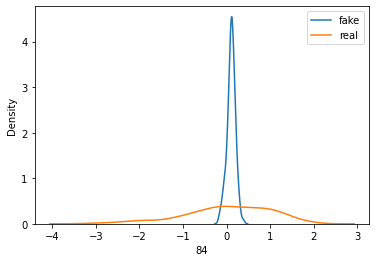

>Saved: drive/My Drive/GANs/20201027-173132_g_model_00210.h5, and drive/My Drive/GANs/20201027-173132_c_model_00210.h5
>Saved: drive/My Drive/GANs/20201027-173134_g_model_00217.h5, and drive/My Drive/GANs/20201027-173134_c_model_00217.h5
>Saved: drive/My Drive/GANs/20201027-173135_g_model_00224.h5, and drive/My Drive/GANs/20201027-173135_c_model_00224.h5
>Saved: drive/My Drive/GANs/20201027-173136_g_model_00231.h5, and drive/My Drive/GANs/20201027-173136_c_model_00231.h5
>Saved: drive/My Drive/GANs/20201027-173137_g_model_00238.h5, and drive/My Drive/GANs/20201027-173137_c_model_00238.h5
>Saved: drive/My Drive/GANs/20201027-173138_g_model_00245.h5, and drive/My Drive/GANs/20201027-173138_c_model_00245.h5
>Saved: drive/My Drive/GANs/20201027-173139_g_model_00252.h5, and drive/My Drive/GANs/20201027-173139_c_model_00252.h5
>Saved: drive/My Drive/GANs/20201027-173140_g_model_00259.h5, and drive/My Drive/GANs/20201027-173140_c_model_00259.h5
>Saved: drive/My Drive/GANs/20201027-173141_g_mo

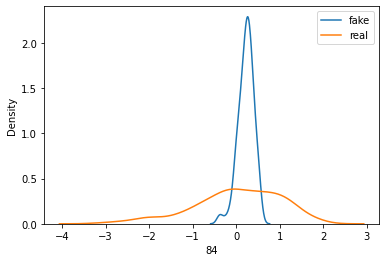

>Saved: drive/My Drive/GANs/20201027-173143_g_model_00280.h5, and drive/My Drive/GANs/20201027-173143_c_model_00280.h5
>Saved: drive/My Drive/GANs/20201027-173144_g_model_00287.h5, and drive/My Drive/GANs/20201027-173144_c_model_00287.h5
>Saved: drive/My Drive/GANs/20201027-173145_g_model_00294.h5, and drive/My Drive/GANs/20201027-173145_c_model_00294.h5
>Saved: drive/My Drive/GANs/20201027-173146_g_model_00301.h5, and drive/My Drive/GANs/20201027-173146_c_model_00301.h5
>Saved: drive/My Drive/GANs/20201027-173147_g_model_00308.h5, and drive/My Drive/GANs/20201027-173147_c_model_00308.h5
>Saved: drive/My Drive/GANs/20201027-173148_g_model_00315.h5, and drive/My Drive/GANs/20201027-173148_c_model_00315.h5
>Saved: drive/My Drive/GANs/20201027-173149_g_model_00322.h5, and drive/My Drive/GANs/20201027-173149_c_model_00322.h5
>Saved: drive/My Drive/GANs/20201027-173150_g_model_00329.h5, and drive/My Drive/GANs/20201027-173150_c_model_00329.h5
>Saved: drive/My Drive/GANs/20201027-173151_g_mo

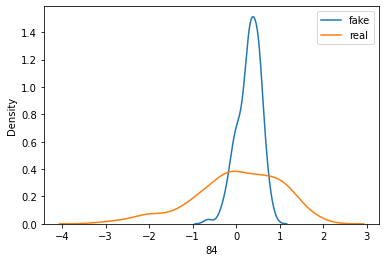

>Saved: drive/My Drive/GANs/20201027-173153_g_model_00350.h5, and drive/My Drive/GANs/20201027-173153_c_model_00350.h5
>Saved: drive/My Drive/GANs/20201027-173154_g_model_00357.h5, and drive/My Drive/GANs/20201027-173154_c_model_00357.h5
>Saved: drive/My Drive/GANs/20201027-173155_g_model_00364.h5, and drive/My Drive/GANs/20201027-173155_c_model_00364.h5
>Saved: drive/My Drive/GANs/20201027-173157_g_model_00371.h5, and drive/My Drive/GANs/20201027-173157_c_model_00371.h5
>Saved: drive/My Drive/GANs/20201027-173158_g_model_00378.h5, and drive/My Drive/GANs/20201027-173158_c_model_00378.h5
>Saved: drive/My Drive/GANs/20201027-173159_g_model_00385.h5, and drive/My Drive/GANs/20201027-173159_c_model_00385.h5
>Saved: drive/My Drive/GANs/20201027-173200_g_model_00392.h5, and drive/My Drive/GANs/20201027-173200_c_model_00392.h5
>Saved: drive/My Drive/GANs/20201027-173201_g_model_00399.h5, and drive/My Drive/GANs/20201027-173201_c_model_00399.h5
>Saved: drive/My Drive/GANs/20201027-173202_g_mo

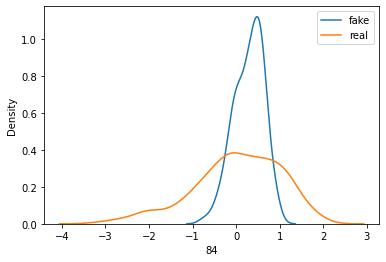

>Saved: drive/My Drive/GANs/20201027-173204_g_model_00420.h5, and drive/My Drive/GANs/20201027-173204_c_model_00420.h5
>Saved: drive/My Drive/GANs/20201027-173205_g_model_00427.h5, and drive/My Drive/GANs/20201027-173205_c_model_00427.h5
>Saved: drive/My Drive/GANs/20201027-173206_g_model_00434.h5, and drive/My Drive/GANs/20201027-173206_c_model_00434.h5
>Saved: drive/My Drive/GANs/20201027-173207_g_model_00441.h5, and drive/My Drive/GANs/20201027-173207_c_model_00441.h5
>Saved: drive/My Drive/GANs/20201027-173208_g_model_00448.h5, and drive/My Drive/GANs/20201027-173208_c_model_00448.h5
>Saved: drive/My Drive/GANs/20201027-173209_g_model_00455.h5, and drive/My Drive/GANs/20201027-173209_c_model_00455.h5
>Saved: drive/My Drive/GANs/20201027-173210_g_model_00462.h5, and drive/My Drive/GANs/20201027-173210_c_model_00462.h5
>Saved: drive/My Drive/GANs/20201027-173211_g_model_00469.h5, and drive/My Drive/GANs/20201027-173211_c_model_00469.h5
>Saved: drive/My Drive/GANs/20201027-173212_g_mo

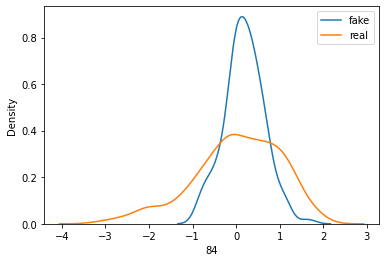

>Saved: drive/My Drive/GANs/20201027-173214_g_model_00490.h5, and drive/My Drive/GANs/20201027-173214_c_model_00490.h5
>Saved: drive/My Drive/GANs/20201027-173215_g_model_00497.h5, and drive/My Drive/GANs/20201027-173215_c_model_00497.h5
>Saved: drive/My Drive/GANs/20201027-173216_g_model_00504.h5, and drive/My Drive/GANs/20201027-173216_c_model_00504.h5
>Saved: drive/My Drive/GANs/20201027-173218_g_model_00511.h5, and drive/My Drive/GANs/20201027-173218_c_model_00511.h5
>Saved: drive/My Drive/GANs/20201027-173219_g_model_00518.h5, and drive/My Drive/GANs/20201027-173219_c_model_00518.h5
>Saved: drive/My Drive/GANs/20201027-173220_g_model_00525.h5, and drive/My Drive/GANs/20201027-173220_c_model_00525.h5
>Saved: drive/My Drive/GANs/20201027-173221_g_model_00532.h5, and drive/My Drive/GANs/20201027-173221_c_model_00532.h5
>Saved: drive/My Drive/GANs/20201027-173223_g_model_00539.h5, and drive/My Drive/GANs/20201027-173223_c_model_00539.h5
>Saved: drive/My Drive/GANs/20201027-173224_g_mo

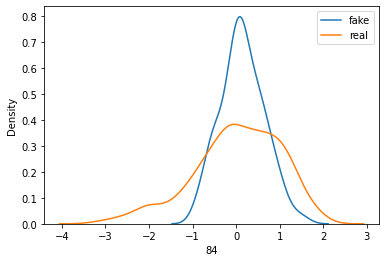

>Saved: drive/My Drive/GANs/20201027-173225_g_model_00560.h5, and drive/My Drive/GANs/20201027-173225_c_model_00560.h5
>Saved: drive/My Drive/GANs/20201027-173227_g_model_00567.h5, and drive/My Drive/GANs/20201027-173227_c_model_00567.h5
>Saved: drive/My Drive/GANs/20201027-173228_g_model_00574.h5, and drive/My Drive/GANs/20201027-173228_c_model_00574.h5
>Saved: drive/My Drive/GANs/20201027-173229_g_model_00581.h5, and drive/My Drive/GANs/20201027-173229_c_model_00581.h5
>Saved: drive/My Drive/GANs/20201027-173230_g_model_00588.h5, and drive/My Drive/GANs/20201027-173230_c_model_00588.h5
>Saved: drive/My Drive/GANs/20201027-173231_g_model_00595.h5, and drive/My Drive/GANs/20201027-173231_c_model_00595.h5
>Saved: drive/My Drive/GANs/20201027-173232_g_model_00602.h5, and drive/My Drive/GANs/20201027-173232_c_model_00602.h5
>Saved: drive/My Drive/GANs/20201027-173233_g_model_00609.h5, and drive/My Drive/GANs/20201027-173233_c_model_00609.h5
>Saved: drive/My Drive/GANs/20201027-173234_g_mo

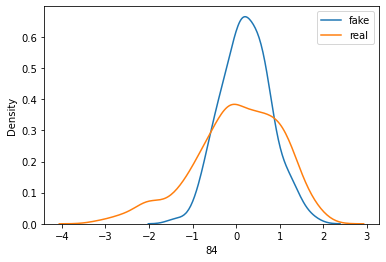

>Saved: drive/My Drive/GANs/20201027-173236_g_model_00630.h5, and drive/My Drive/GANs/20201027-173236_c_model_00630.h5
>Saved: drive/My Drive/GANs/20201027-173237_g_model_00637.h5, and drive/My Drive/GANs/20201027-173237_c_model_00637.h5
>Saved: drive/My Drive/GANs/20201027-173239_g_model_00644.h5, and drive/My Drive/GANs/20201027-173239_c_model_00644.h5
>Saved: drive/My Drive/GANs/20201027-173240_g_model_00651.h5, and drive/My Drive/GANs/20201027-173240_c_model_00651.h5
>Saved: drive/My Drive/GANs/20201027-173241_g_model_00658.h5, and drive/My Drive/GANs/20201027-173241_c_model_00658.h5
>Saved: drive/My Drive/GANs/20201027-173242_g_model_00665.h5, and drive/My Drive/GANs/20201027-173242_c_model_00665.h5
>Saved: drive/My Drive/GANs/20201027-173243_g_model_00672.h5, and drive/My Drive/GANs/20201027-173243_c_model_00672.h5
>Saved: drive/My Drive/GANs/20201027-173244_g_model_00679.h5, and drive/My Drive/GANs/20201027-173244_c_model_00679.h5
>Saved: drive/My Drive/GANs/20201027-173245_g_mo

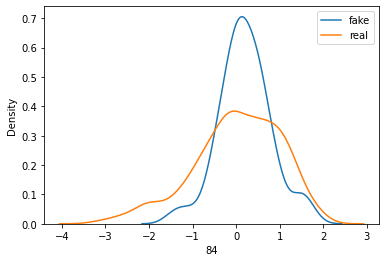

>Saved: drive/My Drive/GANs/20201027-173247_g_model_00700.h5, and drive/My Drive/GANs/20201027-173247_c_model_00700.h5


> iteration 0: #accepts 405


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.957
60th percentile of preds: 0.562


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.961
       app_CNT_CHILDREN  ...          BAD
count       1000.000000  ...  1000.000000
mean           0.324673  ...     0.494000
std            0.616903  ...     0.500214
min           -1.567026  ...     0.000000
25%           -0.107851  ...     0.000000
50%            0.363364  ...     0.000000
75%            0.782943  ...     1.000000
max            1.840312  ...     1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.946


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.919


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.965
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


>Saved: drive/My Drive/GANs/20201027-173255_g_model_00003.h5, and drive/My Drive/GANs/20201027-173255_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-173256_g_model_00006.h5, and drive/My Drive/GANs/20201027-173256_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-173257_g_model_00009.h5, and drive/My Drive/GANs/20201027-173257_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-173257_g_model_00012.h5, and drive/My Drive/GANs/20201027-173257_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-173258_g_model_00015.h5, and drive/My Drive/GANs/20201027-173258_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-173259_g_model_00018.h5, and drive/My Drive/GANs/20201027-173259_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-173259_g_model_00021.h5, and drive/My Drive/GANs/20201027-173259_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-173300_g_model_00024.h5, and drive/My Drive/GANs/20201027-173300_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-173300_g_mo

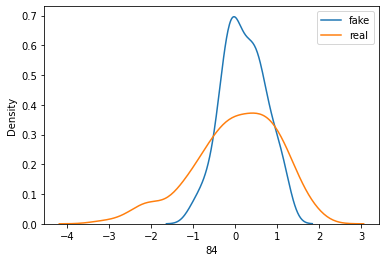

>Saved: drive/My Drive/GANs/20201027-173301_g_model_00030.h5, and drive/My Drive/GANs/20201027-173301_c_model_00030.h5


> iteration 1: #accepts 605


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.95
60th percentile of preds: 0.55


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.918
       app_CNT_CHILDREN  ...          BAD
count       1500.000000  ...  1500.000000
mean           0.298530  ...     0.502667
std            0.663610  ...     0.500160
min           -2.579309  ...     0.000000
25%           -0.160624  ...     0.000000
50%            0.346739  ...     1.000000
75%            0.797387  ...     1.000000
max            2.426066  ...     1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.943


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.872


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.96
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


>Saved: drive/My Drive/GANs/20201027-173311_g_model_00003.h5, and drive/My Drive/GANs/20201027-173311_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-173312_g_model_00006.h5, and drive/My Drive/GANs/20201027-173312_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-173313_g_model_00009.h5, and drive/My Drive/GANs/20201027-173313_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-173313_g_model_00012.h5, and drive/My Drive/GANs/20201027-173313_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-173314_g_model_00015.h5, and drive/My Drive/GANs/20201027-173314_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-173315_g_model_00018.h5, and drive/My Drive/GANs/20201027-173315_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-173315_g_model_00021.h5, and drive/My Drive/GANs/20201027-173315_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-173316_g_model_00024.h5, and drive/My Drive/GANs/20201027-173316_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-173317_g_mo

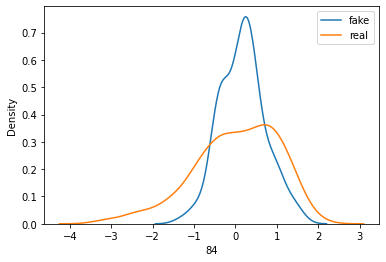

>Saved: drive/My Drive/GANs/20201027-173317_g_model_00030.h5, and drive/My Drive/GANs/20201027-173317_c_model_00030.h5


> iteration 2: #accepts 805


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.956
60th percentile of preds: 0.51


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.893
       app_CNT_CHILDREN  ...          BAD
count       2000.000000  ...  2000.000000
mean           0.316077  ...     0.510500
std            0.654593  ...     0.500015
min           -1.984776  ...     0.000000
25%           -0.143243  ...     0.000000
50%            0.369842  ...     1.000000
75%            0.820119  ...     1.000000
max            1.901655  ...     1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.928


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.832


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.961
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-173330_g_model_00003.h5, and drive/My Drive/GANs/20201027-173330_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-173331_g_model_00006.h5, and drive/My Drive/GANs/20201027-173331_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-173332_g_model_00009.h5, and drive/My Drive/GANs/20201027-173332_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-173332_g_model_00012.h5, and drive/My Drive/GANs/20201027-173332_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-173333_g_model_00015.h5, and drive/My Drive/GANs/20201027-173333_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-173333_g_model_00018.h5, and drive/My Drive/GANs/20201027-173333_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-173334_g_model_00021.h5, and drive/My Drive/GANs/20201027-173334_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-173335_g_model_00024.h5, and drive/My Drive/GANs/20201027-173335_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-173335_g_mo

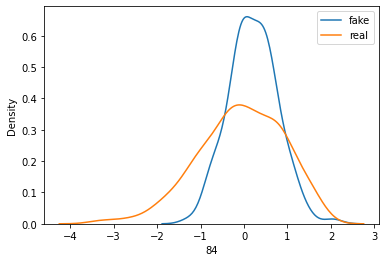

>Saved: drive/My Drive/GANs/20201027-173336_g_model_00030.h5, and drive/My Drive/GANs/20201027-173336_c_model_00030.h5


> iteration 3: #accepts 1005


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.958
60th percentile of preds: 0.511


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.896
       app_CNT_CHILDREN  ...          BAD
count       2500.000000  ...  2500.000000
mean           0.314974  ...     0.507200
std            0.668673  ...     0.500048
min           -1.820037  ...     0.000000
25%           -0.167111  ...     0.000000
50%            0.354777  ...     1.000000
75%            0.823442  ...     1.000000
max            2.430437  ...     1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.933


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.839


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.962
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-173354_g_model_00003.h5, and drive/My Drive/GANs/20201027-173354_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-173355_g_model_00006.h5, and drive/My Drive/GANs/20201027-173355_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-173356_g_model_00009.h5, and drive/My Drive/GANs/20201027-173356_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-173357_g_model_00012.h5, and drive/My Drive/GANs/20201027-173357_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-173358_g_model_00015.h5, and drive/My Drive/GANs/20201027-173358_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-173359_g_model_00018.h5, and drive/My Drive/GANs/20201027-173359_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-173400_g_model_00021.h5, and drive/My Drive/GANs/20201027-173400_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-173401_g_model_00024.h5, and drive/My Drive/GANs/20201027-173401_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-173402_g_mo

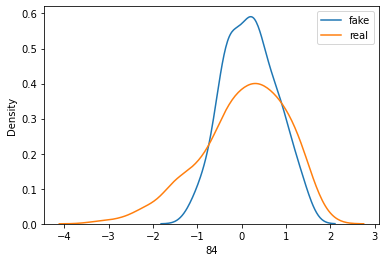

>Saved: drive/My Drive/GANs/20201027-173403_g_model_00030.h5, and drive/My Drive/GANs/20201027-173403_c_model_00030.h5


> iteration 4: #accepts 1205


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.96
60th percentile of preds: 0.504


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.889
       app_CNT_CHILDREN  ...          BAD
count       3000.000000  ...  3000.000000
mean           0.315488  ...     0.507667
std            0.680548  ...     0.500025
min           -2.032264  ...     0.000000
25%           -0.173755  ...     0.000000
50%            0.343696  ...     1.000000
75%            0.825484  ...     1.000000
max            2.755015  ...     1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.936


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.825


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.962
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-173422_g_model_00003.h5, and drive/My Drive/GANs/20201027-173422_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-173422_g_model_00006.h5, and drive/My Drive/GANs/20201027-173422_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-173423_g_model_00009.h5, and drive/My Drive/GANs/20201027-173423_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-173424_g_model_00012.h5, and drive/My Drive/GANs/20201027-173424_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-173424_g_model_00015.h5, and drive/My Drive/GANs/20201027-173424_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-173425_g_model_00018.h5, and drive/My Drive/GANs/20201027-173425_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-173425_g_model_00021.h5, and drive/My Drive/GANs/20201027-173425_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-173426_g_model_00024.h5, and drive/My Drive/GANs/20201027-173426_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-173427_g_mo

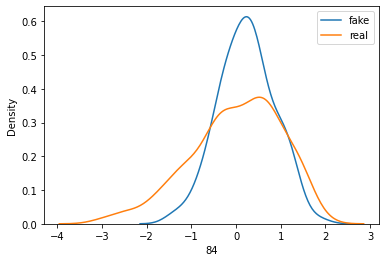

>Saved: drive/My Drive/GANs/20201027-173427_g_model_00030.h5, and drive/My Drive/GANs/20201027-173427_c_model_00030.h5


> iteration 5: #accepts 1405


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.957
60th percentile of preds: 0.493


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.861
       app_CNT_CHILDREN  ...          BAD
count       3500.000000  ...  3500.000000
mean           0.338569  ...     0.510571
std            0.688751  ...     0.499960
min           -2.011442  ...     0.000000
25%           -0.162118  ...     0.000000
50%            0.369133  ...     1.000000
75%            0.846015  ...     1.000000
max            2.552912  ...     1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.929
60th percentile of preds: 0.801


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.962
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-173447_g_model_00003.h5, and drive/My Drive/GANs/20201027-173447_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-173447_g_model_00006.h5, and drive/My Drive/GANs/20201027-173447_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-173448_g_model_00009.h5, and drive/My Drive/GANs/20201027-173448_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-173449_g_model_00012.h5, and drive/My Drive/GANs/20201027-173449_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-173449_g_model_00015.h5, and drive/My Drive/GANs/20201027-173449_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-173450_g_model_00018.h5, and drive/My Drive/GANs/20201027-173450_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-173451_g_model_00021.h5, and drive/My Drive/GANs/20201027-173451_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-173451_g_model_00024.h5, and drive/My Drive/GANs/20201027-173451_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-173452_g_mo

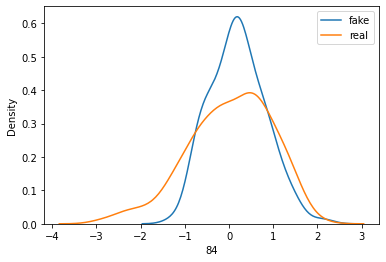

>Saved: drive/My Drive/GANs/20201027-173452_g_model_00030.h5, and drive/My Drive/GANs/20201027-173452_c_model_00030.h5


> iteration 6: #accepts 1605


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.932
60th percentile of preds: 0.484


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.839
       app_CNT_CHILDREN  ...          BAD
count       4000.000000  ...  4000.000000
mean           0.345396  ...     0.498750
std            0.691966  ...     0.500061
min           -1.903378  ...     0.000000
25%           -0.169732  ...     0.000000
50%            0.364092  ...     0.000000
75%            0.867962  ...     1.000000
max            2.943487  ...     1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.929


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.771


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.962
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-173516_g_model_00003.h5, and drive/My Drive/GANs/20201027-173516_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-173517_g_model_00006.h5, and drive/My Drive/GANs/20201027-173517_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-173517_g_model_00009.h5, and drive/My Drive/GANs/20201027-173517_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-173518_g_model_00012.h5, and drive/My Drive/GANs/20201027-173518_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-173519_g_model_00015.h5, and drive/My Drive/GANs/20201027-173519_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-173519_g_model_00018.h5, and drive/My Drive/GANs/20201027-173519_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-173520_g_model_00021.h5, and drive/My Drive/GANs/20201027-173520_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-173520_g_model_00024.h5, and drive/My Drive/GANs/20201027-173520_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-173521_g_mo

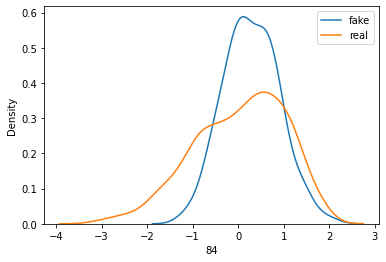

>Saved: drive/My Drive/GANs/20201027-173522_g_model_00030.h5, and drive/My Drive/GANs/20201027-173522_c_model_00030.h5


> iteration 7: #accepts 1805


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.934
60th percentile of preds: 0.497


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.852
       app_CNT_CHILDREN  ...          BAD
count       4500.000000  ...  4500.000000
mean           0.363661  ...     0.513556
std            0.696998  ...     0.499872
min           -2.561772  ...     0.000000
25%           -0.131918  ...     0.000000
50%            0.395406  ...     1.000000
75%            0.875471  ...     1.000000
max            2.280019  ...     1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.92


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.787


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.961
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-173549_g_model_00003.h5, and drive/My Drive/GANs/20201027-173549_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-173549_g_model_00006.h5, and drive/My Drive/GANs/20201027-173549_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-173550_g_model_00009.h5, and drive/My Drive/GANs/20201027-173550_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-173551_g_model_00012.h5, and drive/My Drive/GANs/20201027-173551_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-173551_g_model_00015.h5, and drive/My Drive/GANs/20201027-173551_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-173552_g_model_00018.h5, and drive/My Drive/GANs/20201027-173552_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-173553_g_model_00021.h5, and drive/My Drive/GANs/20201027-173553_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-173553_g_model_00024.h5, and drive/My Drive/GANs/20201027-173553_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-173554_g_mo

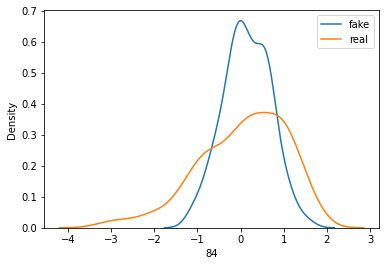

>Saved: drive/My Drive/GANs/20201027-173554_g_model_00030.h5, and drive/My Drive/GANs/20201027-173554_c_model_00030.h5


> iteration 8: #accepts 2005


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.937
60th percentile of preds: 0.498


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.855
       app_CNT_CHILDREN  ...          BAD
count       5000.000000  ...  5000.000000
mean           0.360429  ...     0.503600
std            0.685814  ...     0.500037
min           -2.220373  ...     0.000000
25%           -0.119760  ...     0.000000
50%            0.388055  ...     1.000000
75%            0.877374  ...     1.000000
max            2.566632  ...     1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.928


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.8


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.961
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-173623_g_model_00003.h5, and drive/My Drive/GANs/20201027-173623_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-173624_g_model_00006.h5, and drive/My Drive/GANs/20201027-173624_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-173625_g_model_00009.h5, and drive/My Drive/GANs/20201027-173625_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-173625_g_model_00012.h5, and drive/My Drive/GANs/20201027-173625_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-173626_g_model_00015.h5, and drive/My Drive/GANs/20201027-173626_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-173627_g_model_00018.h5, and drive/My Drive/GANs/20201027-173627_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-173627_g_model_00021.h5, and drive/My Drive/GANs/20201027-173627_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-173628_g_model_00024.h5, and drive/My Drive/GANs/20201027-173628_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-173629_g_mo

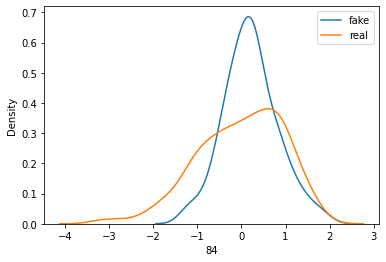

>Saved: drive/My Drive/GANs/20201027-173629_g_model_00030.h5, and drive/My Drive/GANs/20201027-173629_c_model_00030.h5


> iteration 9: #accepts 2205


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.938
60th percentile of preds: 0.492


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.857
       app_CNT_CHILDREN  ...          BAD
count       5500.000000  ...  5500.000000
mean           0.385232  ...     0.499273
std            0.695861  ...     0.500045
min           -1.966166  ...     0.000000
25%           -0.105857  ...     0.000000
50%            0.413867  ...     0.000000
75%            0.898751  ...     1.000000
max            2.821612  ...     1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.918


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.794


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.961
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-173701_g_model_00003.h5, and drive/My Drive/GANs/20201027-173701_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-173701_g_model_00006.h5, and drive/My Drive/GANs/20201027-173701_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-173702_g_model_00009.h5, and drive/My Drive/GANs/20201027-173702_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-173702_g_model_00012.h5, and drive/My Drive/GANs/20201027-173702_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-173703_g_model_00015.h5, and drive/My Drive/GANs/20201027-173703_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-173704_g_model_00018.h5, and drive/My Drive/GANs/20201027-173704_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-173704_g_model_00021.h5, and drive/My Drive/GANs/20201027-173704_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-173705_g_model_00024.h5, and drive/My Drive/GANs/20201027-173705_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-173706_g_mo

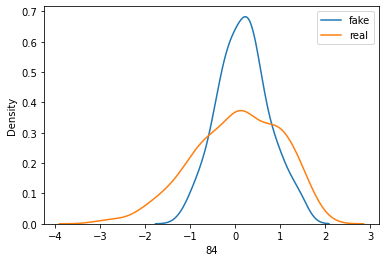

>Saved: drive/My Drive/GANs/20201027-173706_g_model_00030.h5, and drive/My Drive/GANs/20201027-173706_c_model_00030.h5


> iteration 10: #accepts 2405


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.937
60th percentile of preds: 0.49


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.841
       app_CNT_CHILDREN  ...          BAD
count       6000.000000  ...  6000.000000
mean           0.380396  ...     0.500333
std            0.696113  ...     0.500042
min           -2.200614  ...     0.000000
25%           -0.106994  ...     0.000000
50%            0.395718  ...     1.000000
75%            0.893310  ...     1.000000
max            2.792394  ...     1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.924


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.773


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.961
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-173741_g_model_00003.h5, and drive/My Drive/GANs/20201027-173741_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-173741_g_model_00006.h5, and drive/My Drive/GANs/20201027-173741_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-173742_g_model_00009.h5, and drive/My Drive/GANs/20201027-173742_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-173742_g_model_00012.h5, and drive/My Drive/GANs/20201027-173742_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-173743_g_model_00015.h5, and drive/My Drive/GANs/20201027-173743_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-173744_g_model_00018.h5, and drive/My Drive/GANs/20201027-173744_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-173744_g_model_00021.h5, and drive/My Drive/GANs/20201027-173744_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-173745_g_model_00024.h5, and drive/My Drive/GANs/20201027-173745_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-173746_g_mo

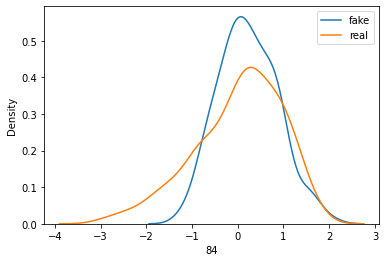

>Saved: drive/My Drive/GANs/20201027-173746_g_model_00030.h5, and drive/My Drive/GANs/20201027-173746_c_model_00030.h5


> iteration 11: #accepts 2605


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.937
60th percentile of preds: 0.485


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.829
       app_CNT_CHILDREN  ...          BAD
count       6500.000000  ...  6500.000000
mean           0.401646  ...     0.508462
std            0.696100  ...     0.499967
min           -1.994678  ...     0.000000
25%           -0.093357  ...     0.000000
50%            0.426718  ...     1.000000
75%            0.921511  ...     1.000000
max            3.120379  ...     1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.92


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.759


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.958
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-173823_g_model_00003.h5, and drive/My Drive/GANs/20201027-173823_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-173824_g_model_00006.h5, and drive/My Drive/GANs/20201027-173824_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-173824_g_model_00009.h5, and drive/My Drive/GANs/20201027-173824_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-173825_g_model_00012.h5, and drive/My Drive/GANs/20201027-173825_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-173825_g_model_00015.h5, and drive/My Drive/GANs/20201027-173825_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-173826_g_model_00018.h5, and drive/My Drive/GANs/20201027-173826_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-173827_g_model_00021.h5, and drive/My Drive/GANs/20201027-173827_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-173827_g_model_00024.h5, and drive/My Drive/GANs/20201027-173827_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-173828_g_mo

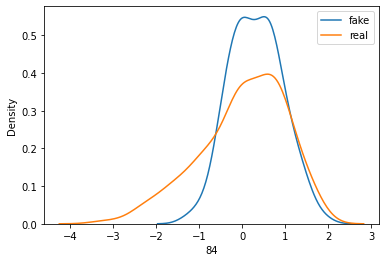

>Saved: drive/My Drive/GANs/20201027-173829_g_model_00030.h5, and drive/My Drive/GANs/20201027-173829_c_model_00030.h5


> iteration 12: #accepts 2805


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.94
60th percentile of preds: 0.492


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.829
       app_CNT_CHILDREN  ...          BAD
count       7000.000000  ...  7000.000000
mean           0.395255  ...     0.505429
std            0.697388  ...     0.500006
min           -1.982616  ...     0.000000
25%           -0.113108  ...     0.000000
50%            0.415969  ...     1.000000
75%            0.922186  ...     1.000000
max            2.731902  ...     1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.927


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.766


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.959
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-173908_g_model_00003.h5, and drive/My Drive/GANs/20201027-173908_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-173909_g_model_00006.h5, and drive/My Drive/GANs/20201027-173909_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-173910_g_model_00009.h5, and drive/My Drive/GANs/20201027-173910_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-173911_g_model_00012.h5, and drive/My Drive/GANs/20201027-173911_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-173912_g_model_00015.h5, and drive/My Drive/GANs/20201027-173912_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-173912_g_model_00018.h5, and drive/My Drive/GANs/20201027-173912_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-173913_g_model_00021.h5, and drive/My Drive/GANs/20201027-173913_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-173914_g_model_00024.h5, and drive/My Drive/GANs/20201027-173914_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-173915_g_mo

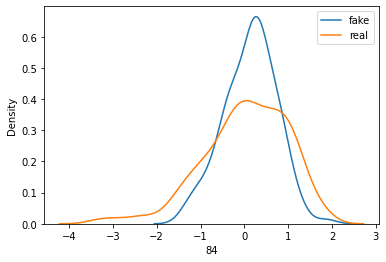

>Saved: drive/My Drive/GANs/20201027-173915_g_model_00030.h5, and drive/My Drive/GANs/20201027-173915_c_model_00030.h5


> iteration 13: #accepts 3005


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.94
60th percentile of preds: 0.492


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.843
       app_CNT_CHILDREN  ...          BAD
count       7500.000000  ...  7500.000000
mean           0.419040  ...     0.500400
std            0.682003  ...     0.500033
min           -2.061430  ...     0.000000
25%           -0.075450  ...     0.000000
50%            0.435068  ...     1.000000
75%            0.932996  ...     1.000000
max            2.987048  ...     1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.924


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.768


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.959
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-173958_g_model_00003.h5, and drive/My Drive/GANs/20201027-173958_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-173958_g_model_00006.h5, and drive/My Drive/GANs/20201027-173958_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-173959_g_model_00009.h5, and drive/My Drive/GANs/20201027-173959_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-174000_g_model_00012.h5, and drive/My Drive/GANs/20201027-174000_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-174000_g_model_00015.h5, and drive/My Drive/GANs/20201027-174000_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-174001_g_model_00018.h5, and drive/My Drive/GANs/20201027-174001_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-174001_g_model_00021.h5, and drive/My Drive/GANs/20201027-174001_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-174002_g_model_00024.h5, and drive/My Drive/GANs/20201027-174002_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-174003_g_mo

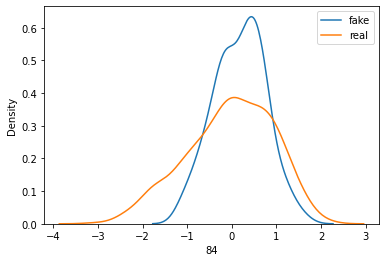

>Saved: drive/My Drive/GANs/20201027-174003_g_model_00030.h5, and drive/My Drive/GANs/20201027-174003_c_model_00030.h5


> iteration 14: #accepts 3205


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.943
60th percentile of preds: 0.501


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.865
       app_CNT_CHILDREN  ...          BAD
count       8000.000000  ...  8000.000000
mean           0.428745  ...     0.498875
std            0.692801  ...     0.500030
min           -2.277844  ...     0.000000
25%           -0.070707  ...     0.000000
50%            0.439151  ...     0.000000
75%            0.955519  ...     1.000000
max            2.722890  ...     1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.932


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.791


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.96


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


>Saved: drive/My Drive/GANs/20201027-174049_g_model_00003.h5, and drive/My Drive/GANs/20201027-174049_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-174050_g_model_00006.h5, and drive/My Drive/GANs/20201027-174050_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-174050_g_model_00009.h5, and drive/My Drive/GANs/20201027-174050_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-174051_g_model_00012.h5, and drive/My Drive/GANs/20201027-174051_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-174052_g_model_00015.h5, and drive/My Drive/GANs/20201027-174052_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-174052_g_model_00018.h5, and drive/My Drive/GANs/20201027-174052_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-174053_g_model_00021.h5, and drive/My Drive/GANs/20201027-174053_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-174053_g_model_00024.h5, and drive/My Drive/GANs/20201027-174053_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-174054_g_mo

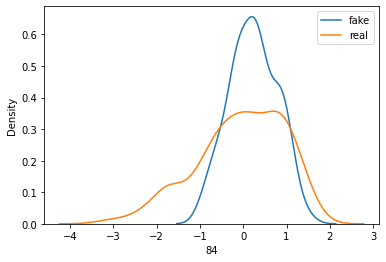

>Saved: drive/My Drive/GANs/20201027-174055_g_model_00030.h5, and drive/My Drive/GANs/20201027-174055_c_model_00030.h5


> iteration 15: #accepts 3405


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.942
60th percentile of preds: 0.495


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.844
       app_CNT_CHILDREN  ...          BAD
count       8500.000000  ...  8500.000000
mean           0.427890  ...     0.502353
std            0.685286  ...     0.500024
min           -2.196621  ...     0.000000
25%           -0.070861  ...     0.000000
50%            0.441204  ...     1.000000
75%            0.948506  ...     1.000000
max            3.584355  ...     1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.93


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.78


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.96
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-174142_g_model_00003.h5, and drive/My Drive/GANs/20201027-174142_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-174143_g_model_00006.h5, and drive/My Drive/GANs/20201027-174143_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-174143_g_model_00009.h5, and drive/My Drive/GANs/20201027-174143_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-174144_g_model_00012.h5, and drive/My Drive/GANs/20201027-174144_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-174144_g_model_00015.h5, and drive/My Drive/GANs/20201027-174144_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-174145_g_model_00018.h5, and drive/My Drive/GANs/20201027-174145_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-174146_g_model_00021.h5, and drive/My Drive/GANs/20201027-174146_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-174146_g_model_00024.h5, and drive/My Drive/GANs/20201027-174146_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-174147_g_mo

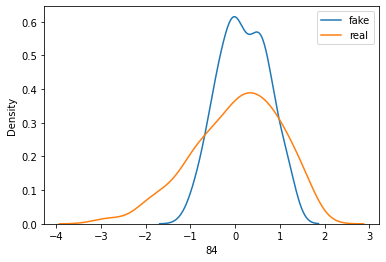

>Saved: drive/My Drive/GANs/20201027-174147_g_model_00030.h5, and drive/My Drive/GANs/20201027-174147_c_model_00030.h5


> iteration 16: #accepts 3605


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.945
60th percentile of preds: 0.492


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.843
       app_CNT_CHILDREN  ...          BAD
count       9000.000000  ...  9000.000000
mean           0.431459  ...     0.494222
std            0.682289  ...     0.499994
min           -1.984674  ...     0.000000
25%           -0.068498  ...     0.000000
50%            0.458229  ...     0.000000
75%            0.936491  ...     1.000000
max            2.669492  ...     1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.927


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.766


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.96
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-174237_g_model_00003.h5, and drive/My Drive/GANs/20201027-174237_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-174238_g_model_00006.h5, and drive/My Drive/GANs/20201027-174238_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-174238_g_model_00009.h5, and drive/My Drive/GANs/20201027-174238_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-174239_g_model_00012.h5, and drive/My Drive/GANs/20201027-174239_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-174239_g_model_00015.h5, and drive/My Drive/GANs/20201027-174239_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-174240_g_model_00018.h5, and drive/My Drive/GANs/20201027-174240_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-174241_g_model_00021.h5, and drive/My Drive/GANs/20201027-174241_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-174241_g_model_00024.h5, and drive/My Drive/GANs/20201027-174241_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-174242_g_mo

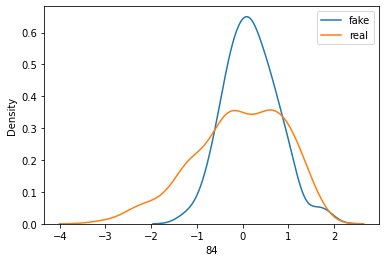

>Saved: drive/My Drive/GANs/20201027-174243_g_model_00030.h5, and drive/My Drive/GANs/20201027-174243_c_model_00030.h5


> iteration 17: #accepts 3805


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.946
60th percentile of preds: 0.484


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.82
       app_CNT_CHILDREN  ...          BAD
count       9500.000000  ...  9500.000000
mean           0.450052  ...     0.498211
std            0.683399  ...     0.500023
min           -2.129205  ...     0.000000
25%           -0.040847  ...     0.000000
50%            0.454285  ...     0.000000
75%            0.961702  ...     1.000000
max            2.796142  ...     1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.92


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.743


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.958
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-174335_g_model_00003.h5, and drive/My Drive/GANs/20201027-174335_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-174336_g_model_00006.h5, and drive/My Drive/GANs/20201027-174336_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-174336_g_model_00009.h5, and drive/My Drive/GANs/20201027-174336_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-174337_g_model_00012.h5, and drive/My Drive/GANs/20201027-174337_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-174338_g_model_00015.h5, and drive/My Drive/GANs/20201027-174338_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-174338_g_model_00018.h5, and drive/My Drive/GANs/20201027-174338_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-174339_g_model_00021.h5, and drive/My Drive/GANs/20201027-174339_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-174339_g_model_00024.h5, and drive/My Drive/GANs/20201027-174339_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-174340_g_mo

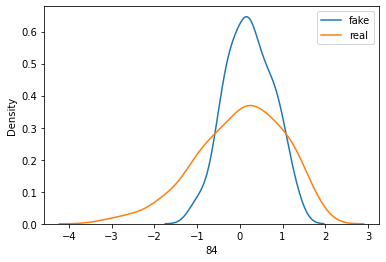

>Saved: drive/My Drive/GANs/20201027-174341_g_model_00030.h5, and drive/My Drive/GANs/20201027-174341_c_model_00030.h5


> iteration 18: #accepts 4005


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.946
60th percentile of preds: 0.484


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.818
       app_CNT_CHILDREN  ...           BAD
count      10000.000000  ...  10000.000000
mean           0.453423  ...      0.503700
std            0.679535  ...      0.500011
min           -2.267884  ...      0.000000
25%           -0.032333  ...      0.000000
50%            0.476517  ...      1.000000
75%            0.963962  ...      1.000000
max            2.760473  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.921
60th percentile of preds: 0.747


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.958
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-174435_g_model_00003.h5, and drive/My Drive/GANs/20201027-174435_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-174436_g_model_00006.h5, and drive/My Drive/GANs/20201027-174436_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-174436_g_model_00009.h5, and drive/My Drive/GANs/20201027-174436_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-174437_g_model_00012.h5, and drive/My Drive/GANs/20201027-174437_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-174438_g_model_00015.h5, and drive/My Drive/GANs/20201027-174438_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-174438_g_model_00018.h5, and drive/My Drive/GANs/20201027-174438_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-174439_g_model_00021.h5, and drive/My Drive/GANs/20201027-174439_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-174439_g_model_00024.h5, and drive/My Drive/GANs/20201027-174439_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-174440_g_mo

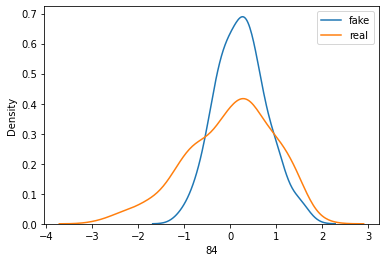

>Saved: drive/My Drive/GANs/20201027-174441_g_model_00030.h5, and drive/My Drive/GANs/20201027-174441_c_model_00030.h5


> iteration 19: #accepts 4205


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.944
60th percentile of preds: 0.489


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.832
       app_CNT_CHILDREN  ...           BAD
count      10500.000000  ...  10500.000000
mean           0.473047  ...      0.495429
std            0.686167  ...      0.500003
min           -1.841826  ...      0.000000
25%           -0.022581  ...      0.000000
50%            0.485336  ...      0.000000
75%            0.987966  ...      1.000000
max            2.811947  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.921
60th percentile of preds: 0.763


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.958
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-174538_g_model_00003.h5, and drive/My Drive/GANs/20201027-174538_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-174539_g_model_00006.h5, and drive/My Drive/GANs/20201027-174539_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-174540_g_model_00009.h5, and drive/My Drive/GANs/20201027-174540_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-174540_g_model_00012.h5, and drive/My Drive/GANs/20201027-174540_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-174541_g_model_00015.h5, and drive/My Drive/GANs/20201027-174541_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-174541_g_model_00018.h5, and drive/My Drive/GANs/20201027-174541_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-174542_g_model_00021.h5, and drive/My Drive/GANs/20201027-174542_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-174543_g_model_00024.h5, and drive/My Drive/GANs/20201027-174543_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-174543_g_mo

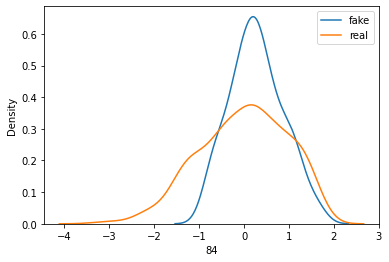

>Saved: drive/My Drive/GANs/20201027-174544_g_model_00030.h5, and drive/My Drive/GANs/20201027-174544_c_model_00030.h5


> iteration 20: #accepts 4405


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.945
60th percentile of preds: 0.492


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.817
       app_CNT_CHILDREN  ...           BAD
count      11000.000000  ...  11000.000000
mean           0.465392  ...      0.511364
std            0.684440  ...      0.499894
min           -1.948950  ...      0.000000
25%           -0.031439  ...      0.000000
50%            0.481229  ...      1.000000
75%            0.985185  ...      1.000000
max            3.375841  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.919


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.743


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-174645_g_model_00003.h5, and drive/My Drive/GANs/20201027-174645_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-174645_g_model_00006.h5, and drive/My Drive/GANs/20201027-174645_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-174646_g_model_00009.h5, and drive/My Drive/GANs/20201027-174646_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-174647_g_model_00012.h5, and drive/My Drive/GANs/20201027-174647_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-174647_g_model_00015.h5, and drive/My Drive/GANs/20201027-174647_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-174648_g_model_00018.h5, and drive/My Drive/GANs/20201027-174648_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-174648_g_model_00021.h5, and drive/My Drive/GANs/20201027-174648_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-174649_g_model_00024.h5, and drive/My Drive/GANs/20201027-174649_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-174650_g_mo

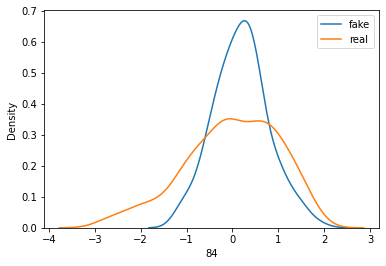

>Saved: drive/My Drive/GANs/20201027-174650_g_model_00030.h5, and drive/My Drive/GANs/20201027-174650_c_model_00030.h5


> iteration 21: #accepts 4605


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.943
60th percentile of preds: 0.478


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.703
       app_CNT_CHILDREN  ...           BAD
count      11500.000000  ...  11500.000000
mean           0.466233  ...      0.507391
std            0.682579  ...      0.499967
min           -2.180552  ...      0.000000
25%           -0.033527  ...      0.000000
50%            0.475175  ...      1.000000
75%            0.973873  ...      1.000000
max            2.996011  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.921


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.648


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-174755_g_model_00003.h5, and drive/My Drive/GANs/20201027-174755_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-174756_g_model_00006.h5, and drive/My Drive/GANs/20201027-174756_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-174756_g_model_00009.h5, and drive/My Drive/GANs/20201027-174756_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-174757_g_model_00012.h5, and drive/My Drive/GANs/20201027-174757_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-174758_g_model_00015.h5, and drive/My Drive/GANs/20201027-174758_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-174758_g_model_00018.h5, and drive/My Drive/GANs/20201027-174758_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-174759_g_model_00021.h5, and drive/My Drive/GANs/20201027-174759_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-174759_g_model_00024.h5, and drive/My Drive/GANs/20201027-174759_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-174800_g_mo

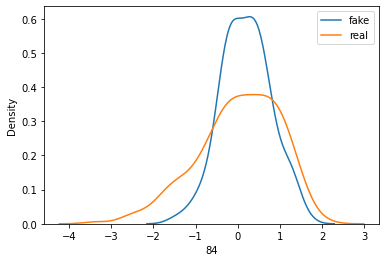

>Saved: drive/My Drive/GANs/20201027-174801_g_model_00030.h5, and drive/My Drive/GANs/20201027-174801_c_model_00030.h5


> iteration 22: #accepts 4805


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.946
60th percentile of preds: 0.477


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.724
       app_CNT_CHILDREN  ...          BAD
count      12000.000000  ...  12000.00000
mean           0.468317  ...      0.49900
std            0.681355  ...      0.50002
min           -2.046768  ...      0.00000
25%           -0.024073  ...      0.00000
50%            0.483632  ...      0.00000
75%            0.978485  ...      1.00000
max            2.789037  ...      1.00000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.924


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.679


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-174909_g_model_00003.h5, and drive/My Drive/GANs/20201027-174909_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-174909_g_model_00006.h5, and drive/My Drive/GANs/20201027-174909_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-174910_g_model_00009.h5, and drive/My Drive/GANs/20201027-174910_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-174911_g_model_00012.h5, and drive/My Drive/GANs/20201027-174911_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-174911_g_model_00015.h5, and drive/My Drive/GANs/20201027-174911_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-174912_g_model_00018.h5, and drive/My Drive/GANs/20201027-174912_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-174913_g_model_00021.h5, and drive/My Drive/GANs/20201027-174913_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-174913_g_model_00024.h5, and drive/My Drive/GANs/20201027-174913_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-174914_g_mo

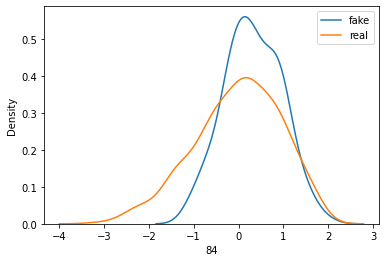

>Saved: drive/My Drive/GANs/20201027-174914_g_model_00030.h5, and drive/My Drive/GANs/20201027-174914_c_model_00030.h5


> iteration 23: #accepts 5005


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.946
60th percentile of preds: 0.478


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.742
       app_CNT_CHILDREN  ...           BAD
count      12500.000000  ...  12500.000000
mean           0.479034  ...      0.502400
std            0.681332  ...      0.500014
min           -2.075080  ...      0.000000
25%           -0.011916  ...      0.000000
50%            0.494419  ...      1.000000
75%            0.983111  ...      1.000000
max            3.039721  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.916


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.687


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-175027_g_model_00003.h5, and drive/My Drive/GANs/20201027-175027_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-175028_g_model_00006.h5, and drive/My Drive/GANs/20201027-175028_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-175028_g_model_00009.h5, and drive/My Drive/GANs/20201027-175028_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-175029_g_model_00012.h5, and drive/My Drive/GANs/20201027-175029_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-175030_g_model_00015.h5, and drive/My Drive/GANs/20201027-175030_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-175030_g_model_00018.h5, and drive/My Drive/GANs/20201027-175030_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-175031_g_model_00021.h5, and drive/My Drive/GANs/20201027-175031_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-175031_g_model_00024.h5, and drive/My Drive/GANs/20201027-175031_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-175032_g_mo

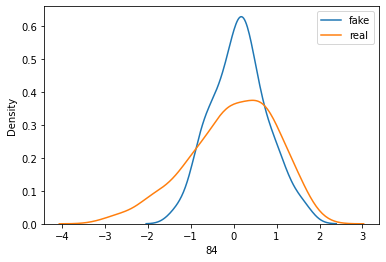

>Saved: drive/My Drive/GANs/20201027-175033_g_model_00030.h5, and drive/My Drive/GANs/20201027-175033_c_model_00030.h5


> iteration 24: #accepts 5205


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.944
60th percentile of preds: 0.477


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.753
       app_CNT_CHILDREN  ...           BAD
count      13000.000000  ...  13000.000000
mean           0.474340  ...      0.501769
std            0.678071  ...      0.500016
min           -2.071126  ...      0.000000
25%           -0.013590  ...      0.000000
50%            0.478737  ...      1.000000
75%            0.989827  ...      1.000000
max            2.656621  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.919


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.688


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-175147_g_model_00003.h5, and drive/My Drive/GANs/20201027-175147_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-175147_g_model_00006.h5, and drive/My Drive/GANs/20201027-175147_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-175148_g_model_00009.h5, and drive/My Drive/GANs/20201027-175148_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-175149_g_model_00012.h5, and drive/My Drive/GANs/20201027-175149_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-175149_g_model_00015.h5, and drive/My Drive/GANs/20201027-175149_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-175150_g_model_00018.h5, and drive/My Drive/GANs/20201027-175150_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-175150_g_model_00021.h5, and drive/My Drive/GANs/20201027-175150_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-175151_g_model_00024.h5, and drive/My Drive/GANs/20201027-175151_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-175152_g_mo

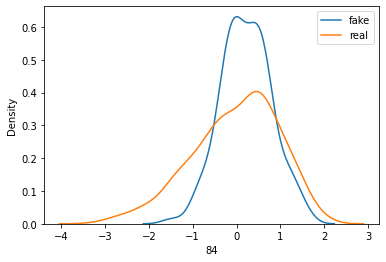

>Saved: drive/My Drive/GANs/20201027-175152_g_model_00030.h5, and drive/My Drive/GANs/20201027-175152_c_model_00030.h5


> iteration 25: #accepts 5405


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.942
60th percentile of preds: 0.474


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.741
       app_CNT_CHILDREN  ...           BAD
count      13500.000000  ...  13500.000000
mean           0.464578  ...      0.503407
std            0.679661  ...      0.500007
min           -2.341380  ...      0.000000
25%           -0.036410  ...      0.000000
50%            0.471183  ...      1.000000
75%            0.981050  ...      1.000000
max            2.925883  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.921


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.684


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-175309_g_model_00003.h5, and drive/My Drive/GANs/20201027-175309_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-175310_g_model_00006.h5, and drive/My Drive/GANs/20201027-175310_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-175311_g_model_00009.h5, and drive/My Drive/GANs/20201027-175311_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-175311_g_model_00012.h5, and drive/My Drive/GANs/20201027-175311_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-175312_g_model_00015.h5, and drive/My Drive/GANs/20201027-175312_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-175312_g_model_00018.h5, and drive/My Drive/GANs/20201027-175312_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-175313_g_model_00021.h5, and drive/My Drive/GANs/20201027-175313_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-175314_g_model_00024.h5, and drive/My Drive/GANs/20201027-175314_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-175314_g_mo

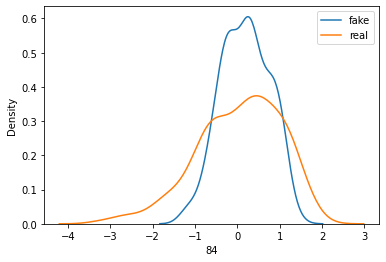

>Saved: drive/My Drive/GANs/20201027-175315_g_model_00030.h5, and drive/My Drive/GANs/20201027-175315_c_model_00030.h5


> iteration 26: #accepts 5605


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.943
60th percentile of preds: 0.473


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.73
       app_CNT_CHILDREN  ...           BAD
count      14000.000000  ...  14000.000000
mean           0.464136  ...      0.504571
std            0.690161  ...      0.499997
min           -2.155612  ...      0.000000
25%           -0.029684  ...      0.000000
50%            0.477075  ...      1.000000
75%            0.984071  ...      1.000000
max            3.152489  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.909


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.671


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.946
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-175436_g_model_00003.h5, and drive/My Drive/GANs/20201027-175436_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-175437_g_model_00006.h5, and drive/My Drive/GANs/20201027-175437_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-175437_g_model_00009.h5, and drive/My Drive/GANs/20201027-175437_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-175438_g_model_00012.h5, and drive/My Drive/GANs/20201027-175438_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-175439_g_model_00015.h5, and drive/My Drive/GANs/20201027-175439_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-175439_g_model_00018.h5, and drive/My Drive/GANs/20201027-175439_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-175440_g_model_00021.h5, and drive/My Drive/GANs/20201027-175440_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-175441_g_model_00024.h5, and drive/My Drive/GANs/20201027-175441_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-175441_g_mo

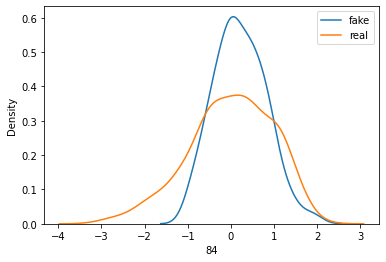

>Saved: drive/My Drive/GANs/20201027-175442_g_model_00030.h5, and drive/My Drive/GANs/20201027-175442_c_model_00030.h5


> iteration 27: #accepts 5805


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.944
60th percentile of preds: 0.474


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.704
       app_CNT_CHILDREN  ...           BAD
count      14500.000000  ...  14500.000000
mean           0.455116  ...      0.495586
std            0.678237  ...      0.499998
min           -2.316435  ...      0.000000
25%           -0.043520  ...      0.000000
50%            0.461117  ...      0.000000
75%            0.970319  ...      1.000000
max            3.261201  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.914


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.653


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.947
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-175608_g_model_00003.h5, and drive/My Drive/GANs/20201027-175608_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-175608_g_model_00006.h5, and drive/My Drive/GANs/20201027-175608_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-175609_g_model_00009.h5, and drive/My Drive/GANs/20201027-175609_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-175610_g_model_00012.h5, and drive/My Drive/GANs/20201027-175610_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-175610_g_model_00015.h5, and drive/My Drive/GANs/20201027-175610_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-175611_g_model_00018.h5, and drive/My Drive/GANs/20201027-175611_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-175612_g_model_00021.h5, and drive/My Drive/GANs/20201027-175612_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-175612_g_model_00024.h5, and drive/My Drive/GANs/20201027-175612_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-175613_g_mo

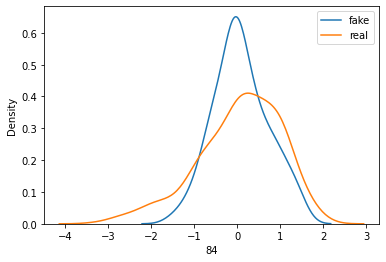

>Saved: drive/My Drive/GANs/20201027-175613_g_model_00030.h5, and drive/My Drive/GANs/20201027-175613_c_model_00030.h5


> iteration 28: #accepts 6005


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.945
60th percentile of preds: 0.474


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.723
       app_CNT_CHILDREN  ...           BAD
count      15000.000000  ...  15000.000000
mean           0.473728  ...      0.506200
std            0.671943  ...      0.499978
min           -2.287701  ...      0.000000
25%           -0.001573  ...      0.000000
50%            0.487206  ...      1.000000
75%            0.974160  ...      1.000000
max            2.969563  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.922


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.669


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.947
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-175739_g_model_00003.h5, and drive/My Drive/GANs/20201027-175739_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-175740_g_model_00006.h5, and drive/My Drive/GANs/20201027-175740_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-175741_g_model_00009.h5, and drive/My Drive/GANs/20201027-175741_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-175741_g_model_00012.h5, and drive/My Drive/GANs/20201027-175741_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-175742_g_model_00015.h5, and drive/My Drive/GANs/20201027-175742_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-175743_g_model_00018.h5, and drive/My Drive/GANs/20201027-175743_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-175743_g_model_00021.h5, and drive/My Drive/GANs/20201027-175743_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-175744_g_model_00024.h5, and drive/My Drive/GANs/20201027-175744_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-175745_g_mo

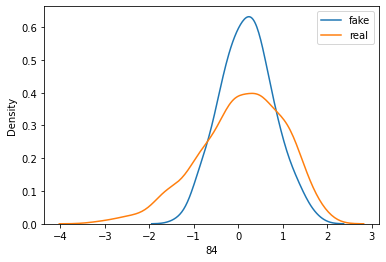

>Saved: drive/My Drive/GANs/20201027-175745_g_model_00030.h5, and drive/My Drive/GANs/20201027-175745_c_model_00030.h5


> iteration 29: #accepts 6205


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.945
60th percentile of preds: 0.481


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.755
       app_CNT_CHILDREN  ...           BAD
count      15500.000000  ...  15500.000000
mean           0.472166  ...      0.500387
std            0.670768  ...      0.500016
min           -2.038536  ...      0.000000
25%           -0.016708  ...      0.000000
50%            0.482391  ...      1.000000
75%            0.977508  ...      1.000000
max            3.146029  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.923


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.701


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.948
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-175916_g_model_00003.h5, and drive/My Drive/GANs/20201027-175916_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-175917_g_model_00006.h5, and drive/My Drive/GANs/20201027-175917_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-175918_g_model_00009.h5, and drive/My Drive/GANs/20201027-175918_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-175918_g_model_00012.h5, and drive/My Drive/GANs/20201027-175918_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-175919_g_model_00015.h5, and drive/My Drive/GANs/20201027-175919_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-175920_g_model_00018.h5, and drive/My Drive/GANs/20201027-175920_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-175920_g_model_00021.h5, and drive/My Drive/GANs/20201027-175920_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-175921_g_model_00024.h5, and drive/My Drive/GANs/20201027-175921_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-175921_g_mo

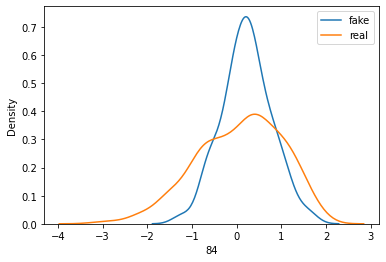

>Saved: drive/My Drive/GANs/20201027-175922_g_model_00030.h5, and drive/My Drive/GANs/20201027-175922_c_model_00030.h5


> iteration 30: #accepts 6405


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.945
60th percentile of preds: 0.479


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.752
       app_CNT_CHILDREN  ...           BAD
count      16000.000000  ...  16000.000000
mean           0.486672  ...      0.505062
std            0.670212  ...      0.499990
min           -2.048776  ...      0.000000
25%            0.003893  ...      0.000000
50%            0.487723  ...      1.000000
75%            0.993641  ...      1.000000
max            3.064850  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.918


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.695


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.949
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-180053_g_model_00003.h5, and drive/My Drive/GANs/20201027-180053_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-180054_g_model_00006.h5, and drive/My Drive/GANs/20201027-180054_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-180054_g_model_00009.h5, and drive/My Drive/GANs/20201027-180054_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-180055_g_model_00012.h5, and drive/My Drive/GANs/20201027-180055_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-180055_g_model_00015.h5, and drive/My Drive/GANs/20201027-180055_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-180056_g_model_00018.h5, and drive/My Drive/GANs/20201027-180056_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-180057_g_model_00021.h5, and drive/My Drive/GANs/20201027-180057_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-180057_g_model_00024.h5, and drive/My Drive/GANs/20201027-180057_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-180058_g_mo

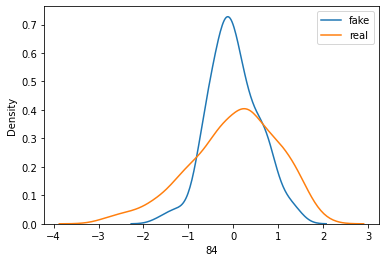

>Saved: drive/My Drive/GANs/20201027-180058_g_model_00030.h5, and drive/My Drive/GANs/20201027-180058_c_model_00030.h5


> iteration 31: #accepts 6605


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.946
60th percentile of preds: 0.477


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.745
       app_CNT_CHILDREN  ...           BAD
count      16500.000000  ...  16500.000000
mean           0.483263  ...      0.496667
std            0.677180  ...      0.500004
min           -1.989551  ...      0.000000
25%           -0.010674  ...      0.000000
50%            0.485118  ...      0.000000
75%            0.987486  ...      1.000000
max            2.863964  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.922


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.692


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.949
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-180234_g_model_00003.h5, and drive/My Drive/GANs/20201027-180234_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-180234_g_model_00006.h5, and drive/My Drive/GANs/20201027-180234_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-180235_g_model_00009.h5, and drive/My Drive/GANs/20201027-180235_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-180236_g_model_00012.h5, and drive/My Drive/GANs/20201027-180236_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-180236_g_model_00015.h5, and drive/My Drive/GANs/20201027-180236_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-180237_g_model_00018.h5, and drive/My Drive/GANs/20201027-180237_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-180238_g_model_00021.h5, and drive/My Drive/GANs/20201027-180238_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-180238_g_model_00024.h5, and drive/My Drive/GANs/20201027-180238_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-180239_g_mo

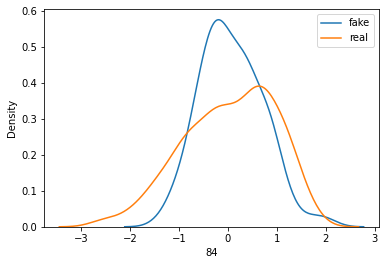

>Saved: drive/My Drive/GANs/20201027-180240_g_model_00030.h5, and drive/My Drive/GANs/20201027-180240_c_model_00030.h5


> iteration 32: #accepts 6805


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.946
60th percentile of preds: 0.479


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.759
       app_CNT_CHILDREN  ...           BAD
count      17000.000000  ...  17000.000000
mean           0.486321  ...      0.502176
std            0.668940  ...      0.500010
min           -2.585467  ...      0.000000
25%           -0.003452  ...      0.000000
50%            0.495599  ...      1.000000
75%            0.991435  ...      1.000000
max            3.446375  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.916


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.699


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.95
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-180418_g_model_00003.h5, and drive/My Drive/GANs/20201027-180418_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-180418_g_model_00006.h5, and drive/My Drive/GANs/20201027-180418_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-180419_g_model_00009.h5, and drive/My Drive/GANs/20201027-180419_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-180420_g_model_00012.h5, and drive/My Drive/GANs/20201027-180420_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-180420_g_model_00015.h5, and drive/My Drive/GANs/20201027-180420_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-180421_g_model_00018.h5, and drive/My Drive/GANs/20201027-180421_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-180422_g_model_00021.h5, and drive/My Drive/GANs/20201027-180422_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-180422_g_model_00024.h5, and drive/My Drive/GANs/20201027-180422_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-180423_g_mo

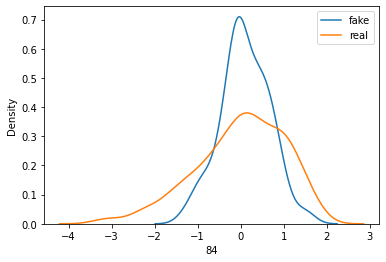

>Saved: drive/My Drive/GANs/20201027-180424_g_model_00030.h5, and drive/My Drive/GANs/20201027-180424_c_model_00030.h5


> iteration 33: #accepts 7005


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.946
60th percentile of preds: 0.46


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.698
       app_CNT_CHILDREN  ...           BAD
count      17500.000000  ...  17500.000000
mean           0.504679  ...      0.496229
std            0.661577  ...      0.500000
min           -2.002980  ...      0.000000
25%            0.026397  ...      0.000000
50%            0.512878  ...      0.000000
75%            1.005195  ...      1.000000
max            3.006117  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.926


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.651


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.95
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-180606_g_model_00003.h5, and drive/My Drive/GANs/20201027-180606_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-180607_g_model_00006.h5, and drive/My Drive/GANs/20201027-180607_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-180607_g_model_00009.h5, and drive/My Drive/GANs/20201027-180607_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-180608_g_model_00012.h5, and drive/My Drive/GANs/20201027-180608_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-180608_g_model_00015.h5, and drive/My Drive/GANs/20201027-180608_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-180609_g_model_00018.h5, and drive/My Drive/GANs/20201027-180609_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-180610_g_model_00021.h5, and drive/My Drive/GANs/20201027-180610_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-180610_g_model_00024.h5, and drive/My Drive/GANs/20201027-180610_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-180611_g_mo

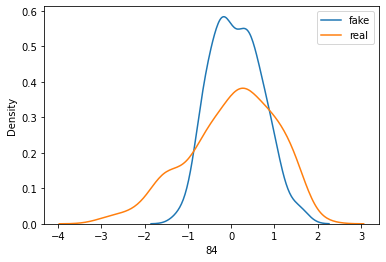

>Saved: drive/My Drive/GANs/20201027-180611_g_model_00030.h5, and drive/My Drive/GANs/20201027-180611_c_model_00030.h5


> iteration 34: #accepts 7205


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.945
60th percentile of preds: 0.467


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.709
       app_CNT_CHILDREN  ...           BAD
count      18000.000000  ...  18000.000000
mean           0.514071  ...      0.501556
std            0.655092  ...      0.500011
min           -1.914648  ...      0.000000
25%            0.036182  ...      0.000000
50%            0.521451  ...      1.000000
75%            1.012000  ...      1.000000
max            2.717143  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.918


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.657


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.951
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-180754_g_model_00003.h5, and drive/My Drive/GANs/20201027-180754_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-180755_g_model_00006.h5, and drive/My Drive/GANs/20201027-180755_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-180755_g_model_00009.h5, and drive/My Drive/GANs/20201027-180755_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-180756_g_model_00012.h5, and drive/My Drive/GANs/20201027-180756_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-180756_g_model_00015.h5, and drive/My Drive/GANs/20201027-180756_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-180757_g_model_00018.h5, and drive/My Drive/GANs/20201027-180757_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-180758_g_model_00021.h5, and drive/My Drive/GANs/20201027-180758_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-180758_g_model_00024.h5, and drive/My Drive/GANs/20201027-180758_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-180759_g_mo

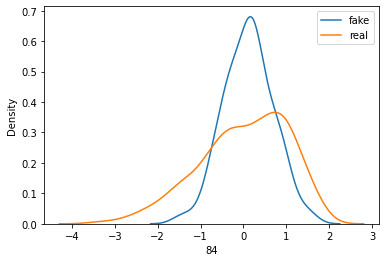

>Saved: drive/My Drive/GANs/20201027-180800_g_model_00030.h5, and drive/My Drive/GANs/20201027-180800_c_model_00030.h5


> iteration 35: #accepts 7405


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.945
60th percentile of preds: 0.473


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.732
       app_CNT_CHILDREN  ...           BAD
count      18500.000000  ...  18500.000000
mean           0.511764  ...      0.494432
std            0.655511  ...      0.499983
min           -2.069672  ...      0.000000
25%            0.040802  ...      0.000000
50%            0.513336  ...      0.000000
75%            1.004614  ...      1.000000
max            3.318277  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.919


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.677


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.951
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-180945_g_model_00003.h5, and drive/My Drive/GANs/20201027-180945_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-180946_g_model_00006.h5, and drive/My Drive/GANs/20201027-180946_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-180946_g_model_00009.h5, and drive/My Drive/GANs/20201027-180946_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-180948_g_model_00012.h5, and drive/My Drive/GANs/20201027-180948_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-180948_g_model_00015.h5, and drive/My Drive/GANs/20201027-180948_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-180949_g_model_00018.h5, and drive/My Drive/GANs/20201027-180949_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-180950_g_model_00021.h5, and drive/My Drive/GANs/20201027-180950_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-180950_g_model_00024.h5, and drive/My Drive/GANs/20201027-180950_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-180951_g_mo

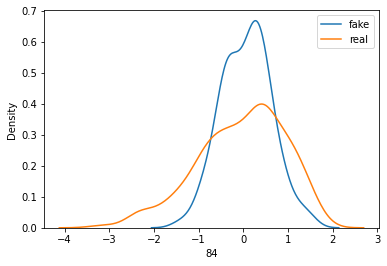

>Saved: drive/My Drive/GANs/20201027-180951_g_model_00030.h5, and drive/My Drive/GANs/20201027-180951_c_model_00030.h5


> iteration 36: #accepts 7605


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.944
60th percentile of preds: 0.483


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.772
       app_CNT_CHILDREN  ...           BAD
count      19000.000000  ...  19000.000000
mean           0.501781  ...      0.502158
std            0.652404  ...      0.500009
min           -2.120298  ...      0.000000
25%            0.027251  ...      0.000000
50%            0.510204  ...      1.000000
75%            0.987516  ...      1.000000
max            3.296401  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.914


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.717


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.951
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-181140_g_model_00003.h5, and drive/My Drive/GANs/20201027-181140_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-181141_g_model_00006.h5, and drive/My Drive/GANs/20201027-181141_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-181142_g_model_00009.h5, and drive/My Drive/GANs/20201027-181142_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-181142_g_model_00012.h5, and drive/My Drive/GANs/20201027-181142_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-181143_g_model_00015.h5, and drive/My Drive/GANs/20201027-181143_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-181144_g_model_00018.h5, and drive/My Drive/GANs/20201027-181144_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-181144_g_model_00021.h5, and drive/My Drive/GANs/20201027-181144_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-181145_g_model_00024.h5, and drive/My Drive/GANs/20201027-181145_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-181145_g_mo

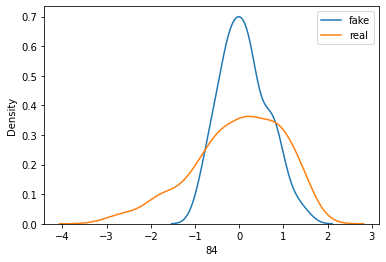

>Saved: drive/My Drive/GANs/20201027-181146_g_model_00030.h5, and drive/My Drive/GANs/20201027-181146_c_model_00030.h5


> iteration 37: #accepts 7805


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.943
60th percentile of preds: 0.483


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.758
       app_CNT_CHILDREN  ...           BAD
count      19500.000000  ...  19500.000000
mean           0.508303  ...      0.500564
std            0.653216  ...      0.500013
min           -2.184013  ...      0.000000
25%            0.036407  ...      0.000000
50%            0.514134  ...      1.000000
75%            0.991766  ...      1.000000
max            3.075042  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.917


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.704


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.952
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-181337_g_model_00003.h5, and drive/My Drive/GANs/20201027-181337_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-181338_g_model_00006.h5, and drive/My Drive/GANs/20201027-181338_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-181338_g_model_00009.h5, and drive/My Drive/GANs/20201027-181338_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-181339_g_model_00012.h5, and drive/My Drive/GANs/20201027-181339_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-181340_g_model_00015.h5, and drive/My Drive/GANs/20201027-181340_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-181340_g_model_00018.h5, and drive/My Drive/GANs/20201027-181340_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-181341_g_model_00021.h5, and drive/My Drive/GANs/20201027-181341_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-181341_g_model_00024.h5, and drive/My Drive/GANs/20201027-181341_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-181342_g_mo

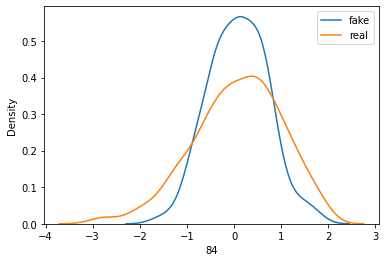

>Saved: drive/My Drive/GANs/20201027-181343_g_model_00030.h5, and drive/My Drive/GANs/20201027-181343_c_model_00030.h5


> iteration 38: #accepts 8005


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.944
60th percentile of preds: 0.481


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.756
       app_CNT_CHILDREN  ...           BAD
count      20000.000000  ...  20000.000000
mean           0.502295  ...      0.498650
std            0.657604  ...      0.500011
min           -1.959782  ...      0.000000
25%            0.032039  ...      0.000000
50%            0.511321  ...      0.000000
75%            0.997181  ...      1.000000
max            3.128918  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.922


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.705


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.952
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-181537_g_model_00003.h5, and drive/My Drive/GANs/20201027-181537_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-181537_g_model_00006.h5, and drive/My Drive/GANs/20201027-181537_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-181538_g_model_00009.h5, and drive/My Drive/GANs/20201027-181538_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-181538_g_model_00012.h5, and drive/My Drive/GANs/20201027-181538_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-181539_g_model_00015.h5, and drive/My Drive/GANs/20201027-181539_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-181540_g_model_00018.h5, and drive/My Drive/GANs/20201027-181540_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-181540_g_model_00021.h5, and drive/My Drive/GANs/20201027-181540_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-181541_g_model_00024.h5, and drive/My Drive/GANs/20201027-181541_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-181541_g_mo

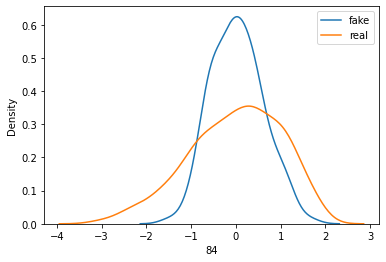

>Saved: drive/My Drive/GANs/20201027-181542_g_model_00030.h5, and drive/My Drive/GANs/20201027-181542_c_model_00030.h5


> iteration 39: #accepts 8205


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.945
60th percentile of preds: 0.485


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.764
       app_CNT_CHILDREN  ...           BAD
count      20500.000000  ...  20500.000000
mean           0.515288  ...      0.498732
std            0.653025  ...      0.500011
min           -2.070850  ...      0.000000
25%            0.048024  ...      0.000000
50%            0.527670  ...      0.000000
75%            1.006860  ...      1.000000
max            3.394768  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.924


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.711


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.952


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


>Saved: drive/My Drive/GANs/20201027-181739_g_model_00003.h5, and drive/My Drive/GANs/20201027-181739_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-181739_g_model_00006.h5, and drive/My Drive/GANs/20201027-181739_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-181740_g_model_00009.h5, and drive/My Drive/GANs/20201027-181740_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-181741_g_model_00012.h5, and drive/My Drive/GANs/20201027-181741_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-181741_g_model_00015.h5, and drive/My Drive/GANs/20201027-181741_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-181742_g_model_00018.h5, and drive/My Drive/GANs/20201027-181742_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-181742_g_model_00021.h5, and drive/My Drive/GANs/20201027-181742_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-181743_g_model_00024.h5, and drive/My Drive/GANs/20201027-181743_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-181744_g_mo

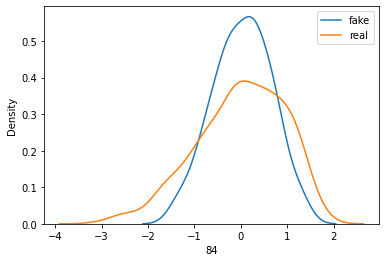

>Saved: drive/My Drive/GANs/20201027-181744_g_model_00030.h5, and drive/My Drive/GANs/20201027-181744_c_model_00030.h5


> iteration 40: #accepts 8405


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.945
60th percentile of preds: 0.486


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.769
       app_CNT_CHILDREN  ...           BAD
count      21000.000000  ...  21000.000000
mean           0.533401  ...      0.498476
std            0.652315  ...      0.500010
min           -1.920332  ...      0.000000
25%            0.062420  ...      0.000000
50%            0.543274  ...      0.000000
75%            1.018209  ...      1.000000
max            3.232537  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.92


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.718


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.952


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


>Saved: drive/My Drive/GANs/20201027-181944_g_model_00003.h5, and drive/My Drive/GANs/20201027-181944_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-181945_g_model_00006.h5, and drive/My Drive/GANs/20201027-181945_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-181946_g_model_00009.h5, and drive/My Drive/GANs/20201027-181946_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-181946_g_model_00012.h5, and drive/My Drive/GANs/20201027-181946_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-181947_g_model_00015.h5, and drive/My Drive/GANs/20201027-181947_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-181948_g_model_00018.h5, and drive/My Drive/GANs/20201027-181948_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-181948_g_model_00021.h5, and drive/My Drive/GANs/20201027-181948_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-181949_g_model_00024.h5, and drive/My Drive/GANs/20201027-181949_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-181950_g_mo

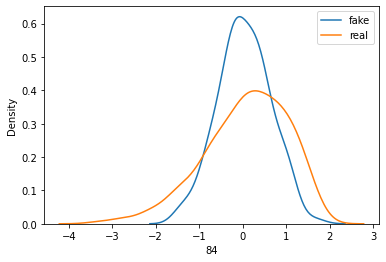

>Saved: drive/My Drive/GANs/20201027-181950_g_model_00030.h5, and drive/My Drive/GANs/20201027-181950_c_model_00030.h5


> iteration 41: #accepts 8605


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.946
60th percentile of preds: 0.467


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.708
       app_CNT_CHILDREN  ...           BAD
count      21500.000000  ...  21500.000000
mean           0.526445  ...      0.502698
std            0.651050  ...      0.500004
min           -1.838819  ...      0.000000
25%            0.059860  ...      0.000000
50%            0.534912  ...      1.000000
75%            1.010262  ...      1.000000
max            3.021229  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.916


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.663


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.953
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-182155_g_model_00003.h5, and drive/My Drive/GANs/20201027-182155_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-182155_g_model_00006.h5, and drive/My Drive/GANs/20201027-182155_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-182156_g_model_00009.h5, and drive/My Drive/GANs/20201027-182156_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-182157_g_model_00012.h5, and drive/My Drive/GANs/20201027-182157_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-182157_g_model_00015.h5, and drive/My Drive/GANs/20201027-182157_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-182158_g_model_00018.h5, and drive/My Drive/GANs/20201027-182158_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-182158_g_model_00021.h5, and drive/My Drive/GANs/20201027-182158_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-182159_g_model_00024.h5, and drive/My Drive/GANs/20201027-182159_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-182200_g_mo

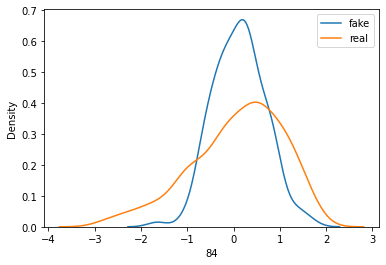

>Saved: drive/My Drive/GANs/20201027-182200_g_model_00030.h5, and drive/My Drive/GANs/20201027-182200_c_model_00030.h5


> iteration 42: #accepts 8805


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.945
60th percentile of preds: 0.479


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.756
       app_CNT_CHILDREN  ...           BAD
count      22000.000000  ...  22000.000000
mean           0.522144  ...      0.498091
std            0.651516  ...      0.500008
min           -1.783176  ...      0.000000
25%            0.046136  ...      0.000000
50%            0.531350  ...      0.000000
75%            1.005967  ...      1.000000
max            2.864430  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.917


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.695


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.953


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


>Saved: drive/My Drive/GANs/20201027-182406_g_model_00003.h5, and drive/My Drive/GANs/20201027-182406_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-182406_g_model_00006.h5, and drive/My Drive/GANs/20201027-182406_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-182407_g_model_00009.h5, and drive/My Drive/GANs/20201027-182407_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-182408_g_model_00012.h5, and drive/My Drive/GANs/20201027-182408_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-182408_g_model_00015.h5, and drive/My Drive/GANs/20201027-182408_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-182409_g_model_00018.h5, and drive/My Drive/GANs/20201027-182409_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-182409_g_model_00021.h5, and drive/My Drive/GANs/20201027-182409_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-182410_g_model_00024.h5, and drive/My Drive/GANs/20201027-182410_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-182411_g_mo

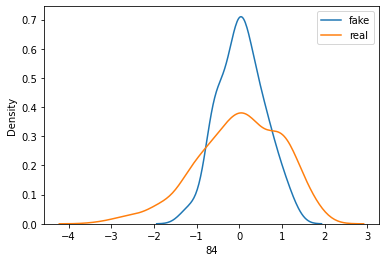

>Saved: drive/My Drive/GANs/20201027-182411_g_model_00030.h5, and drive/My Drive/GANs/20201027-182411_c_model_00030.h5


> iteration 43: #accepts 9005


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.946
60th percentile of preds: 0.473


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.736
       app_CNT_CHILDREN  ...           BAD
count      22500.000000  ...  22500.000000
mean           0.525956  ...      0.501822
std            0.640034  ...      0.500008
min           -1.923263  ...      0.000000
25%            0.069244  ...      0.000000
50%            0.539247  ...      1.000000
75%            1.001806  ...      1.000000
max            3.054567  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.919


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.686


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.953
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-182620_g_model_00003.h5, and drive/My Drive/GANs/20201027-182620_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-182621_g_model_00006.h5, and drive/My Drive/GANs/20201027-182621_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-182621_g_model_00009.h5, and drive/My Drive/GANs/20201027-182621_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-182622_g_model_00012.h5, and drive/My Drive/GANs/20201027-182622_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-182623_g_model_00015.h5, and drive/My Drive/GANs/20201027-182623_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-182623_g_model_00018.h5, and drive/My Drive/GANs/20201027-182623_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-182624_g_model_00021.h5, and drive/My Drive/GANs/20201027-182624_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-182625_g_model_00024.h5, and drive/My Drive/GANs/20201027-182625_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-182625_g_mo

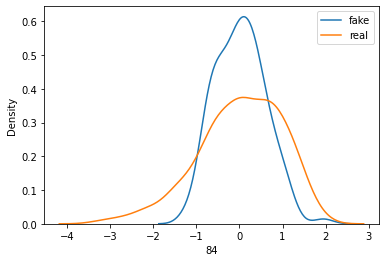

>Saved: drive/My Drive/GANs/20201027-182626_g_model_00030.h5, and drive/My Drive/GANs/20201027-182626_c_model_00030.h5


> iteration 44: #accepts 9205


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.946
60th percentile of preds: 0.471


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.719
       app_CNT_CHILDREN  ...           BAD
count      23000.000000  ...  23000.000000
mean           0.531460  ...      0.504478
std            0.637959  ...      0.499991
min           -1.894436  ...      0.000000
25%            0.079097  ...      0.000000
50%            0.540516  ...      1.000000
75%            1.005997  ...      1.000000
max            3.273022  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.913


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.668


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.953
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-182838_g_model_00003.h5, and drive/My Drive/GANs/20201027-182838_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-182839_g_model_00006.h5, and drive/My Drive/GANs/20201027-182839_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-182839_g_model_00009.h5, and drive/My Drive/GANs/20201027-182839_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-182840_g_model_00012.h5, and drive/My Drive/GANs/20201027-182840_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-182841_g_model_00015.h5, and drive/My Drive/GANs/20201027-182841_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-182841_g_model_00018.h5, and drive/My Drive/GANs/20201027-182841_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-182842_g_model_00021.h5, and drive/My Drive/GANs/20201027-182842_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-182842_g_model_00024.h5, and drive/My Drive/GANs/20201027-182842_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-182843_g_mo

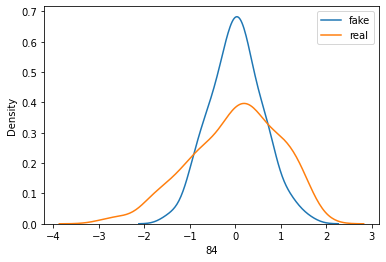

>Saved: drive/My Drive/GANs/20201027-182844_g_model_00030.h5, and drive/My Drive/GANs/20201027-182844_c_model_00030.h5


> iteration 45: #accepts 9405


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.946
60th percentile of preds: 0.474


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.732
       app_CNT_CHILDREN  ...           BAD
count      23500.000000  ...  23500.000000
mean           0.535275  ...      0.501915
std            0.640569  ...      0.500007
min           -1.897713  ...      0.000000
25%            0.076221  ...      0.000000
50%            0.540142  ...      1.000000
75%            1.007930  ...      1.000000
max            3.456303  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.919


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.678


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.953
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-183059_g_model_00003.h5, and drive/My Drive/GANs/20201027-183059_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-183100_g_model_00006.h5, and drive/My Drive/GANs/20201027-183100_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-183100_g_model_00009.h5, and drive/My Drive/GANs/20201027-183100_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-183101_g_model_00012.h5, and drive/My Drive/GANs/20201027-183101_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-183102_g_model_00015.h5, and drive/My Drive/GANs/20201027-183102_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-183102_g_model_00018.h5, and drive/My Drive/GANs/20201027-183102_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-183103_g_model_00021.h5, and drive/My Drive/GANs/20201027-183103_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-183104_g_model_00024.h5, and drive/My Drive/GANs/20201027-183104_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-183104_g_mo

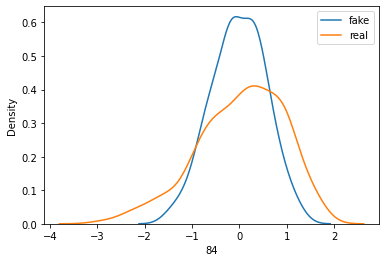

>Saved: drive/My Drive/GANs/20201027-183105_g_model_00030.h5, and drive/My Drive/GANs/20201027-183105_c_model_00030.h5


> iteration 46: #accepts 9605


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.947
60th percentile of preds: 0.473


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.723
       app_CNT_CHILDREN  ...           BAD
count      24000.000000  ...  24000.000000
mean           0.537398  ...      0.503125
std            0.633031  ...      0.500001
min           -1.846656  ...      0.000000
25%            0.077378  ...      0.000000
50%            0.551470  ...      1.000000
75%            1.007325  ...      1.000000
max            3.142929  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.92


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.676


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.953


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


>Saved: drive/My Drive/GANs/20201027-183323_g_model_00003.h5, and drive/My Drive/GANs/20201027-183323_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-183323_g_model_00006.h5, and drive/My Drive/GANs/20201027-183323_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-183324_g_model_00009.h5, and drive/My Drive/GANs/20201027-183324_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-183324_g_model_00012.h5, and drive/My Drive/GANs/20201027-183324_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-183325_g_model_00015.h5, and drive/My Drive/GANs/20201027-183325_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-183326_g_model_00018.h5, and drive/My Drive/GANs/20201027-183326_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-183326_g_model_00021.h5, and drive/My Drive/GANs/20201027-183326_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-183327_g_model_00024.h5, and drive/My Drive/GANs/20201027-183327_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-183327_g_mo

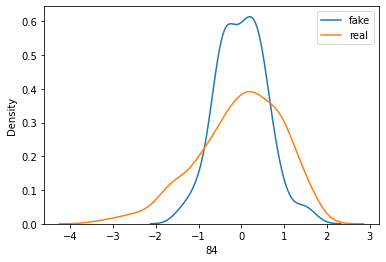

>Saved: drive/My Drive/GANs/20201027-183328_g_model_00030.h5, and drive/My Drive/GANs/20201027-183328_c_model_00030.h5


> iteration 47: #accepts 9805


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.948
60th percentile of preds: 0.475


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.732
       app_CNT_CHILDREN  ...           BAD
count      24500.000000  ...  24500.000000
mean           0.544438  ...      0.500163
std            0.625914  ...      0.500010
min           -1.990039  ...      0.000000
25%            0.094547  ...      0.000000
50%            0.550149  ...      1.000000
75%            1.007547  ...      1.000000
max            2.721513  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.915


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.685


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.953
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-183551_g_model_00003.h5, and drive/My Drive/GANs/20201027-183551_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-183551_g_model_00006.h5, and drive/My Drive/GANs/20201027-183551_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-183552_g_model_00009.h5, and drive/My Drive/GANs/20201027-183552_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-183553_g_model_00012.h5, and drive/My Drive/GANs/20201027-183553_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-183554_g_model_00015.h5, and drive/My Drive/GANs/20201027-183554_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-183554_g_model_00018.h5, and drive/My Drive/GANs/20201027-183554_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-183555_g_model_00021.h5, and drive/My Drive/GANs/20201027-183555_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-183556_g_model_00024.h5, and drive/My Drive/GANs/20201027-183556_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-183557_g_mo

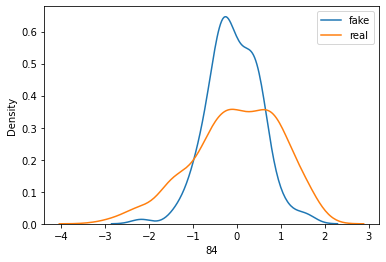

>Saved: drive/My Drive/GANs/20201027-183557_g_model_00030.h5, and drive/My Drive/GANs/20201027-183557_c_model_00030.h5


> iteration 48: #accepts 10005


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.947
60th percentile of preds: 0.472


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.733
       app_CNT_CHILDREN  ...           BAD
count      25000.000000  ...  25000.000000
mean           0.547808  ...      0.498240
std            0.626341  ...      0.500007
min           -1.855732  ...      0.000000
25%            0.102878  ...      0.000000
50%            0.556806  ...      0.000000
75%            1.011050  ...      1.000000
max            2.914275  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.913


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.674


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.953
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-183825_g_model_00003.h5, and drive/My Drive/GANs/20201027-183825_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-183826_g_model_00006.h5, and drive/My Drive/GANs/20201027-183826_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-183827_g_model_00009.h5, and drive/My Drive/GANs/20201027-183827_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-183827_g_model_00012.h5, and drive/My Drive/GANs/20201027-183827_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-183828_g_model_00015.h5, and drive/My Drive/GANs/20201027-183828_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-183829_g_model_00018.h5, and drive/My Drive/GANs/20201027-183829_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-183829_g_model_00021.h5, and drive/My Drive/GANs/20201027-183829_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-183830_g_model_00024.h5, and drive/My Drive/GANs/20201027-183830_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-183831_g_mo

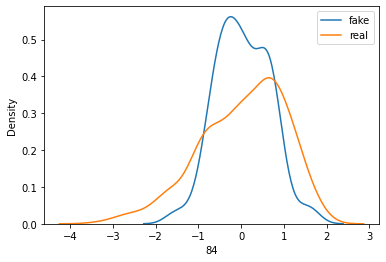

>Saved: drive/My Drive/GANs/20201027-183831_g_model_00030.h5, and drive/My Drive/GANs/20201027-183831_c_model_00030.h5


> iteration 49: #accepts 10205


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.947
60th percentile of preds: 0.476


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.738
       app_CNT_CHILDREN  ...           BAD
count      25500.000000  ...  25500.000000
mean           0.543712  ...      0.501529
std            0.624581  ...      0.500007
min           -1.783782  ...      0.000000
25%            0.092126  ...      0.000000
50%            0.554947  ...      1.000000
75%            1.006377  ...      1.000000
max            3.057304  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.921


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.692


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-184101_g_model_00003.h5, and drive/My Drive/GANs/20201027-184101_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-184101_g_model_00006.h5, and drive/My Drive/GANs/20201027-184101_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-184102_g_model_00009.h5, and drive/My Drive/GANs/20201027-184102_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-184102_g_model_00012.h5, and drive/My Drive/GANs/20201027-184102_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-184103_g_model_00015.h5, and drive/My Drive/GANs/20201027-184103_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-184104_g_model_00018.h5, and drive/My Drive/GANs/20201027-184104_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-184104_g_model_00021.h5, and drive/My Drive/GANs/20201027-184104_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-184105_g_model_00024.h5, and drive/My Drive/GANs/20201027-184105_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-184106_g_mo

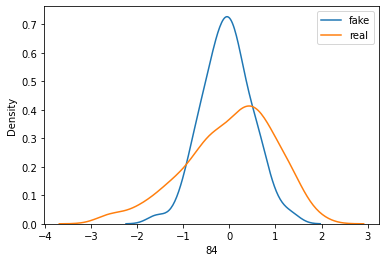

>Saved: drive/My Drive/GANs/20201027-184106_g_model_00030.h5, and drive/My Drive/GANs/20201027-184106_c_model_00030.h5


> iteration 50: #accepts 10405


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.946
60th percentile of preds: 0.474


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.732
       app_CNT_CHILDREN  ...           BAD
count      26000.000000  ...  26000.000000
mean           0.546294  ...      0.499077
std            0.628597  ...      0.500009
min           -1.947044  ...      0.000000
25%            0.093308  ...      0.000000
50%            0.560508  ...      0.000000
75%            1.007185  ...      1.000000
max            3.323619  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.92


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.688


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-184343_g_model_00003.h5, and drive/My Drive/GANs/20201027-184343_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-184344_g_model_00006.h5, and drive/My Drive/GANs/20201027-184344_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-184344_g_model_00009.h5, and drive/My Drive/GANs/20201027-184344_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-184345_g_model_00012.h5, and drive/My Drive/GANs/20201027-184345_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-184346_g_model_00015.h5, and drive/My Drive/GANs/20201027-184346_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-184346_g_model_00018.h5, and drive/My Drive/GANs/20201027-184346_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-184347_g_model_00021.h5, and drive/My Drive/GANs/20201027-184347_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-184348_g_model_00024.h5, and drive/My Drive/GANs/20201027-184348_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-184349_g_mo

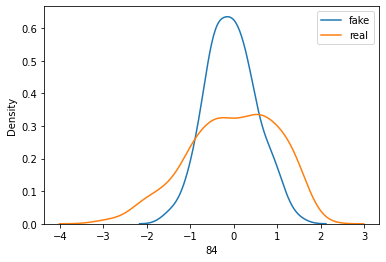

>Saved: drive/My Drive/GANs/20201027-184349_g_model_00030.h5, and drive/My Drive/GANs/20201027-184349_c_model_00030.h5


> iteration 51: #accepts 10605


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.946
60th percentile of preds: 0.472


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.724
       app_CNT_CHILDREN  ...           BAD
count      26500.000000  ...  26500.000000
mean           0.538566  ...      0.496075
std            0.616280  ...      0.499994
min           -1.977854  ...      0.000000
25%            0.101031  ...      0.000000
50%            0.550832  ...      0.000000
75%            0.999852  ...      1.000000
max            2.970365  ...      1.000000

[8 rows x 92 columns]
60th percentile of preds: 0.907


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.683


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-184628_g_model_00003.h5, and drive/My Drive/GANs/20201027-184628_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-184628_g_model_00006.h5, and drive/My Drive/GANs/20201027-184628_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-184629_g_model_00009.h5, and drive/My Drive/GANs/20201027-184629_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-184630_g_model_00012.h5, and drive/My Drive/GANs/20201027-184630_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-184630_g_model_00015.h5, and drive/My Drive/GANs/20201027-184630_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-184631_g_model_00018.h5, and drive/My Drive/GANs/20201027-184631_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-184632_g_model_00021.h5, and drive/My Drive/GANs/20201027-184632_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-184632_g_model_00024.h5, and drive/My Drive/GANs/20201027-184632_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-184633_g_mo

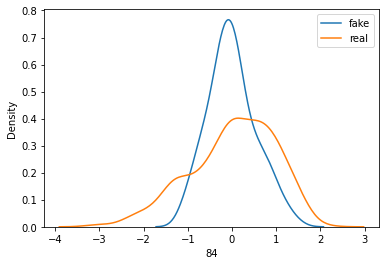

>Saved: drive/My Drive/GANs/20201027-184634_g_model_00030.h5, and drive/My Drive/GANs/20201027-184634_c_model_00030.h5


> iteration 52: #accepts 10805


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.946
60th percentile of preds: 0.477


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.746
       app_CNT_CHILDREN  ...           BAD
count      27000.000000  ...  27000.000000
mean           0.544677  ...      0.499519
std            0.613586  ...      0.500009
min           -1.657171  ...      0.000000
25%            0.102211  ...      0.000000
50%            0.558310  ...      0.000000
75%            0.993686  ...      1.000000
max            3.282908  ...      1.000000

[8 rows x 92 columns]
60th percentile of preds: 0.912


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.703


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-184910_g_model_00003.h5, and drive/My Drive/GANs/20201027-184910_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-184910_g_model_00006.h5, and drive/My Drive/GANs/20201027-184910_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-184911_g_model_00009.h5, and drive/My Drive/GANs/20201027-184911_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-184911_g_model_00012.h5, and drive/My Drive/GANs/20201027-184911_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-184912_g_model_00015.h5, and drive/My Drive/GANs/20201027-184912_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-184913_g_model_00018.h5, and drive/My Drive/GANs/20201027-184913_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-184913_g_model_00021.h5, and drive/My Drive/GANs/20201027-184913_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-184914_g_model_00024.h5, and drive/My Drive/GANs/20201027-184914_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-184915_g_mo

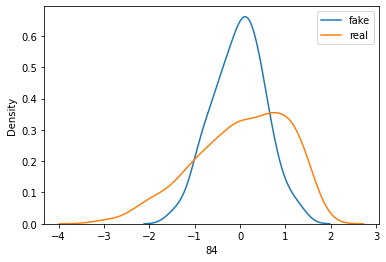

>Saved: drive/My Drive/GANs/20201027-184915_g_model_00030.h5, and drive/My Drive/GANs/20201027-184915_c_model_00030.h5


> iteration 53: #accepts 11005


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.947
60th percentile of preds: 0.453


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.683
       app_CNT_CHILDREN  ...           BAD
count      27500.000000  ...  27500.000000
mean           0.541145  ...      0.500145
std            0.613540  ...      0.500009
min           -1.737241  ...      0.000000
25%            0.103306  ...      0.000000
50%            0.555883  ...      1.000000
75%            0.995907  ...      1.000000
max            3.140879  ...      1.000000

[8 rows x 92 columns]
60th percentile of preds: 0.911


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.626


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.953
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-185153_g_model_00003.h5, and drive/My Drive/GANs/20201027-185153_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-185153_g_model_00006.h5, and drive/My Drive/GANs/20201027-185153_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-185154_g_model_00009.h5, and drive/My Drive/GANs/20201027-185154_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-185155_g_model_00012.h5, and drive/My Drive/GANs/20201027-185155_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-185155_g_model_00015.h5, and drive/My Drive/GANs/20201027-185155_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-185156_g_model_00018.h5, and drive/My Drive/GANs/20201027-185156_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-185156_g_model_00021.h5, and drive/My Drive/GANs/20201027-185156_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-185157_g_model_00024.h5, and drive/My Drive/GANs/20201027-185157_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-185158_g_mo

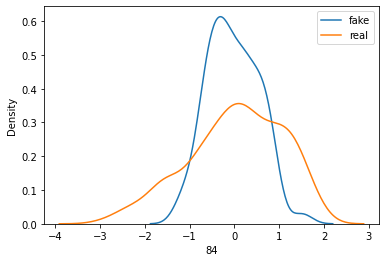

>Saved: drive/My Drive/GANs/20201027-185158_g_model_00030.h5, and drive/My Drive/GANs/20201027-185158_c_model_00030.h5


> iteration 54: #accepts 11205


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.947
60th percentile of preds: 0.465


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.722
       app_CNT_CHILDREN  ...           BAD
count      28000.000000  ...  28000.000000
mean           0.533638  ...      0.495036
std            0.607750  ...      0.499984
min           -1.886310  ...      0.000000
25%            0.105744  ...      0.000000
50%            0.545730  ...      0.000000
75%            0.985891  ...      1.000000
max            3.520685  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.912


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.665


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-185444_g_model_00003.h5, and drive/My Drive/GANs/20201027-185444_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-185444_g_model_00006.h5, and drive/My Drive/GANs/20201027-185444_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-185445_g_model_00009.h5, and drive/My Drive/GANs/20201027-185445_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-185446_g_model_00012.h5, and drive/My Drive/GANs/20201027-185446_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-185446_g_model_00015.h5, and drive/My Drive/GANs/20201027-185446_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-185447_g_model_00018.h5, and drive/My Drive/GANs/20201027-185447_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-185447_g_model_00021.h5, and drive/My Drive/GANs/20201027-185447_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-185448_g_model_00024.h5, and drive/My Drive/GANs/20201027-185448_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-185449_g_mo

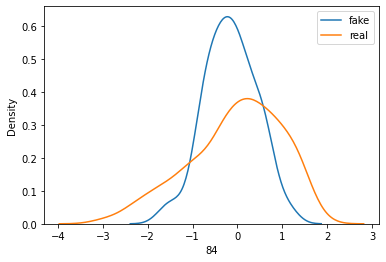

>Saved: drive/My Drive/GANs/20201027-185449_g_model_00030.h5, and drive/My Drive/GANs/20201027-185449_c_model_00030.h5


> iteration 55: #accepts 11405


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.948
60th percentile of preds: 0.456


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.705
       app_CNT_CHILDREN  ...           BAD
count      28500.000000  ...  28500.000000
mean           0.541942  ...      0.495965
std            0.614293  ...      0.499992
min           -1.824202  ...      0.000000
25%            0.112286  ...      0.000000
50%            0.561636  ...      0.000000
75%            0.988525  ...      1.000000
max            3.621402  ...      1.000000

[8 rows x 92 columns]
60th percentile of preds: 0.915


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.636


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-185731_g_model_00003.h5, and drive/My Drive/GANs/20201027-185731_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-185732_g_model_00006.h5, and drive/My Drive/GANs/20201027-185732_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-185732_g_model_00009.h5, and drive/My Drive/GANs/20201027-185732_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-185733_g_model_00012.h5, and drive/My Drive/GANs/20201027-185733_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-185734_g_model_00015.h5, and drive/My Drive/GANs/20201027-185734_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-185734_g_model_00018.h5, and drive/My Drive/GANs/20201027-185734_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-185735_g_model_00021.h5, and drive/My Drive/GANs/20201027-185735_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-185735_g_model_00024.h5, and drive/My Drive/GANs/20201027-185735_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-185736_g_mo

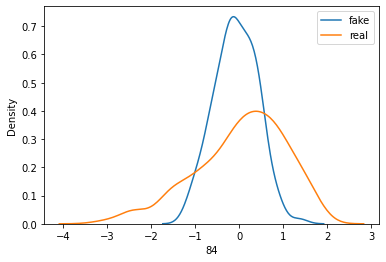

>Saved: drive/My Drive/GANs/20201027-185737_g_model_00030.h5, and drive/My Drive/GANs/20201027-185737_c_model_00030.h5


> iteration 56: #accepts 11605


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.948
60th percentile of preds: 0.462


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.71
       app_CNT_CHILDREN  ...           BAD
count      29000.000000  ...  29000.000000
mean           0.535179  ...      0.500000
std            0.608234  ...      0.500009
min           -1.833052  ...      0.000000
25%            0.102944  ...      0.000000
50%            0.548239  ...      0.500000
75%            0.983841  ...      1.000000
max            3.283733  ...      1.000000

[8 rows x 92 columns]
60th percentile of preds: 0.916


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.652


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-190023_g_model_00003.h5, and drive/My Drive/GANs/20201027-190023_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-190024_g_model_00006.h5, and drive/My Drive/GANs/20201027-190024_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-190024_g_model_00009.h5, and drive/My Drive/GANs/20201027-190024_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-190025_g_model_00012.h5, and drive/My Drive/GANs/20201027-190025_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-190026_g_model_00015.h5, and drive/My Drive/GANs/20201027-190026_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-190026_g_model_00018.h5, and drive/My Drive/GANs/20201027-190026_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-190027_g_model_00021.h5, and drive/My Drive/GANs/20201027-190027_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-190027_g_model_00024.h5, and drive/My Drive/GANs/20201027-190027_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-190028_g_mo

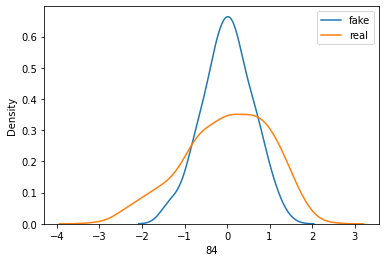

>Saved: drive/My Drive/GANs/20201027-190029_g_model_00030.h5, and drive/My Drive/GANs/20201027-190029_c_model_00030.h5


> iteration 57: #accepts 11805


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.948
60th percentile of preds: 0.467


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.717
       app_CNT_CHILDREN  ...           BAD
count      29500.000000  ...  29500.000000
mean           0.530254  ...      0.502678
std            0.599731  ...      0.500001
min           -1.849352  ...      0.000000
25%            0.108305  ...      0.000000
50%            0.540208  ...      1.000000
75%            0.976979  ...      1.000000
max            2.641449  ...      1.000000

[8 rows x 92 columns]
60th percentile of preds: 0.908


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.662


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-190321_g_model_00003.h5, and drive/My Drive/GANs/20201027-190321_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-190321_g_model_00006.h5, and drive/My Drive/GANs/20201027-190321_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-190322_g_model_00009.h5, and drive/My Drive/GANs/20201027-190322_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-190322_g_model_00012.h5, and drive/My Drive/GANs/20201027-190322_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-190323_g_model_00015.h5, and drive/My Drive/GANs/20201027-190323_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-190324_g_model_00018.h5, and drive/My Drive/GANs/20201027-190324_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-190324_g_model_00021.h5, and drive/My Drive/GANs/20201027-190324_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-190325_g_model_00024.h5, and drive/My Drive/GANs/20201027-190325_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-190326_g_mo

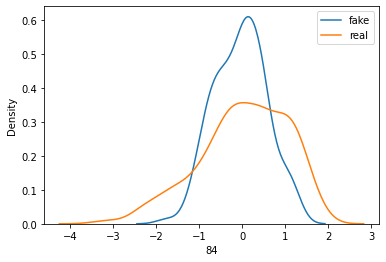

>Saved: drive/My Drive/GANs/20201027-190326_g_model_00030.h5, and drive/My Drive/GANs/20201027-190326_c_model_00030.h5


> iteration 58: #accepts 12005


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.948
60th percentile of preds: 0.477


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.74
       app_CNT_CHILDREN  ...           BAD
count      30000.000000  ...  30000.000000
mean           0.542658  ...      0.497600
std            0.604765  ...      0.500003
min           -1.893334  ...      0.000000
25%            0.110533  ...      0.000000
50%            0.556356  ...      0.000000
75%            0.986898  ...      1.000000
max            3.055846  ...      1.000000

[8 rows x 92 columns]
60th percentile of preds: 0.913


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.689


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-190617_g_model_00003.h5, and drive/My Drive/GANs/20201027-190617_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-190617_g_model_00006.h5, and drive/My Drive/GANs/20201027-190617_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-190618_g_model_00009.h5, and drive/My Drive/GANs/20201027-190618_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-190619_g_model_00012.h5, and drive/My Drive/GANs/20201027-190619_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-190619_g_model_00015.h5, and drive/My Drive/GANs/20201027-190619_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-190620_g_model_00018.h5, and drive/My Drive/GANs/20201027-190620_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-190621_g_model_00021.h5, and drive/My Drive/GANs/20201027-190621_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-190621_g_model_00024.h5, and drive/My Drive/GANs/20201027-190621_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-190622_g_mo

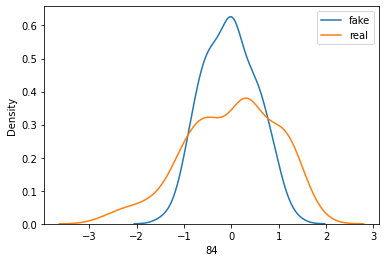

>Saved: drive/My Drive/GANs/20201027-190623_g_model_00030.h5, and drive/My Drive/GANs/20201027-190623_c_model_00030.h5


> iteration 59: #accepts 12205


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.948
60th percentile of preds: 0.466


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.704
       app_CNT_CHILDREN  ...           BAD
count      30500.000000  ...  30500.000000
mean           0.537854  ...      0.497213
std            0.604931  ...      0.500000
min           -1.859975  ...      0.000000
25%            0.109723  ...      0.000000
50%            0.552710  ...      0.000000
75%            0.983963  ...      1.000000
max            3.404704  ...      1.000000

[8 rows x 92 columns]
60th percentile of preds: 0.91


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.659


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-190927_g_model_00003.h5, and drive/My Drive/GANs/20201027-190927_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-190928_g_model_00006.h5, and drive/My Drive/GANs/20201027-190928_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-190929_g_model_00009.h5, and drive/My Drive/GANs/20201027-190929_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-190929_g_model_00012.h5, and drive/My Drive/GANs/20201027-190929_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-190930_g_model_00015.h5, and drive/My Drive/GANs/20201027-190930_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-190931_g_model_00018.h5, and drive/My Drive/GANs/20201027-190931_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-190931_g_model_00021.h5, and drive/My Drive/GANs/20201027-190931_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-190932_g_model_00024.h5, and drive/My Drive/GANs/20201027-190932_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-190933_g_mo

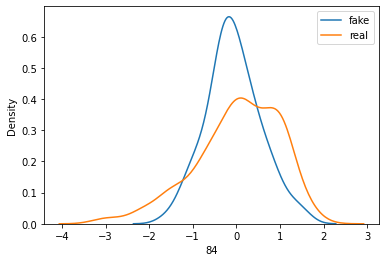

>Saved: drive/My Drive/GANs/20201027-190933_g_model_00030.h5, and drive/My Drive/GANs/20201027-190933_c_model_00030.h5


> iteration 60: #accepts 12405


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.949
60th percentile of preds: 0.474


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.725
       app_CNT_CHILDREN  ...           BAD
count      31000.000000  ...  31000.000000
mean           0.530860  ...      0.500355
std            0.601363  ...      0.500008
min           -1.768497  ...      0.000000
25%            0.107409  ...      0.000000
50%            0.546673  ...      1.000000
75%            0.971833  ...      1.000000
max            3.204416  ...      1.000000

[8 rows x 92 columns]
60th percentile of preds: 0.916


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.675


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


>Saved: drive/My Drive/GANs/20201027-191232_g_model_00003.h5, and drive/My Drive/GANs/20201027-191232_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-191233_g_model_00006.h5, and drive/My Drive/GANs/20201027-191233_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-191233_g_model_00009.h5, and drive/My Drive/GANs/20201027-191233_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-191234_g_model_00012.h5, and drive/My Drive/GANs/20201027-191234_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-191234_g_model_00015.h5, and drive/My Drive/GANs/20201027-191234_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-191235_g_model_00018.h5, and drive/My Drive/GANs/20201027-191235_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-191236_g_model_00021.h5, and drive/My Drive/GANs/20201027-191236_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-191236_g_model_00024.h5, and drive/My Drive/GANs/20201027-191236_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-191237_g_mo

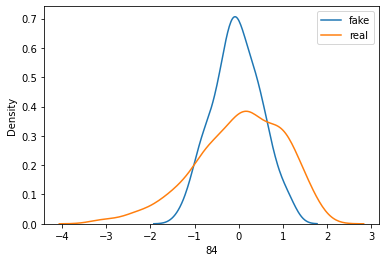

>Saved: drive/My Drive/GANs/20201027-191237_g_model_00030.h5, and drive/My Drive/GANs/20201027-191237_c_model_00030.h5


> iteration 61: #accepts 12605


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.949
60th percentile of preds: 0.474


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.729
       app_CNT_CHILDREN  ...           BAD
count      31500.000000  ...  31500.000000
mean           0.526131  ...      0.500762
std            0.597206  ...      0.500007
min           -1.779904  ...      0.000000
25%            0.102717  ...      0.000000
50%            0.546504  ...      1.000000
75%            0.963900  ...      1.000000
max            2.862448  ...      1.000000

[8 rows x 92 columns]
60th percentile of preds: 0.911


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.685


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


>Saved: drive/My Drive/GANs/20201027-191535_g_model_00003.h5, and drive/My Drive/GANs/20201027-191535_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-191535_g_model_00006.h5, and drive/My Drive/GANs/20201027-191535_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-191536_g_model_00009.h5, and drive/My Drive/GANs/20201027-191536_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-191537_g_model_00012.h5, and drive/My Drive/GANs/20201027-191537_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-191537_g_model_00015.h5, and drive/My Drive/GANs/20201027-191537_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-191538_g_model_00018.h5, and drive/My Drive/GANs/20201027-191538_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-191538_g_model_00021.h5, and drive/My Drive/GANs/20201027-191538_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-191539_g_model_00024.h5, and drive/My Drive/GANs/20201027-191539_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-191540_g_mo

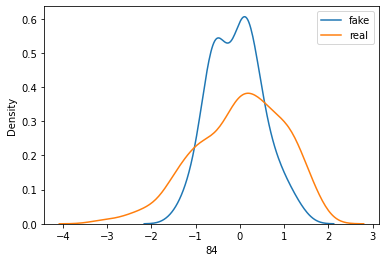

>Saved: drive/My Drive/GANs/20201027-191540_g_model_00030.h5, and drive/My Drive/GANs/20201027-191540_c_model_00030.h5


> iteration 62: #accepts 12805


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.943
60th percentile of preds: 0.467


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.716
       app_CNT_CHILDREN  ...           BAD
count      32000.000000  ...  32000.000000
mean           0.525534  ...      0.501969
std            0.593200  ...      0.500004
min           -1.770050  ...      0.000000
25%            0.110078  ...      0.000000
50%            0.540023  ...      1.000000
75%            0.962786  ...      1.000000
max            2.765528  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.912


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.664


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.953


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


>Saved: drive/My Drive/GANs/20201027-191845_g_model_00003.h5, and drive/My Drive/GANs/20201027-191845_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-191846_g_model_00006.h5, and drive/My Drive/GANs/20201027-191846_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-191846_g_model_00009.h5, and drive/My Drive/GANs/20201027-191846_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-191847_g_model_00012.h5, and drive/My Drive/GANs/20201027-191847_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-191848_g_model_00015.h5, and drive/My Drive/GANs/20201027-191848_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-191848_g_model_00018.h5, and drive/My Drive/GANs/20201027-191848_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-191849_g_model_00021.h5, and drive/My Drive/GANs/20201027-191849_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-191850_g_model_00024.h5, and drive/My Drive/GANs/20201027-191850_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-191850_g_mo

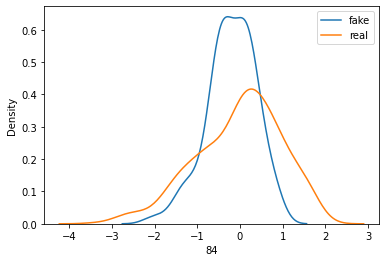

>Saved: drive/My Drive/GANs/20201027-191851_g_model_00030.h5, and drive/My Drive/GANs/20201027-191851_c_model_00030.h5


> iteration 63: #accepts 13005


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.944
60th percentile of preds: 0.473


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.734
       app_CNT_CHILDREN  ...           BAD
count      32500.000000  ...  32500.000000
mean           0.523338  ...      0.498400
std            0.586948  ...      0.500005
min           -1.817889  ...      0.000000
25%            0.109794  ...      0.000000
50%            0.533772  ...      0.000000
75%            0.953107  ...      1.000000
max            2.794029  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.912


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.682


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-192202_g_model_00003.h5, and drive/My Drive/GANs/20201027-192202_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-192203_g_model_00006.h5, and drive/My Drive/GANs/20201027-192203_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-192203_g_model_00009.h5, and drive/My Drive/GANs/20201027-192203_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-192204_g_model_00012.h5, and drive/My Drive/GANs/20201027-192204_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-192205_g_model_00015.h5, and drive/My Drive/GANs/20201027-192205_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-192205_g_model_00018.h5, and drive/My Drive/GANs/20201027-192205_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-192206_g_model_00021.h5, and drive/My Drive/GANs/20201027-192206_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-192206_g_model_00024.h5, and drive/My Drive/GANs/20201027-192206_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-192207_g_mo

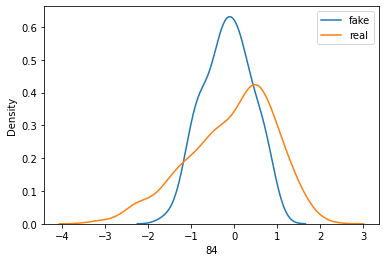

>Saved: drive/My Drive/GANs/20201027-192208_g_model_00030.h5, and drive/My Drive/GANs/20201027-192208_c_model_00030.h5


> iteration 64: #accepts 13205


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.945
60th percentile of preds: 0.474


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.743
       app_CNT_CHILDREN  ...           BAD
count      33000.000000  ...  33000.000000
mean           0.521881  ...      0.499364
std            0.585498  ...      0.500007
min           -1.810622  ...      0.000000
25%            0.111125  ...      0.000000
50%            0.539263  ...      0.000000
75%            0.952825  ...      1.000000
max            2.967429  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.916


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.699


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-192527_g_model_00003.h5, and drive/My Drive/GANs/20201027-192527_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-192528_g_model_00006.h5, and drive/My Drive/GANs/20201027-192528_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-192528_g_model_00009.h5, and drive/My Drive/GANs/20201027-192528_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-192529_g_model_00012.h5, and drive/My Drive/GANs/20201027-192529_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-192530_g_model_00015.h5, and drive/My Drive/GANs/20201027-192530_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-192530_g_model_00018.h5, and drive/My Drive/GANs/20201027-192530_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-192531_g_model_00021.h5, and drive/My Drive/GANs/20201027-192531_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-192531_g_model_00024.h5, and drive/My Drive/GANs/20201027-192531_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-192532_g_mo

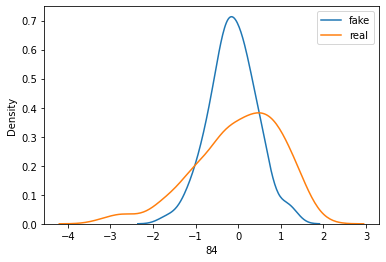

>Saved: drive/My Drive/GANs/20201027-192533_g_model_00030.h5, and drive/My Drive/GANs/20201027-192533_c_model_00030.h5


> iteration 65: #accepts 13405


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.945
60th percentile of preds: 0.471


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.732
       app_CNT_CHILDREN  ...           BAD
count      33500.000000  ...  33500.000000
mean           0.510684  ...      0.504776
std            0.587599  ...      0.499985
min           -1.831480  ...      0.000000
25%            0.095432  ...      0.000000
50%            0.529947  ...      1.000000
75%            0.943706  ...      1.000000
max            2.834641  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.92


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.679


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-192851_g_model_00003.h5, and drive/My Drive/GANs/20201027-192851_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-192852_g_model_00006.h5, and drive/My Drive/GANs/20201027-192852_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-192853_g_model_00009.h5, and drive/My Drive/GANs/20201027-192853_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-192853_g_model_00012.h5, and drive/My Drive/GANs/20201027-192853_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-192854_g_model_00015.h5, and drive/My Drive/GANs/20201027-192854_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-192854_g_model_00018.h5, and drive/My Drive/GANs/20201027-192854_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-192855_g_model_00021.h5, and drive/My Drive/GANs/20201027-192855_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-192856_g_model_00024.h5, and drive/My Drive/GANs/20201027-192856_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-192856_g_mo

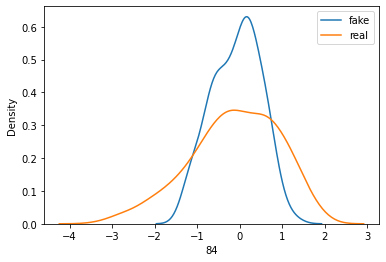

>Saved: drive/My Drive/GANs/20201027-192857_g_model_00030.h5, and drive/My Drive/GANs/20201027-192857_c_model_00030.h5


> iteration 66: #accepts 13605


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.947
60th percentile of preds: 0.47


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.734
       app_CNT_CHILDREN  ...           BAD
count      34000.000000  ...  34000.000000
mean           0.512164  ...      0.504324
std            0.586049  ...      0.499989
min           -1.969434  ...      0.000000
25%            0.102506  ...      0.000000
50%            0.524183  ...      1.000000
75%            0.940794  ...      1.000000
max            3.208521  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.913


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.67


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


>Saved: drive/My Drive/GANs/20201027-193219_g_model_00003.h5, and drive/My Drive/GANs/20201027-193219_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-193219_g_model_00006.h5, and drive/My Drive/GANs/20201027-193219_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-193220_g_model_00009.h5, and drive/My Drive/GANs/20201027-193220_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-193220_g_model_00012.h5, and drive/My Drive/GANs/20201027-193220_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-193221_g_model_00015.h5, and drive/My Drive/GANs/20201027-193221_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-193222_g_model_00018.h5, and drive/My Drive/GANs/20201027-193222_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-193222_g_model_00021.h5, and drive/My Drive/GANs/20201027-193222_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-193223_g_model_00024.h5, and drive/My Drive/GANs/20201027-193223_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-193224_g_mo

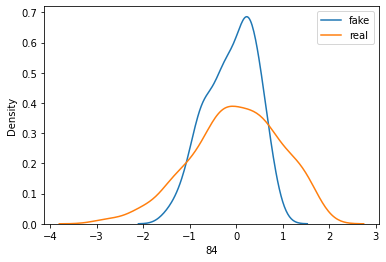

>Saved: drive/My Drive/GANs/20201027-193224_g_model_00030.h5, and drive/My Drive/GANs/20201027-193224_c_model_00030.h5


> iteration 67: #accepts 13805


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.948
60th percentile of preds: 0.476


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.749
       app_CNT_CHILDREN  ...           BAD
count      34500.000000  ...  34500.000000
mean           0.507060  ...      0.501014
std            0.583045  ...      0.500006
min           -1.868296  ...      0.000000
25%            0.101341  ...      0.000000
50%            0.524429  ...      1.000000
75%            0.936577  ...      1.000000
max            3.015073  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.916


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.699


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-193548_g_model_00003.h5, and drive/My Drive/GANs/20201027-193548_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-193549_g_model_00006.h5, and drive/My Drive/GANs/20201027-193549_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-193549_g_model_00009.h5, and drive/My Drive/GANs/20201027-193549_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-193550_g_model_00012.h5, and drive/My Drive/GANs/20201027-193550_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-193551_g_model_00015.h5, and drive/My Drive/GANs/20201027-193551_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-193551_g_model_00018.h5, and drive/My Drive/GANs/20201027-193551_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-193552_g_model_00021.h5, and drive/My Drive/GANs/20201027-193552_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-193552_g_model_00024.h5, and drive/My Drive/GANs/20201027-193552_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-193553_g_mo

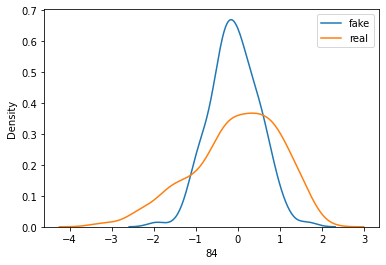

>Saved: drive/My Drive/GANs/20201027-193554_g_model_00030.h5, and drive/My Drive/GANs/20201027-193554_c_model_00030.h5


> iteration 68: #accepts 14005


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.948
60th percentile of preds: 0.485


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.775
       app_CNT_CHILDREN  ...           BAD
count      35000.000000  ...  35000.000000
mean           0.504069  ...      0.498171
std            0.577171  ...      0.500004
min           -2.106750  ...      0.000000
25%            0.099778  ...      0.000000
50%            0.516584  ...      0.000000
75%            0.929630  ...      1.000000
max            2.706527  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.914


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.737


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-193927_g_model_00003.h5, and drive/My Drive/GANs/20201027-193927_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-193927_g_model_00006.h5, and drive/My Drive/GANs/20201027-193927_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-193928_g_model_00009.h5, and drive/My Drive/GANs/20201027-193928_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-193929_g_model_00012.h5, and drive/My Drive/GANs/20201027-193929_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-193929_g_model_00015.h5, and drive/My Drive/GANs/20201027-193929_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-193930_g_model_00018.h5, and drive/My Drive/GANs/20201027-193930_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-193931_g_model_00021.h5, and drive/My Drive/GANs/20201027-193931_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-193932_g_model_00024.h5, and drive/My Drive/GANs/20201027-193932_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-193932_g_mo

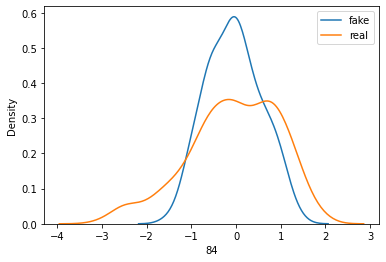

>Saved: drive/My Drive/GANs/20201027-193933_g_model_00030.h5, and drive/My Drive/GANs/20201027-193933_c_model_00030.h5


> iteration 69: #accepts 14205


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.949
60th percentile of preds: 0.469


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.735
       app_CNT_CHILDREN  ...           BAD
count      35500.000000  ...  35500.000000
mean           0.500740  ...      0.503070
std            0.575286  ...      0.499998
min           -1.959802  ...      0.000000
25%            0.098434  ...      0.000000
50%            0.520002  ...      1.000000
75%            0.926243  ...      1.000000
max            2.876912  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.916


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.678


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-194309_g_model_00003.h5, and drive/My Drive/GANs/20201027-194309_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-194310_g_model_00006.h5, and drive/My Drive/GANs/20201027-194310_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-194311_g_model_00009.h5, and drive/My Drive/GANs/20201027-194311_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-194311_g_model_00012.h5, and drive/My Drive/GANs/20201027-194311_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-194312_g_model_00015.h5, and drive/My Drive/GANs/20201027-194312_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-194313_g_model_00018.h5, and drive/My Drive/GANs/20201027-194313_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-194313_g_model_00021.h5, and drive/My Drive/GANs/20201027-194313_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-194315_g_model_00024.h5, and drive/My Drive/GANs/20201027-194315_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-194316_g_mo

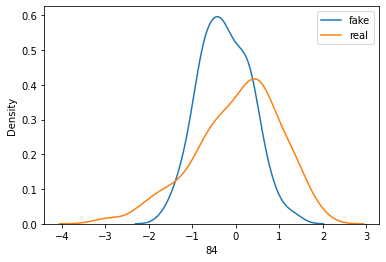

>Saved: drive/My Drive/GANs/20201027-194316_g_model_00030.h5, and drive/My Drive/GANs/20201027-194316_c_model_00030.h5


> iteration 70: #accepts 14405


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.948
60th percentile of preds: 0.478


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.748
       app_CNT_CHILDREN  ...           BAD
count      36000.000000  ...  36000.000000
mean           0.493797  ...      0.497000
std            0.578354  ...      0.499998
min           -1.868948  ...      0.000000
25%            0.083881  ...      0.000000
50%            0.513893  ...      0.000000
75%            0.920710  ...      1.000000
max            2.976263  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.915


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.704


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-194646_g_model_00003.h5, and drive/My Drive/GANs/20201027-194646_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-194647_g_model_00006.h5, and drive/My Drive/GANs/20201027-194647_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-194647_g_model_00009.h5, and drive/My Drive/GANs/20201027-194647_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-194648_g_model_00012.h5, and drive/My Drive/GANs/20201027-194648_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-194649_g_model_00015.h5, and drive/My Drive/GANs/20201027-194649_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-194649_g_model_00018.h5, and drive/My Drive/GANs/20201027-194649_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-194650_g_model_00021.h5, and drive/My Drive/GANs/20201027-194650_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-194650_g_model_00024.h5, and drive/My Drive/GANs/20201027-194650_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-194651_g_mo

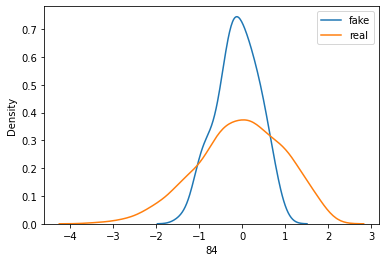

>Saved: drive/My Drive/GANs/20201027-194652_g_model_00030.h5, and drive/My Drive/GANs/20201027-194652_c_model_00030.h5


> iteration 71: #accepts 14605


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.949
60th percentile of preds: 0.48


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.761
       app_CNT_CHILDREN  ...           BAD
count      36500.000000  ...  36500.000000
mean           0.490069  ...      0.502932
std            0.572791  ...      0.499998
min           -1.900796  ...      0.000000
25%            0.091727  ...      0.000000
50%            0.510473  ...      1.000000
75%            0.909497  ...      1.000000
max            3.036781  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.916


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.715


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-195024_g_model_00003.h5, and drive/My Drive/GANs/20201027-195024_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-195024_g_model_00006.h5, and drive/My Drive/GANs/20201027-195024_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-195025_g_model_00009.h5, and drive/My Drive/GANs/20201027-195025_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-195025_g_model_00012.h5, and drive/My Drive/GANs/20201027-195025_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-195026_g_model_00015.h5, and drive/My Drive/GANs/20201027-195026_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-195027_g_model_00018.h5, and drive/My Drive/GANs/20201027-195027_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-195027_g_model_00021.h5, and drive/My Drive/GANs/20201027-195027_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-195028_g_model_00024.h5, and drive/My Drive/GANs/20201027-195028_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-195028_g_mo

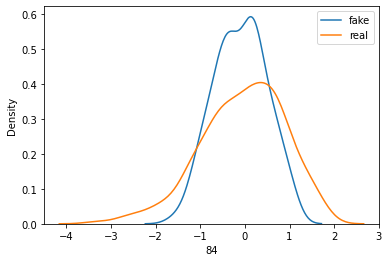

>Saved: drive/My Drive/GANs/20201027-195029_g_model_00030.h5, and drive/My Drive/GANs/20201027-195029_c_model_00030.h5


> iteration 72: #accepts 14805


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.949
60th percentile of preds: 0.487


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.777
       app_CNT_CHILDREN  ...           BAD
count      37000.000000  ...  37000.000000
mean           0.482249  ...      0.502297
std            0.570933  ...      0.500001
min           -1.853104  ...      0.000000
25%            0.077825  ...      0.000000
50%            0.497566  ...      1.000000
75%            0.909152  ...      1.000000
max            2.780489  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.915


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.73


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-195406_g_model_00003.h5, and drive/My Drive/GANs/20201027-195406_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-195406_g_model_00006.h5, and drive/My Drive/GANs/20201027-195406_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-195407_g_model_00009.h5, and drive/My Drive/GANs/20201027-195407_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-195407_g_model_00012.h5, and drive/My Drive/GANs/20201027-195407_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-195408_g_model_00015.h5, and drive/My Drive/GANs/20201027-195408_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-195409_g_model_00018.h5, and drive/My Drive/GANs/20201027-195409_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-195409_g_model_00021.h5, and drive/My Drive/GANs/20201027-195409_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-195410_g_model_00024.h5, and drive/My Drive/GANs/20201027-195410_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-195410_g_mo

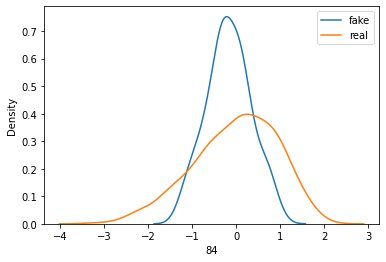

>Saved: drive/My Drive/GANs/20201027-195411_g_model_00030.h5, and drive/My Drive/GANs/20201027-195411_c_model_00030.h5


> iteration 73: #accepts 15005


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.949
60th percentile of preds: 0.485


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.776
       app_CNT_CHILDREN  ...           BAD
count      37500.000000  ...  37500.000000
mean           0.485850  ...      0.502053
std            0.572071  ...      0.500002
min           -2.109719  ...      0.000000
25%            0.082665  ...      0.000000
50%            0.502114  ...      1.000000
75%            0.907913  ...      1.000000
max            2.914412  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.919


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.722


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-195745_g_model_00003.h5, and drive/My Drive/GANs/20201027-195745_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-195746_g_model_00006.h5, and drive/My Drive/GANs/20201027-195746_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-195746_g_model_00009.h5, and drive/My Drive/GANs/20201027-195746_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-195747_g_model_00012.h5, and drive/My Drive/GANs/20201027-195747_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-195748_g_model_00015.h5, and drive/My Drive/GANs/20201027-195748_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-195748_g_model_00018.h5, and drive/My Drive/GANs/20201027-195748_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-195749_g_model_00021.h5, and drive/My Drive/GANs/20201027-195749_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-195749_g_model_00024.h5, and drive/My Drive/GANs/20201027-195749_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-195750_g_mo

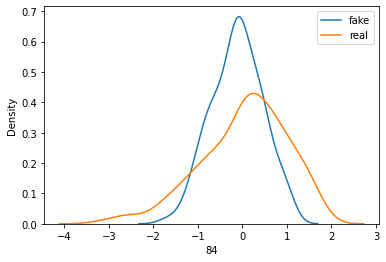

>Saved: drive/My Drive/GANs/20201027-195751_g_model_00030.h5, and drive/My Drive/GANs/20201027-195751_c_model_00030.h5


> iteration 74: #accepts 15205


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.949
60th percentile of preds: 0.482


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.772
       app_CNT_CHILDREN  ...           BAD
count      38000.000000  ...  38000.000000
mean           0.498643  ...      0.499447
std            0.562531  ...      0.500006
min           -1.830389  ...      0.000000
25%            0.104300  ...      0.000000
50%            0.517312  ...      0.000000
75%            0.911422  ...      1.000000
max            2.939308  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.915


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.722


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-200127_g_model_00003.h5, and drive/My Drive/GANs/20201027-200127_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-200128_g_model_00006.h5, and drive/My Drive/GANs/20201027-200128_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-200129_g_model_00009.h5, and drive/My Drive/GANs/20201027-200129_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-200129_g_model_00012.h5, and drive/My Drive/GANs/20201027-200129_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-200130_g_model_00015.h5, and drive/My Drive/GANs/20201027-200130_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-200130_g_model_00018.h5, and drive/My Drive/GANs/20201027-200130_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-200131_g_model_00021.h5, and drive/My Drive/GANs/20201027-200131_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-200131_g_model_00024.h5, and drive/My Drive/GANs/20201027-200131_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-200132_g_mo

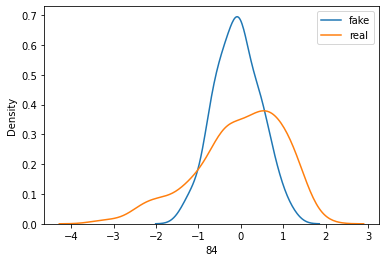

>Saved: drive/My Drive/GANs/20201027-200133_g_model_00030.h5, and drive/My Drive/GANs/20201027-200133_c_model_00030.h5


> iteration 75: #accepts 15405


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.948
60th percentile of preds: 0.479


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.766
       app_CNT_CHILDREN  ...           BAD
count      38500.000000  ...  38500.000000
mean           0.487414  ...      0.501532
std            0.558537  ...      0.500004
min           -1.830205  ...      0.000000
25%            0.094690  ...      0.000000
50%            0.504851  ...      1.000000
75%            0.896822  ...      1.000000
max            3.246397  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.913


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.72


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-200517_g_model_00003.h5, and drive/My Drive/GANs/20201027-200517_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-200517_g_model_00006.h5, and drive/My Drive/GANs/20201027-200517_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-200518_g_model_00009.h5, and drive/My Drive/GANs/20201027-200518_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-200519_g_model_00012.h5, and drive/My Drive/GANs/20201027-200519_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-200519_g_model_00015.h5, and drive/My Drive/GANs/20201027-200519_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-200520_g_model_00018.h5, and drive/My Drive/GANs/20201027-200520_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-200520_g_model_00021.h5, and drive/My Drive/GANs/20201027-200520_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-200521_g_model_00024.h5, and drive/My Drive/GANs/20201027-200521_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-200522_g_mo

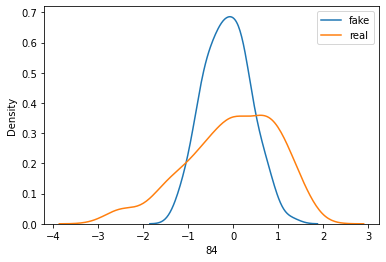

>Saved: drive/My Drive/GANs/20201027-200522_g_model_00030.h5, and drive/My Drive/GANs/20201027-200522_c_model_00030.h5


> iteration 76: #accepts 15605


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.949
60th percentile of preds: 0.484


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.779
       app_CNT_CHILDREN  ...           BAD
count      39000.000000  ...  39000.000000
mean           0.492529  ...      0.499154
std            0.552688  ...      0.500006
min           -1.698594  ...      0.000000
25%            0.098529  ...      0.000000
50%            0.510267  ...      0.000000
75%            0.901269  ...      1.000000
max            2.936977  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.913


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.738


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-200910_g_model_00003.h5, and drive/My Drive/GANs/20201027-200910_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-200911_g_model_00006.h5, and drive/My Drive/GANs/20201027-200911_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-200912_g_model_00009.h5, and drive/My Drive/GANs/20201027-200912_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-200912_g_model_00012.h5, and drive/My Drive/GANs/20201027-200912_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-200913_g_model_00015.h5, and drive/My Drive/GANs/20201027-200913_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-200914_g_model_00018.h5, and drive/My Drive/GANs/20201027-200914_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-200914_g_model_00021.h5, and drive/My Drive/GANs/20201027-200914_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-200915_g_model_00024.h5, and drive/My Drive/GANs/20201027-200915_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-200916_g_mo

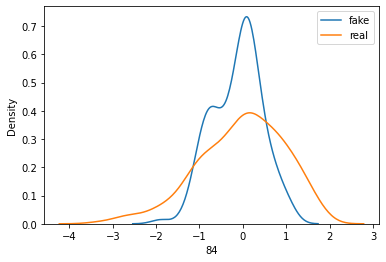

>Saved: drive/My Drive/GANs/20201027-200917_g_model_00030.h5, and drive/My Drive/GANs/20201027-200917_c_model_00030.h5


> iteration 77: #accepts 15805


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.949
60th percentile of preds: 0.469


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.748
       app_CNT_CHILDREN  ...           BAD
count      39500.000000  ...  39500.000000
mean           0.491770  ...      0.497722
std            0.553567  ...      0.500001
min           -1.757775  ...      0.000000
25%            0.099746  ...      0.000000
50%            0.509136  ...      0.000000
75%            0.902241  ...      1.000000
max            3.170171  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.914


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.695


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-201326_g_model_00003.h5, and drive/My Drive/GANs/20201027-201326_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-201327_g_model_00006.h5, and drive/My Drive/GANs/20201027-201327_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-201327_g_model_00009.h5, and drive/My Drive/GANs/20201027-201327_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-201328_g_model_00012.h5, and drive/My Drive/GANs/20201027-201328_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-201328_g_model_00015.h5, and drive/My Drive/GANs/20201027-201328_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-201329_g_model_00018.h5, and drive/My Drive/GANs/20201027-201329_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-201330_g_model_00021.h5, and drive/My Drive/GANs/20201027-201330_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-201330_g_model_00024.h5, and drive/My Drive/GANs/20201027-201330_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-201331_g_mo

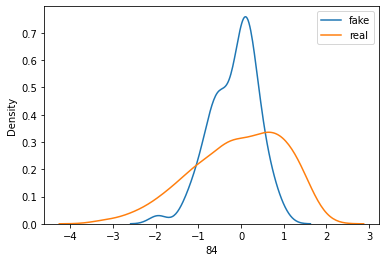

>Saved: drive/My Drive/GANs/20201027-201332_g_model_00030.h5, and drive/My Drive/GANs/20201027-201332_c_model_00030.h5


> iteration 78: #accepts 16005


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.949
60th percentile of preds: 0.464


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.726
       app_CNT_CHILDREN  ...           BAD
count      40000.000000  ...  40000.000000
mean           0.489998  ...      0.499650
std            0.553686  ...      0.500006
min           -1.742596  ...      0.000000
25%            0.098401  ...      0.000000
50%            0.505386  ...      0.000000
75%            0.899596  ...      1.000000
max            2.677026  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.913


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.68


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-201724_g_model_00003.h5, and drive/My Drive/GANs/20201027-201724_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-201725_g_model_00006.h5, and drive/My Drive/GANs/20201027-201725_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-201726_g_model_00009.h5, and drive/My Drive/GANs/20201027-201726_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-201726_g_model_00012.h5, and drive/My Drive/GANs/20201027-201726_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-201727_g_model_00015.h5, and drive/My Drive/GANs/20201027-201727_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-201727_g_model_00018.h5, and drive/My Drive/GANs/20201027-201727_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-201728_g_model_00021.h5, and drive/My Drive/GANs/20201027-201728_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-201729_g_model_00024.h5, and drive/My Drive/GANs/20201027-201729_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-201730_g_mo

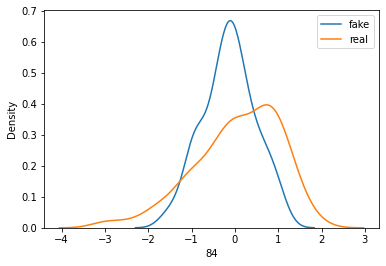

>Saved: drive/My Drive/GANs/20201027-201730_g_model_00030.h5, and drive/My Drive/GANs/20201027-201730_c_model_00030.h5


> iteration 79: #accepts 16205


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.949
60th percentile of preds: 0.466


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.724
       app_CNT_CHILDREN  ...           BAD
count      40500.000000  ...  40500.000000
mean           0.492814  ...      0.499432
std            0.553291  ...      0.500006
min           -1.746141  ...      0.000000
25%            0.099465  ...      0.000000
50%            0.509438  ...      0.000000
75%            0.902644  ...      1.000000
max            2.842844  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.914


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.671


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-202132_g_model_00003.h5, and drive/My Drive/GANs/20201027-202132_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-202133_g_model_00006.h5, and drive/My Drive/GANs/20201027-202133_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-202134_g_model_00009.h5, and drive/My Drive/GANs/20201027-202134_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-202134_g_model_00012.h5, and drive/My Drive/GANs/20201027-202134_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-202135_g_model_00015.h5, and drive/My Drive/GANs/20201027-202135_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-202136_g_model_00018.h5, and drive/My Drive/GANs/20201027-202136_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-202136_g_model_00021.h5, and drive/My Drive/GANs/20201027-202136_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-202137_g_model_00024.h5, and drive/My Drive/GANs/20201027-202137_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-202138_g_mo

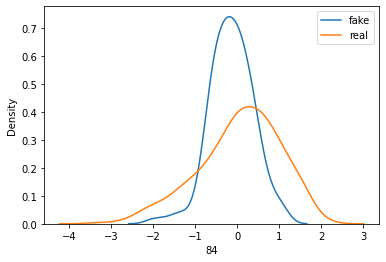

>Saved: drive/My Drive/GANs/20201027-202139_g_model_00030.h5, and drive/My Drive/GANs/20201027-202139_c_model_00030.h5


> iteration 80: #accepts 16405


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.95
60th percentile of preds: 0.484


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.776
       app_CNT_CHILDREN  ...           BAD
count      41000.000000  ...  41000.000000
mean           0.491380  ...      0.499317
std            0.550113  ...      0.500006
min           -1.733324  ...      0.000000
25%            0.103108  ...      0.000000
50%            0.509071  ...      0.000000
75%            0.892382  ...      1.000000
max            3.021967  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.914


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.733


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


>Saved: drive/My Drive/GANs/20201027-202541_g_model_00003.h5, and drive/My Drive/GANs/20201027-202541_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-202541_g_model_00006.h5, and drive/My Drive/GANs/20201027-202541_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-202542_g_model_00009.h5, and drive/My Drive/GANs/20201027-202542_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-202543_g_model_00012.h5, and drive/My Drive/GANs/20201027-202543_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-202543_g_model_00015.h5, and drive/My Drive/GANs/20201027-202543_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-202544_g_model_00018.h5, and drive/My Drive/GANs/20201027-202544_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-202545_g_model_00021.h5, and drive/My Drive/GANs/20201027-202545_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-202545_g_model_00024.h5, and drive/My Drive/GANs/20201027-202545_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-202546_g_mo

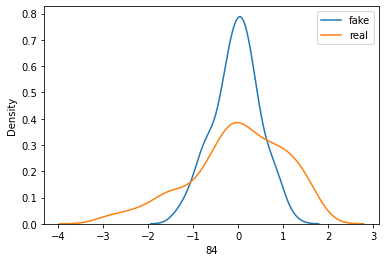

>Saved: drive/My Drive/GANs/20201027-202546_g_model_00030.h5, and drive/My Drive/GANs/20201027-202546_c_model_00030.h5


> iteration 81: #accepts 16605


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.95
60th percentile of preds: 0.471


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.742
       app_CNT_CHILDREN  ...           BAD
count      41500.000000  ...  41500.000000
mean           0.483779  ...      0.502386
std            0.546793  ...      0.500000
min           -1.981058  ...      0.000000
25%            0.097651  ...      0.000000
50%            0.500558  ...      1.000000
75%            0.886262  ...      1.000000
max            3.261286  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.914


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.701


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-202949_g_model_00003.h5, and drive/My Drive/GANs/20201027-202949_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-202950_g_model_00006.h5, and drive/My Drive/GANs/20201027-202950_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-202951_g_model_00009.h5, and drive/My Drive/GANs/20201027-202951_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-202951_g_model_00012.h5, and drive/My Drive/GANs/20201027-202951_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-202952_g_model_00015.h5, and drive/My Drive/GANs/20201027-202952_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-202952_g_model_00018.h5, and drive/My Drive/GANs/20201027-202952_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-202953_g_model_00021.h5, and drive/My Drive/GANs/20201027-202953_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-202953_g_model_00024.h5, and drive/My Drive/GANs/20201027-202953_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-202954_g_mo

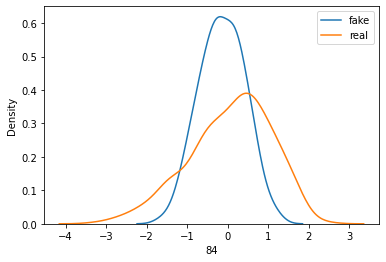

>Saved: drive/My Drive/GANs/20201027-202955_g_model_00030.h5, and drive/My Drive/GANs/20201027-202955_c_model_00030.h5


> iteration 82: #accepts 16805


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.951
60th percentile of preds: 0.477


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.76
       app_CNT_CHILDREN  ...           BAD
count      42000.000000  ...  42000.000000
mean           0.492984  ...      0.500905
std            0.546964  ...      0.500005
min           -1.774300  ...      0.000000
25%            0.108534  ...      0.000000
50%            0.507612  ...      1.000000
75%            0.896450  ...      1.000000
max            2.750776  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.915


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.715


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-203403_g_model_00003.h5, and drive/My Drive/GANs/20201027-203403_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-203404_g_model_00006.h5, and drive/My Drive/GANs/20201027-203404_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-203405_g_model_00009.h5, and drive/My Drive/GANs/20201027-203405_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-203405_g_model_00012.h5, and drive/My Drive/GANs/20201027-203405_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-203406_g_model_00015.h5, and drive/My Drive/GANs/20201027-203406_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-203407_g_model_00018.h5, and drive/My Drive/GANs/20201027-203407_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-203407_g_model_00021.h5, and drive/My Drive/GANs/20201027-203407_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-203408_g_model_00024.h5, and drive/My Drive/GANs/20201027-203408_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-203409_g_mo

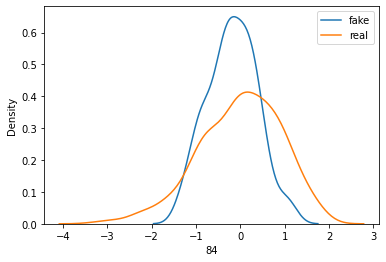

>Saved: drive/My Drive/GANs/20201027-203409_g_model_00030.h5, and drive/My Drive/GANs/20201027-203409_c_model_00030.h5


> iteration 83: #accepts 17005


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.95
60th percentile of preds: 0.489


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.794
       app_CNT_CHILDREN  ...           BAD
count      42500.000000  ...  42500.000000
mean           0.502875  ...      0.501224
std            0.542803  ...      0.500004
min           -1.959017  ...      0.000000
25%            0.118268  ...      0.000000
50%            0.520740  ...      1.000000
75%            0.902988  ...      1.000000
max            3.245342  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.913


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.746


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-203825_g_model_00003.h5, and drive/My Drive/GANs/20201027-203825_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-203826_g_model_00006.h5, and drive/My Drive/GANs/20201027-203826_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-203826_g_model_00009.h5, and drive/My Drive/GANs/20201027-203826_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-203827_g_model_00012.h5, and drive/My Drive/GANs/20201027-203827_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-203828_g_model_00015.h5, and drive/My Drive/GANs/20201027-203828_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-203829_g_model_00018.h5, and drive/My Drive/GANs/20201027-203829_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-203829_g_model_00021.h5, and drive/My Drive/GANs/20201027-203829_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-203830_g_model_00024.h5, and drive/My Drive/GANs/20201027-203830_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-203831_g_mo

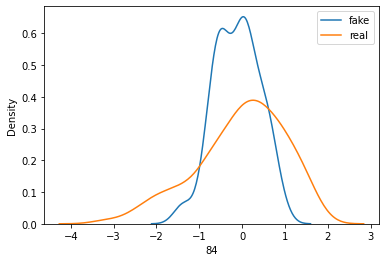

>Saved: drive/My Drive/GANs/20201027-203831_g_model_00030.h5, and drive/My Drive/GANs/20201027-203831_c_model_00030.h5


> iteration 84: #accepts 17205


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.951
60th percentile of preds: 0.469


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.736
       app_CNT_CHILDREN  ...           BAD
count      43000.000000  ...  43000.000000
mean           0.495078  ...      0.503558
std            0.538871  ...      0.499993
min           -1.742672  ...      0.000000
25%            0.114282  ...      0.000000
50%            0.511552  ...      1.000000
75%            0.892251  ...      1.000000
max            2.951360  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.911


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.691


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-204252_g_model_00003.h5, and drive/My Drive/GANs/20201027-204252_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-204252_g_model_00006.h5, and drive/My Drive/GANs/20201027-204252_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-204253_g_model_00009.h5, and drive/My Drive/GANs/20201027-204253_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-204253_g_model_00012.h5, and drive/My Drive/GANs/20201027-204253_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-204254_g_model_00015.h5, and drive/My Drive/GANs/20201027-204254_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-204255_g_model_00018.h5, and drive/My Drive/GANs/20201027-204255_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-204255_g_model_00021.h5, and drive/My Drive/GANs/20201027-204255_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-204256_g_model_00024.h5, and drive/My Drive/GANs/20201027-204256_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-204256_g_mo

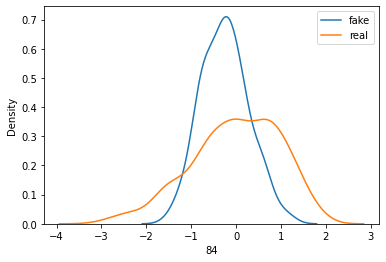

>Saved: drive/My Drive/GANs/20201027-204257_g_model_00030.h5, and drive/My Drive/GANs/20201027-204257_c_model_00030.h5


> iteration 85: #accepts 17405


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.951
60th percentile of preds: 0.486


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.789
       app_CNT_CHILDREN  ...           BAD
count      43500.000000  ...  43500.000000
mean           0.495729  ...      0.496667
std            0.539605  ...      0.499995
min           -1.697366  ...      0.000000
25%            0.114114  ...      0.000000
50%            0.511880  ...      0.000000
75%            0.892781  ...      1.000000
max            2.704988  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.916


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.74


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-204726_g_model_00003.h5, and drive/My Drive/GANs/20201027-204726_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-204727_g_model_00006.h5, and drive/My Drive/GANs/20201027-204727_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-204728_g_model_00009.h5, and drive/My Drive/GANs/20201027-204728_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-204728_g_model_00012.h5, and drive/My Drive/GANs/20201027-204728_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-204729_g_model_00015.h5, and drive/My Drive/GANs/20201027-204729_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-204730_g_model_00018.h5, and drive/My Drive/GANs/20201027-204730_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-204730_g_model_00021.h5, and drive/My Drive/GANs/20201027-204730_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-204731_g_model_00024.h5, and drive/My Drive/GANs/20201027-204731_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-204732_g_mo

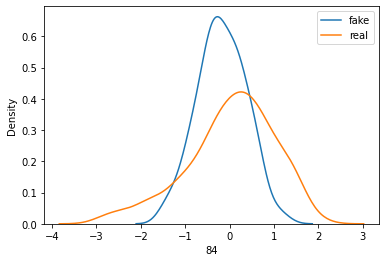

>Saved: drive/My Drive/GANs/20201027-204732_g_model_00030.h5, and drive/My Drive/GANs/20201027-204732_c_model_00030.h5


> iteration 86: #accepts 17605


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.951
60th percentile of preds: 0.495


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.806
       app_CNT_CHILDREN  ...           BAD
count      44000.000000  ...  44000.000000
mean           0.502621  ...      0.496750
std            0.538715  ...      0.499995
min           -1.652338  ...      0.000000
25%            0.118343  ...      0.000000
50%            0.520663  ...      0.000000
75%            0.904291  ...      1.000000
max            3.442998  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.914


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.763


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-205159_g_model_00003.h5, and drive/My Drive/GANs/20201027-205159_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-205200_g_model_00006.h5, and drive/My Drive/GANs/20201027-205200_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-205201_g_model_00009.h5, and drive/My Drive/GANs/20201027-205201_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-205201_g_model_00012.h5, and drive/My Drive/GANs/20201027-205201_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-205202_g_model_00015.h5, and drive/My Drive/GANs/20201027-205202_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-205203_g_model_00018.h5, and drive/My Drive/GANs/20201027-205203_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-205204_g_model_00021.h5, and drive/My Drive/GANs/20201027-205204_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-205204_g_model_00024.h5, and drive/My Drive/GANs/20201027-205204_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-205205_g_mo

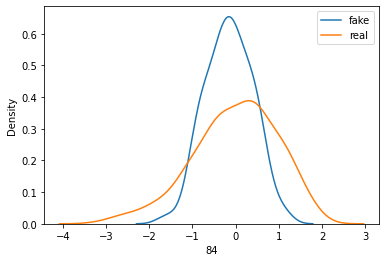

>Saved: drive/My Drive/GANs/20201027-205205_g_model_00030.h5, and drive/My Drive/GANs/20201027-205205_c_model_00030.h5


> iteration 87: #accepts 17805


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.952
60th percentile of preds: 0.483


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.773
       app_CNT_CHILDREN  ...           BAD
count      44500.000000  ...  44500.000000
mean           0.495979  ...      0.501034
std            0.536944  ...      0.500005
min           -1.762615  ...      0.000000
25%            0.112383  ...      0.000000
50%            0.514241  ...      1.000000
75%            0.892580  ...      1.000000
max            2.732625  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.915


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.737


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-205638_g_model_00003.h5, and drive/My Drive/GANs/20201027-205638_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-205639_g_model_00006.h5, and drive/My Drive/GANs/20201027-205639_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-205640_g_model_00009.h5, and drive/My Drive/GANs/20201027-205640_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-205640_g_model_00012.h5, and drive/My Drive/GANs/20201027-205640_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-205641_g_model_00015.h5, and drive/My Drive/GANs/20201027-205641_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-205642_g_model_00018.h5, and drive/My Drive/GANs/20201027-205642_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-205643_g_model_00021.h5, and drive/My Drive/GANs/20201027-205643_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-205643_g_model_00024.h5, and drive/My Drive/GANs/20201027-205643_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-205644_g_mo

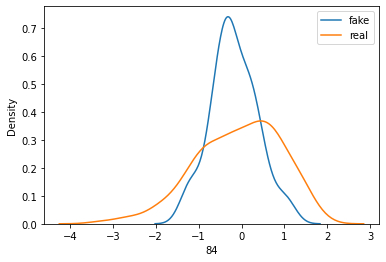

>Saved: drive/My Drive/GANs/20201027-205645_g_model_00030.h5, and drive/My Drive/GANs/20201027-205645_c_model_00030.h5


> iteration 88: #accepts 18005


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.952
60th percentile of preds: 0.483


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.782
       app_CNT_CHILDREN  ...           BAD
count      45000.000000  ...  45000.000000
mean           0.497247  ...      0.504111
std            0.532530  ...      0.499989
min           -1.742733  ...      0.000000
25%            0.117072  ...      0.000000
50%            0.518280  ...      1.000000
75%            0.892095  ...      1.000000
max            2.822481  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.912


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.742


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


>Saved: drive/My Drive/GANs/20201027-210120_g_model_00003.h5, and drive/My Drive/GANs/20201027-210120_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-210120_g_model_00006.h5, and drive/My Drive/GANs/20201027-210120_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-210121_g_model_00009.h5, and drive/My Drive/GANs/20201027-210121_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-210122_g_model_00012.h5, and drive/My Drive/GANs/20201027-210122_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-210122_g_model_00015.h5, and drive/My Drive/GANs/20201027-210122_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-210123_g_model_00018.h5, and drive/My Drive/GANs/20201027-210123_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-210124_g_model_00021.h5, and drive/My Drive/GANs/20201027-210124_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-210125_g_model_00024.h5, and drive/My Drive/GANs/20201027-210125_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-210125_g_mo

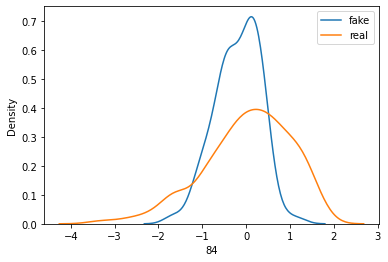

>Saved: drive/My Drive/GANs/20201027-210126_g_model_00030.h5, and drive/My Drive/GANs/20201027-210126_c_model_00030.h5


> iteration 89: #accepts 18205


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.952
60th percentile of preds: 0.486


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.785
       app_CNT_CHILDREN  ...           BAD
count      45500.000000  ...  45500.000000
mean           0.491404  ...      0.498725
std            0.533526  ...      0.500004
min           -1.691424  ...      0.000000
25%            0.111182  ...      0.000000
50%            0.508290  ...      0.000000
75%            0.884721  ...      1.000000
max            3.017484  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.91


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.746


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-210605_g_model_00003.h5, and drive/My Drive/GANs/20201027-210605_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-210606_g_model_00006.h5, and drive/My Drive/GANs/20201027-210606_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-210607_g_model_00009.h5, and drive/My Drive/GANs/20201027-210607_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-210607_g_model_00012.h5, and drive/My Drive/GANs/20201027-210607_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-210608_g_model_00015.h5, and drive/My Drive/GANs/20201027-210608_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-210608_g_model_00018.h5, and drive/My Drive/GANs/20201027-210608_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-210609_g_model_00021.h5, and drive/My Drive/GANs/20201027-210609_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-210610_g_model_00024.h5, and drive/My Drive/GANs/20201027-210610_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-210611_g_mo

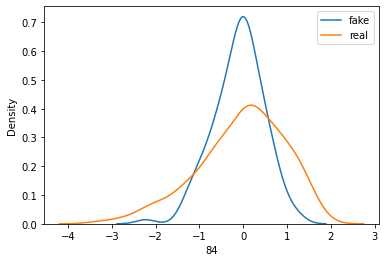

>Saved: drive/My Drive/GANs/20201027-210612_g_model_00030.h5, and drive/My Drive/GANs/20201027-210612_c_model_00030.h5


> iteration 90: #accepts 18405


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.952
60th percentile of preds: 0.472


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.747
       app_CNT_CHILDREN  ...           BAD
count      46000.000000  ...  46000.000000
mean           0.498425  ...      0.498587
std            0.527166  ...      0.500003
min           -1.700427  ...      0.000000
25%            0.127300  ...      0.000000
50%            0.519020  ...      0.000000
75%            0.888731  ...      1.000000
max            2.861811  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.91


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.704


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-211053_g_model_00003.h5, and drive/My Drive/GANs/20201027-211053_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-211054_g_model_00006.h5, and drive/My Drive/GANs/20201027-211054_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-211054_g_model_00009.h5, and drive/My Drive/GANs/20201027-211054_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-211055_g_model_00012.h5, and drive/My Drive/GANs/20201027-211055_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-211055_g_model_00015.h5, and drive/My Drive/GANs/20201027-211055_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-211056_g_model_00018.h5, and drive/My Drive/GANs/20201027-211056_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-211057_g_model_00021.h5, and drive/My Drive/GANs/20201027-211057_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-211057_g_model_00024.h5, and drive/My Drive/GANs/20201027-211057_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-211058_g_mo

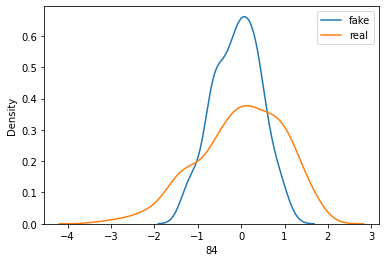

>Saved: drive/My Drive/GANs/20201027-211059_g_model_00030.h5, and drive/My Drive/GANs/20201027-211059_c_model_00030.h5


> iteration 91: #accepts 18605


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.952
60th percentile of preds: 0.468


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.754
       app_CNT_CHILDREN  ...           BAD
count      46500.000000  ...  46500.000000
mean           0.497062  ...      0.496903
std            0.526572  ...      0.499996
min           -1.656715  ...      0.000000
25%            0.124984  ...      0.000000
50%            0.512551  ...      0.000000
75%            0.884398  ...      1.000000
max            3.157457  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.913


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.702


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-211539_g_model_00003.h5, and drive/My Drive/GANs/20201027-211539_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-211540_g_model_00006.h5, and drive/My Drive/GANs/20201027-211540_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-211541_g_model_00009.h5, and drive/My Drive/GANs/20201027-211541_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-211541_g_model_00012.h5, and drive/My Drive/GANs/20201027-211541_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-211542_g_model_00015.h5, and drive/My Drive/GANs/20201027-211542_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-211542_g_model_00018.h5, and drive/My Drive/GANs/20201027-211542_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-211543_g_model_00021.h5, and drive/My Drive/GANs/20201027-211543_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-211544_g_model_00024.h5, and drive/My Drive/GANs/20201027-211544_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-211544_g_mo

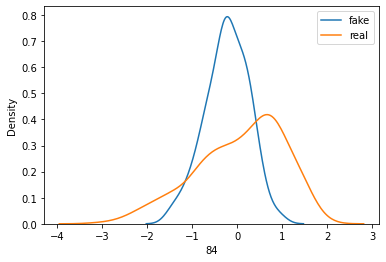

>Saved: drive/My Drive/GANs/20201027-211545_g_model_00030.h5, and drive/My Drive/GANs/20201027-211545_c_model_00030.h5


> iteration 92: #accepts 18805


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.952
60th percentile of preds: 0.466


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.738
       app_CNT_CHILDREN  ...           BAD
count      47000.000000  ...  47000.000000
mean           0.493824  ...      0.500191
std            0.530845  ...      0.500005
min           -1.770809  ...      0.000000
25%            0.115326  ...      0.000000
50%            0.515230  ...      1.000000
75%            0.887537  ...      1.000000
max            2.546351  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.915


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.687


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-212027_g_model_00003.h5, and drive/My Drive/GANs/20201027-212027_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-212028_g_model_00006.h5, and drive/My Drive/GANs/20201027-212028_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-212028_g_model_00009.h5, and drive/My Drive/GANs/20201027-212028_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-212029_g_model_00012.h5, and drive/My Drive/GANs/20201027-212029_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-212030_g_model_00015.h5, and drive/My Drive/GANs/20201027-212030_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-212030_g_model_00018.h5, and drive/My Drive/GANs/20201027-212030_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-212031_g_model_00021.h5, and drive/My Drive/GANs/20201027-212031_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-212032_g_model_00024.h5, and drive/My Drive/GANs/20201027-212032_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-212032_g_mo

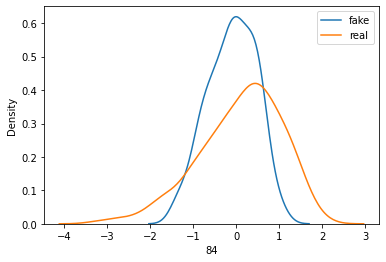

>Saved: drive/My Drive/GANs/20201027-212033_g_model_00030.h5, and drive/My Drive/GANs/20201027-212033_c_model_00030.h5


> iteration 93: #accepts 19005


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.952
60th percentile of preds: 0.457


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.708
       app_CNT_CHILDREN  ...           BAD
count      47500.000000  ...  47500.000000
mean           0.494327  ...      0.500589
std            0.525793  ...      0.500005
min           -1.720603  ...      0.000000
25%            0.121480  ...      0.000000
50%            0.513509  ...      1.000000
75%            0.882958  ...      1.000000
max            2.658472  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.914


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.662


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-212519_g_model_00003.h5, and drive/My Drive/GANs/20201027-212519_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-212520_g_model_00006.h5, and drive/My Drive/GANs/20201027-212520_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-212520_g_model_00009.h5, and drive/My Drive/GANs/20201027-212520_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-212521_g_model_00012.h5, and drive/My Drive/GANs/20201027-212521_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-212522_g_model_00015.h5, and drive/My Drive/GANs/20201027-212522_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-212522_g_model_00018.h5, and drive/My Drive/GANs/20201027-212522_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-212523_g_model_00021.h5, and drive/My Drive/GANs/20201027-212523_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-212523_g_model_00024.h5, and drive/My Drive/GANs/20201027-212523_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-212524_g_mo

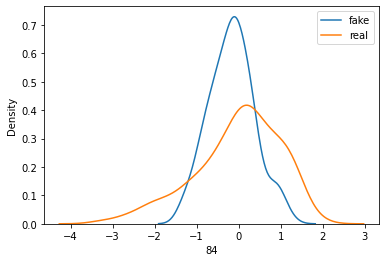

>Saved: drive/My Drive/GANs/20201027-212525_g_model_00030.h5, and drive/My Drive/GANs/20201027-212525_c_model_00030.h5


> iteration 94: #accepts 19205


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.952
60th percentile of preds: 0.459


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.692
       app_CNT_CHILDREN  ...           BAD
count      48000.000000  ...  48000.000000
mean           0.499152  ...      0.499063
std            0.525703  ...      0.500004
min           -1.664177  ...      0.000000
25%            0.127865  ...      0.000000
50%            0.518893  ...      0.000000
75%            0.885242  ...      1.000000
max            2.648479  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.911


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.65


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-213008_g_model_00003.h5, and drive/My Drive/GANs/20201027-213008_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-213009_g_model_00006.h5, and drive/My Drive/GANs/20201027-213009_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-213009_g_model_00009.h5, and drive/My Drive/GANs/20201027-213009_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-213010_g_model_00012.h5, and drive/My Drive/GANs/20201027-213010_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-213011_g_model_00015.h5, and drive/My Drive/GANs/20201027-213011_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-213011_g_model_00018.h5, and drive/My Drive/GANs/20201027-213011_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-213012_g_model_00021.h5, and drive/My Drive/GANs/20201027-213012_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-213013_g_model_00024.h5, and drive/My Drive/GANs/20201027-213013_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-213013_g_mo

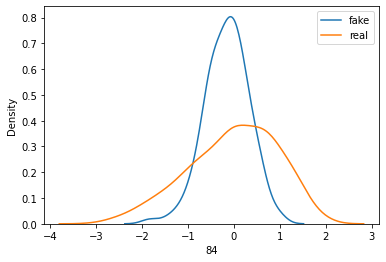

>Saved: drive/My Drive/GANs/20201027-213014_g_model_00030.h5, and drive/My Drive/GANs/20201027-213014_c_model_00030.h5


> iteration 95: #accepts 19405


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.952
60th percentile of preds: 0.478


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.742
       app_CNT_CHILDREN  ...           BAD
count      48500.000000  ...  48500.000000
mean           0.493038  ...      0.494742
std            0.520870  ...      0.499978
min           -1.904725  ...      0.000000
25%            0.122213  ...      0.000000
50%            0.511250  ...      0.000000
75%            0.879192  ...      1.000000
max            2.468746  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.913


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.704


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-213504_g_model_00003.h5, and drive/My Drive/GANs/20201027-213504_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-213504_g_model_00006.h5, and drive/My Drive/GANs/20201027-213504_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-213505_g_model_00009.h5, and drive/My Drive/GANs/20201027-213505_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-213506_g_model_00012.h5, and drive/My Drive/GANs/20201027-213506_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-213506_g_model_00015.h5, and drive/My Drive/GANs/20201027-213506_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-213507_g_model_00018.h5, and drive/My Drive/GANs/20201027-213507_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-213508_g_model_00021.h5, and drive/My Drive/GANs/20201027-213508_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-213508_g_model_00024.h5, and drive/My Drive/GANs/20201027-213508_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-213509_g_mo

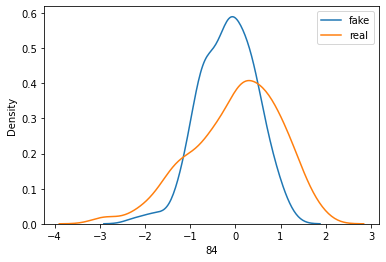

>Saved: drive/My Drive/GANs/20201027-213510_g_model_00030.h5, and drive/My Drive/GANs/20201027-213510_c_model_00030.h5


> iteration 96: #accepts 19605


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.952
60th percentile of preds: 0.374


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.533
       app_CNT_CHILDREN  ...           BAD
count      49000.000000  ...  49000.000000
mean           0.484336  ...      0.498020
std            0.521462  ...      0.500001
min           -1.802707  ...      0.000000
25%            0.116436  ...      0.000000
50%            0.501804  ...      0.000000
75%            0.870393  ...      1.000000
max            2.655318  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.911


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.508


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-213958_g_model_00003.h5, and drive/My Drive/GANs/20201027-213958_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-213959_g_model_00006.h5, and drive/My Drive/GANs/20201027-213959_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-214000_g_model_00009.h5, and drive/My Drive/GANs/20201027-214000_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-214000_g_model_00012.h5, and drive/My Drive/GANs/20201027-214000_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-214001_g_model_00015.h5, and drive/My Drive/GANs/20201027-214001_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-214001_g_model_00018.h5, and drive/My Drive/GANs/20201027-214001_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-214002_g_model_00021.h5, and drive/My Drive/GANs/20201027-214002_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-214003_g_model_00024.h5, and drive/My Drive/GANs/20201027-214003_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-214003_g_mo

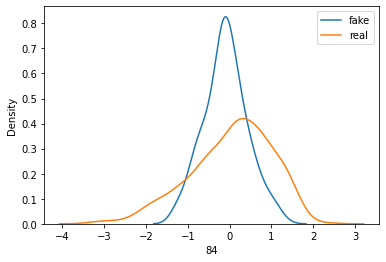

>Saved: drive/My Drive/GANs/20201027-214004_g_model_00030.h5, and drive/My Drive/GANs/20201027-214004_c_model_00030.h5


> iteration 97: #accepts 19805


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.952
60th percentile of preds: 0.392


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.546
       app_CNT_CHILDREN  ...           BAD
count      49500.000000  ...  49500.000000
mean           0.487001  ...      0.497030
std            0.522250  ...      0.499996
min           -1.628832  ...      0.000000
25%            0.113903  ...      0.000000
50%            0.505711  ...      0.000000
75%            0.873582  ...      1.000000
max            2.830419  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.914


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.525


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-214459_g_model_00003.h5, and drive/My Drive/GANs/20201027-214459_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-214500_g_model_00006.h5, and drive/My Drive/GANs/20201027-214500_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-214500_g_model_00009.h5, and drive/My Drive/GANs/20201027-214500_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-214501_g_model_00012.h5, and drive/My Drive/GANs/20201027-214501_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-214502_g_model_00015.h5, and drive/My Drive/GANs/20201027-214502_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-214502_g_model_00018.h5, and drive/My Drive/GANs/20201027-214502_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-214503_g_model_00021.h5, and drive/My Drive/GANs/20201027-214503_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-214503_g_model_00024.h5, and drive/My Drive/GANs/20201027-214503_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-214504_g_mo

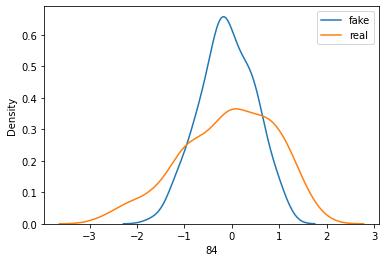

>Saved: drive/My Drive/GANs/20201027-214505_g_model_00030.h5, and drive/My Drive/GANs/20201027-214505_c_model_00030.h5


> iteration 98: #accepts 20005


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.952
60th percentile of preds: 0.415


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.592
       app_CNT_CHILDREN  ...           BAD
count      50000.000000  ...  50000.000000
mean           0.480659  ...      0.500680
std            0.516348  ...      0.500005
min           -1.736425  ...      0.000000
25%            0.111631  ...      0.000000
50%            0.497274  ...      1.000000
75%            0.862503  ...      1.000000
max            2.831086  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.912


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.557


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-215008_g_model_00003.h5, and drive/My Drive/GANs/20201027-215008_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-215009_g_model_00006.h5, and drive/My Drive/GANs/20201027-215009_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-215009_g_model_00009.h5, and drive/My Drive/GANs/20201027-215009_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-215010_g_model_00012.h5, and drive/My Drive/GANs/20201027-215010_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-215011_g_model_00015.h5, and drive/My Drive/GANs/20201027-215011_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-215011_g_model_00018.h5, and drive/My Drive/GANs/20201027-215011_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-215012_g_model_00021.h5, and drive/My Drive/GANs/20201027-215012_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-215013_g_model_00024.h5, and drive/My Drive/GANs/20201027-215013_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-215014_g_mo

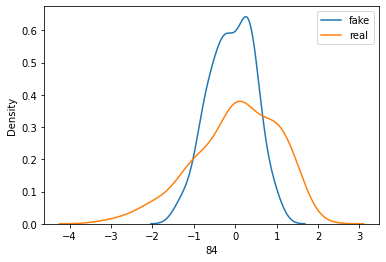

>Saved: drive/My Drive/GANs/20201027-215014_g_model_00030.h5, and drive/My Drive/GANs/20201027-215014_c_model_00030.h5


> iteration 99: #accepts 20205


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.952
60th percentile of preds: 0.439


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.657
       app_CNT_CHILDREN  ...           BAD
count      50500.000000  ...  50500.000000
mean           0.486556  ...      0.498911
std            0.517384  ...      0.500004
min           -1.896657  ...      0.000000
25%            0.122010  ...      0.000000
50%            0.506054  ...      0.000000
75%            0.869652  ...      1.000000
max            2.841747  ...      1.000000

[8 rows x 92 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.919


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.605


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954
(200, 91) (200,)
n_epochs=10, n_batch=128, 1/2=64, b/e=3, steps=30


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:200: TqdmDeprecationWarn

>Saved: drive/My Drive/GANs/20201027-215520_g_model_00003.h5, and drive/My Drive/GANs/20201027-215520_c_model_00003.h5
>Saved: drive/My Drive/GANs/20201027-215520_g_model_00006.h5, and drive/My Drive/GANs/20201027-215520_c_model_00006.h5
>Saved: drive/My Drive/GANs/20201027-215521_g_model_00009.h5, and drive/My Drive/GANs/20201027-215521_c_model_00009.h5
>Saved: drive/My Drive/GANs/20201027-215522_g_model_00012.h5, and drive/My Drive/GANs/20201027-215522_c_model_00012.h5
>Saved: drive/My Drive/GANs/20201027-215522_g_model_00015.h5, and drive/My Drive/GANs/20201027-215522_c_model_00015.h5
>Saved: drive/My Drive/GANs/20201027-215523_g_model_00018.h5, and drive/My Drive/GANs/20201027-215523_c_model_00018.h5
>Saved: drive/My Drive/GANs/20201027-215523_g_model_00021.h5, and drive/My Drive/GANs/20201027-215523_c_model_00021.h5
>Saved: drive/My Drive/GANs/20201027-215524_g_model_00024.h5, and drive/My Drive/GANs/20201027-215524_c_model_00024.h5
>Saved: drive/My Drive/GANs/20201027-215525_g_mo

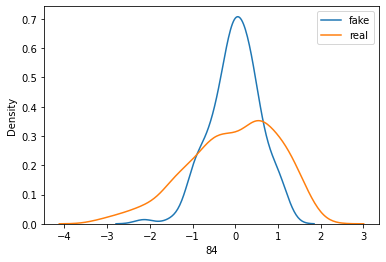

>Saved: drive/My Drive/GANs/20201027-215525_g_model_00030.h5, and drive/My Drive/GANs/20201027-215525_c_model_00030.h5



In [177]:
D_all_0, c_model, g_model, benchmark, method_1, method_2, method_3, method_all, oracle = acceptance_loop(clf="LR", train=df, test=S, target_col=target_col, reject_col=reject_col, feat_idx=best_feat_idx,
                                                                                                 n_0=n_0, n=n, h=h, alpha=alpha, j_max=j_max, folder=folder, 
                                                                                                 conditional=True, noise_dim=noise_dim,learning_rate=learning_rate/5, 
                                                                                                 dropout=dropout, max_epochs=epochs, batch_size=batch_size)

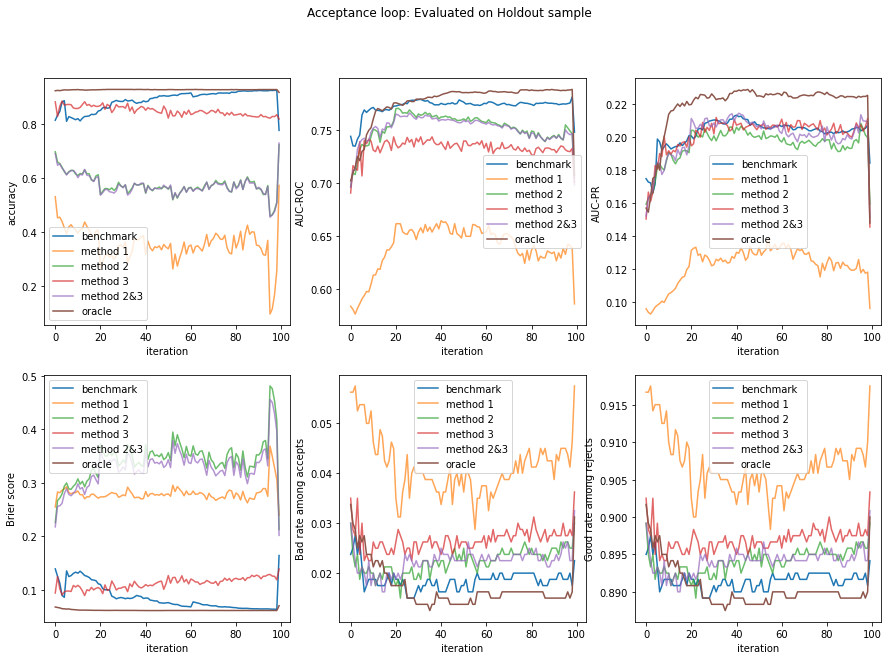

In [181]:
fig, ax = plt.subplots(2,3, figsize=(15,10))
fig.suptitle("Acceptance loop: Evaluated on Holdout sample")

ax[0,0].plot(benchmark.index, benchmark.iloc[:,0], label="benchmark")
ax[0,0].plot(method_1.index, method_1.iloc[:,0], label = "method 1", alpha=0.7)
ax[0,0].plot(method_2.index, method_2.iloc[:,0], label = "method 2", alpha=0.7)
ax[0,0].plot(method_3.index, method_3.iloc[:,0], label = "method 3", alpha=0.7)
ax[0,0].plot(method_all.index, method_all.iloc[:,0], label = "method 2&3", alpha=0.7)
ax[0,0].plot(oracle.index, oracle.iloc[:,0], label="oracle")
ax[0,0].legend()
ax[0,0].set(xlabel="iteration", ylabel="accuracy")

ax[0,1].plot(benchmark.index, benchmark.iloc[:,1], label="benchmark")
ax[0,1].plot(method_1.index, method_1.iloc[:,1], label = "method 1", alpha=0.7)
ax[0,1].plot(method_2.index, method_2.iloc[:,1], label = "method 2", alpha=0.7)
ax[0,1].plot(method_3.index, method_3.iloc[:,1], label = "method 3", alpha=0.7)
ax[0,1].plot(method_all.index, method_all.iloc[:,1], label = "method 2&3", alpha=0.7)
ax[0,1].plot(oracle.index, oracle.iloc[:,1], label="oracle")
ax[0,1].legend()
ax[0,1].set(xlabel="iteration", ylabel="AUC-ROC")

ax[0,2].plot(benchmark.index, benchmark.iloc[:,2], label="benchmark")
ax[0,2].plot(method_1.index, method_1.iloc[:,2], label = "method 1", alpha=0.7)
ax[0,2].plot(method_2.index, method_2.iloc[:,2], label = "method 2", alpha=0.7)
ax[0,2].plot(method_3.index, method_3.iloc[:,2], label = "method 3", alpha=0.7)
ax[0,2].plot(method_all.index, method_all.iloc[:,2], label = "method 2&3", alpha=0.7)
ax[0,2].plot(oracle.index, oracle.iloc[:,2], label="oracle")
ax[0,2].legend()
ax[0,2].set(xlabel="iteration", ylabel="AUC-PR")

ax[1,0].plot(benchmark.index, benchmark.iloc[:,3], label="benchmark")
ax[1,0].plot(method_1.index, method_1.iloc[:,3], label = "method 1", alpha=0.7)
ax[1,0].plot(method_2.index, method_2.iloc[:,3], label = "method 2", alpha=0.7)
ax[1,0].plot(method_3.index, method_3.iloc[:,3], label = "method 3", alpha=0.7)
ax[1,0].plot(method_all.index, method_all.iloc[:,3], label = "method 2&3", alpha=0.7)
ax[1,0].plot(oracle.index, oracle.iloc[:,3], label="oracle")
ax[1,0].legend()
ax[1,0].set(xlabel="iteration", ylabel="Brier score")

ax[1,1].plot(benchmark.index, benchmark.iloc[:,4], label="benchmark")
ax[1,1].plot(method_1.index, method_1.iloc[:,4], label = "method 1", alpha=0.7)
ax[1,1].plot(method_2.index, method_2.iloc[:,4], label = "method 2", alpha=0.7)
ax[1,1].plot(method_3.index, method_3.iloc[:,4], label = "method 3", alpha=0.7)
ax[1,1].plot(method_all.index, method_all.iloc[:,4], label = "method 2&3", alpha=0.7)
ax[1,1].plot(oracle.index, oracle.iloc[:,4], label="oracle")
ax[1,1].legend()
ax[1,1].set(xlabel="iteration", ylabel="Bad rate among accepts")

ax[1,2].plot(benchmark.index, benchmark.iloc[:,5], label="benchmark")
ax[1,2].plot(method_1.index, method_1.iloc[:,5], label = "method 1", alpha=0.7)
ax[1,2].plot(method_2.index, method_2.iloc[:,5], label = "method 2", alpha=0.7)
ax[1,2].plot(method_3.index, method_3.iloc[:,5], label = "method 3", alpha=0.7)
ax[1,2].plot(method_all.index, method_all.iloc[:,5], label = "method 2&3", alpha=0.7)
ax[1,2].plot(oracle.index, oracle.iloc[:,5], label="oracle")
ax[1,2].legend()
ax[1,2].set(xlabel="iteration", ylabel="Good rate among rejects")

fig.savefig(folder + timestamp + "acceptance_loop_results_cond_LR.png")

plt.show()

In [150]:
home_method1_gaps = make_gaps(method_1, benchmark)
home_method2_gaps = make_gaps(method_2, benchmark)
home_method3_gaps = make_gaps(method_3, benchmark)
home_method4_gaps = make_gaps(method_all, benchmark)

print(home_method1_gaps)
print(home_method2_gaps)
print(home_method3_gaps)
print(home_method4_gaps)

      accuracy   AUC_ROC    AUC_PR        BS       ABR       RGR
max  -0.203398 -0.110441 -0.066116  0.304383  0.037453  0.025000
min  -0.827086 -0.174714 -0.100338  0.075617  0.009988  0.006667
mean -0.531594 -0.132629 -0.080154  0.194412  0.022747  0.015183
      accuracy   AUC_ROC    AUC_PR        BS       ABR     RGR
max  -0.053473 -0.002542  0.004975  0.416679  0.007491  0.0050
min  -0.464768 -0.047369 -0.024751  0.048517 -0.007491 -0.0050
mean -0.312674 -0.020259 -0.007419  0.256043  0.003745  0.0025
      accuracy   AUC_ROC    AUC_PR        BS       ABR       RGR
max   0.067966 -0.006235  0.011004  0.064679  0.013733  0.009167
min  -0.102949 -0.057320 -0.038580 -0.045095 -0.002497 -0.001667
mean -0.038856 -0.038848 -0.001436  0.026608  0.008065  0.005383
      accuracy   AUC_ROC    AUC_PR        BS       ABR       RGR
max  -0.046977 -0.007216  0.010596  0.391454  0.009988  0.006667
min  -0.468766 -0.049699 -0.032770  0.037593 -0.006242 -0.004167
mean -0.314758 -0.021094 -0.00244

#### UK data


> iteration 1: #accepts 220
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_10 (InputLayer)        [(None, 51)]              0         
_________________________________________________________________
dense_30 (Dense)             (None, 100)               5200      
_________________________________________________________________
batch_normalization_24 (Batc (None, 100)               400       
_________________________________________________________________
leaky_re_lu_12 (LeakyReLU)   (None, 100)               0         
_________________________________________________________________
dropout_12 (Dropout)         (None, 100)               0         
_________________________________________________________________
dense_31 (Dense)             (None, 100)               10100     
_________________________________________________________________
batch_normalization_25 (

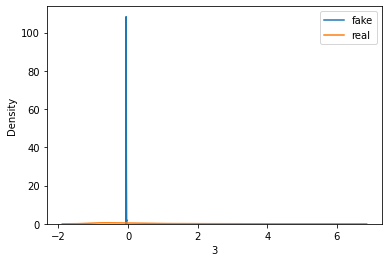

>Saved: drive/My Drive/Thesis/20201031-112349_g_model_00030.h5, and drive/My Drive/Thesis/20201031-112349_c_model_00030.h5


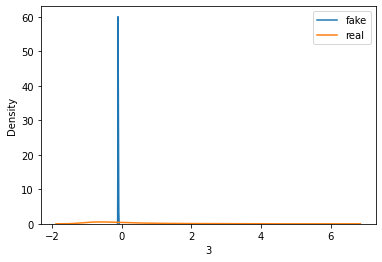

>Saved: drive/My Drive/Thesis/20201031-112352_g_model_00060.h5, and drive/My Drive/Thesis/20201031-112352_c_model_00060.h5


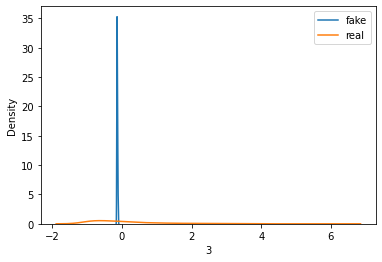

>Saved: drive/My Drive/Thesis/20201031-112355_g_model_00090.h5, and drive/My Drive/Thesis/20201031-112355_c_model_00090.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.995
60th percentile of preds: 0.717


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.988
              Age      Amount      Curadd  ...  Purpose_X8  Purpose_X9         BAD
count  500.000000  500.000000  500.000000  ...  500.000000  500.000000  500.000000
mean    -0.109470   -0.051091   -0.184321  ...   -0.241970   -0.169754    0.482000
std      0.006651    0.017074    0.016368  ...    0.012050    0.022792    0.500176
min     -0.127884   -0.119536   -0.256337  ...   -0.293259   -0.262373    0.000000
25%     -0.113158   -0.061822   -0.191384  ...   -0.249211   -0.182652    0.000000
50%     -0.109584   -0.049460   -0.181790  ...   -0.240327   -0.168126    0.000000
75%     -0.106406   -0.037823   -0.174381  ...   -0.233317   -0.155934    1.000000
max     -0.070430   -0.016175   -0.144985  ...   -0.210734   -0.103994    1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.946


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the cavea

60th percentile of preds: 0.988
iter 1: 
tao: 0.027292116272317472
accepts: 110 with 0.00909090909090909% bad

> iteration 2: #accepts 330
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_13 (InputLayer)        [(None, 51)]              0         
_________________________________________________________________
dense_40 (Dense)             (None, 100)               5200      
_________________________________________________________________
batch_normalization_32 (Batc (None, 100)               400       
_________________________________________________________________
leaky_re_lu_16 (LeakyReLU)   (None, 100)               0         
_________________________________________________________________
dropout_16 (Dropout)         (None, 100)               0         
_________________________________________________________________
dense_41 (Dense)             (None, 100)      

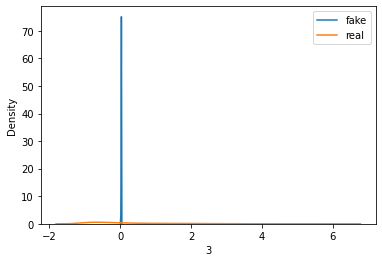

>Saved: drive/My Drive/Thesis/20201031-112408_g_model_00060.h5, and drive/My Drive/Thesis/20201031-112408_c_model_00060.h5


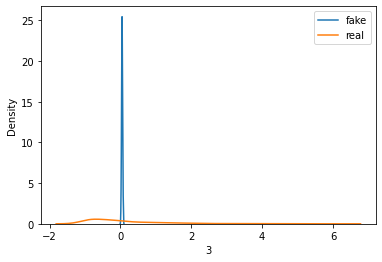

>Saved: drive/My Drive/Thesis/20201031-112413_g_model_00120.h5, and drive/My Drive/Thesis/20201031-112413_c_model_00120.h5


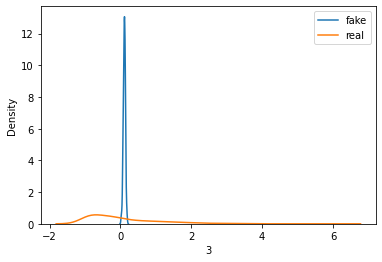

>Saved: drive/My Drive/Thesis/20201031-112418_g_model_00180.h5, and drive/My Drive/Thesis/20201031-112418_c_model_00180.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.989
60th percentile of preds: 0.629


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.952
              Age      Amount      Curadd  ...  Purpose_X8  Purpose_X9         BAD
count  775.000000  775.000000  775.000000  ...  775.000000  775.000000  775.000000
mean    -0.327853   -0.049553    0.139131  ...    0.264485   -0.418772    0.504516
std      0.044244    0.045466    0.083435  ...    0.045536    0.039312    0.500302
min     -0.505690   -0.202088   -0.064207  ...    0.080871   -0.490148    0.000000
25%     -0.353528   -0.079558    0.072201  ...    0.237327   -0.444844    0.000000
50%     -0.318951   -0.051438    0.133587  ...    0.275532   -0.427345    1.000000
75%     -0.296834   -0.017121    0.200200  ...    0.300066   -0.400309    1.000000
max     -0.176889    0.063118    0.459518  ...    0.344610   -0.221384    1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.976


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.929


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the cavea

60th percentile of preds: 0.98
iter 2: 
tao: 0.0529511656709587
accepts: 110 with 0.01818181818181818% bad

> iteration 3: #accepts 440
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_16 (InputLayer)        [(None, 51)]              0         
_________________________________________________________________
dense_50 (Dense)             (None, 100)               5200      
_________________________________________________________________
batch_normalization_40 (Batc (None, 100)               400       
_________________________________________________________________
leaky_re_lu_20 (LeakyReLU)   (None, 100)               0         
_________________________________________________________________
dropout_20 (Dropout)         (None, 100)               0         
_________________________________________________________________
dense_51 (Dense)             (None, 100)         

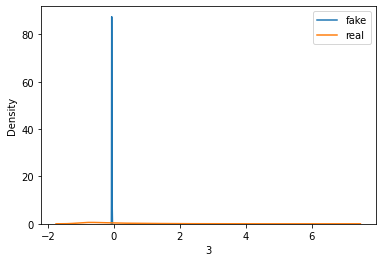

>Saved: drive/My Drive/Thesis/20201031-112433_g_model_00080.h5, and drive/My Drive/Thesis/20201031-112433_c_model_00080.h5


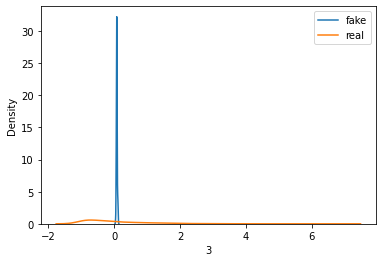

>Saved: drive/My Drive/Thesis/20201031-112440_g_model_00160.h5, and drive/My Drive/Thesis/20201031-112440_c_model_00160.h5


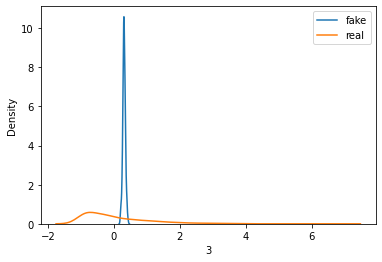

>Saved: drive/My Drive/Thesis/20201031-112447_g_model_00240.h5, and drive/My Drive/Thesis/20201031-112447_c_model_00240.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.992
60th percentile of preds: 0.687


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.976
               Age       Amount  ...   Purpose_X9          BAD
count  1050.000000  1050.000000  ...  1050.000000  1050.000000
mean      0.212894     0.524873  ...     0.579074     0.497143
std       0.062818     0.054922  ...     0.028641     0.500230
min       0.044893     0.084070  ...     0.438010     0.000000
25%       0.168389     0.501970  ...     0.563978     0.000000
50%       0.199828     0.533794  ...     0.577239     0.000000
75%       0.249963     0.558729  ...     0.593585     1.000000
max       0.513709     0.693091  ...     0.718786     1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.986


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.949


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.98
iter 3: 
tao: 0.04743750744346237
accepts: 110 with 0.00909090909090909% bad

> iteration 4: #accepts 550


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_19 (InputLayer)        [(None, 51)]              0         
_________________________________________________________________
dense_60 (Dense)             (None, 100)               5200      
_________________________________________________________________
batch_normalization_48 (Batc (None, 100)               400       
_________________________________________________________________
leaky_re_lu_24 (LeakyReLU)   (None, 100)               0         
_________________________________________________________________
dropout_24 (Dropout)         (None, 100)               0         
_________________________________________________________________
dense_61 (Dense)             (None, 100)               10100     
_________________________________________________________________
batch_normalization_49 (Batc (None, 100)             

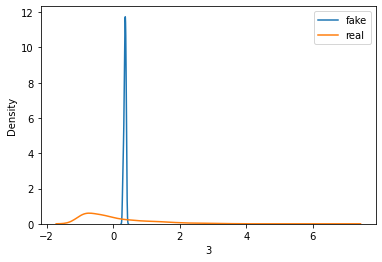

>Saved: drive/My Drive/Thesis/20201031-112504_g_model_00100.h5, and drive/My Drive/Thesis/20201031-112504_c_model_00100.h5


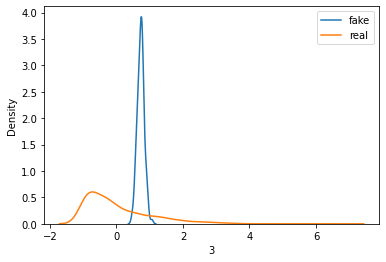

>Saved: drive/My Drive/Thesis/20201031-112512_g_model_00200.h5, and drive/My Drive/Thesis/20201031-112512_c_model_00200.h5


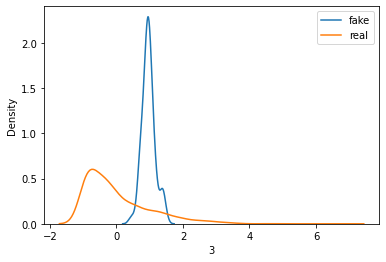

>Saved: drive/My Drive/Thesis/20201031-112521_g_model_00300.h5, and drive/My Drive/Thesis/20201031-112521_c_model_00300.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.993
60th percentile of preds: 0.93


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.996
               Age       Amount  ...   Purpose_X9          BAD
count  1325.000000  1325.000000  ...  1325.000000  1325.000000
mean     -0.294957    -0.125652  ...    -0.540362     0.487547
std       0.193003     0.150288  ...     0.211249     0.500034
min      -0.760855    -0.722380  ...    -1.359859     0.000000
25%      -0.440817    -0.217904  ...    -0.660117     0.000000
50%      -0.303515    -0.116525  ...    -0.506209     0.000000
75%      -0.152202    -0.028171  ...    -0.391658     1.000000
max       0.223654     0.316755  ...    -0.133621     1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.99


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.993


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.982
iter 4: 
tao: 0.03907437606018514
accepts: 110 with 0.01818181818181818% bad

> iteration 5: #accepts 660


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_22 (InputLayer)        [(None, 51)]              0         
_________________________________________________________________
dense_70 (Dense)             (None, 100)               5200      
_________________________________________________________________
batch_normalization_56 (Batc (None, 100)               400       
_________________________________________________________________
leaky_re_lu_28 (LeakyReLU)   (None, 100)               0         
_________________________________________________________________
dropout_28 (Dropout)         (None, 100)               0         
_________________________________________________________________
dense_71 (Dense)             (None, 100)               10100     
_________________________________________________________________
batch_normalization_57 (Batc (None, 100)             

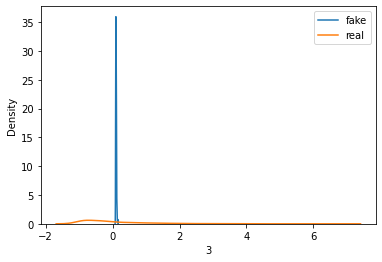

>Saved: drive/My Drive/Thesis/20201031-112540_g_model_00120.h5, and drive/My Drive/Thesis/20201031-112540_c_model_00120.h5


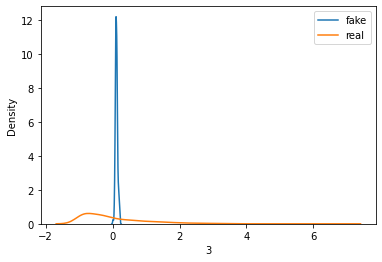

>Saved: drive/My Drive/Thesis/20201031-112550_g_model_00240.h5, and drive/My Drive/Thesis/20201031-112550_c_model_00240.h5


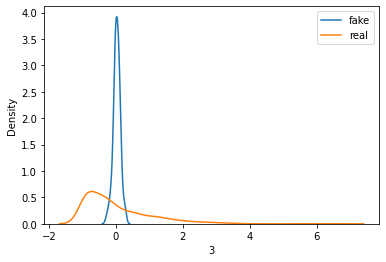

>Saved: drive/My Drive/Thesis/20201031-112601_g_model_00360.h5, and drive/My Drive/Thesis/20201031-112601_c_model_00360.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.992
60th percentile of preds: 0.336


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.713
               Age       Amount  ...   Purpose_X9          BAD
count  1600.000000  1600.000000  ...  1600.000000  1600.000000
mean      1.031905     0.862833  ...     0.676852     0.473750
std       0.167869     0.118488  ...     0.164202     0.499467
min       0.270876     0.142354  ...     0.128385     0.000000
25%       0.924165     0.805196  ...     0.582998     0.000000
50%       1.066946     0.880843  ...     0.668716     0.000000
75%       1.156241     0.948000  ...     0.761731     1.000000
max       1.458950     1.102017  ...     1.368233     1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.985


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.652


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the cavea

60th percentile of preds: 0.982
iter 5: 
tao: 0.03888382920552248
accepts: 110 with 0.02727272727272727% bad

> iteration 6: #accepts 770
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_25 (InputLayer)        [(None, 51)]              0         
_________________________________________________________________
dense_80 (Dense)             (None, 100)               5200      
_________________________________________________________________
batch_normalization_64 (Batc (None, 100)               400       
_________________________________________________________________
leaky_re_lu_32 (LeakyReLU)   (None, 100)               0         
_________________________________________________________________
dropout_32 (Dropout)         (None, 100)               0         
_________________________________________________________________
dense_81 (Dense)             (None, 100)       

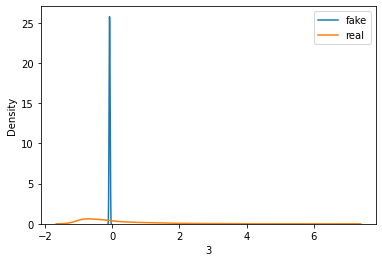

>Saved: drive/My Drive/Thesis/20201031-112623_g_model_00140.h5, and drive/My Drive/Thesis/20201031-112623_c_model_00140.h5


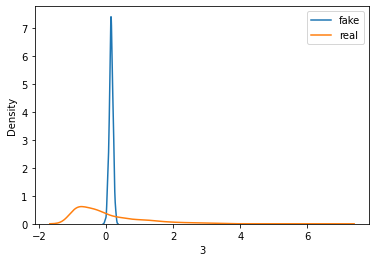

>Saved: drive/My Drive/Thesis/20201031-112635_g_model_00280.h5, and drive/My Drive/Thesis/20201031-112635_c_model_00280.h5


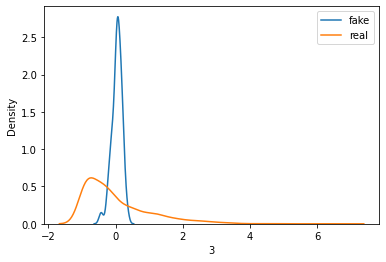

>Saved: drive/My Drive/Thesis/20201031-112647_g_model_00420.h5, and drive/My Drive/Thesis/20201031-112647_c_model_00420.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.991
60th percentile of preds: 0.972


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.996
               Age       Amount  ...   Purpose_X9          BAD
count  1875.000000  1875.000000  ...  1875.000000  1875.000000
mean     -0.155289    -0.270008  ...    -0.324475     0.506133
std       0.285555     0.161492  ...     0.227054     0.500096
min      -1.324197    -0.646831  ...    -1.158350     0.000000
25%      -0.367870    -0.371850  ...    -0.495635     0.000000
50%      -0.147372    -0.277204  ...    -0.337226     1.000000
75%       0.054535    -0.173592  ...    -0.177370     1.000000
max       0.686397     0.508876  ...     0.428982     1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.983


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.992


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.981


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 6: 
tao: 0.0326310018975955
accepts: 110 with 0.00909090909090909% bad

> iteration 7: #accepts 880
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_28 (InputLayer)        [(None, 51)]              0         
_________________________________________________________________
dense_90 (Dense)             (None, 100)               5200      
_________________________________________________________________
batch_normalization_72 (Batc (None, 100)               400       
_________________________________________________________________
leaky_re_lu_36 (LeakyReLU)   (None, 100)               0         
_________________________________________________________________
dropout_36 (Dropout)         (None, 100)               0         
_________________________________________________________________
dense_91 (Dense)             (None, 100)               10100     
______________

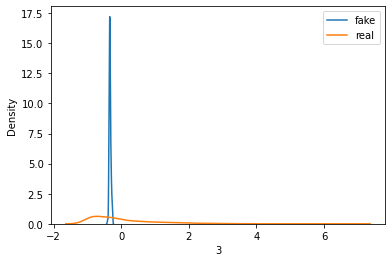

>Saved: drive/My Drive/Thesis/20201031-112711_g_model_00160.h5, and drive/My Drive/Thesis/20201031-112711_c_model_00160.h5


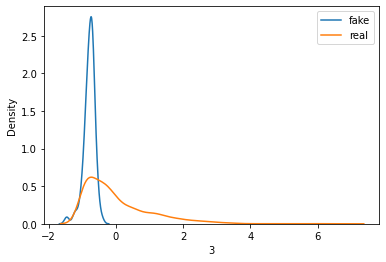

>Saved: drive/My Drive/Thesis/20201031-112724_g_model_00320.h5, and drive/My Drive/Thesis/20201031-112724_c_model_00320.h5


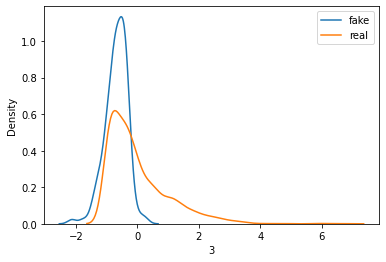

>Saved: drive/My Drive/Thesis/20201031-112738_g_model_00480.h5, and drive/My Drive/Thesis/20201031-112738_c_model_00480.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.992
60th percentile of preds: 0.323


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.714
               Age       Amount  ...   Purpose_X9          BAD
count  2150.000000  2150.000000  ...  2150.000000  2150.000000
mean      1.003263     0.895237  ...     0.697967     0.487907
std       0.235319     0.295352  ...     0.220303     0.499970
min       0.148534    -0.444462  ...    -0.220347     0.000000
25%       0.883731     0.767160  ...     0.589423     0.000000
50%       1.045018     0.966413  ...     0.723003     0.000000
75%       1.152840     1.070537  ...     0.830783     1.000000
max       2.199944     1.706845  ...     1.451034     1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.97


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.614


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.98


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 7: 
tao: 0.02766889357085777
accepts: 110 with 0.0% bad

> iteration 8: #accepts 990
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_31 (InputLayer)        [(None, 51)]              0         
_________________________________________________________________
dense_100 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_80 (Batc (None, 100)               400       
_________________________________________________________________
leaky_re_lu_40 (LeakyReLU)   (None, 100)               0         
_________________________________________________________________
dropout_40 (Dropout)         (None, 100)               0         
_________________________________________________________________
dense_101 (Dense)            (None, 100)               10100     
_____________________________

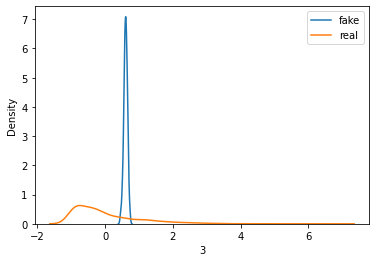

>Saved: drive/My Drive/Thesis/20201031-112805_g_model_00180.h5, and drive/My Drive/Thesis/20201031-112805_c_model_00180.h5


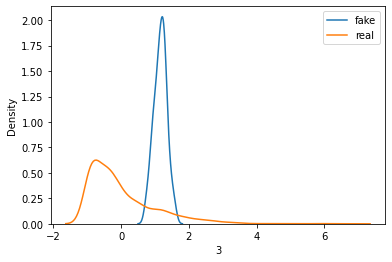

>Saved: drive/My Drive/Thesis/20201031-112820_g_model_00360.h5, and drive/My Drive/Thesis/20201031-112820_c_model_00360.h5


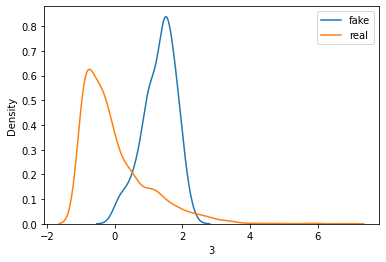

>Saved: drive/My Drive/Thesis/20201031-112835_g_model_00540.h5, and drive/My Drive/Thesis/20201031-112835_c_model_00540.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.993
60th percentile of preds: 0.179


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.531
               Age       Amount  ...   Purpose_X9          BAD
count  2425.000000  2425.000000  ...  2425.000000  2425.000000
mean      0.357948     1.095523  ...    -0.389224     0.482474
std       0.208441     0.282203  ...     0.427092     0.499796
min      -0.709653    -0.410252  ...    -1.713202     0.000000
25%       0.246377     0.916196  ...    -0.656249     0.000000
50%       0.355439     1.073398  ...    -0.388695     0.000000
75%       0.481666     1.292273  ...    -0.137300     1.000000
max       1.638135     2.096924  ...     1.446190     1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.98


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.423


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.981


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 8: 
tao: 0.023022061791387313
accepts: 110 with 0.0% bad

> iteration 9: #accepts 1100
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_34 (InputLayer)        [(None, 51)]              0         
_________________________________________________________________
dense_110 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_88 (Batc (None, 100)               400       
_________________________________________________________________
leaky_re_lu_44 (LeakyReLU)   (None, 100)               0         
_________________________________________________________________
dropout_44 (Dropout)         (None, 100)               0         
_________________________________________________________________
dense_111 (Dense)            (None, 100)               10100     
___________________________

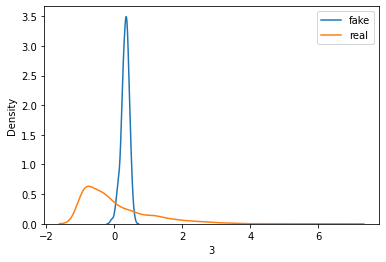

>Saved: drive/My Drive/Thesis/20201031-112905_g_model_00210.h5, and drive/My Drive/Thesis/20201031-112905_c_model_00210.h5


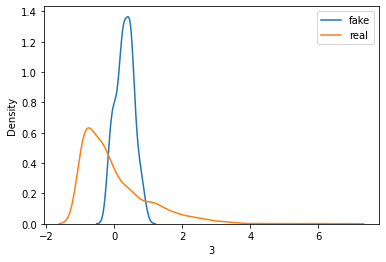

>Saved: drive/My Drive/Thesis/20201031-112922_g_model_00420.h5, and drive/My Drive/Thesis/20201031-112922_c_model_00420.h5


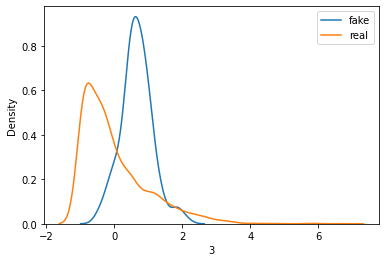

>Saved: drive/My Drive/Thesis/20201031-112940_g_model_00630.h5, and drive/My Drive/Thesis/20201031-112940_c_model_00630.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.993
60th percentile of preds: 0.157


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.621
               Age       Amount  ...   Purpose_X9          BAD
count  2700.000000  2700.000000  ...  2700.000000  2700.000000
mean      0.630491     1.038077  ...     0.099326     0.510741
std       0.375141     0.394038  ...     0.531517     0.499977
min      -0.216496    -0.058249  ...    -1.035185     0.000000
25%       0.376427     0.752014  ...    -0.267488     0.000000
50%       0.564127     0.988525  ...    -0.000220     1.000000
75%       0.830041     1.299325  ...     0.367276     1.000000
max       2.478489     2.704500  ...     3.152691     1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.981


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.983


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 9: 
tao: 0.021208257458559386
accepts: 110 with 0.045454545454545456% bad

> iteration 10: #accepts 1210
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_37 (InputLayer)        [(None, 51)]              0         
_________________________________________________________________
dense_120 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_96 (Batc (None, 100)               400       
_________________________________________________________________
leaky_re_lu_48 (LeakyReLU)   (None, 100)               0         
_________________________________________________________________
dropout_48 (Dropout)         (None, 100)               0         
_________________________________________________________________
dense_121 (Dense)            (None, 100)               10100     
_________

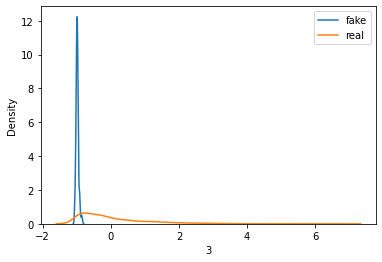

>Saved: drive/My Drive/Thesis/20201031-113012_g_model_00230.h5, and drive/My Drive/Thesis/20201031-113012_c_model_00230.h5


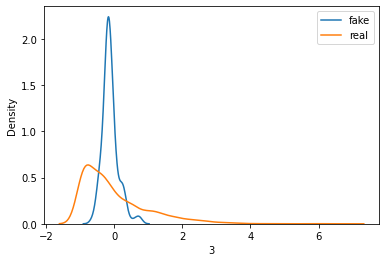

>Saved: drive/My Drive/Thesis/20201031-113032_g_model_00460.h5, and drive/My Drive/Thesis/20201031-113032_c_model_00460.h5


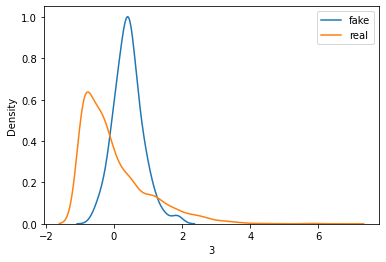

>Saved: drive/My Drive/Thesis/20201031-113052_g_model_00690.h5, and drive/My Drive/Thesis/20201031-113052_c_model_00690.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.994
60th percentile of preds: 0.177


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.532
               Age       Amount  ...   Purpose_X9          BAD
count  2975.000000  2975.000000  ...  2975.000000  2975.000000
mean     -0.322215    -1.561775  ...     0.077460     0.487395
std       0.490144     0.501247  ...     0.476608     0.499925
min      -2.336174    -3.089088  ...    -1.828005     0.000000
25%      -0.641224    -1.905527  ...    -0.210256     0.000000
50%      -0.334337    -1.649753  ...     0.073577     0.000000
75%       0.002398    -1.298847  ...     0.367410     1.000000
max       1.545731     0.870170  ...     1.905965     1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.963
60th percentile of preds: 0.457


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.98


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 10: 
tao: 0.018164546263107845
accepts: 110 with 0.00909090909090909% bad

> iteration 11: #accepts 1320
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_40 (InputLayer)        [(None, 51)]              0         
_________________________________________________________________
dense_130 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_104 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_52 (LeakyReLU)   (None, 100)               0         
_________________________________________________________________
dropout_52 (Dropout)         (None, 100)               0         
_________________________________________________________________
dense_131 (Dense)            (None, 100)               10100     
_________

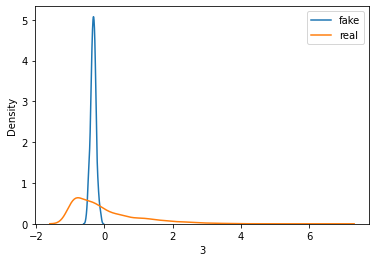

>Saved: drive/My Drive/Thesis/20201031-113127_g_model_00250.h5, and drive/My Drive/Thesis/20201031-113127_c_model_00250.h5


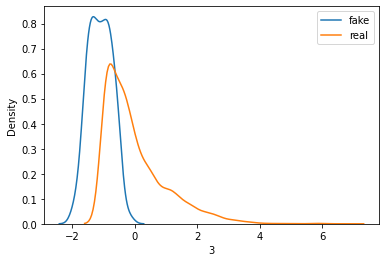

>Saved: drive/My Drive/Thesis/20201031-113148_g_model_00500.h5, and drive/My Drive/Thesis/20201031-113148_c_model_00500.h5


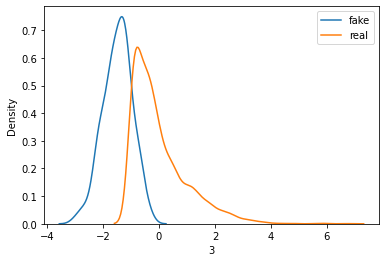

>Saved: drive/My Drive/Thesis/20201031-113209_g_model_00750.h5, and drive/My Drive/Thesis/20201031-113209_c_model_00750.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.994
60th percentile of preds: 0.988


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.998
               Age       Amount  ...   Purpose_X9          BAD
count  3250.000000  3250.000000  ...  3250.000000  3250.000000
mean     -1.150206     0.029563  ...    -0.134757     0.494462
std       0.482641     0.541930  ...     0.491120     0.500046
min      -3.520786    -3.344997  ...    -2.875613     0.000000
25%      -1.430956    -0.306229  ...    -0.379925     0.000000
50%      -1.147679     0.019123  ...    -0.078876     0.000000
75%      -0.838907     0.356459  ...     0.192918     1.000000
max       0.417787     2.032532  ...     1.364051     1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.971


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.987


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.982


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 11: 
tao: 0.01669967838502914
accepts: 110 with 0.02727272727272727% bad

> iteration 12: #accepts 1430
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_43 (InputLayer)        [(None, 51)]              0         
_________________________________________________________________
dense_140 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_112 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_56 (LeakyReLU)   (None, 100)               0         
_________________________________________________________________
dropout_56 (Dropout)         (None, 100)               0         
_________________________________________________________________
dense_141 (Dense)            (None, 100)               10100     
__________

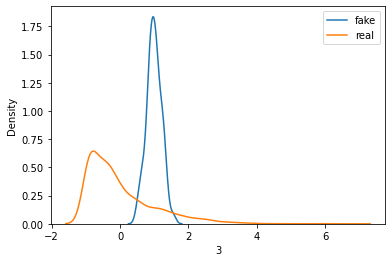

>Saved: drive/My Drive/Thesis/20201031-113246_g_model_00270.h5, and drive/My Drive/Thesis/20201031-113246_c_model_00270.h5


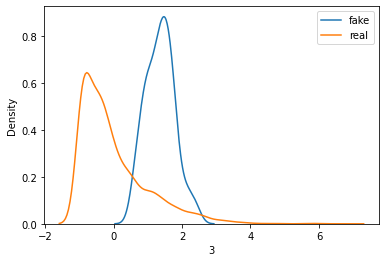

>Saved: drive/My Drive/Thesis/20201031-113310_g_model_00540.h5, and drive/My Drive/Thesis/20201031-113310_c_model_00540.h5


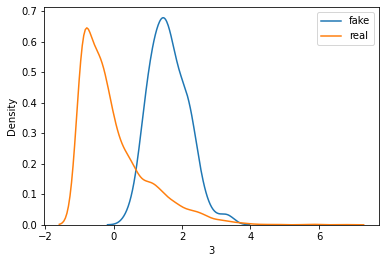

>Saved: drive/My Drive/Thesis/20201031-113333_g_model_00810.h5, and drive/My Drive/Thesis/20201031-113333_c_model_00810.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.994
60th percentile of preds: 0.346


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.74
               Age       Amount  ...   Purpose_X9          BAD
count  3525.000000  3525.000000  ...  3525.000000  3525.000000
mean     -0.024034    -0.583300  ...    -0.039693     0.496170
std       0.464350     0.430033  ...     0.501265     0.500056
min      -1.515917    -2.498393  ...    -1.576682     0.000000
25%      -0.345766    -0.843683  ...    -0.362962     0.000000
50%      -0.028948    -0.609376  ...    -0.088468     0.000000
75%       0.307246    -0.341801  ...     0.201778     1.000000
max       1.407686     1.242264  ...     2.449600     1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.95
60th percentile of preds: 0.564


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.981


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 12: 
tao: 0.015791382944232532
accepts: 110 with 0.01818181818181818% bad

> iteration 13: #accepts 1540
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_46 (InputLayer)        [(None, 51)]              0         
_________________________________________________________________
dense_150 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_120 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_60 (LeakyReLU)   (None, 100)               0         
_________________________________________________________________
dropout_60 (Dropout)         (None, 100)               0         
_________________________________________________________________
dense_151 (Dense)            (None, 100)               10100     
_________

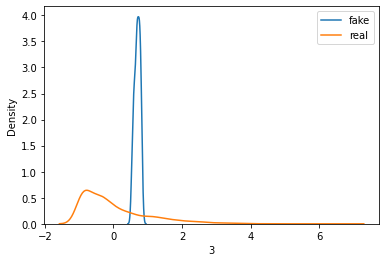

>Saved: drive/My Drive/Thesis/20201031-113411_g_model_00290.h5, and drive/My Drive/Thesis/20201031-113411_c_model_00290.h5


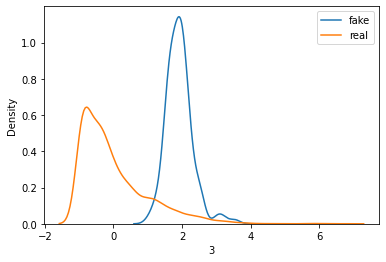

>Saved: drive/My Drive/Thesis/20201031-113435_g_model_00580.h5, and drive/My Drive/Thesis/20201031-113435_c_model_00580.h5


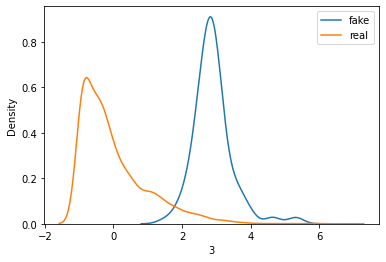

>Saved: drive/My Drive/Thesis/20201031-113500_g_model_00870.h5, and drive/My Drive/Thesis/20201031-113500_c_model_00870.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.994
60th percentile of preds: 0.1


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.439
               Age       Amount  ...   Purpose_X9          BAD
count  3800.000000  3800.000000  ...  3800.000000  3800.000000
mean      1.737136     0.374032  ...    -0.427336     0.499737
std       0.583892     0.411444  ...     0.356658     0.500066
min      -0.281465    -1.354215  ...    -2.119987     0.000000
25%       1.351966     0.119213  ...    -0.624144     0.000000
50%       1.750023     0.320051  ...    -0.438387     0.000000
75%       2.089642     0.572901  ...    -0.217670     1.000000
max       5.728557     3.276824  ...     0.967618     1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.969
60th percentile of preds: 0.38


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.981


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 13: 
tao: 0.019381227187722772
accepts: 110 with 0.02727272727272727% bad

> iteration 14: #accepts 1650
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_49 (InputLayer)        [(None, 51)]              0         
_________________________________________________________________
dense_160 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_128 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_64 (LeakyReLU)   (None, 100)               0         
_________________________________________________________________
dropout_64 (Dropout)         (None, 100)               0         
_________________________________________________________________
dense_161 (Dense)            (None, 100)               10100     
_________

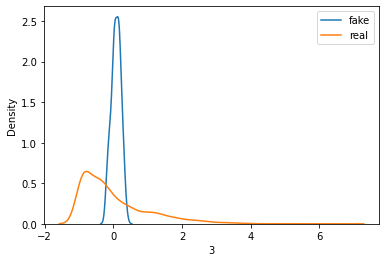

>Saved: drive/My Drive/Thesis/20201031-113540_g_model_00310.h5, and drive/My Drive/Thesis/20201031-113540_c_model_00310.h5


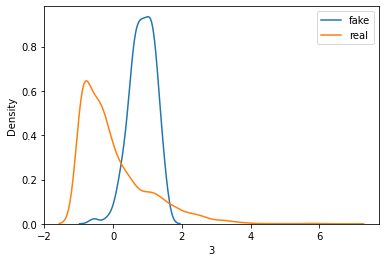

>Saved: drive/My Drive/Thesis/20201031-113607_g_model_00620.h5, and drive/My Drive/Thesis/20201031-113607_c_model_00620.h5


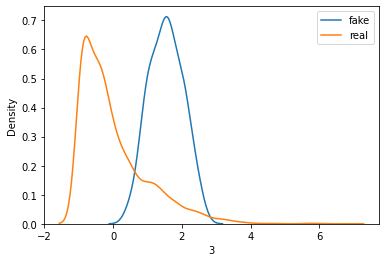

>Saved: drive/My Drive/Thesis/20201031-113632_g_model_00930.h5, and drive/My Drive/Thesis/20201031-113632_c_model_00930.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.995
60th percentile of preds: 0.178


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.527
               Age       Amount  ...   Purpose_X9          BAD
count  4075.000000  4075.000000  ...  4075.000000  4075.000000
mean      0.867737     1.519381  ...     0.274188     0.499632
std       0.628151     0.514944  ...     0.485402     0.500061
min      -0.767514     0.019705  ...    -1.406026     0.000000
25%       0.430392     1.188946  ...    -0.094726     0.000000
50%       0.804067     1.474165  ...     0.231094     0.000000
75%       1.196247     1.814858  ...     0.593791     1.000000
max       5.998210     5.084480  ...     2.634316     1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.955
60th percentile of preds: 0.392


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.98


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 14: 
tao: 0.022179768947523396
accepts: 110 with 0.0% bad

> iteration 15: #accepts 1760
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_52 (InputLayer)        [(None, 51)]              0         
_________________________________________________________________
dense_170 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_136 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_68 (LeakyReLU)   (None, 100)               0         
_________________________________________________________________
dropout_68 (Dropout)         (None, 100)               0         
_________________________________________________________________
dense_171 (Dense)            (None, 100)               10100     
_________________________

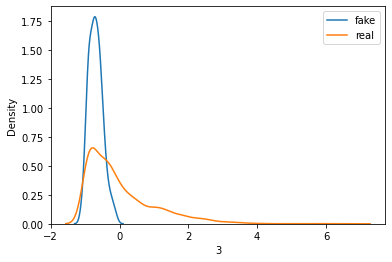

>Saved: drive/My Drive/Thesis/20201031-113714_g_model_00330.h5, and drive/My Drive/Thesis/20201031-113714_c_model_00330.h5


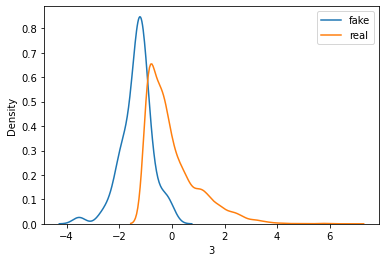

>Saved: drive/My Drive/Thesis/20201031-113742_g_model_00660.h5, and drive/My Drive/Thesis/20201031-113742_c_model_00660.h5


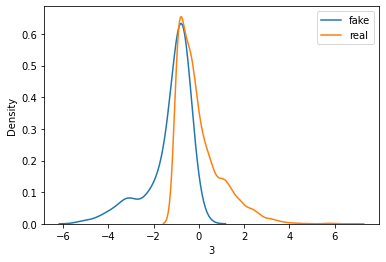

>Saved: drive/My Drive/Thesis/20201031-113809_g_model_00990.h5, and drive/My Drive/Thesis/20201031-113809_c_model_00990.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.995
60th percentile of preds: 0.457
60th percentile of preds: 0.845
               Age       Amount  ...   Purpose_X9          BAD
count  4350.000000  4350.000000  ...  4350.000000  4350.000000
mean      0.547816     0.204887  ...    -0.158309     0.503448
std       0.405485     0.470886  ...     0.661028     0.500046
min      -2.088962    -1.099812  ...    -5.789856     0.000000
25%       0.364477    -0.112096  ...    -0.373943     0.000000
50%       0.584653     0.180559  ...    -0.005863     1.000000
75%       0.784879     0.498728  ...     0.251176     1.000000
max       1.832495     3.936390  ...     0.991778     1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.958
60th percentile of preds: 0.664
60th percentile of preds: 0.981


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 15: 
tao: 0.01801982836811212
accepts: 110 with 0.02727272727272727% bad

> iteration 16: #accepts 1870
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_55 (InputLayer)        [(None, 51)]              0         
_________________________________________________________________
dense_180 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_144 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_72 (LeakyReLU)   (None, 100)               0         
_________________________________________________________________
dropout_72 (Dropout)         (None, 100)               0         
_________________________________________________________________
dense_181 (Dense)            (None, 100)               10100     
__________

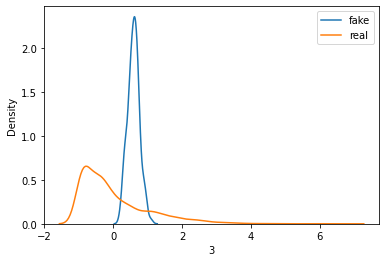

>Saved: drive/My Drive/Thesis/20201031-113854_g_model_00360.h5, and drive/My Drive/Thesis/20201031-113854_c_model_00360.h5


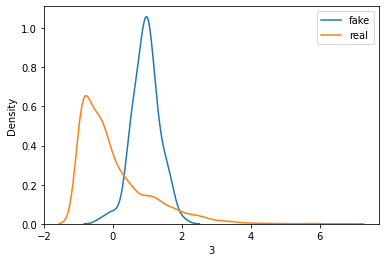

>Saved: drive/My Drive/Thesis/20201031-113924_g_model_00720.h5, and drive/My Drive/Thesis/20201031-113924_c_model_00720.h5


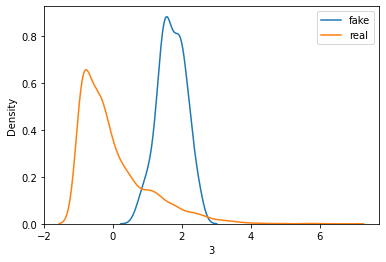

>Saved: drive/My Drive/Thesis/20201031-113955_g_model_01080.h5, and drive/My Drive/Thesis/20201031-113955_c_model_01080.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.994
60th percentile of preds: 0.199


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.566
               Age       Amount  ...   Purpose_X9          BAD
count  4625.000000  4625.000000  ...  4625.000000  4625.000000
mean      0.504970     1.627446  ...    -0.653714     0.503784
std       0.464076     0.418453  ...     0.365675     0.500040
min      -1.304289     0.002120  ...    -2.822657     0.000000
25%       0.173660     1.350436  ...    -0.868732     0.000000
50%       0.478992     1.611575  ...    -0.625816     1.000000
75%       0.824832     1.876572  ...    -0.410423     1.000000
max       2.342324     3.883602  ...     0.433288     1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.965
60th percentile of preds: 0.397
60th percentile of preds: 0.981


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 16: 
tao: 0.02364580448246635
accepts: 110 with 0.00909090909090909% bad

> iteration 17: #accepts 1980
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_58 (InputLayer)        [(None, 51)]              0         
_________________________________________________________________
dense_190 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_152 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_76 (LeakyReLU)   (None, 100)               0         
_________________________________________________________________
dropout_76 (Dropout)         (None, 100)               0         
_________________________________________________________________
dense_191 (Dense)            (None, 100)               10100     
__________

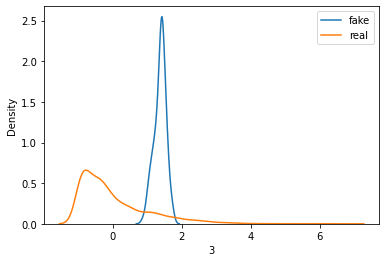

>Saved: drive/My Drive/Thesis/20201031-114041_g_model_00380.h5, and drive/My Drive/Thesis/20201031-114041_c_model_00380.h5


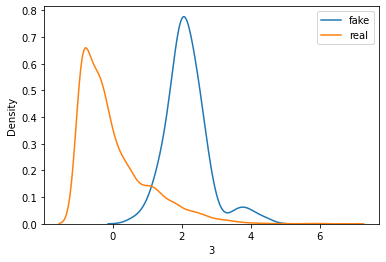

>Saved: drive/My Drive/Thesis/20201031-114112_g_model_00760.h5, and drive/My Drive/Thesis/20201031-114112_c_model_00760.h5


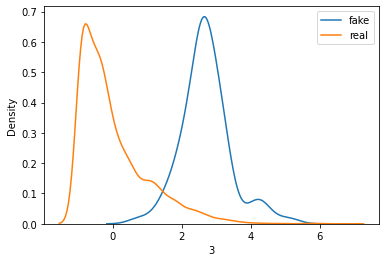

>Saved: drive/My Drive/Thesis/20201031-114146_g_model_01140.h5, and drive/My Drive/Thesis/20201031-114146_c_model_01140.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.994
60th percentile of preds: 0.097


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.519
               Age       Amount  ...   Purpose_X9          BAD
count  4900.000000  4900.000000  ...  4900.000000  4900.000000
mean      0.846666     1.848020  ...     0.813638     0.497755
std       0.407181     0.410726  ...     0.382774     0.500046
min      -0.346258     0.409066  ...    -0.363466     0.000000
25%       0.588595     1.584207  ...     0.572038     0.000000
50%       0.791019     1.836130  ...     0.737226     0.000000
75%       1.041327     2.100026  ...     0.973898     1.000000
max       3.119966     4.522958  ...     4.041144     1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.974
60th percentile of preds: 0.397
60th percentile of preds: 0.981


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 17: 
tao: 0.018472770417111373
accepts: 110 with 0.01818181818181818% bad

> iteration 18: #accepts 2090
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_61 (InputLayer)        [(None, 51)]              0         
_________________________________________________________________
dense_200 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_160 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_80 (LeakyReLU)   (None, 100)               0         
_________________________________________________________________
dropout_80 (Dropout)         (None, 100)               0         
_________________________________________________________________
dense_201 (Dense)            (None, 100)               10100     
_________

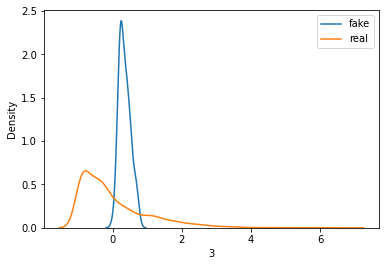

>Saved: drive/My Drive/Thesis/20201031-114235_g_model_00400.h5, and drive/My Drive/Thesis/20201031-114235_c_model_00400.h5


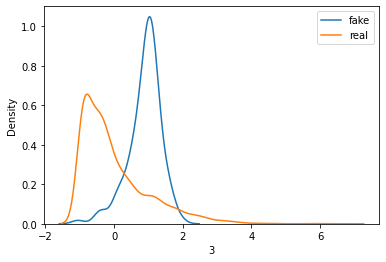

>Saved: drive/My Drive/Thesis/20201031-114309_g_model_00800.h5, and drive/My Drive/Thesis/20201031-114309_c_model_00800.h5


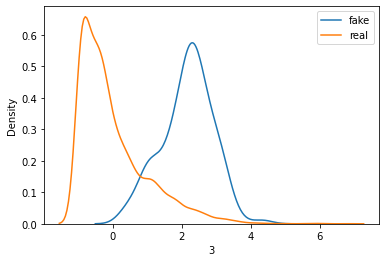

>Saved: drive/My Drive/Thesis/20201031-114343_g_model_01200.h5, and drive/My Drive/Thesis/20201031-114343_c_model_01200.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.995
60th percentile of preds: 0.328
60th percentile of preds: 0.647
               Age       Amount  ...   Purpose_X9          BAD
count  5175.000000  5175.000000  ...  5175.000000  5175.000000
mean      0.622484    -0.710845  ...     0.213543     0.505507
std       0.341835     1.309731  ...     0.331171     0.500018
min      -1.394387   -10.480462  ...    -1.165439     0.000000
25%       0.476687    -1.003479  ...     0.003358     0.000000
50%       0.689232    -0.276017  ...     0.183107     1.000000
75%       0.829931     0.069984  ...     0.404157     1.000000
max       2.419303     1.256390  ...     2.071045     1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.97
60th percentile of preds: 0.441
60th percentile of preds: 0.979


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 18: 
tao: 0.02560596672487727
accepts: 110 with 0.01818181818181818% bad

> iteration 19: #accepts 2200
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_64 (InputLayer)        [(None, 51)]              0         
_________________________________________________________________
dense_210 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_168 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_84 (LeakyReLU)   (None, 100)               0         
_________________________________________________________________
dropout_84 (Dropout)         (None, 100)               0         
_________________________________________________________________
dense_211 (Dense)            (None, 100)               10100     
__________

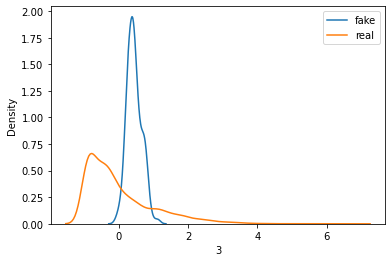

>Saved: drive/My Drive/Thesis/20201031-114434_g_model_00420.h5, and drive/My Drive/Thesis/20201031-114434_c_model_00420.h5


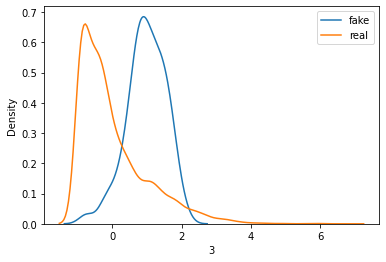

>Saved: drive/My Drive/Thesis/20201031-114509_g_model_00840.h5, and drive/My Drive/Thesis/20201031-114509_c_model_00840.h5


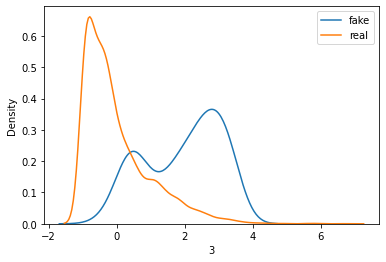

>Saved: drive/My Drive/Thesis/20201031-114543_g_model_01260.h5, and drive/My Drive/Thesis/20201031-114543_c_model_01260.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.994
60th percentile of preds: 0.313


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.458
               Age       Amount  ...   Purpose_X9          BAD
count  5450.000000  5450.000000  ...  5450.000000  5450.000000
mean      1.904004     1.127477  ...    -0.040195     0.497798
std       1.069554     0.843725  ...     0.419382     0.500041
min      -0.802364    -0.942277  ...    -1.600901     0.000000
25%       0.969467     0.428401  ...    -0.337406     0.000000
50%       2.287560     1.182507  ...    -0.088173     0.000000
75%       2.768474     1.809897  ...     0.220284     1.000000
max       5.195804     4.611352  ...     1.919291     1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.952
60th percentile of preds: 0.392
60th percentile of preds: 0.979


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 19: 
tao: 0.020604485058694222
accepts: 110 with 0.03636363636363636% bad

> iteration 20: #accepts 2310
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_67 (InputLayer)        [(None, 51)]              0         
_________________________________________________________________
dense_220 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_176 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_88 (LeakyReLU)   (None, 100)               0         
_________________________________________________________________
dropout_88 (Dropout)         (None, 100)               0         
_________________________________________________________________
dense_221 (Dense)            (None, 100)               10100     
_________

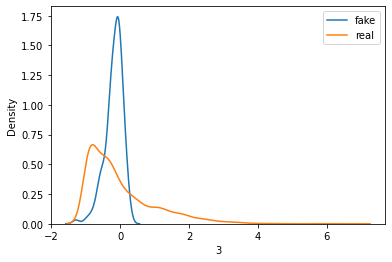

>Saved: drive/My Drive/Thesis/20201031-114638_g_model_00440.h5, and drive/My Drive/Thesis/20201031-114638_c_model_00440.h5


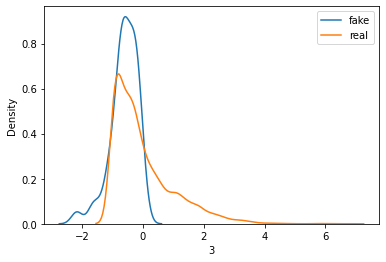

>Saved: drive/My Drive/Thesis/20201031-114716_g_model_00880.h5, and drive/My Drive/Thesis/20201031-114716_c_model_00880.h5


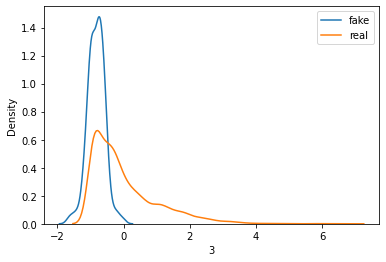

>Saved: drive/My Drive/Thesis/20201031-114752_g_model_01320.h5, and drive/My Drive/Thesis/20201031-114752_c_model_01320.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.99
60th percentile of preds: 0.904


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.996
               Age       Amount  ...   Purpose_X9          BAD
count  5725.000000  5725.000000  ...  5725.000000  5725.000000
mean     -0.339590    -0.114808  ...     0.153011     0.496245
std       0.757095     0.328140  ...     0.438260     0.500030
min      -6.634855    -2.672921  ...    -2.261291     0.000000
25%      -0.409476    -0.258641  ...    -0.077011     0.000000
50%      -0.106024    -0.062705  ...     0.232746     0.000000
75%       0.060548     0.082987  ...     0.439586     1.000000
max       0.645266     1.338308  ...     2.177618     1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.941
60th percentile of preds: 0.927
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 20: 
tao: 0.024520933831886534
accepts: 110 with 0.01818181818181818% bad

> iteration 21: #accepts 2420
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_70 (InputLayer)        [(None, 51)]              0         
_________________________________________________________________
dense_230 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_184 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_92 (LeakyReLU)   (None, 100)               0         
_________________________________________________________________
dropout_92 (Dropout)         (None, 100)               0         
_________________________________________________________________
dense_231 (Dense)            (None, 100)               10100     
_________

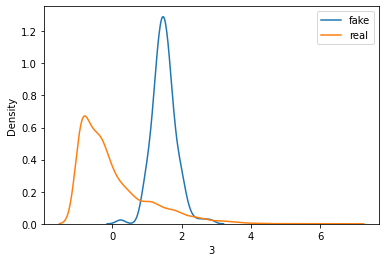

>Saved: drive/My Drive/Thesis/20201031-114850_g_model_00460.h5, and drive/My Drive/Thesis/20201031-114850_c_model_00460.h5


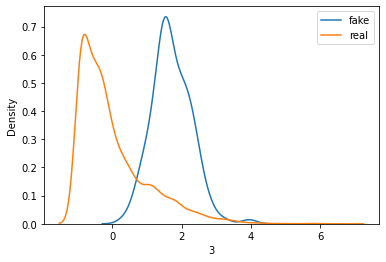

>Saved: drive/My Drive/Thesis/20201031-114928_g_model_00920.h5, and drive/My Drive/Thesis/20201031-114928_c_model_00920.h5


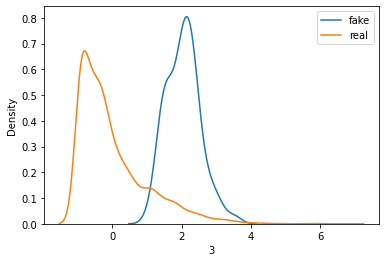

>Saved: drive/My Drive/Thesis/20201031-115005_g_model_01380.h5, and drive/My Drive/Thesis/20201031-115005_c_model_01380.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.991
60th percentile of preds: 0.395
60th percentile of preds: 0.716
               Age       Amount  ...   Purpose_X9          BAD
count  6000.000000  6000.000000  ...  6000.000000  6000.000000
mean      0.703572    -0.010583  ...     0.892722     0.494000
std       0.430786     0.447781  ...     0.365773     0.500006
min      -0.846110    -2.449680  ...    -0.595576     0.000000
25%       0.415766    -0.244400  ...     0.651897     0.000000
50%       0.681858     0.027109  ...     0.895534     0.000000
75%       0.963578     0.280493  ...     1.117544     1.000000
max       3.054329     1.444386  ...     2.578737     1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.968
60th percentile of preds: 0.527
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 21: 
tao: 0.0229909427661924
accepts: 110 with 0.00909090909090909% bad

> iteration 22: #accepts 2530
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_73 (InputLayer)        [(None, 51)]              0         
_________________________________________________________________
dense_240 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_192 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_96 (LeakyReLU)   (None, 100)               0         
_________________________________________________________________
dropout_96 (Dropout)         (None, 100)               0         
_________________________________________________________________
dense_241 (Dense)            (None, 100)               10100     
___________

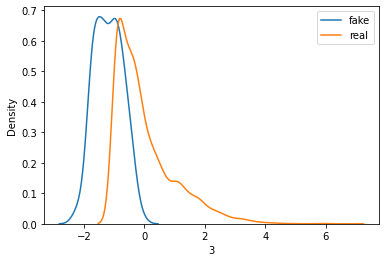

>Saved: drive/My Drive/Thesis/20201031-115104_g_model_00490.h5, and drive/My Drive/Thesis/20201031-115104_c_model_00490.h5


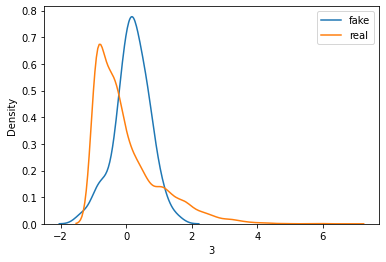

>Saved: drive/My Drive/Thesis/20201031-115144_g_model_00980.h5, and drive/My Drive/Thesis/20201031-115144_c_model_00980.h5


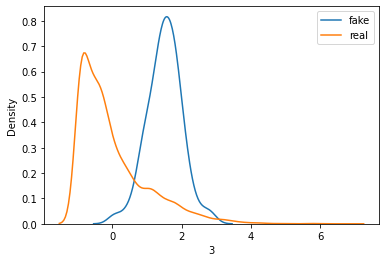

>Saved: drive/My Drive/Thesis/20201031-115225_g_model_01470.h5, and drive/My Drive/Thesis/20201031-115225_c_model_01470.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.991
60th percentile of preds: 0.243
60th percentile of preds: 0.555
               Age       Amount  ...   Purpose_X9          BAD
count  6275.000000  6275.000000  ...  6275.000000  6275.000000
mean      1.806180    -0.407161  ...    -0.149983     0.488924
std       0.612393     0.544431  ...     0.404846     0.499917
min      -0.475296    -5.139693  ...    -3.233884     0.000000
25%       1.394181    -0.657030  ...    -0.341143     0.000000
50%       1.786754    -0.328794  ...    -0.111583     0.000000
75%       2.248931    -0.058763  ...     0.106077     1.000000
max       3.625100     1.174471  ...     1.108764     1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.975
60th percentile of preds: 0.451
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 22: 
tao: 0.023121909485642887
accepts: 110 with 0.0% bad

> iteration 23: #accepts 2640
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_76 (InputLayer)        [(None, 51)]              0         
_________________________________________________________________
dense_250 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_200 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_100 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_100 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_251 (Dense)            (None, 100)               10100     
_________________________

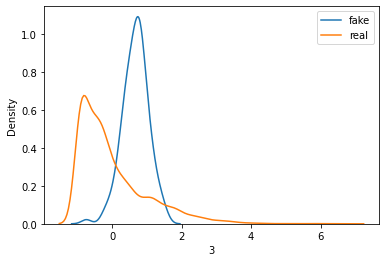

>Saved: drive/My Drive/Thesis/20201031-115325_g_model_00510.h5, and drive/My Drive/Thesis/20201031-115325_c_model_00510.h5


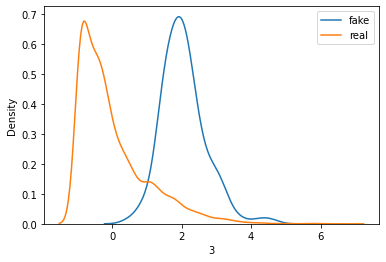

>Saved: drive/My Drive/Thesis/20201031-115406_g_model_01020.h5, and drive/My Drive/Thesis/20201031-115406_c_model_01020.h5


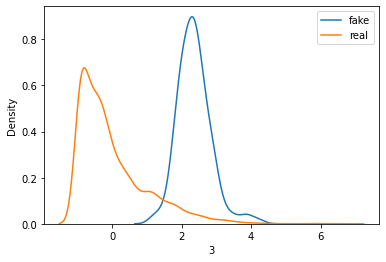

>Saved: drive/My Drive/Thesis/20201031-115449_g_model_01530.h5, and drive/My Drive/Thesis/20201031-115449_c_model_01530.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.992
60th percentile of preds: 0.152


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.464
               Age       Amount  ...   Purpose_X9          BAD
count  6550.000000  6550.000000  ...  6550.000000  6550.000000
mean      1.674700     0.877392  ...    -1.320034     0.494962
std       0.427489     0.250390  ...     0.440278     0.500013
min       0.060900    -0.015963  ...    -4.091724     0.000000
25%       1.395713     0.723086  ...    -1.577712     0.000000
50%       1.627020     0.864817  ...    -1.274934     0.000000
75%       1.893593     1.010826  ...    -1.017475     1.000000
max       5.007834     2.465522  ...     0.545732     1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.98
60th percentile of preds: 0.384
60th percentile of preds: 0.979


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 23: 
tao: 0.02152559229843474
accepts: 110 with 0.00909090909090909% bad

> iteration 24: #accepts 2750
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_79 (InputLayer)        [(None, 51)]              0         
_________________________________________________________________
dense_260 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_208 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_104 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_104 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_261 (Dense)            (None, 100)               10100     
__________

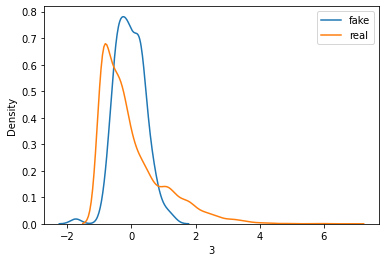

>Saved: drive/My Drive/Thesis/20201031-115554_g_model_00530.h5, and drive/My Drive/Thesis/20201031-115554_c_model_00530.h5


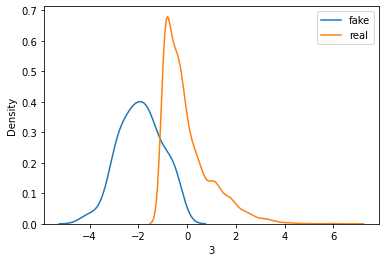

>Saved: drive/My Drive/Thesis/20201031-115639_g_model_01060.h5, and drive/My Drive/Thesis/20201031-115639_c_model_01060.h5


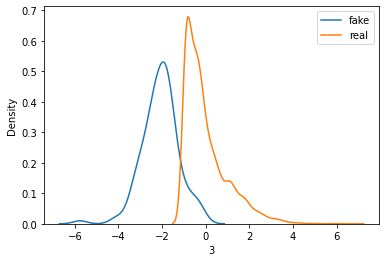

>Saved: drive/My Drive/Thesis/20201031-115724_g_model_01590.h5, and drive/My Drive/Thesis/20201031-115724_c_model_01590.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.991
60th percentile of preds: 0.958


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.998
               Age       Amount  ...   Purpose_X9          BAD
count  6825.000000  6825.000000  ...  6825.000000  6825.000000
mean     -1.726123    -2.189724  ...    -0.015909     0.518681
std       0.605242     0.491477  ...     0.384924     0.499687
min      -3.440423    -4.411562  ...    -1.330184     0.000000
25%      -2.147262    -2.510160  ...    -0.281360     0.000000
50%      -1.701044    -2.184393  ...    -0.033846     1.000000
75%      -1.281207    -1.850116  ...     0.216796     1.000000
max       0.300296    -0.784296  ...     1.689644     1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.973
60th percentile of preds: 0.969
60th percentile of preds: 0.98


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 24: 
tao: 0.022072793011863365
accepts: 110 with 0.01818181818181818% bad

> iteration 25: #accepts 2860
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_82 (InputLayer)        [(None, 51)]              0         
_________________________________________________________________
dense_270 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_216 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_108 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_108 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_271 (Dense)            (None, 100)               10100     
_________

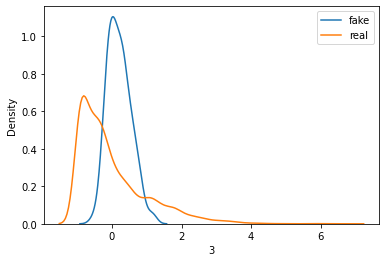

>Saved: drive/My Drive/Thesis/20201031-115833_g_model_00550.h5, and drive/My Drive/Thesis/20201031-115833_c_model_00550.h5


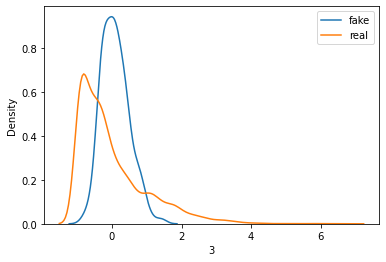

>Saved: drive/My Drive/Thesis/20201031-115920_g_model_01100.h5, and drive/My Drive/Thesis/20201031-115920_c_model_01100.h5


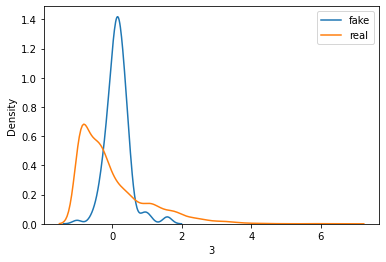

>Saved: drive/My Drive/Thesis/20201031-120006_g_model_01650.h5, and drive/My Drive/Thesis/20201031-120006_c_model_01650.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.991
60th percentile of preds: 0.743


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.977
               Age       Amount  ...   Purpose_X9          BAD
count  7100.000000  7100.000000  ...  7100.000000  7100.000000
mean     -0.041400    -0.545744  ...     0.081490     0.496761
std       0.470727     0.407476  ...     0.506967     0.500025
min      -3.159410    -2.781560  ...    -2.618608     0.000000
25%      -0.305457    -0.788232  ...    -0.218832     0.000000
50%      -0.079545    -0.518603  ...     0.036948     0.000000
75%       0.206503    -0.274014  ...     0.359074     1.000000
max       2.029064     0.832824  ...     2.616860     1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.951
60th percentile of preds: 0.906
60th percentile of preds: 0.979


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 25: 
tao: 0.020858461508935555
accepts: 110 with 0.01818181818181818% bad

> iteration 26: #accepts 2970
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_85 (InputLayer)        [(None, 51)]              0         
_________________________________________________________________
dense_280 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_224 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_112 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_112 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_281 (Dense)            (None, 100)               10100     
_________

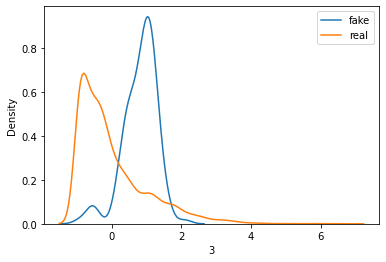

>Saved: drive/My Drive/Thesis/20201031-120115_g_model_00570.h5, and drive/My Drive/Thesis/20201031-120115_c_model_00570.h5


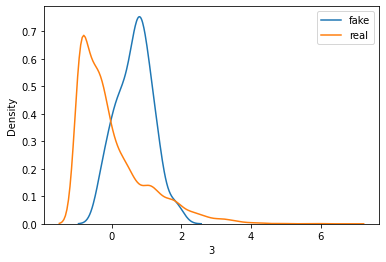

>Saved: drive/My Drive/Thesis/20201031-120203_g_model_01140.h5, and drive/My Drive/Thesis/20201031-120203_c_model_01140.h5


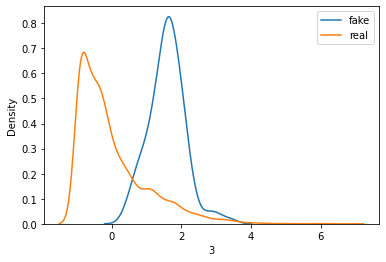

>Saved: drive/My Drive/Thesis/20201031-120250_g_model_01710.h5, and drive/My Drive/Thesis/20201031-120250_c_model_01710.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.991
60th percentile of preds: 0.141


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.476
               Age       Amount  ...   Purpose_X9          BAD
count  7375.000000  7375.000000  ...  7375.000000  7375.000000
mean      1.301061    -0.220809  ...    -0.231012     0.498441
std       0.484605     0.450774  ...     0.360307     0.500031
min      -0.258725    -2.060951  ...    -2.248378     0.000000
25%       1.004523    -0.478844  ...    -0.419805     0.000000
50%       1.256037    -0.194429  ...    -0.176192     0.000000
75%       1.550844     0.079414  ...    -0.001274     1.000000
max       3.693430     2.069667  ...     1.240583     1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.977
60th percentile of preds: 0.377
60th percentile of preds: 0.979


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 26: 
tao: 0.021310494273363255
accepts: 110 with 0.01818181818181818% bad

> iteration 27: #accepts 3080
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_88 (InputLayer)        [(None, 51)]              0         
_________________________________________________________________
dense_290 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_232 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_116 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_116 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_291 (Dense)            (None, 100)               10100     
_________

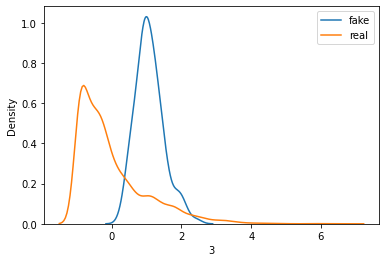

>Saved: drive/My Drive/Thesis/20201031-120402_g_model_00590.h5, and drive/My Drive/Thesis/20201031-120402_c_model_00590.h5


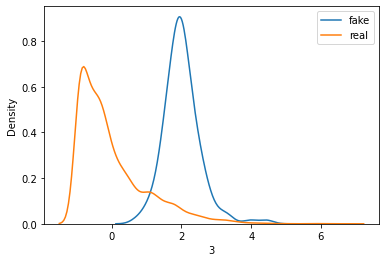

>Saved: drive/My Drive/Thesis/20201031-120451_g_model_01180.h5, and drive/My Drive/Thesis/20201031-120451_c_model_01180.h5


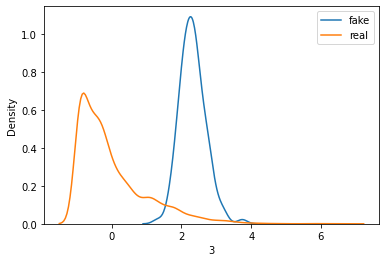

>Saved: drive/My Drive/Thesis/20201031-120540_g_model_01770.h5, and drive/My Drive/Thesis/20201031-120540_c_model_01770.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.992
60th percentile of preds: 0.115


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.416
               Age       Amount  ...   Purpose_X9          BAD
count  7650.000000  7650.000000  ...  7650.000000  7650.000000
mean      1.902256     0.909628  ...    -1.512297     0.503922
std       0.453233     0.425767  ...     0.440535     0.500017
min       0.542051    -1.270220  ...    -3.573242     0.000000
25%       1.595547     0.635449  ...    -1.792725     0.000000
50%       1.890568     0.906415  ...    -1.487461     1.000000
75%       2.189334     1.172887  ...    -1.225614     1.000000
max       5.567620     3.208693  ...    -0.244714     1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.98
60th percentile of preds: 0.354
60th percentile of preds: 0.979


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 27: 
tao: 0.020073306959973128
accepts: 110 with 0.01818181818181818% bad

> iteration 28: #accepts 3190
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_91 (InputLayer)        [(None, 51)]              0         
_________________________________________________________________
dense_300 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_240 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_120 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_120 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_301 (Dense)            (None, 100)               10100     
_________

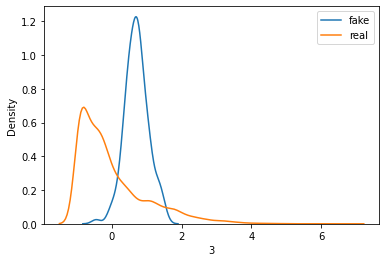

>Saved: drive/My Drive/Thesis/20201031-120652_g_model_00610.h5, and drive/My Drive/Thesis/20201031-120652_c_model_00610.h5


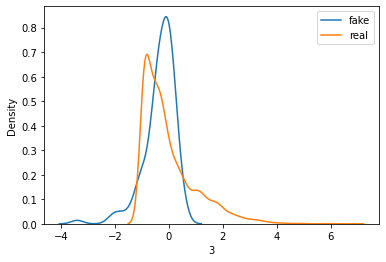

>Saved: drive/My Drive/Thesis/20201031-120741_g_model_01220.h5, and drive/My Drive/Thesis/20201031-120741_c_model_01220.h5


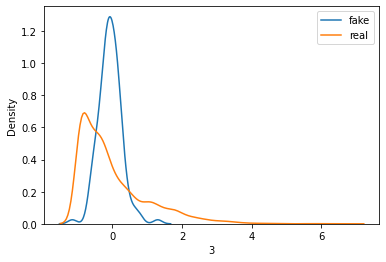

>Saved: drive/My Drive/Thesis/20201031-120831_g_model_01830.h5, and drive/My Drive/Thesis/20201031-120831_c_model_01830.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.991
60th percentile of preds: 0.842
60th percentile of preds: 0.975
               Age       Amount  ...   Purpose_X9          BAD
count  7925.000000  7925.000000  ...  7925.000000  7925.000000
mean     -0.292332     0.428120  ...    -0.538918     0.496404
std       0.333340     0.409418  ...     0.350239     0.500019
min      -3.168523    -1.671792  ...    -3.227940     0.000000
25%      -0.472273     0.189815  ...    -0.689726     0.000000
50%      -0.289834     0.376550  ...    -0.491269     0.000000
75%      -0.092035     0.622276  ...    -0.342408     1.000000
max       1.062673     2.716290  ...     1.231273     1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.972
60th percentile of preds: 0.906
60th percentile of preds: 0.979


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 28: 
tao: 0.022704414156673694
accepts: 110 with 0.01818181818181818% bad

> iteration 29: #accepts 3300
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_94 (InputLayer)        [(None, 51)]              0         
_________________________________________________________________
dense_310 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_248 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_124 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_124 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_311 (Dense)            (None, 100)               10100     
_________

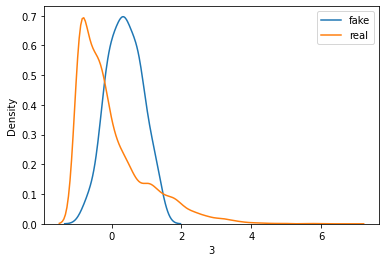

>Saved: drive/My Drive/Thesis/20201031-120949_g_model_00640.h5, and drive/My Drive/Thesis/20201031-120949_c_model_00640.h5


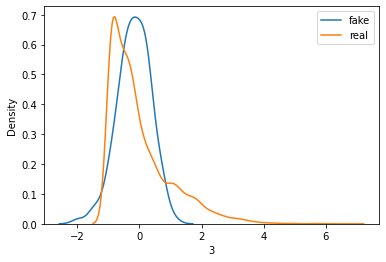

>Saved: drive/My Drive/Thesis/20201031-121041_g_model_01280.h5, and drive/My Drive/Thesis/20201031-121041_c_model_01280.h5


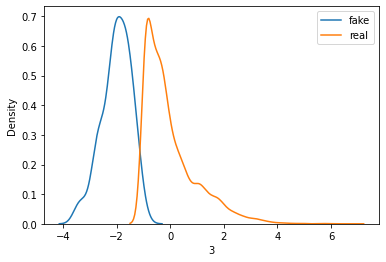

>Saved: drive/My Drive/Thesis/20201031-121134_g_model_01920.h5, and drive/My Drive/Thesis/20201031-121134_c_model_01920.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.99
60th percentile of preds: 0.994


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.997
               Age       Amount  ...   Purpose_X9         BAD
count  8200.000000  8200.000000  ...  8200.000000  8200.00000
mean     -3.510879    -0.803830  ...    -0.326957     0.50000
std       0.730203     0.480341  ...     0.469479     0.50003
min      -9.457841    -3.378549  ...    -2.743081     0.00000
25%      -3.929194    -1.081319  ...    -0.617260     0.00000
50%      -3.452487    -0.763782  ...    -0.265296     0.50000
75%      -3.000133    -0.479654  ...     0.024224     1.00000
max      -1.566245     0.927113  ...     1.001438     1.00000

[8 rows x 52 columns]
60th percentile of preds: 0.969
60th percentile of preds: 0.988


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.979


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 29: 
tao: 0.023938128278736866
accepts: 110 with 0.01818181818181818% bad

> iteration 30: #accepts 3410
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_97 (InputLayer)        [(None, 51)]              0         
_________________________________________________________________
dense_320 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_256 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_128 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_128 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_321 (Dense)            (None, 100)               10100     
_________

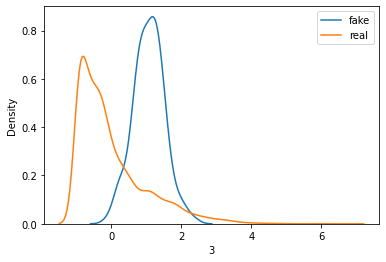

>Saved: drive/My Drive/Thesis/20201031-121256_g_model_00660.h5, and drive/My Drive/Thesis/20201031-121256_c_model_00660.h5


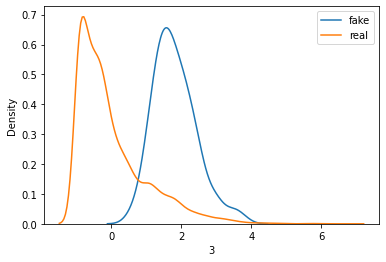

>Saved: drive/My Drive/Thesis/20201031-121350_g_model_01320.h5, and drive/My Drive/Thesis/20201031-121350_c_model_01320.h5


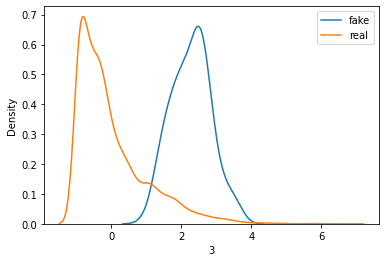

>Saved: drive/My Drive/Thesis/20201031-121446_g_model_01980.h5, and drive/My Drive/Thesis/20201031-121446_c_model_01980.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.991
60th percentile of preds: 0.087


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.444
               Age       Amount  ...   Purpose_X9          BAD
count  8475.000000  8475.000000  ...  8475.000000  8475.000000
mean      2.404736     2.244021  ...    -0.457389     0.519056
std       0.443441     0.494987  ...     0.437300     0.499666
min       1.027946     0.745073  ...    -2.235438     0.000000
25%       2.101464     1.906936  ...    -0.745072     0.000000
50%       2.375448     2.250422  ...    -0.460968     1.000000
75%       2.672454     2.578552  ...    -0.155348     1.000000
max       4.831313     4.167785  ...     0.943950     1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.975
60th percentile of preds: 0.37
60th percentile of preds: 0.979


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 30: 
tao: 0.02465105402814494
accepts: 110 with 0.03636363636363636% bad

> iteration 31: #accepts 3520
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_100 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_330 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_264 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_132 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_132 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_331 (Dense)            (None, 100)               10100     
__________

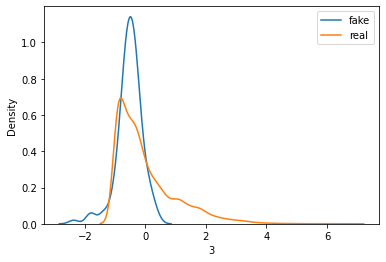

>Saved: drive/My Drive/Thesis/20201031-121605_g_model_00680.h5, and drive/My Drive/Thesis/20201031-121605_c_model_00680.h5


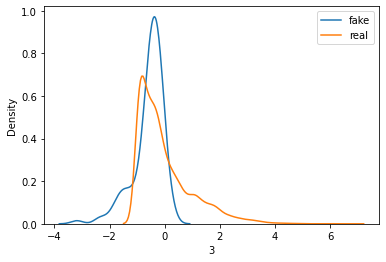

>Saved: drive/My Drive/Thesis/20201031-121702_g_model_01360.h5, and drive/My Drive/Thesis/20201031-121702_c_model_01360.h5


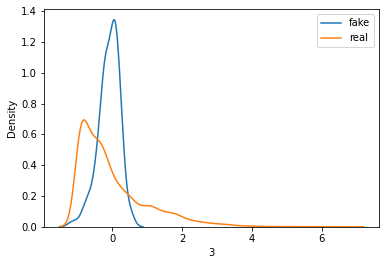

>Saved: drive/My Drive/Thesis/20201031-121759_g_model_02040.h5, and drive/My Drive/Thesis/20201031-121759_c_model_02040.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.99
60th percentile of preds: 0.774
60th percentile of preds: 0.958
               Age       Amount  ...   Purpose_X9          BAD
count  8750.000000  8750.000000  ...  8750.000000  8750.000000
mean     -0.678027    -0.035651  ...    -0.774280     0.493829
std       0.291511     0.302995  ...     0.286649     0.499990
min      -2.106928    -2.283545  ...    -2.477458     0.000000
25%      -0.861202    -0.182848  ...    -0.939285     0.000000
50%      -0.670418    -0.032920  ...    -0.770188     0.000000
75%      -0.489173     0.125243  ...    -0.604394     1.000000
max       0.419580     1.458853  ...     0.529902     1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.955
60th percentile of preds: 0.87
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 31: 
tao: 0.02288553738121142
accepts: 110 with 0.02727272727272727% bad

> iteration 32: #accepts 3630
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_103 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_340 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_272 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_136 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_136 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_341 (Dense)            (None, 100)               10100     
__________

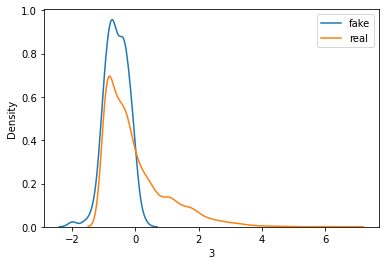

>Saved: drive/My Drive/Thesis/20201031-121924_g_model_00700.h5, and drive/My Drive/Thesis/20201031-121924_c_model_00700.h5


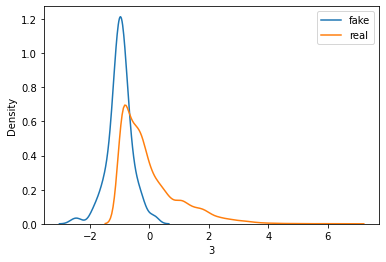

>Saved: drive/My Drive/Thesis/20201031-122022_g_model_01400.h5, and drive/My Drive/Thesis/20201031-122022_c_model_01400.h5


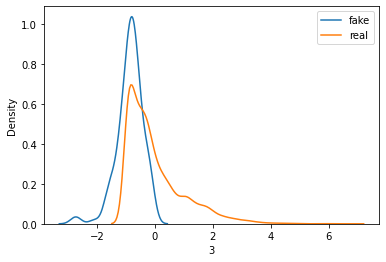

>Saved: drive/My Drive/Thesis/20201031-122120_g_model_02100.h5, and drive/My Drive/Thesis/20201031-122120_c_model_02100.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.989
60th percentile of preds: 0.839


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.986
               Age       Amount  ...   Purpose_X9          BAD
count  9025.000000  9025.000000  ...  9025.000000  9025.000000
mean     -0.630072     0.145474  ...     0.391556     0.496731
std       0.490310     0.333663  ...     0.306451     0.500017
min      -3.649032    -2.063014  ...    -0.975231     0.000000
25%      -0.866401    -0.040823  ...     0.195652     0.000000
50%      -0.555480     0.151827  ...     0.370159     0.000000
75%      -0.289969     0.357319  ...     0.556754     1.000000
max       0.531699     1.289073  ...     2.556722     1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.985
60th percentile of preds: 0.89
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 32: 
tao: 0.02387307219233451
accepts: 110 with 0.02727272727272727% bad

> iteration 33: #accepts 3740
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_106 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_350 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_280 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_140 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_140 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_351 (Dense)            (None, 100)               10100     
__________

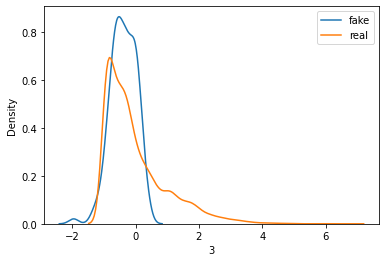

>Saved: drive/My Drive/Thesis/20201031-122250_g_model_00720.h5, and drive/My Drive/Thesis/20201031-122250_c_model_00720.h5


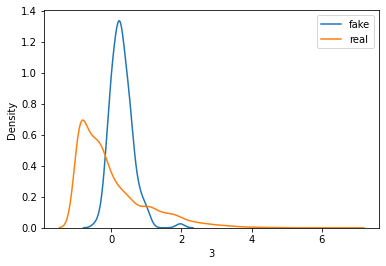

>Saved: drive/My Drive/Thesis/20201031-122350_g_model_01440.h5, and drive/My Drive/Thesis/20201031-122350_c_model_01440.h5


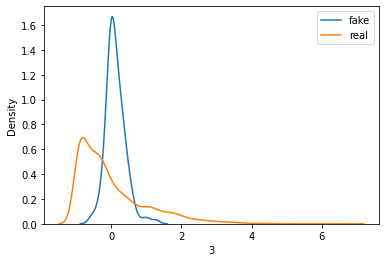

>Saved: drive/My Drive/Thesis/20201031-122452_g_model_02160.h5, and drive/My Drive/Thesis/20201031-122452_c_model_02160.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.989
60th percentile of preds: 0.695
60th percentile of preds: 0.956
               Age       Amount  ...   Purpose_X9          BAD
count  9300.000000  9300.000000  ...  9300.000000  9300.000000
mean     -0.056823    -0.277191  ...    -0.307355     0.493441
std       0.290510     0.247993  ...     0.267920     0.499984
min      -1.462693    -1.606695  ...    -2.500305     0.000000
25%      -0.224560    -0.416695  ...    -0.442956     0.000000
50%      -0.025887    -0.283637  ...    -0.308967     0.000000
75%       0.150582    -0.134724  ...    -0.155528     1.000000
max       0.930528     1.063156  ...     1.203283     1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.971
60th percentile of preds: 0.914
60th percentile of preds: 0.977


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 33: 
tao: 0.019786757196709387
accepts: 110 with 0.00909090909090909% bad

> iteration 34: #accepts 3850
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_109 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_360 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_288 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_144 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_144 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_361 (Dense)            (None, 100)               10100     
_________

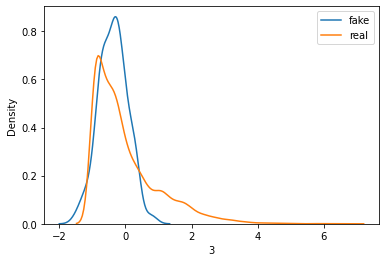

>Saved: drive/My Drive/Thesis/20201031-122626_g_model_00740.h5, and drive/My Drive/Thesis/20201031-122626_c_model_00740.h5


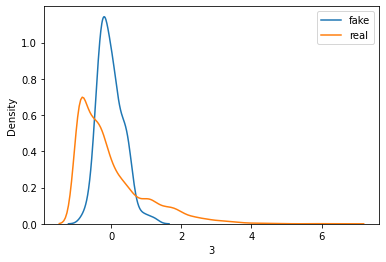

>Saved: drive/My Drive/Thesis/20201031-122729_g_model_01480.h5, and drive/My Drive/Thesis/20201031-122729_c_model_01480.h5


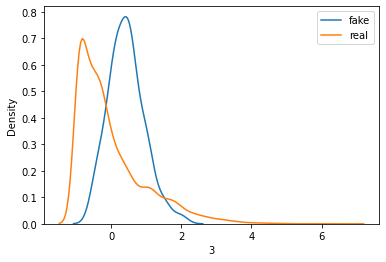

>Saved: drive/My Drive/Thesis/20201031-122831_g_model_02220.h5, and drive/My Drive/Thesis/20201031-122831_c_model_02220.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.989
60th percentile of preds: 0.285
60th percentile of preds: 0.58
               Age       Amount  ...   Purpose_X9          BAD
count  9575.000000  9575.000000  ...  9575.000000  9575.000000
mean      1.040316    -0.274076  ...    -0.273513     0.497232
std       0.437169     0.340657  ...     0.366920     0.500018
min      -0.231533    -2.128230  ...    -2.139655     0.000000
25%       0.750774    -0.507056  ...    -0.499074     0.000000
50%       1.032722    -0.273785  ...    -0.272102     0.000000
75%       1.286355    -0.043952  ...    -0.024007     1.000000
max       3.494469     1.083410  ...     0.812656     1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.965
60th percentile of preds: 0.42


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 34: 
tao: 0.026302545502419884
accepts: 110 with 0.01818181818181818% bad

> iteration 35: #accepts 3960
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_112 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_370 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_296 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_148 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_148 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_371 (Dense)            (None, 100)               10100     
_________

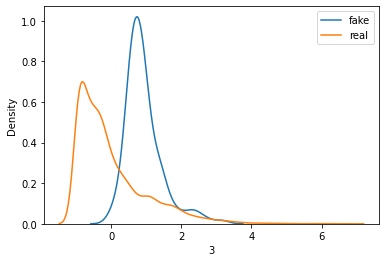

>Saved: drive/My Drive/Thesis/20201031-123004_g_model_00760.h5, and drive/My Drive/Thesis/20201031-123004_c_model_00760.h5


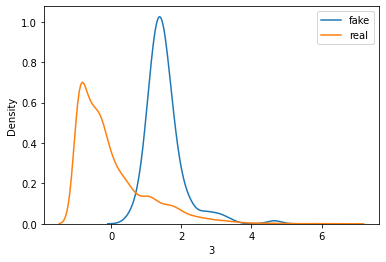

>Saved: drive/My Drive/Thesis/20201031-123107_g_model_01520.h5, and drive/My Drive/Thesis/20201031-123107_c_model_01520.h5


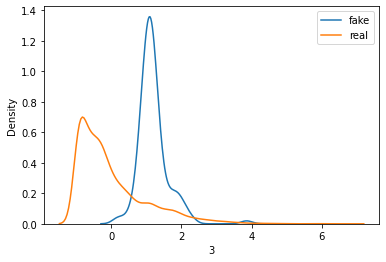

>Saved: drive/My Drive/Thesis/20201031-123209_g_model_02280.h5, and drive/My Drive/Thesis/20201031-123209_c_model_02280.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.989
60th percentile of preds: 0.544
60th percentile of preds: 0.907
               Age       Amount  ...   Purpose_X9          BAD
count  9850.000000  9850.000000  ...  9850.000000  9850.000000
mean      0.856277    -0.311566  ...     0.013572     0.505279
std       0.316118     0.250865  ...     0.245632     0.499998
min       0.091485    -1.647277  ...    -1.436543     0.000000
25%       0.640025    -0.456893  ...    -0.100969     0.000000
50%       0.828871    -0.314292  ...     0.062942     1.000000
75%       1.025855    -0.156916  ...     0.177779     1.000000
max       3.298142     1.450704  ...     1.012052     1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.983


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.697
60th percentile of preds: 0.977


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 35: 
tao: 0.018703112300955563
accepts: 110 with 0.01818181818181818% bad

> iteration 36: #accepts 4070
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_115 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_380 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_304 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_152 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_152 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_381 (Dense)            (None, 100)               10100     
_________

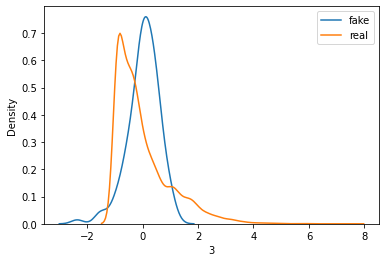

>Saved: drive/My Drive/Thesis/20201031-123347_g_model_00790.h5, and drive/My Drive/Thesis/20201031-123347_c_model_00790.h5


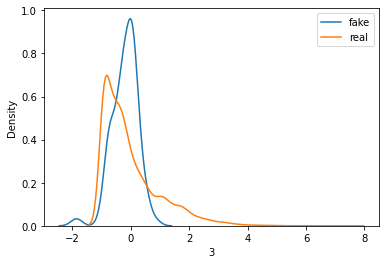

>Saved: drive/My Drive/Thesis/20201031-123453_g_model_01580.h5, and drive/My Drive/Thesis/20201031-123453_c_model_01580.h5


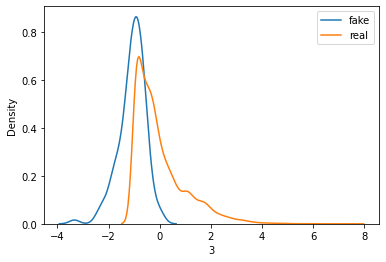

>Saved: drive/My Drive/Thesis/20201031-123600_g_model_02370.h5, and drive/My Drive/Thesis/20201031-123600_c_model_02370.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.988
60th percentile of preds: 0.94
60th percentile of preds: 0.997
                Age        Amount  ...    Purpose_X9           BAD
count  10125.000000  10125.000000  ...  10125.000000  10125.000000
mean      -1.719739     -0.038330  ...      0.115223      0.495704
std        0.429782      0.341391  ...      0.282589      0.500006
min       -5.551905     -1.472614  ...     -1.078657      0.000000
25%       -1.894441     -0.232075  ...     -0.073187      0.000000
50%       -1.658125     -0.034604  ...      0.103862      0.000000
75%       -1.469763      0.164425  ...      0.290799      1.000000
max       -0.081456      1.778319  ...      1.589957      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.971
60th percentile of preds: 0.951
60th percentile of preds: 0.977


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 36: 
tao: 0.02356698494715548
accepts: 110 with 0.00909090909090909% bad

> iteration 37: #accepts 4180
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_118 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_390 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_312 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_156 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_156 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_391 (Dense)            (None, 100)               10100     
__________

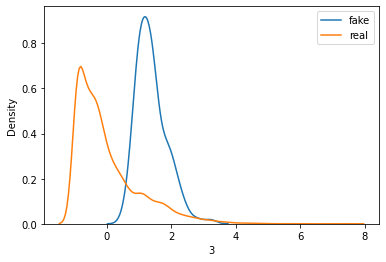

>Saved: drive/My Drive/Thesis/20201031-123736_g_model_00810.h5, and drive/My Drive/Thesis/20201031-123736_c_model_00810.h5


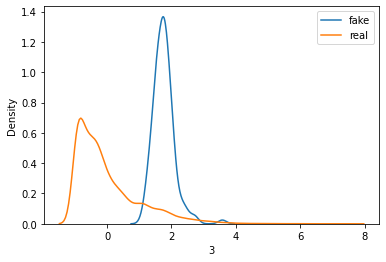

>Saved: drive/My Drive/Thesis/20201031-123844_g_model_01620.h5, and drive/My Drive/Thesis/20201031-123844_c_model_01620.h5


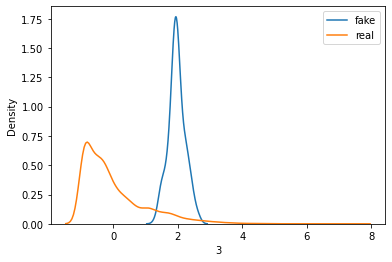

>Saved: drive/My Drive/Thesis/20201031-123952_g_model_02430.h5, and drive/My Drive/Thesis/20201031-123952_c_model_02430.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.988
60th percentile of preds: 0.174


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.39
                Age        Amount  ...    Purpose_X9           BAD
count  10400.000000  10400.000000  ...  10400.000000  10400.000000
mean       1.287354      0.736418  ...      0.393691      0.502596
std        0.275368      0.313393  ...      0.339428      0.500017
min        0.140354     -0.665806  ...     -0.799983      0.000000
25%        1.118048      0.537726  ...      0.181744      0.000000
50%        1.298466      0.753829  ...      0.394158      1.000000
75%        1.465057      0.948552  ...      0.588313      1.000000
max        2.540627      2.569444  ...      2.382484      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.974
60th percentile of preds: 0.332


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.977


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 37: 
tao: 0.02456359744028281
accepts: 110 with 0.03636363636363636% bad

> iteration 38: #accepts 4290
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_121 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_400 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_320 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_160 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_160 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_401 (Dense)            (None, 100)               10100     
__________

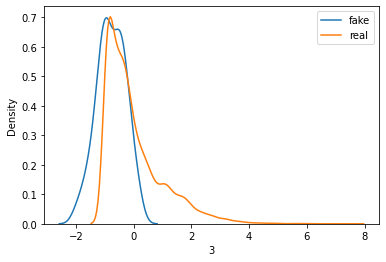

>Saved: drive/My Drive/Thesis/20201031-124132_g_model_00830.h5, and drive/My Drive/Thesis/20201031-124132_c_model_00830.h5


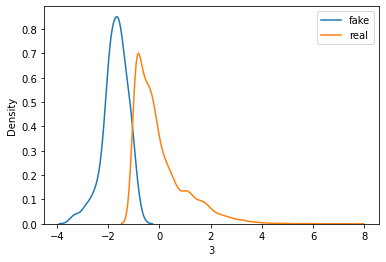

>Saved: drive/My Drive/Thesis/20201031-124241_g_model_01660.h5, and drive/My Drive/Thesis/20201031-124241_c_model_01660.h5


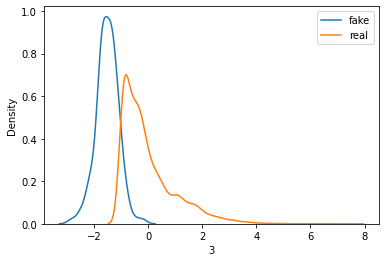

>Saved: drive/My Drive/Thesis/20201031-124353_g_model_02490.h5, and drive/My Drive/Thesis/20201031-124353_c_model_02490.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.988
60th percentile of preds: 0.957
60th percentile of preds: 0.996
                Age        Amount  ...    Purpose_X9           BAD
count  10675.000000  10675.000000  ...  10675.000000  10675.000000
mean      -1.065796     -0.052514  ...     -0.165964      0.493489
std        0.332926      0.427821  ...      0.365263      0.499981
min       -4.133279     -2.344968  ...     -1.629842      0.000000
25%       -1.261009     -0.293954  ...     -0.405210      0.000000
50%       -1.059960     -0.081260  ...     -0.147215      0.000000
75%       -0.843853      0.150293  ...      0.074563      1.000000
max        0.066086      2.567109  ...      1.292458      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.956
60th percentile of preds: 0.935
60th percentile of preds: 0.977


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 38: 
tao: 0.02495544181013303
accepts: 110 with 0.01818181818181818% bad

> iteration 39: #accepts 4400
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_124 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_410 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_328 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_164 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_164 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_411 (Dense)            (None, 100)               10100     
__________

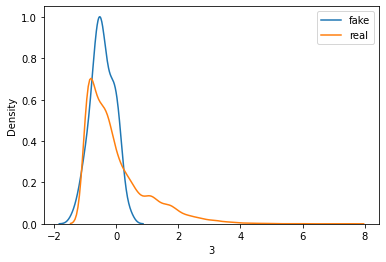

>Saved: drive/My Drive/Thesis/20201031-124534_g_model_00850.h5, and drive/My Drive/Thesis/20201031-124534_c_model_00850.h5


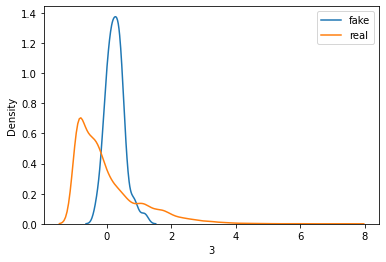

>Saved: drive/My Drive/Thesis/20201031-124646_g_model_01700.h5, and drive/My Drive/Thesis/20201031-124646_c_model_01700.h5


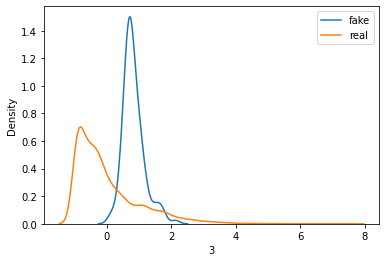

>Saved: drive/My Drive/Thesis/20201031-124757_g_model_02550.h5, and drive/My Drive/Thesis/20201031-124757_c_model_02550.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.988
60th percentile of preds: 0.407
60th percentile of preds: 0.771
                Age        Amount  ...    Purpose_X9           BAD
count  10950.000000  10950.000000  ...  10950.000000  10950.000000
mean       1.493730      0.800587  ...      0.060364      0.498539
std        0.310303      0.281725  ...      0.238772      0.500021
min        0.316871     -0.272852  ...     -1.562486      0.000000
25%        1.294306      0.620918  ...     -0.067794      0.000000
50%        1.478888      0.801883  ...      0.076816      0.000000
75%        1.683418      0.976367  ...      0.207327      1.000000
max        3.411618      2.179047  ...      1.248996      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.985
60th percentile of preds: 0.548
60th percentile of preds: 0.977


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 39: 
tao: 0.0249627828790882
accepts: 110 with 0.00909090909090909% bad

> iteration 40: #accepts 4510
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_127 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_420 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_336 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_168 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_168 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_421 (Dense)            (None, 100)               10100     
___________

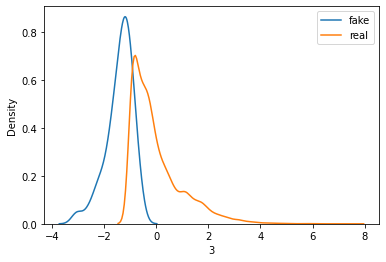

>Saved: drive/My Drive/Thesis/20201031-124938_g_model_00870.h5, and drive/My Drive/Thesis/20201031-124938_c_model_00870.h5


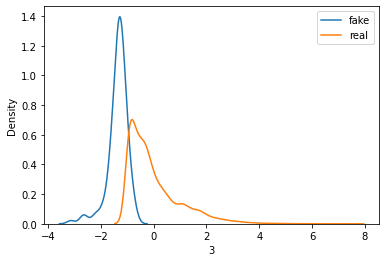

>Saved: drive/My Drive/Thesis/20201031-125050_g_model_01740.h5, and drive/My Drive/Thesis/20201031-125050_c_model_01740.h5


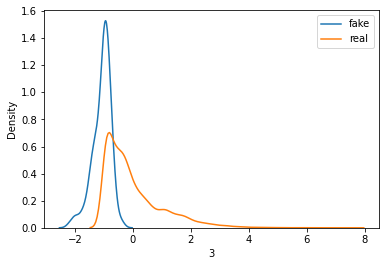

>Saved: drive/My Drive/Thesis/20201031-125203_g_model_02610.h5, and drive/My Drive/Thesis/20201031-125203_c_model_02610.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.988
60th percentile of preds: 0.711
60th percentile of preds: 0.946
                Age        Amount  ...    Purpose_X9           BAD
count  11225.000000  11225.000000  ...  11225.000000  11225.000000
mean      -0.018442     -0.258923  ...     -0.457678      0.509399
std        0.245840      0.263449  ...      0.235986      0.499934
min       -1.405697     -2.050739  ...     -2.664196      0.000000
25%       -0.164468     -0.449349  ...     -0.597271      0.000000
50%       -0.016193     -0.278258  ...     -0.468326      1.000000
75%        0.139906     -0.089396  ...     -0.322477      1.000000
max        1.035422      0.873093  ...      0.652618      1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.965


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.859
60th percentile of preds: 0.977


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 40: 
tao: 0.019720658329147264
accepts: 110 with 0.02727272727272727% bad

> iteration 41: #accepts 4620
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_130 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_430 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_344 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_172 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_172 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_431 (Dense)            (None, 100)               10100     
_________

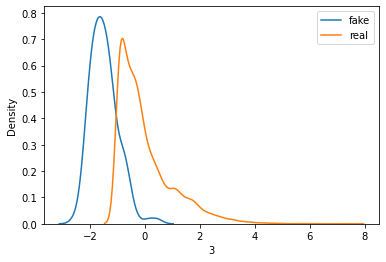

>Saved: drive/My Drive/Thesis/20201031-125352_g_model_00890.h5, and drive/My Drive/Thesis/20201031-125352_c_model_00890.h5


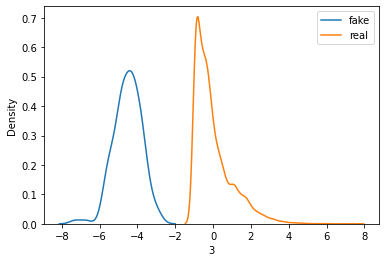

>Saved: drive/My Drive/Thesis/20201031-125507_g_model_01780.h5, and drive/My Drive/Thesis/20201031-125507_c_model_01780.h5


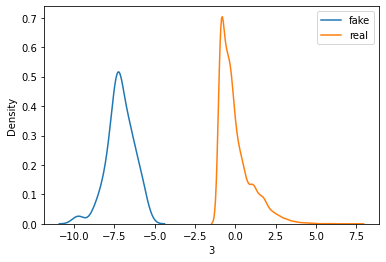

>Saved: drive/My Drive/Thesis/20201031-125621_g_model_02670.h5, and drive/My Drive/Thesis/20201031-125621_c_model_02670.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.987
60th percentile of preds: 0.998


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.997
                Age        Amount  ...    Purpose_X9           BAD
count  11500.000000  11500.000000  ...  11500.000000  11500.000000
mean      -2.782970     -0.707815  ...     -1.293978      0.503043
std        0.731670      0.410371  ...      0.417060      0.500012
min       -6.359825     -3.187742  ...     -3.291573      0.000000
25%       -3.285029     -0.969682  ...     -1.544575      0.000000
50%       -2.762125     -0.720153  ...     -1.259796      1.000000
75%       -2.275917     -0.455764  ...     -1.010314      1.000000
max       -0.525212      1.159926  ...      0.442592      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.973
60th percentile of preds: 0.99
60th percentile of preds: 0.977


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 41: 
tao: 0.026562232390173267
accepts: 110 with 0.0% bad

> iteration 42: #accepts 4730
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_133 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_440 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_352 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_176 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_176 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_441 (Dense)            (None, 100)               10100     
_________________________

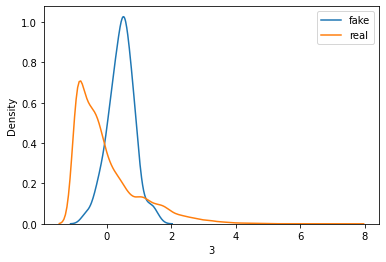

>Saved: drive/My Drive/Thesis/20201031-125804_g_model_00910.h5, and drive/My Drive/Thesis/20201031-125804_c_model_00910.h5


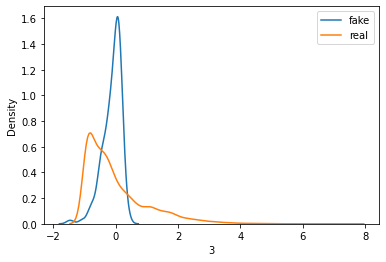

>Saved: drive/My Drive/Thesis/20201031-125921_g_model_01820.h5, and drive/My Drive/Thesis/20201031-125921_c_model_01820.h5


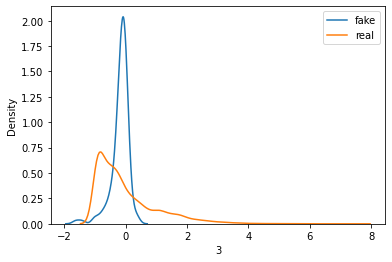

>Saved: drive/My Drive/Thesis/20201031-130036_g_model_02730.h5, and drive/My Drive/Thesis/20201031-130036_c_model_02730.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.988
60th percentile of preds: 0.629
60th percentile of preds: 0.941
                Age        Amount  ...    Purpose_X9           BAD
count  11775.000000  11775.000000  ...  11775.000000  11775.000000
mean       0.349130      0.139287  ...     -0.297964      0.507091
std        0.278492      0.195768  ...      0.247213      0.499971
min       -2.397622     -1.531758  ...     -2.078434      0.000000
25%        0.245987      0.052006  ...     -0.403233      0.000000
50%        0.360577      0.158637  ...     -0.306186      1.000000
75%        0.490234      0.259169  ...     -0.200565      1.000000
max        1.440448      1.054147  ...      1.750148      1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.982


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.897
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 42: 
tao: 0.021584150754377987
accepts: 110 with 0.0% bad

> iteration 43: #accepts 4840
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_136 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_450 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_360 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_180 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_180 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_451 (Dense)            (None, 100)               10100     
_________________________

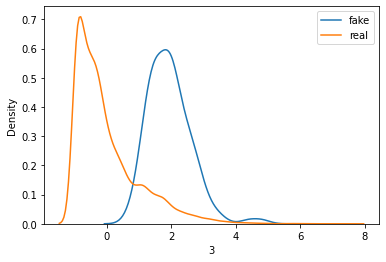

>Saved: drive/My Drive/Thesis/20201031-130232_g_model_00940.h5, and drive/My Drive/Thesis/20201031-130232_c_model_00940.h5


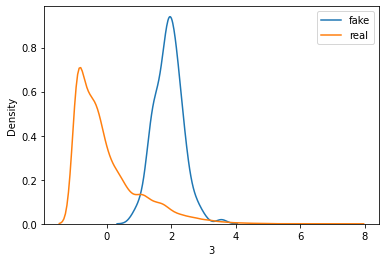

>Saved: drive/My Drive/Thesis/20201031-130351_g_model_01880.h5, and drive/My Drive/Thesis/20201031-130351_c_model_01880.h5


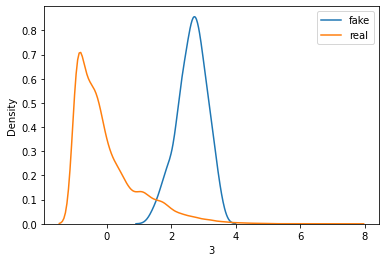

>Saved: drive/My Drive/Thesis/20201031-130509_g_model_02820.h5, and drive/My Drive/Thesis/20201031-130509_c_model_02820.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.988
60th percentile of preds: 0.145


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.41
                Age        Amount  ...    Purpose_X9           BAD
count  12050.000000  12050.000000  ...  12050.000000  12050.000000
mean       0.723668     -0.646843  ...      0.019139      0.506556
std        0.396032      0.439053  ...      0.274907      0.499978
min       -0.553497     -2.180104  ...     -1.328960      0.000000
25%        0.463541     -0.951369  ...     -0.135416      0.000000
50%        0.660383     -0.708285  ...      0.034262      1.000000
75%        0.912040     -0.387690  ...      0.195858      1.000000
max        3.439243      1.878947  ...      1.297595      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.978
60th percentile of preds: 0.35
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 43: 
tao: 0.03219032438515269
accepts: 110 with 0.01818181818181818% bad

> iteration 44: #accepts 4950
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_139 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_460 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_368 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_184 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_184 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_461 (Dense)            (None, 100)               10100     
__________

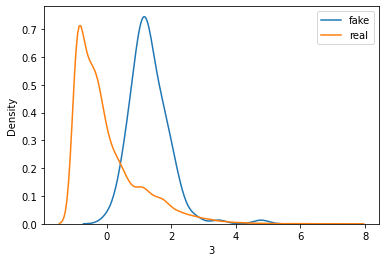

>Saved: drive/My Drive/Thesis/20201031-130703_g_model_00960.h5, and drive/My Drive/Thesis/20201031-130703_c_model_00960.h5


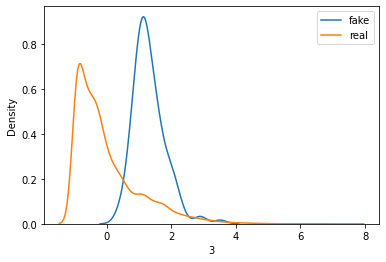

>Saved: drive/My Drive/Thesis/20201031-130822_g_model_01920.h5, and drive/My Drive/Thesis/20201031-130822_c_model_01920.h5


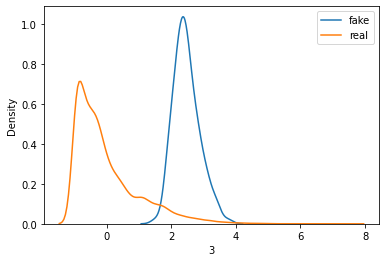

>Saved: drive/My Drive/Thesis/20201031-130942_g_model_02880.h5, and drive/My Drive/Thesis/20201031-130942_c_model_02880.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.988
60th percentile of preds: 0.156


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.415
                Age        Amount  ...    Purpose_X9           BAD
count  12325.000000  12325.000000  ...  12325.000000  12325.000000
mean       1.458326      0.403392  ...     -0.472292      0.501339
std        0.404631      0.362044  ...      0.220786      0.500018
min        0.230043     -1.206898  ...     -1.459103      0.000000
25%        1.196465      0.167463  ...     -0.615129      0.000000
50%        1.417353      0.417161  ...     -0.485123      1.000000
75%        1.662592      0.642746  ...     -0.343413      1.000000
max        4.992107      1.966641  ...      0.654757      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.975
60th percentile of preds: 0.346


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.977


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 44: 
tao: 0.024625014564865245
accepts: 110 with 0.02727272727272727% bad

> iteration 45: #accepts 5060
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_142 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_470 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_376 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_188 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_188 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_471 (Dense)            (None, 100)               10100     
_________

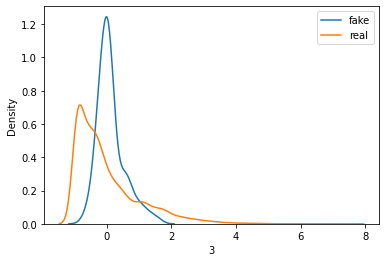

>Saved: drive/My Drive/Thesis/20201031-131139_g_model_00980.h5, and drive/My Drive/Thesis/20201031-131139_c_model_00980.h5


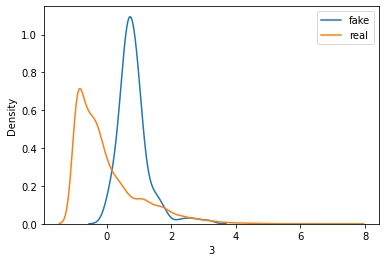

>Saved: drive/My Drive/Thesis/20201031-131301_g_model_01960.h5, and drive/My Drive/Thesis/20201031-131301_c_model_01960.h5


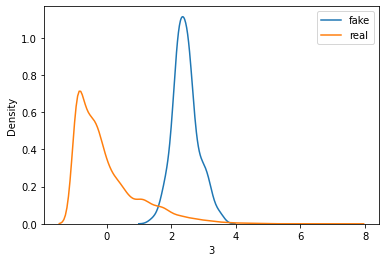

>Saved: drive/My Drive/Thesis/20201031-131422_g_model_02940.h5, and drive/My Drive/Thesis/20201031-131422_c_model_02940.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.987
60th percentile of preds: 0.135


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.371
                Age        Amount  ...    Purpose_X9           BAD
count  12600.000000  12600.000000  ...  12600.000000  12600.000000
mean       1.956682      1.373130  ...      0.177523      0.495159
std        0.391537      0.293976  ...      0.244482      0.499996
min        0.769276     -0.307747  ...     -0.674370      0.000000
25%        1.701601      1.227283  ...      0.030174      0.000000
50%        1.929606      1.368571  ...      0.143837      0.000000
75%        2.165780      1.519998  ...      0.292859      1.000000
max        5.101276      3.851640  ...      1.949947      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.976
60th percentile of preds: 0.345
60th percentile of preds: 0.977


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 45: 
tao: 0.02181523159853719
accepts: 110 with 0.00909090909090909% bad

> iteration 46: #accepts 5170
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_145 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_480 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_384 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_192 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_192 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_481 (Dense)            (None, 100)               10100     
__________

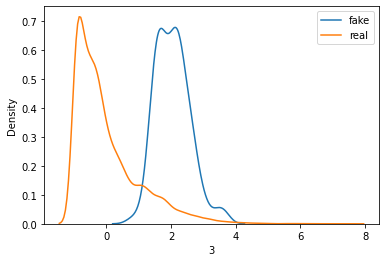

>Saved: drive/My Drive/Thesis/20201031-131617_g_model_01000.h5, and drive/My Drive/Thesis/20201031-131617_c_model_01000.h5


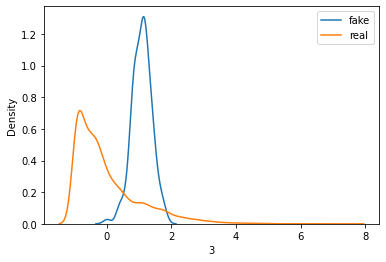

>Saved: drive/My Drive/Thesis/20201031-131740_g_model_02000.h5, and drive/My Drive/Thesis/20201031-131740_c_model_02000.h5


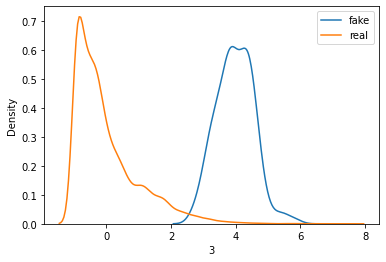

>Saved: drive/My Drive/Thesis/20201031-131904_g_model_03000.h5, and drive/My Drive/Thesis/20201031-131904_c_model_03000.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.986
60th percentile of preds: 0.162


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.358
                Age        Amount  ...    Purpose_X9           BAD
count  12875.000000  12875.000000  ...  12875.000000  12875.000000
mean       1.566946     -0.057407  ...      1.375841      0.503146
std        0.341240      0.303962  ...      0.265886      0.500010
min        0.514524     -2.280210  ...      0.246522      0.000000
25%        1.341575     -0.246568  ...      1.198118      0.000000
50%        1.542185     -0.039582  ...      1.363829      1.000000
75%        1.764577      0.151671  ...      1.542226      1.000000
max        3.799635      1.230850  ...      2.869729      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.977
60th percentile of preds: 0.341
60th percentile of preds: 0.977


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 46: 
tao: 0.02316785872721884
accepts: 110 with 0.00909090909090909% bad

> iteration 47: #accepts 5280
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_148 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_490 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_392 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_196 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_196 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_491 (Dense)            (None, 100)               10100     
__________

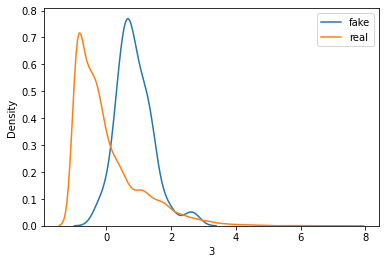

>Saved: drive/My Drive/Thesis/20201031-132058_g_model_01020.h5, and drive/My Drive/Thesis/20201031-132058_c_model_01020.h5


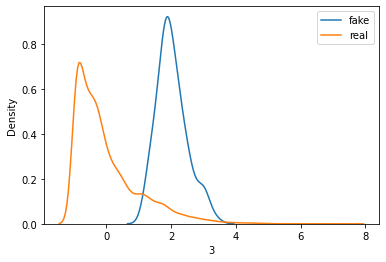

>Saved: drive/My Drive/Thesis/20201031-132222_g_model_02040.h5, and drive/My Drive/Thesis/20201031-132222_c_model_02040.h5


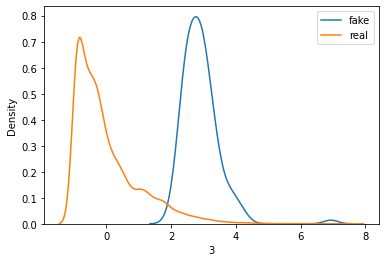

>Saved: drive/My Drive/Thesis/20201031-132346_g_model_03060.h5, and drive/My Drive/Thesis/20201031-132346_c_model_03060.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.986
60th percentile of preds: 0.089


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.373
                Age        Amount  ...    Purpose_X9           BAD
count  13150.000000  13150.000000  ...  13150.000000  13150.000000
mean       2.120798      1.135455  ...     -0.754835      0.504183
std        0.492884      0.292303  ...      0.309956      0.500002
min        0.534835      0.284954  ...     -2.910992      0.000000
25%        1.787154      0.943174  ...     -0.943009      0.000000
50%        2.070038      1.119802  ...     -0.745451      1.000000
75%        2.381788      1.297468  ...     -0.553607      1.000000
max        5.281385      3.117291  ...      0.826051      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.983
60th percentile of preds: 0.346
60th percentile of preds: 0.977


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 47: 
tao: 0.027441189452202315
accepts: 110 with 0.0% bad

> iteration 48: #accepts 5390
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_151 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_500 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_400 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_200 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_200 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_501 (Dense)            (None, 100)               10100     
_________________________

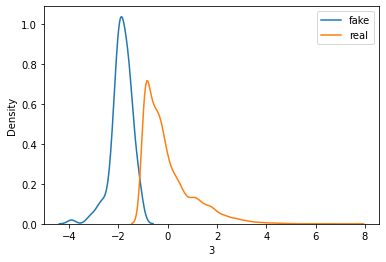

>Saved: drive/My Drive/Thesis/20201031-132547_g_model_01040.h5, and drive/My Drive/Thesis/20201031-132547_c_model_01040.h5


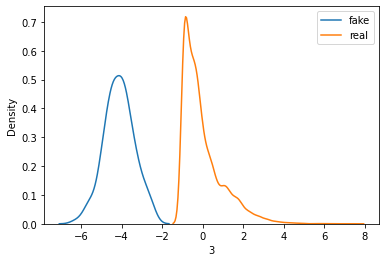

>Saved: drive/My Drive/Thesis/20201031-132716_g_model_02080.h5, and drive/My Drive/Thesis/20201031-132716_c_model_02080.h5


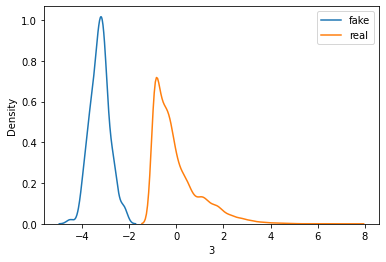

>Saved: drive/My Drive/Thesis/20201031-132845_g_model_03120.h5, and drive/My Drive/Thesis/20201031-132845_c_model_03120.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.987
60th percentile of preds: 0.997


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.997
                Age        Amount  ...    Purpose_X9           BAD
count  13425.000000  13425.000000  ...  13425.000000  13425.000000
mean      -2.980344      0.576349  ...      1.172960      0.506443
std        0.459472      0.596653  ...      0.373717      0.499977
min       -5.939713     -1.563747  ...      0.038954      0.000000
25%       -3.284352      0.179578  ...      0.942218      0.000000
50%       -2.979198      0.600446  ...      1.107542      1.000000
75%       -2.677732      0.934833  ...      1.340863      1.000000
max       -1.164800      3.513072  ...      3.911307      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.974
60th percentile of preds: 0.989
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 48: 
tao: 0.0229030147909347
accepts: 110 with 0.01818181818181818% bad

> iteration 49: #accepts 5500
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_154 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_510 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_408 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_204 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_204 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_511 (Dense)            (None, 100)               10100     
___________

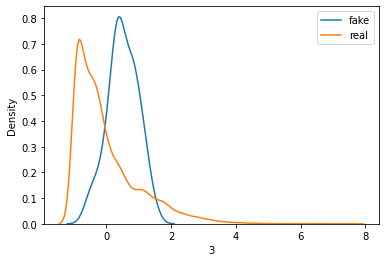

>Saved: drive/My Drive/Thesis/20201031-133049_g_model_01070.h5, and drive/My Drive/Thesis/20201031-133049_c_model_01070.h5


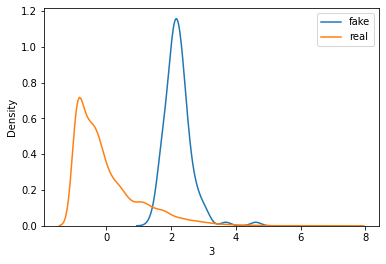

>Saved: drive/My Drive/Thesis/20201031-133221_g_model_02140.h5, and drive/My Drive/Thesis/20201031-133221_c_model_02140.h5


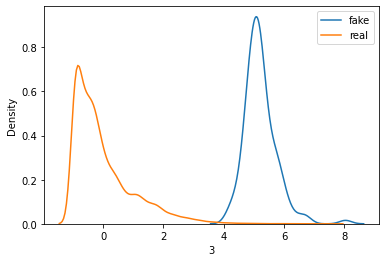

>Saved: drive/My Drive/Thesis/20201031-133351_g_model_03210.h5, and drive/My Drive/Thesis/20201031-133351_c_model_03210.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.987
60th percentile of preds: 0.075


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.363
                Age        Amount  ...    Purpose_X9           BAD
count  13700.000000  13700.000000  ...  13700.000000  13700.000000
mean       1.889547     -1.243776  ...      0.230021      0.493796
std        0.350704      0.325498  ...      0.248252      0.499980
min        0.566648     -3.368601  ...     -0.700376      0.000000
25%        1.687555     -1.453895  ...      0.085011      0.000000
50%        1.900113     -1.242308  ...      0.222446      0.000000
75%        2.081072     -1.036528  ...      0.359652      1.000000
max        5.501548     -0.032639  ...      1.874706      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.978
60th percentile of preds: 0.336
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 49: 
tao: 0.021364581470380527
accepts: 110 with 0.0% bad

> iteration 50: #accepts 5610
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_157 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_520 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_416 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_208 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_208 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_521 (Dense)            (None, 100)               10100     
_________________________

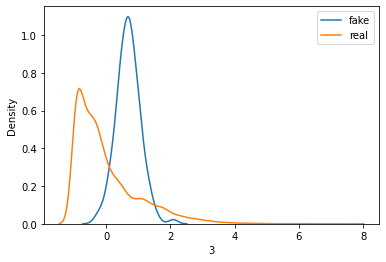

>Saved: drive/My Drive/Thesis/20201031-133554_g_model_01090.h5, and drive/My Drive/Thesis/20201031-133554_c_model_01090.h5


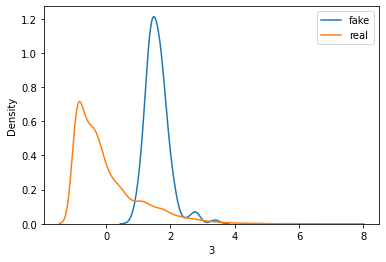

>Saved: drive/My Drive/Thesis/20201031-133725_g_model_02180.h5, and drive/My Drive/Thesis/20201031-133725_c_model_02180.h5


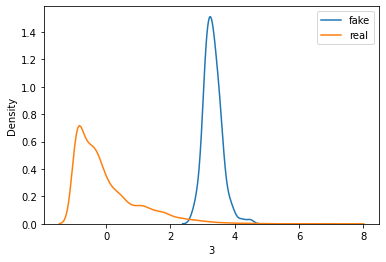

>Saved: drive/My Drive/Thesis/20201031-133856_g_model_03270.h5, and drive/My Drive/Thesis/20201031-133856_c_model_03270.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.987
60th percentile of preds: 0.122


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.404
                Age        Amount  ...    Purpose_X9           BAD
count  13975.000000  13975.000000  ...  13975.000000  13975.000000
mean       2.853061     -0.011164  ...      0.428188      0.494454
std        0.284977      0.252330  ...      0.328867      0.499987
min        1.682746     -0.909072  ...     -0.716334      0.000000
25%        2.685484     -0.175959  ...      0.242404      0.000000
50%        2.852091     -0.033809  ...      0.453023      0.000000
75%        3.017053      0.130084  ...      0.614232      1.000000
max        5.246636      1.654586  ...      2.170393      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.989
60th percentile of preds: 0.327
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 50: 
tao: 0.02130882857586113
accepts: 110 with 0.01818181818181818% bad

> iteration 51: #accepts 5720
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_160 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_530 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_424 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_212 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_212 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_531 (Dense)            (None, 100)               10100     
__________

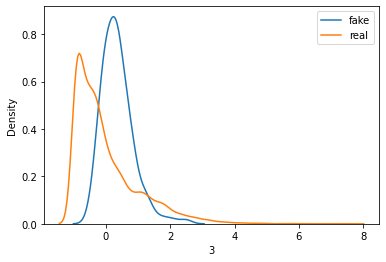

>Saved: drive/My Drive/Thesis/20201031-134109_g_model_01110.h5, and drive/My Drive/Thesis/20201031-134109_c_model_01110.h5


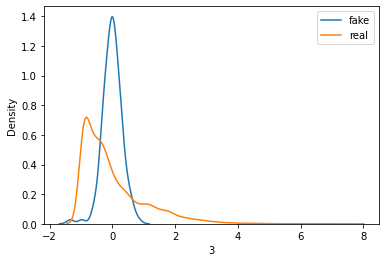

>Saved: drive/My Drive/Thesis/20201031-134242_g_model_02220.h5, and drive/My Drive/Thesis/20201031-134242_c_model_02220.h5


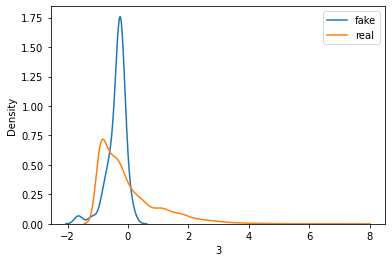

>Saved: drive/My Drive/Thesis/20201031-134415_g_model_03330.h5, and drive/My Drive/Thesis/20201031-134415_c_model_03330.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.987
60th percentile of preds: 0.706
60th percentile of preds: 0.947
                Age        Amount  ...    Purpose_X9           BAD
count  14250.000000  14250.000000  ...  14250.000000  14250.000000
mean      -0.227571      0.005315  ...     -0.522899      0.500912
std        0.209102      0.239602  ...      0.197584      0.500017
min       -2.070369     -1.625760  ...     -2.038471      0.000000
25%       -0.320506     -0.121634  ...     -0.645148      0.000000
50%       -0.207788      0.046046  ...     -0.522009      1.000000
75%       -0.097744      0.184552  ...     -0.389852      1.000000
max        0.399699      0.525258  ...      0.198775      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.973
60th percentile of preds: 0.878


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 51: 
tao: 0.02421554300974859
accepts: 110 with 0.03636363636363636% bad

> iteration 52: #accepts 5830
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_163 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_540 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_432 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_216 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_216 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_541 (Dense)            (None, 100)               10100     
__________

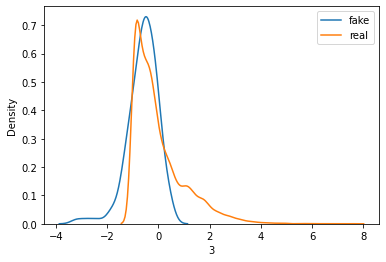

>Saved: drive/My Drive/Thesis/20201031-134638_g_model_01130.h5, and drive/My Drive/Thesis/20201031-134638_c_model_01130.h5


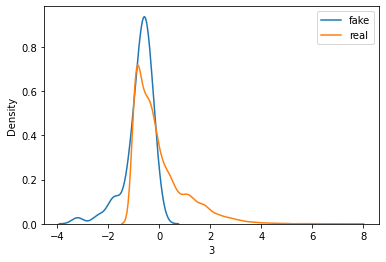

>Saved: drive/My Drive/Thesis/20201031-134812_g_model_02260.h5, and drive/My Drive/Thesis/20201031-134812_c_model_02260.h5


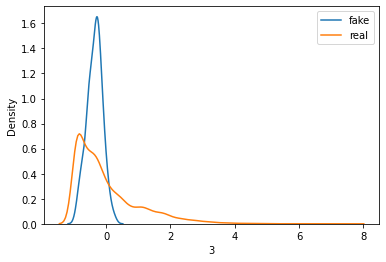

>Saved: drive/My Drive/Thesis/20201031-134947_g_model_03390.h5, and drive/My Drive/Thesis/20201031-134947_c_model_03390.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.986
60th percentile of preds: 0.71
60th percentile of preds: 0.935
                Age        Amount  ...    Purpose_X9           BAD
count  14525.000000  14525.000000  ...  14525.000000  14525.000000
mean      -0.735642      0.888622  ...      0.121959      0.504716
std        0.236583      0.317197  ...      0.234130      0.499995
min       -1.663495     -0.223780  ...     -1.254081      0.000000
25%       -0.882848      0.713796  ...      0.000696      0.000000
50%       -0.735902      0.866512  ...      0.128340      1.000000
75%       -0.605961      1.005509  ...      0.256555      1.000000
max        0.438664      3.538103  ...      1.255555      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.97
60th percentile of preds: 0.859
60th percentile of preds: 0.977


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 52: 
tao: 0.04056878757737348
accepts: 110 with 0.01818181818181818% bad

> iteration 53: #accepts 5940
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_166 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_550 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_440 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_220 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_220 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_551 (Dense)            (None, 100)               10100     
__________

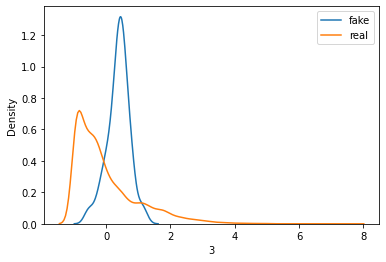

>Saved: drive/My Drive/Thesis/20201031-135156_g_model_01150.h5, and drive/My Drive/Thesis/20201031-135156_c_model_01150.h5


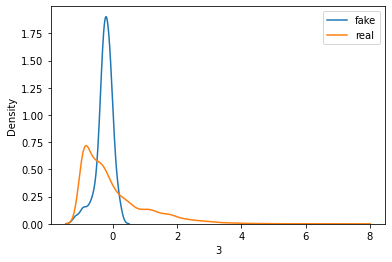

>Saved: drive/My Drive/Thesis/20201031-135330_g_model_02300.h5, and drive/My Drive/Thesis/20201031-135330_c_model_02300.h5


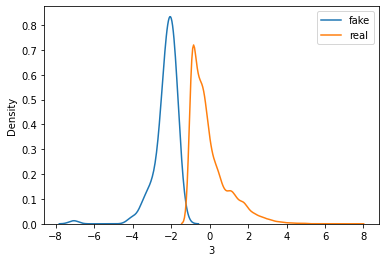

>Saved: drive/My Drive/Thesis/20201031-135505_g_model_03450.h5, and drive/My Drive/Thesis/20201031-135505_c_model_03450.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.987
60th percentile of preds: 0.978
60th percentile of preds: 0.996
                Age        Amount  ...    Purpose_X9           BAD
count  14800.000000  14800.000000  ...  14800.000000  14800.000000
mean      -0.807556     -0.143273  ...      0.770973      0.503716
std        0.376821      0.292992  ...      0.246848      0.500003
min       -3.751553     -1.557773  ...     -0.247026      0.000000
25%       -0.935378     -0.328920  ...      0.611905      0.000000
50%       -0.751644     -0.173492  ...      0.769842      1.000000
75%       -0.589528      0.042053  ...      0.904758      1.000000
max        0.181973      0.770025  ...      2.788971      1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.991


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.955
60th percentile of preds: 0.977


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 53: 
tao: 0.02841610931524012
accepts: 110 with 0.00909090909090909% bad

> iteration 54: #accepts 6050
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_169 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_560 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_448 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_224 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_224 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_561 (Dense)            (None, 100)               10100     
__________

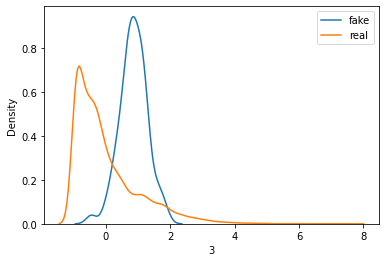

>Saved: drive/My Drive/Thesis/20201031-135731_g_model_01170.h5, and drive/My Drive/Thesis/20201031-135731_c_model_01170.h5


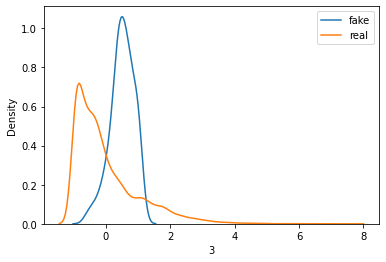

>Saved: drive/My Drive/Thesis/20201031-135909_g_model_02340.h5, and drive/My Drive/Thesis/20201031-135909_c_model_02340.h5


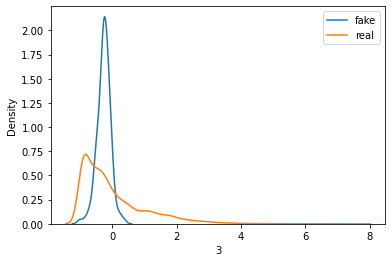

>Saved: drive/My Drive/Thesis/20201031-140047_g_model_03510.h5, and drive/My Drive/Thesis/20201031-140047_c_model_03510.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.987
60th percentile of preds: 0.748
60th percentile of preds: 0.953
                Age        Amount  ...    Purpose_X9           BAD
count  15075.000000  15075.000000  ...  15075.000000  15075.000000
mean      -0.947038      0.562128  ...     -0.240951      0.503682
std        0.219747      0.186955  ...      0.163008      0.500003
min       -2.417809     -0.220872  ...     -1.404086      0.000000
25%       -1.037545      0.458553  ...     -0.343598      0.000000
50%       -0.918819      0.565333  ...     -0.234199      1.000000
75%       -0.827321      0.660404  ...     -0.128072      1.000000
max        0.022401      1.880023  ...      0.489208      1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.968
60th percentile of preds: 0.892
60th percentile of preds: 0.977


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 54: 
tao: 0.025344023279760333
accepts: 110 with 0.00909090909090909% bad

> iteration 55: #accepts 6160
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_172 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_570 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_456 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_228 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_228 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_571 (Dense)            (None, 100)               10100     
_________

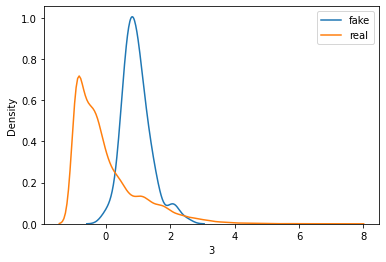

>Saved: drive/My Drive/Thesis/20201031-140308_g_model_01190.h5, and drive/My Drive/Thesis/20201031-140308_c_model_01190.h5


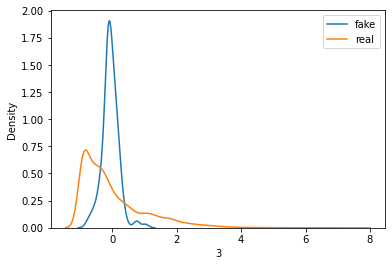

>Saved: drive/My Drive/Thesis/20201031-140446_g_model_02380.h5, and drive/My Drive/Thesis/20201031-140446_c_model_02380.h5


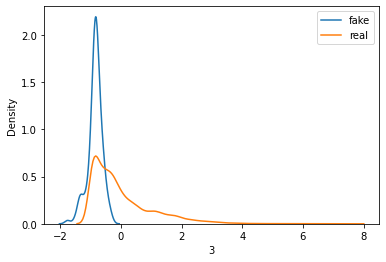

>Saved: drive/My Drive/Thesis/20201031-140625_g_model_03570.h5, and drive/My Drive/Thesis/20201031-140625_c_model_03570.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.987
60th percentile of preds: 0.8
60th percentile of preds: 0.954
                Age        Amount  ...    Purpose_X9           BAD
count  15350.000000  15350.000000  ...  15350.000000  15350.000000
mean      -0.280106      0.629771  ...     -0.355442      0.500977
std        0.178657      0.261741  ...      0.160562      0.500015
min       -1.202674     -1.246676  ...     -1.151453      0.000000
25%       -0.387369      0.509328  ...     -0.457789      0.000000
50%       -0.273915      0.615662  ...     -0.353112      1.000000
75%       -0.173963      0.738511  ...     -0.260674      1.000000
max        0.304146      2.434593  ...      0.648923      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.973


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.858
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 55: 
tao: 0.03595781538892055
accepts: 110 with 0.00909090909090909% bad

> iteration 56: #accepts 6270
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_175 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_580 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_464 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_232 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_232 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_581 (Dense)            (None, 100)               10100     
__________

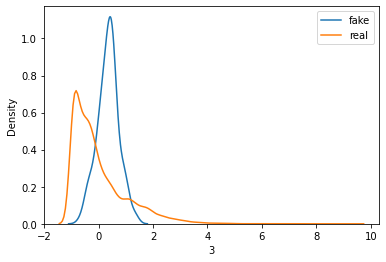

>Saved: drive/My Drive/Thesis/20201031-140858_g_model_01220.h5, and drive/My Drive/Thesis/20201031-140858_c_model_01220.h5


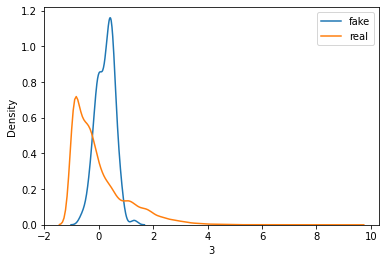

>Saved: drive/My Drive/Thesis/20201031-141043_g_model_02440.h5, and drive/My Drive/Thesis/20201031-141043_c_model_02440.h5


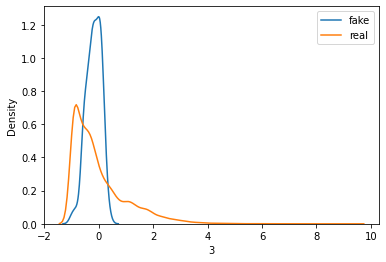

>Saved: drive/My Drive/Thesis/20201031-141226_g_model_03660.h5, and drive/My Drive/Thesis/20201031-141226_c_model_03660.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.987
60th percentile of preds: 0.818
60th percentile of preds: 0.963
                Age        Amount  ...    Purpose_X9           BAD
count  15625.000000  15625.000000  ...  15625.000000  15625.000000
mean      -0.476143      0.585125  ...      0.412154      0.496448
std        0.190691      0.264800  ...      0.208019      0.500003
min       -1.761401     -0.280350  ...     -1.065350      0.000000
25%       -0.582249      0.403396  ...      0.283761      0.000000
50%       -0.461962      0.556950  ...      0.390118      0.000000
75%       -0.344386      0.723808  ...      0.522882      1.000000
max        0.165102      2.506146  ...      1.563652      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.983
60th percentile of preds: 0.886


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 56: 
tao: 0.033660973970502134
accepts: 110 with 0.01818181818181818% bad

> iteration 57: #accepts 6380
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_178 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_590 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_472 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_236 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_236 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_591 (Dense)            (None, 100)               10100     
_________

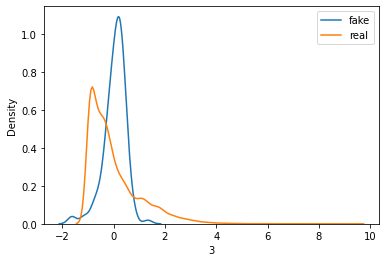

>Saved: drive/My Drive/Thesis/20201031-141454_g_model_01240.h5, and drive/My Drive/Thesis/20201031-141454_c_model_01240.h5


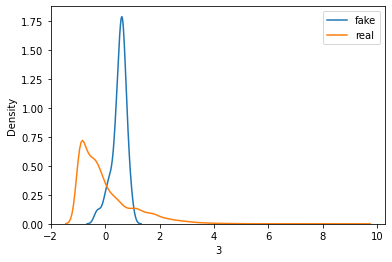

>Saved: drive/My Drive/Thesis/20201031-141637_g_model_02480.h5, and drive/My Drive/Thesis/20201031-141637_c_model_02480.h5


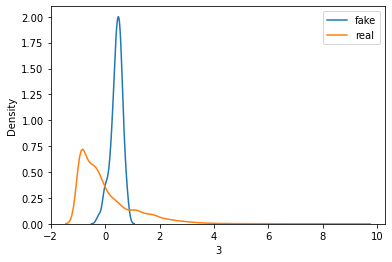

>Saved: drive/My Drive/Thesis/20201031-141821_g_model_03720.h5, and drive/My Drive/Thesis/20201031-141821_c_model_03720.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.987
60th percentile of preds: 0.651
60th percentile of preds: 0.925
                Age        Amount  ...    Purpose_X9           BAD
count  15900.000000  15900.000000  ...  15900.000000  15900.000000
mean      -0.085636      0.154707  ...     -0.141852      0.507799
std        0.210331      0.198324  ...      0.227200      0.499955
min       -1.546039     -1.682279  ...     -2.273612      0.000000
25%       -0.184637      0.078979  ...     -0.214593      0.000000
50%       -0.058337      0.162645  ...     -0.100621      1.000000
75%        0.051007      0.252449  ...     -0.017209      1.000000
max        0.629603      1.057926  ...      0.505873      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.953
60th percentile of preds: 0.785


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 57: 
tao: 0.026064972465695203
accepts: 110 with 0.00909090909090909% bad

> iteration 58: #accepts 6490
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_181 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_600 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_480 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_240 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_240 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_601 (Dense)            (None, 100)               10100     
_________

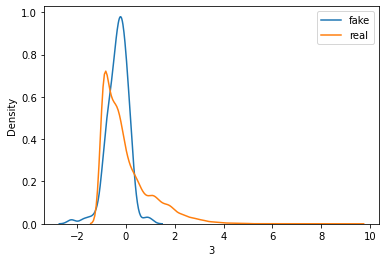

>Saved: drive/My Drive/Thesis/20201031-142054_g_model_01260.h5, and drive/My Drive/Thesis/20201031-142054_c_model_01260.h5


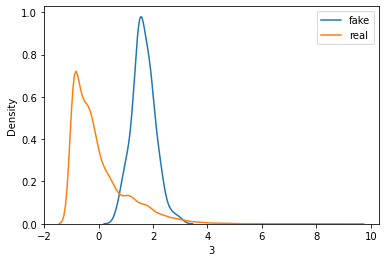

>Saved: drive/My Drive/Thesis/20201031-142240_g_model_02520.h5, and drive/My Drive/Thesis/20201031-142240_c_model_02520.h5


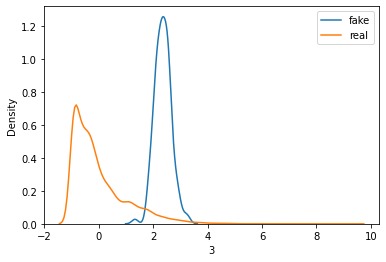

>Saved: drive/My Drive/Thesis/20201031-142425_g_model_03780.h5, and drive/My Drive/Thesis/20201031-142425_c_model_03780.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.987
60th percentile of preds: 0.21
60th percentile of preds: 0.444
                Age        Amount  ...    Purpose_X9           BAD
count  16175.000000  16175.000000  ...  16175.000000  16175.000000
mean       2.071558     -0.199047  ...     -0.215881      0.505595
std        0.279827      0.210344  ...      0.247468      0.499984
min        1.050929     -1.090936  ...     -1.566973      0.000000
25%        1.900389     -0.325398  ...     -0.365082      0.000000
50%        2.059564     -0.197939  ...     -0.225729      1.000000
75%        2.218038     -0.067427  ...     -0.063785      1.000000
max        4.886340      0.914657  ...      1.041103      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.987
60th percentile of preds: 0.35
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 58: 
tao: 0.031176042587917258
accepts: 110 with 0.00909090909090909% bad

> iteration 59: #accepts 6600
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_184 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_610 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_488 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_244 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_244 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_611 (Dense)            (None, 100)               10100     
_________

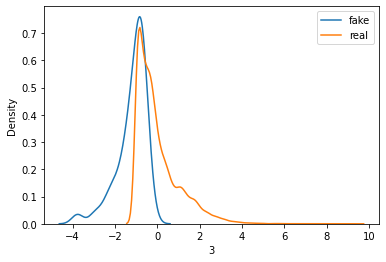

>Saved: drive/My Drive/Thesis/20201031-142656_g_model_01280.h5, and drive/My Drive/Thesis/20201031-142656_c_model_01280.h5


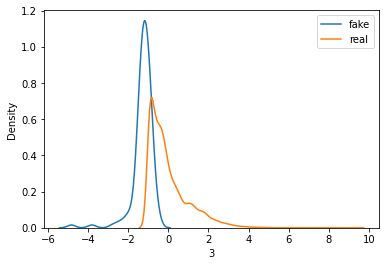

>Saved: drive/My Drive/Thesis/20201031-142845_g_model_02560.h5, and drive/My Drive/Thesis/20201031-142845_c_model_02560.h5


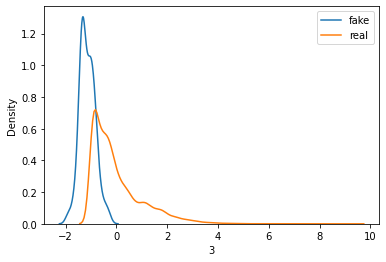

>Saved: drive/My Drive/Thesis/20201031-143033_g_model_03840.h5, and drive/My Drive/Thesis/20201031-143033_c_model_03840.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.987
60th percentile of preds: 0.944
60th percentile of preds: 0.99
                Age        Amount  ...    Purpose_X9           BAD
count  16450.000000  16450.000000  ...  16450.000000  16450.000000
mean      -0.331963     -0.459453  ...      0.001416      0.491429
std        0.334744      0.425021  ...      0.261641      0.499942
min       -3.512975     -1.876824  ...     -0.975164      0.000000
25%       -0.457016     -0.728140  ...     -0.165550      0.000000
50%       -0.295042     -0.524803  ...     -0.042471      0.000000
75%       -0.139174     -0.259550  ...      0.120852      1.000000
max        0.629463      2.700973  ...      1.604096      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.975
60th percentile of preds: 0.943
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 59: 
tao: 0.0326205972574662
accepts: 110 with 0.0% bad

> iteration 60: #accepts 6710
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_187 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_620 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_496 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_248 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_248 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_621 (Dense)            (None, 100)               10100     
___________________________

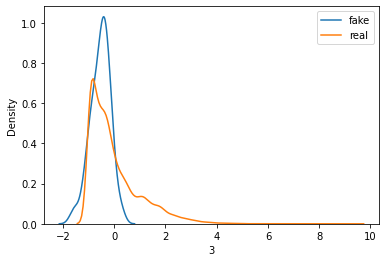

>Saved: drive/My Drive/Thesis/20201031-143302_g_model_01300.h5, and drive/My Drive/Thesis/20201031-143302_c_model_01300.h5


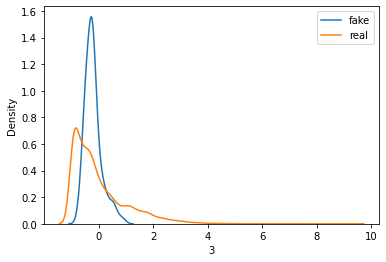

>Saved: drive/My Drive/Thesis/20201031-143451_g_model_02600.h5, and drive/My Drive/Thesis/20201031-143451_c_model_02600.h5


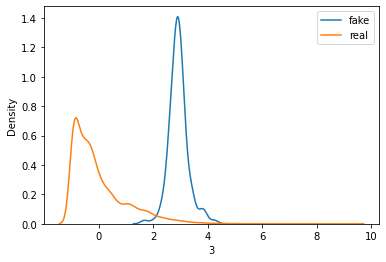

>Saved: drive/My Drive/Thesis/20201031-143640_g_model_03900.h5, and drive/My Drive/Thesis/20201031-143640_c_model_03900.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.987
60th percentile of preds: 0.195


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.389
                Age        Amount  ...    Purpose_X9           BAD
count  16725.000000  16725.000000  ...  16725.000000  16725.000000
mean       1.904259     -0.308302  ...     -0.582515      0.503677
std        0.228730      0.275421  ...      0.171877      0.500001
min        1.124632     -1.879021  ...     -1.824266      0.000000
25%        1.750538     -0.466077  ...     -0.672911      0.000000
50%        1.889557     -0.274134  ...     -0.576852      1.000000
75%        2.040264     -0.117859  ...     -0.478007      1.000000
max        3.191994      0.653743  ...      0.097911      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.978
60th percentile of preds: 0.351
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 60: 
tao: 0.03371696121211454
accepts: 110 with 0.00909090909090909% bad

> iteration 61: #accepts 6820
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_190 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_630 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_504 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_252 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_252 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_631 (Dense)            (None, 100)               10100     
__________

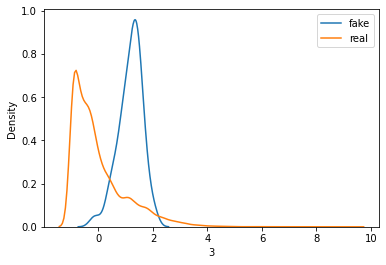

>Saved: drive/My Drive/Thesis/20201031-143922_g_model_01320.h5, and drive/My Drive/Thesis/20201031-143922_c_model_01320.h5


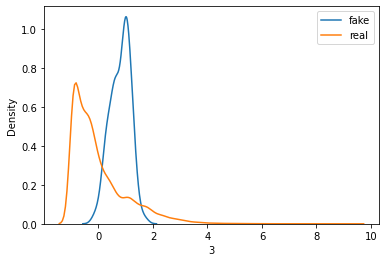

>Saved: drive/My Drive/Thesis/20201031-144112_g_model_02640.h5, and drive/My Drive/Thesis/20201031-144112_c_model_02640.h5


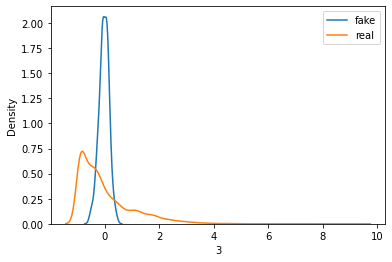

>Saved: drive/My Drive/Thesis/20201031-144303_g_model_03960.h5, and drive/My Drive/Thesis/20201031-144303_c_model_03960.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.987
60th percentile of preds: 0.676
60th percentile of preds: 0.952
                Age        Amount  ...    Purpose_X9           BAD
count  17000.000000  17000.000000  ...  17000.000000  17000.000000
mean      -0.359909     -0.306970  ...      0.736118      0.499765
std        0.152018      0.220012  ...      0.168629      0.500015
min       -1.307525     -1.701390  ...     -0.178589      0.000000
25%       -0.441517     -0.431570  ...      0.623487      0.000000
50%       -0.346201     -0.288737  ...      0.738292      0.000000
75%       -0.261537     -0.151552  ...      0.848295      1.000000
max        0.260198      0.325657  ...      1.603544      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.971
60th percentile of preds: 0.881
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 61: 
tao: 0.03423075115154485
accepts: 110 with 0.00909090909090909% bad

> iteration 62: #accepts 6930
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_193 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_640 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_512 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_256 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_256 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_641 (Dense)            (None, 100)               10100     
__________

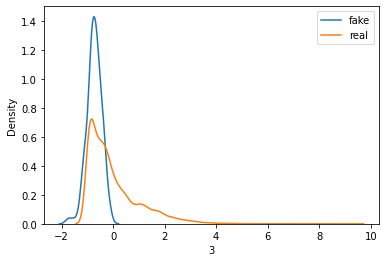

>Saved: drive/My Drive/Thesis/20201031-144541_g_model_01340.h5, and drive/My Drive/Thesis/20201031-144541_c_model_01340.h5


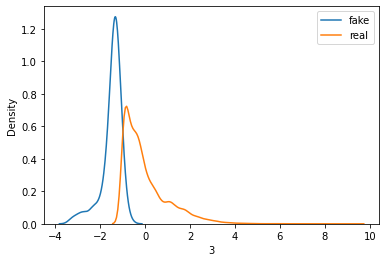

>Saved: drive/My Drive/Thesis/20201031-144732_g_model_02680.h5, and drive/My Drive/Thesis/20201031-144732_c_model_02680.h5


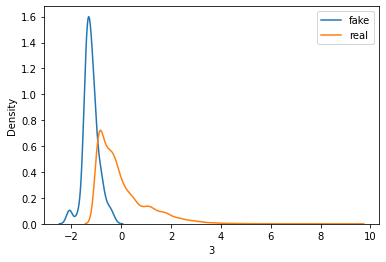

>Saved: drive/My Drive/Thesis/20201031-144920_g_model_04020.h5, and drive/My Drive/Thesis/20201031-144920_c_model_04020.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.987
60th percentile of preds: 0.96
60th percentile of preds: 0.994
                Age        Amount  ...    Purpose_X9           BAD
count  17275.000000  17275.000000  ...  17275.000000  17275.000000
mean      -1.162110      0.484146  ...     -0.561977      0.503560
std        0.263180      0.304619  ...      0.301442      0.500002
min       -3.493919     -1.046353  ...     -2.086368      0.000000
25%       -1.309679      0.290523  ...     -0.759688      0.000000
50%       -1.150315      0.502339  ...     -0.575357      1.000000
75%       -0.994538      0.686372  ...     -0.358613      1.000000
max       -0.112749      1.527823  ...      0.574091      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.974
60th percentile of preds: 0.943
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 62: 
tao: 0.030429931796349095
accepts: 110 with 0.03636363636363636% bad

> iteration 63: #accepts 7040
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_196 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_650 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_520 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_260 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_260 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_651 (Dense)            (None, 100)               10100     
_________

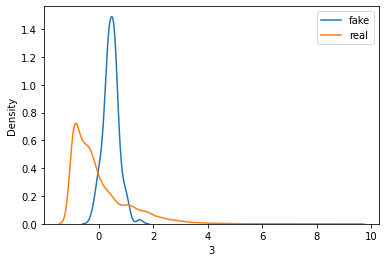

>Saved: drive/My Drive/Thesis/20201031-145150_g_model_01370.h5, and drive/My Drive/Thesis/20201031-145150_c_model_01370.h5


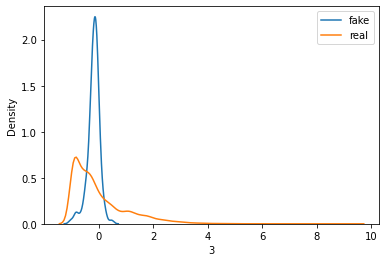

>Saved: drive/My Drive/Thesis/20201031-145344_g_model_02740.h5, and drive/My Drive/Thesis/20201031-145344_c_model_02740.h5


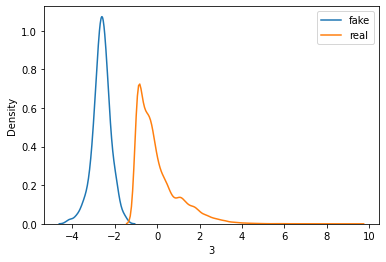

>Saved: drive/My Drive/Thesis/20201031-145538_g_model_04110.h5, and drive/My Drive/Thesis/20201031-145538_c_model_04110.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.986
60th percentile of preds: 0.971
60th percentile of preds: 0.996
                Age        Amount  ...    Purpose_X9           BAD
count  17550.000000  17550.000000  ...  17550.000000  17550.000000
mean      -1.902171     -0.238403  ...      0.187898      0.501425
std        0.331030      0.225308  ...      0.206967      0.500012
min       -4.914841     -1.859961  ...     -0.678703      0.000000
25%       -2.043844     -0.363907  ...      0.050026      0.000000
50%       -1.865804     -0.237087  ...      0.177390      1.000000
75%       -1.713485     -0.103187  ...      0.302955      1.000000
max       -0.668205      0.751379  ...      1.239372      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.992
60th percentile of preds: 0.976


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 63: 
tao: 0.03464219925060433
accepts: 110 with 0.00909090909090909% bad

> iteration 64: #accepts 7150
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_199 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_660 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_528 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_264 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_264 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_661 (Dense)            (None, 100)               10100     
__________

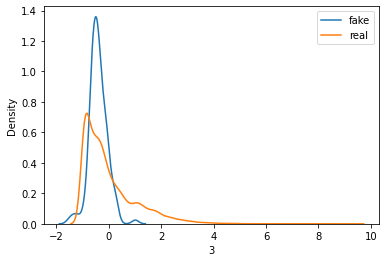

>Saved: drive/My Drive/Thesis/20201031-145827_g_model_01390.h5, and drive/My Drive/Thesis/20201031-145827_c_model_01390.h5


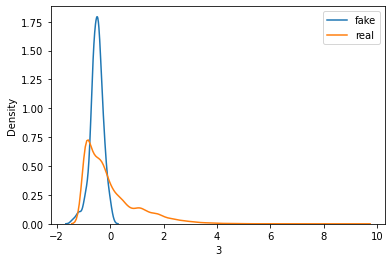

>Saved: drive/My Drive/Thesis/20201031-150026_g_model_02780.h5, and drive/My Drive/Thesis/20201031-150026_c_model_02780.h5


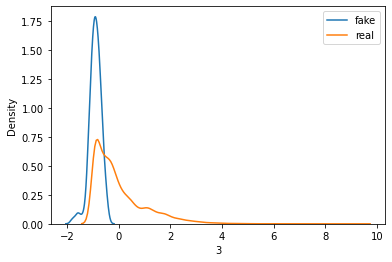

>Saved: drive/My Drive/Thesis/20201031-150227_g_model_04170.h5, and drive/My Drive/Thesis/20201031-150227_c_model_04170.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.987
60th percentile of preds: 0.955
60th percentile of preds: 0.99
                Age        Amount  ...    Purpose_X9           BAD
count  17825.000000  17825.000000  ...  17825.000000  17825.000000
mean      -0.429235     -0.074607  ...      0.051504      0.494811
std        0.217713      0.233462  ...      0.230704      0.499987
min       -2.736668     -1.474533  ...     -0.528682      0.000000
25%       -0.525225     -0.216839  ...     -0.117449      0.000000
50%       -0.400076     -0.116208  ...      0.034533      0.000000
75%       -0.289759      0.064931  ...      0.193621      1.000000
max        0.151315      1.099789  ...      1.442592      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.982
60th percentile of preds: 0.922


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 64: 
tao: 0.031191255675661778
accepts: 110 with 0.00909090909090909% bad

> iteration 65: #accepts 7260
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_202 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_670 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_536 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_268 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_268 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_671 (Dense)            (None, 100)               10100     
_________

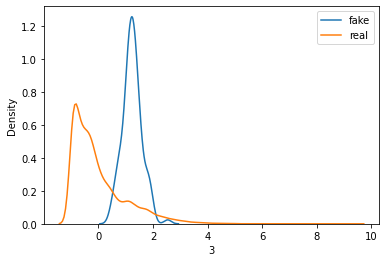

>Saved: drive/My Drive/Thesis/20201031-150524_g_model_01410.h5, and drive/My Drive/Thesis/20201031-150524_c_model_01410.h5


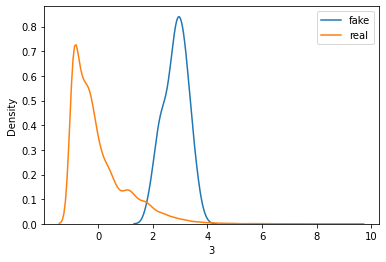

>Saved: drive/My Drive/Thesis/20201031-150727_g_model_02820.h5, and drive/My Drive/Thesis/20201031-150727_c_model_02820.h5


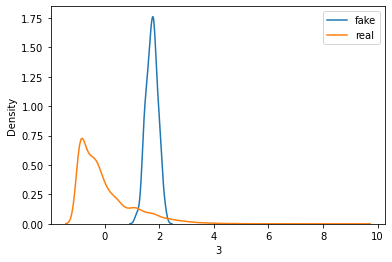

>Saved: drive/My Drive/Thesis/20201031-150927_g_model_04230.h5, and drive/My Drive/Thesis/20201031-150927_c_model_04230.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.986
60th percentile of preds: 0.147
60th percentile of preds: 0.422
                Age        Amount  ...    Purpose_X9           BAD
count  18100.000000  18100.000000  ...  18100.000000  18100.000000
mean       2.356828     -0.041199  ...     -0.967003      0.505912
std        0.289682      0.286606  ...      0.249266      0.499979
min        1.156173     -1.622041  ...     -3.029849      0.000000
25%        2.174146     -0.240468  ...     -1.110892      0.000000
50%        2.352935     -0.043276  ...     -0.965360      1.000000
75%        2.546730      0.153266  ...     -0.809234      1.000000
max        4.160871      1.028576  ...      0.175321      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.978
60th percentile of preds: 0.341


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.977


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 65: 
tao: 0.03258703389501479
accepts: 110 with 0.01818181818181818% bad

> iteration 66: #accepts 7370
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_205 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_680 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_544 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_272 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_272 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_681 (Dense)            (None, 100)               10100     
__________

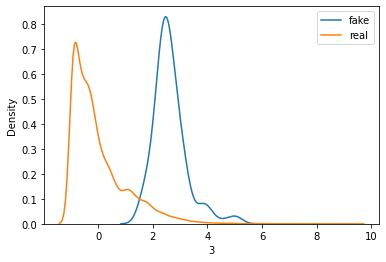

>Saved: drive/My Drive/Thesis/20201031-151217_g_model_01430.h5, and drive/My Drive/Thesis/20201031-151217_c_model_01430.h5


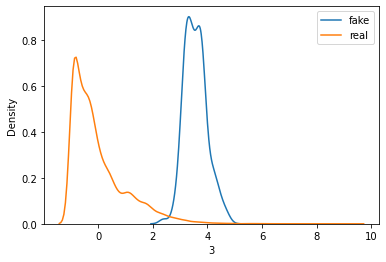

>Saved: drive/My Drive/Thesis/20201031-151422_g_model_02860.h5, and drive/My Drive/Thesis/20201031-151422_c_model_02860.h5


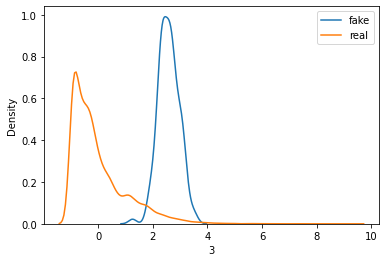

>Saved: drive/My Drive/Thesis/20201031-151624_g_model_04290.h5, and drive/My Drive/Thesis/20201031-151624_c_model_04290.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.986
60th percentile of preds: 0.049


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.371
                Age        Amount  ...    Purpose_X9           BAD
count  18375.000000  18375.000000  ...  18375.000000  18375.000000
mean       3.729403      0.161945  ...      1.846541      0.496653
std        0.575106      0.371428  ...      0.364596      0.500002
min        2.088055     -0.832554  ...      0.604969      0.000000
25%        3.327291     -0.098211  ...      1.629394      0.000000
50%        3.619190      0.097460  ...      1.793434      0.000000
75%        4.009833      0.338861  ...      2.010504      1.000000
max        8.727055      2.113509  ...      4.704592      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.976
60th percentile of preds: 0.345


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.977


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 66: 
tao: 0.028191402483968297
accepts: 110 with 0.01818181818181818% bad

> iteration 67: #accepts 7480
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_208 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_690 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_552 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_276 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_276 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_691 (Dense)            (None, 100)               10100     
_________

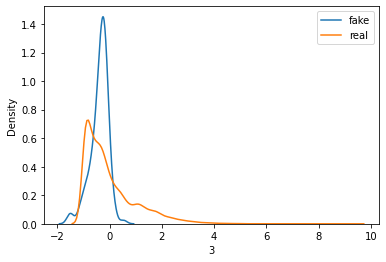

>Saved: drive/My Drive/Thesis/20201031-151915_g_model_01450.h5, and drive/My Drive/Thesis/20201031-151915_c_model_01450.h5


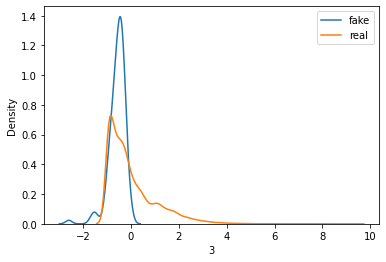

>Saved: drive/My Drive/Thesis/20201031-152122_g_model_02900.h5, and drive/My Drive/Thesis/20201031-152122_c_model_02900.h5


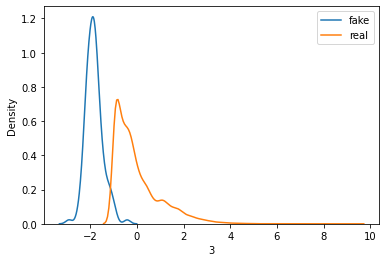

>Saved: drive/My Drive/Thesis/20201031-152328_g_model_04350.h5, and drive/My Drive/Thesis/20201031-152328_c_model_04350.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.986
60th percentile of preds: 0.915
60th percentile of preds: 0.989
                Age        Amount  ...    Purpose_X9           BAD
count  18650.000000  18650.000000  ...  18650.000000  18650.000000
mean      -0.756425      0.129252  ...     -0.669276      0.500375
std        0.254505      0.240172  ...      0.280903      0.500013
min       -1.668712     -1.088339  ...     -1.958566      0.000000
25%       -0.942800     -0.016516  ...     -0.865245      0.000000
50%       -0.779498      0.105892  ...     -0.701092      1.000000
75%       -0.588848      0.270375  ...     -0.511845      1.000000
max        0.419857      1.417646  ...      0.515607      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.983
60th percentile of preds: 0.928
60th percentile of preds: 0.977


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 67: 
tao: 0.02691283569256367
accepts: 110 with 0.0% bad

> iteration 68: #accepts 7590
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_211 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_700 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_560 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_280 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_280 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_701 (Dense)            (None, 100)               10100     
__________________________

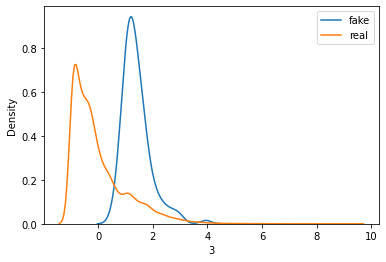

>Saved: drive/My Drive/Thesis/20201031-152617_g_model_01470.h5, and drive/My Drive/Thesis/20201031-152617_c_model_01470.h5


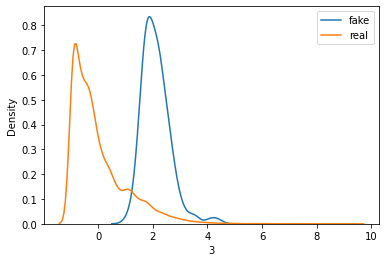

>Saved: drive/My Drive/Thesis/20201031-152821_g_model_02940.h5, and drive/My Drive/Thesis/20201031-152821_c_model_02940.h5


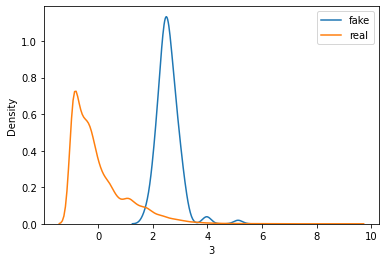

>Saved: drive/My Drive/Thesis/20201031-153023_g_model_04410.h5, and drive/My Drive/Thesis/20201031-153023_c_model_04410.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.986
60th percentile of preds: 0.113


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.357
                Age        Amount  ...    Purpose_X9           BAD
count  18925.000000  18925.000000  ...  18925.000000  18925.000000
mean       3.262082     -2.157753  ...      0.498450      0.502351
std        0.405784      0.473409  ...      0.265304      0.500008
min        1.843280     -7.428418  ...     -0.440053      0.000000
25%        2.983300     -2.297234  ...      0.331114      0.000000
50%        3.225324     -2.060853  ...      0.465942      1.000000
75%        3.491166     -1.881443  ...      0.635345      1.000000
max        7.220756     -0.845626  ...      2.360442      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.984
60th percentile of preds: 0.334
60th percentile of preds: 0.977


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 68: 
tao: 0.026349621089541447
accepts: 110 with 0.00909090909090909% bad

> iteration 69: #accepts 7700
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_214 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_710 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_568 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_284 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_284 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_711 (Dense)            (None, 100)               10100     
_________

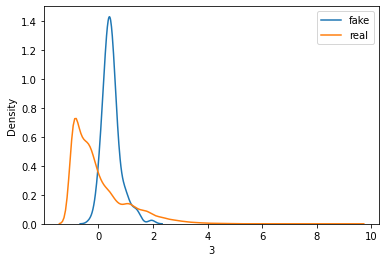

>Saved: drive/My Drive/Thesis/20201031-153316_g_model_01500.h5, and drive/My Drive/Thesis/20201031-153316_c_model_01500.h5


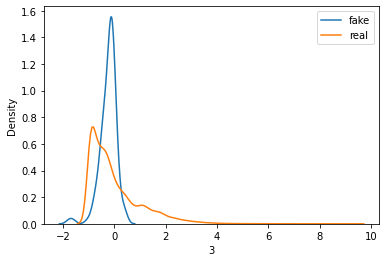

>Saved: drive/My Drive/Thesis/20201031-153524_g_model_03000.h5, and drive/My Drive/Thesis/20201031-153524_c_model_03000.h5


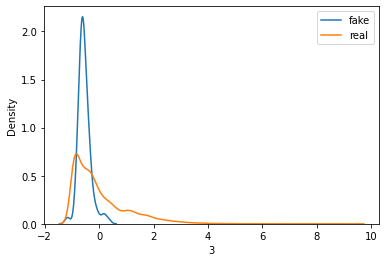

>Saved: drive/My Drive/Thesis/20201031-153734_g_model_04500.h5, and drive/My Drive/Thesis/20201031-153734_c_model_04500.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.986
60th percentile of preds: 0.814
60th percentile of preds: 0.958
                Age        Amount  ...    Purpose_X9           BAD
count  19200.000000  19200.000000  ...  19200.000000  19200.000000
mean      -0.806800     -0.666638  ...      0.518895      0.506302
std        0.258714      0.291127  ...      0.224271      0.499973
min       -2.442031     -1.874755  ...     -0.649986      0.000000
25%       -0.946956     -0.860377  ...      0.397554      0.000000
50%       -0.811942     -0.734231  ...      0.502689      1.000000
75%       -0.664665     -0.530452  ...      0.616688      1.000000
max        1.122323      1.020519  ...      2.544641      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.975
60th percentile of preds: 0.911
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 69: 
tao: 0.02931336724289465
accepts: 110 with 0.02727272727272727% bad

> iteration 70: #accepts 7810
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_217 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_720 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_576 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_288 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_288 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_721 (Dense)            (None, 100)               10100     
__________

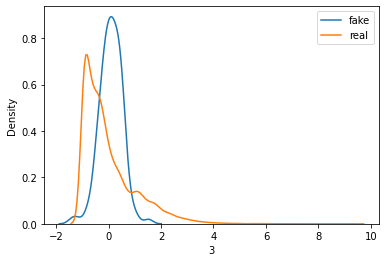

>Saved: drive/My Drive/Thesis/20201031-154030_g_model_01520.h5, and drive/My Drive/Thesis/20201031-154030_c_model_01520.h5


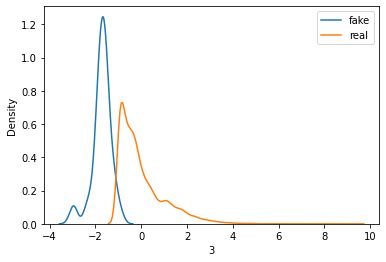

>Saved: drive/My Drive/Thesis/20201031-154236_g_model_03040.h5, and drive/My Drive/Thesis/20201031-154236_c_model_03040.h5


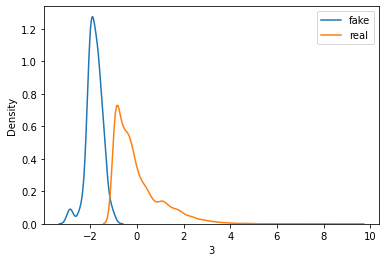

>Saved: drive/My Drive/Thesis/20201031-154442_g_model_04560.h5, and drive/My Drive/Thesis/20201031-154442_c_model_04560.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.986
60th percentile of preds: 0.91
60th percentile of preds: 0.981
                Age        Amount  ...    Purpose_X9           BAD
count  19475.000000  19475.000000  ...  19475.000000  19475.000000
mean      -1.304187      0.033748  ...     -0.192943      0.497304
std        0.321873      0.240178  ...      0.325485      0.500006
min       -4.704613     -2.060072  ...     -2.944522      0.000000
25%       -1.423025     -0.095420  ...     -0.311765      0.000000
50%       -1.270619      0.042727  ...     -0.108346      0.000000
75%       -1.128244      0.187566  ...      0.002044      1.000000
max       -0.057022      1.191464  ...      0.679898      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.969
60th percentile of preds: 0.91


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 70: 
tao: 0.036200820546517215
accepts: 110 with 0.00909090909090909% bad

> iteration 71: #accepts 7920
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_220 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_730 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_584 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_292 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_292 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_731 (Dense)            (None, 100)               10100     
_________

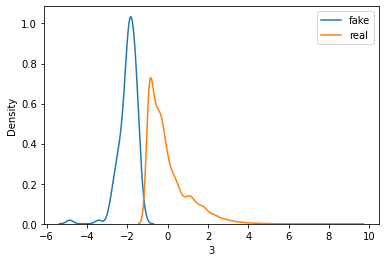

>Saved: drive/My Drive/Thesis/20201031-154743_g_model_01540.h5, and drive/My Drive/Thesis/20201031-154743_c_model_01540.h5


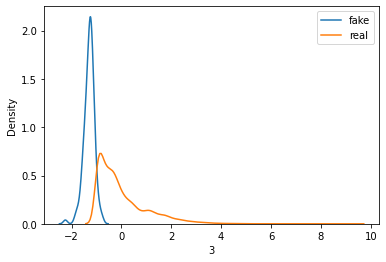

>Saved: drive/My Drive/Thesis/20201031-154957_g_model_03080.h5, and drive/My Drive/Thesis/20201031-154957_c_model_03080.h5


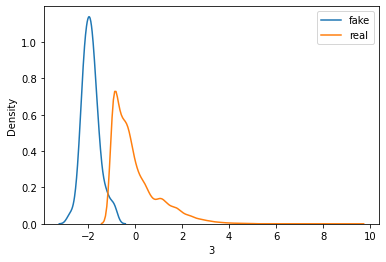

>Saved: drive/My Drive/Thesis/20201031-155206_g_model_04620.h5, and drive/My Drive/Thesis/20201031-155206_c_model_04620.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.986
60th percentile of preds: 0.925
60th percentile of preds: 0.993
                Age        Amount  ...    Purpose_X9           BAD
count  19750.000000  19750.000000  ...  19750.000000  19750.000000
mean      -1.622900      0.929591  ...     -0.383446      0.503544
std        0.353299      0.264672  ...      0.194151      0.500000
min       -2.976891     -0.448726  ...     -1.125044      0.000000
25%       -1.871158      0.770368  ...     -0.510161      0.000000
50%       -1.678936      0.900787  ...     -0.397197      1.000000
75%       -1.440997      1.052633  ...     -0.272148      1.000000
max        0.183659      3.346100  ...      1.024572      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.985
60th percentile of preds: 0.951


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 71: 
tao: 0.03199153019571471
accepts: 110 with 0.00909090909090909% bad

> iteration 72: #accepts 8030
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_223 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_740 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_592 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_296 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_296 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_741 (Dense)            (None, 100)               10100     
__________

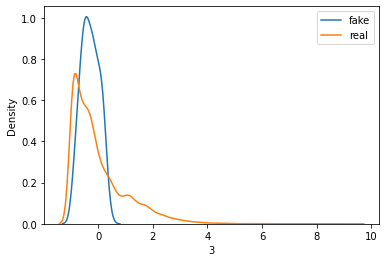

>Saved: drive/My Drive/Thesis/20201031-155517_g_model_01560.h5, and drive/My Drive/Thesis/20201031-155517_c_model_01560.h5


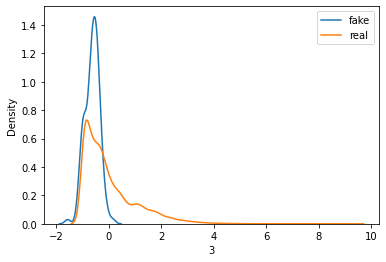

>Saved: drive/My Drive/Thesis/20201031-155725_g_model_03120.h5, and drive/My Drive/Thesis/20201031-155725_c_model_03120.h5


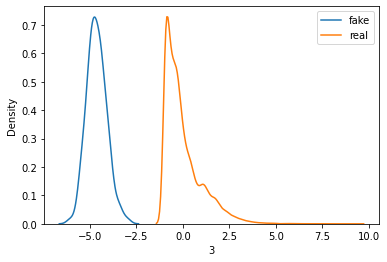

>Saved: drive/My Drive/Thesis/20201031-155935_g_model_04680.h5, and drive/My Drive/Thesis/20201031-155935_c_model_04680.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.987
60th percentile of preds: 1.0
60th percentile of preds: 0.997
                Age        Amount  ...    Purpose_X9           BAD
count  20025.000000  20025.000000  ...  20025.000000  20025.000000
mean      -3.978569      0.946662  ...     -0.349429      0.497478
std        0.543946      0.310408  ...      0.341403      0.500006
min       -9.770617     -0.905514  ...     -1.315575      0.000000
25%       -4.219642      0.745402  ...     -0.565083      0.000000
50%       -3.907740      0.975326  ...     -0.390310      0.000000
75%       -3.655036      1.159606  ...     -0.157288      1.000000
max       -2.271469      2.392993  ...      1.774322      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.975
60th percentile of preds: 0.987


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 72: 
tao: 0.023339674148906614
accepts: 110 with 0.00909090909090909% bad

> iteration 73: #accepts 8140
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_226 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_750 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_600 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_300 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_300 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_751 (Dense)            (None, 100)               10100     
_________

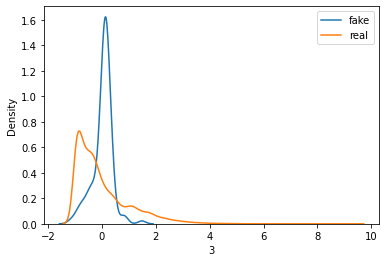

>Saved: drive/My Drive/Thesis/20201031-160238_g_model_01580.h5, and drive/My Drive/Thesis/20201031-160238_c_model_01580.h5


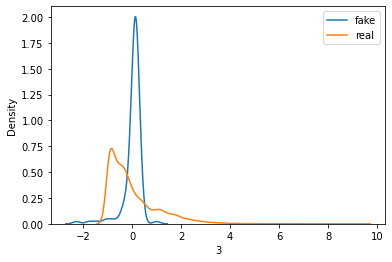

>Saved: drive/My Drive/Thesis/20201031-160448_g_model_03160.h5, and drive/My Drive/Thesis/20201031-160448_c_model_03160.h5


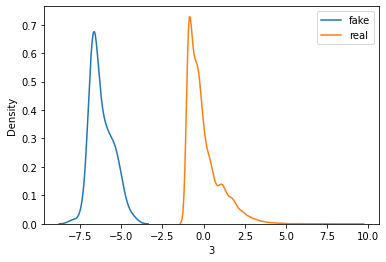

>Saved: drive/My Drive/Thesis/20201031-160657_g_model_04740.h5, and drive/My Drive/Thesis/20201031-160657_c_model_04740.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.987
60th percentile of preds: 1.0


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.997
                Age        Amount  ...    Purpose_X9           BAD
count  20300.000000  20300.000000  ...  20300.000000  20300.000000
mean      -6.338286     -0.616547  ...     -4.727937      0.489655
std        0.655317      0.310900  ...      0.443719      0.499905
min      -11.535973     -1.706581  ...     -6.547639      0.000000
25%       -6.753672     -0.787939  ...     -4.994311      0.000000
50%       -6.458886     -0.643004  ...     -4.721191      0.000000
75%       -5.990670     -0.506999  ...     -4.509356      1.000000
max       -3.497565      0.843131  ...     -2.602705      1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.999


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 1.0
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 73: 
tao: 0.03500310081253824
accepts: 110 with 0.0% bad

> iteration 74: #accepts 8250
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_229 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_760 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_608 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_304 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_304 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_761 (Dense)            (None, 100)               10100     
__________________________

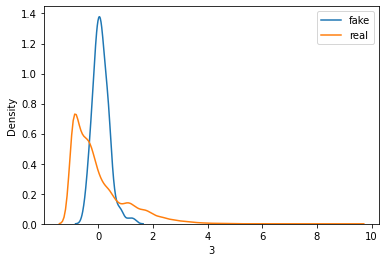

>Saved: drive/My Drive/Thesis/20201031-161022_g_model_01600.h5, and drive/My Drive/Thesis/20201031-161022_c_model_01600.h5


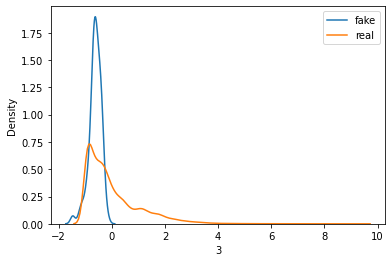

>Saved: drive/My Drive/Thesis/20201031-161236_g_model_03200.h5, and drive/My Drive/Thesis/20201031-161236_c_model_03200.h5


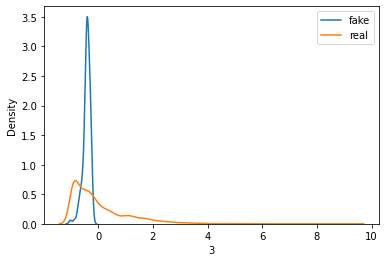

>Saved: drive/My Drive/Thesis/20201031-161449_g_model_04800.h5, and drive/My Drive/Thesis/20201031-161449_c_model_04800.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.987
60th percentile of preds: 0.455
60th percentile of preds: 0.865
                Age        Amount  ...    Purpose_X9           BAD
count  20575.000000  20575.000000  ...  20575.000000  20575.000000
mean       0.347987      0.556878  ...      0.166111      0.491859
std        0.108572      0.115602  ...      0.092017      0.499946
min       -0.227511      0.037260  ...     -0.376271      0.000000
25%        0.283932      0.484679  ...      0.111446      0.000000
50%        0.351830      0.569523  ...      0.172292      0.000000
75%        0.406015      0.624188  ...      0.223796      1.000000
max        1.461826      1.244872  ...      0.690068      1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.973


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.801
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 74: 
tao: 0.03028817123121672
accepts: 110 with 0.0% bad

> iteration 75: #accepts 8360
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_232 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_770 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_616 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_308 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_308 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_771 (Dense)            (None, 100)               10100     
__________________________

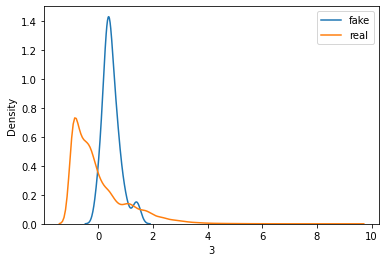

>Saved: drive/My Drive/Thesis/20201031-161809_g_model_01620.h5, and drive/My Drive/Thesis/20201031-161809_c_model_01620.h5


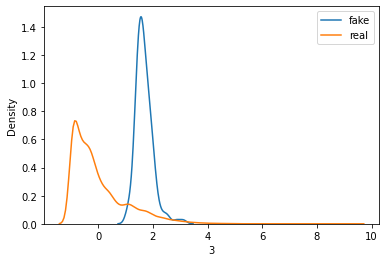

>Saved: drive/My Drive/Thesis/20201031-162029_g_model_03240.h5, and drive/My Drive/Thesis/20201031-162029_c_model_03240.h5


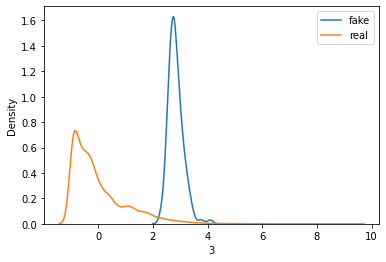

>Saved: drive/My Drive/Thesis/20201031-162244_g_model_04860.h5, and drive/My Drive/Thesis/20201031-162244_c_model_04860.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.987
60th percentile of preds: 0.206
60th percentile of preds: 0.421
                Age        Amount  ...    Purpose_X9           BAD
count  20850.000000  20850.000000  ...  20850.000000  20850.000000
mean       1.848841     -0.396700  ...      0.377825      0.498417
std        0.215681      0.253480  ...      0.197090      0.500009
min        1.122890     -1.129687  ...     -0.505093      0.000000
25%        1.710604     -0.580454  ...      0.255604      0.000000
50%        1.835458     -0.420656  ...      0.353237      0.000000
75%        1.974838     -0.226629  ...      0.466164      1.000000
max        3.271389      0.649467  ...      1.529949      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.992
60th percentile of preds: 0.338
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 75: 
tao: 0.02646192959894185
accepts: 110 with 0.0% bad

> iteration 76: #accepts 8470
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_235 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_780 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_624 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_312 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_312 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_781 (Dense)            (None, 100)               10100     
__________________________

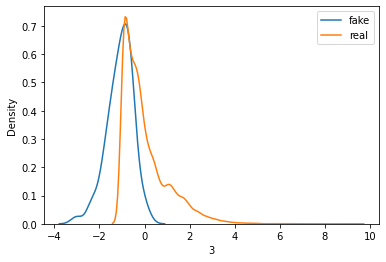

>Saved: drive/My Drive/Thesis/20201031-162602_g_model_01650.h5, and drive/My Drive/Thesis/20201031-162602_c_model_01650.h5


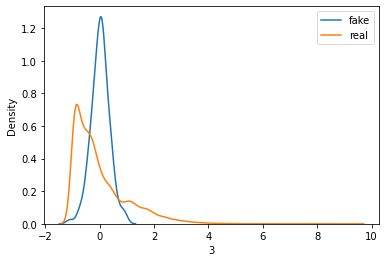

>Saved: drive/My Drive/Thesis/20201031-162819_g_model_03300.h5, and drive/My Drive/Thesis/20201031-162819_c_model_03300.h5


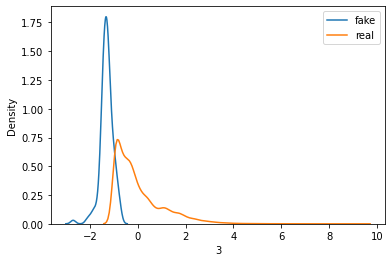

>Saved: drive/My Drive/Thesis/20201031-163037_g_model_04950.h5, and drive/My Drive/Thesis/20201031-163037_c_model_04950.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.986
60th percentile of preds: 0.854
60th percentile of preds: 0.961
                Age        Amount  ...    Purpose_X9           BAD
count  21125.000000  21125.000000  ...  21125.000000  21125.000000
mean       0.161574     -0.198394  ...     -0.029395      0.509018
std        0.272591      0.276796  ...      0.205483      0.499931
min       -1.703492     -1.642001  ...     -0.931108      0.000000
25%        0.002763     -0.367262  ...     -0.183425      0.000000
50%        0.191060     -0.173147  ...     -0.047576      1.000000
75%        0.348620     -0.023265  ...      0.118323      1.000000
max        1.209824      0.870188  ...      0.705534      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.965
60th percentile of preds: 0.858
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 76: 
tao: 0.030070464275817235
accepts: 110 with 0.0% bad

> iteration 77: #accepts 8580
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_238 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_790 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_632 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_316 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_316 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_791 (Dense)            (None, 100)               10100     
_________________________

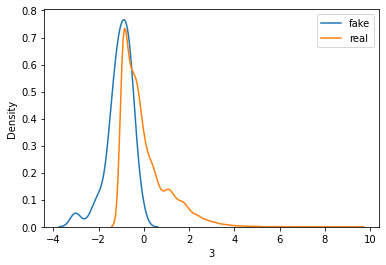

>Saved: drive/My Drive/Thesis/20201031-163340_g_model_01670.h5, and drive/My Drive/Thesis/20201031-163340_c_model_01670.h5


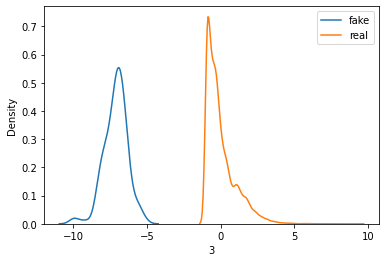

>Saved: drive/My Drive/Thesis/20201031-163559_g_model_03340.h5, and drive/My Drive/Thesis/20201031-163559_c_model_03340.h5


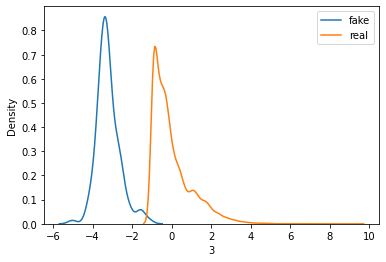

>Saved: drive/My Drive/Thesis/20201031-163819_g_model_05010.h5, and drive/My Drive/Thesis/20201031-163819_c_model_05010.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.987
60th percentile of preds: 0.95
60th percentile of preds: 0.994
                Age        Amount  ...    Purpose_X9           BAD
count  21400.000000  21400.000000  ...  21400.000000  21400.000000
mean      -2.727968      0.442234  ...      0.607040      0.503925
std        0.613618      0.328516  ...      0.481008      0.499996
min       -6.208928     -1.354478  ...     -0.959815      0.000000
25%       -3.167771      0.249040  ...      0.234619      0.000000
50%       -2.780077      0.463555  ...      0.613235      1.000000
75%       -2.326336      0.661676  ...      0.941530      1.000000
max       -0.193594      1.710061  ...      4.312552      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.99
60th percentile of preds: 0.957
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 77: 
tao: 0.03214512053042326
accepts: 110 with 0.00909090909090909% bad

> iteration 78: #accepts 8690
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_241 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_800 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_640 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_320 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_320 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_801 (Dense)            (None, 100)               10100     
__________

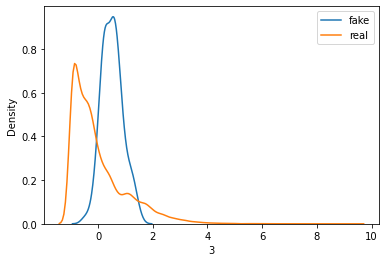

>Saved: drive/My Drive/Thesis/20201031-164123_g_model_01690.h5, and drive/My Drive/Thesis/20201031-164123_c_model_01690.h5


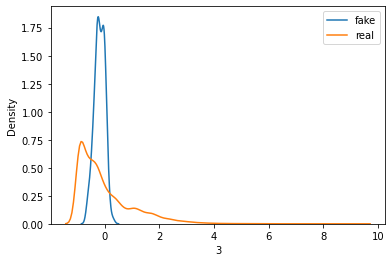

>Saved: drive/My Drive/Thesis/20201031-164343_g_model_03380.h5, and drive/My Drive/Thesis/20201031-164343_c_model_03380.h5


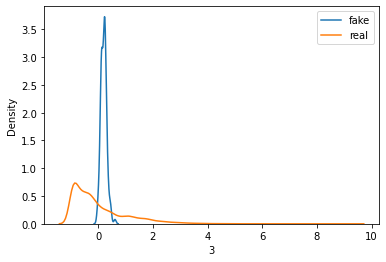

>Saved: drive/My Drive/Thesis/20201031-164603_g_model_05070.h5, and drive/My Drive/Thesis/20201031-164603_c_model_05070.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.987
60th percentile of preds: 0.52
60th percentile of preds: 0.876
                Age        Amount  ...    Purpose_X9           BAD
count  21675.000000  21675.000000  ...  21675.000000  21675.000000
mean      -0.073244      0.306648  ...     -0.153194      0.496424
std        0.104769      0.106893  ...      0.087240      0.499999
min       -0.840235     -0.474010  ...     -0.565373      0.000000
25%       -0.132689      0.254287  ...     -0.210549      0.000000
50%       -0.081532      0.324304  ...     -0.156218      0.000000
75%       -0.012635      0.373031  ...     -0.100382      1.000000
max        0.364816      0.875221  ...      0.233904      1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.966


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.814
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 78: 
tao: 0.024091766413664097
accepts: 110 with 0.01818181818181818% bad

> iteration 79: #accepts 8800
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_244 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_810 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_648 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_324 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_324 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_811 (Dense)            (None, 100)               10100     
_________

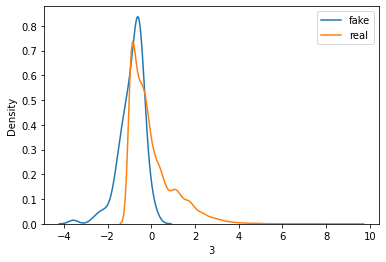

>Saved: drive/My Drive/Thesis/20201031-164929_g_model_01710.h5, and drive/My Drive/Thesis/20201031-164929_c_model_01710.h5


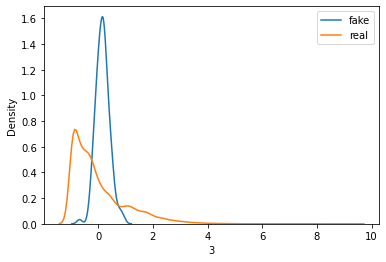

>Saved: drive/My Drive/Thesis/20201031-165149_g_model_03420.h5, and drive/My Drive/Thesis/20201031-165149_c_model_03420.h5


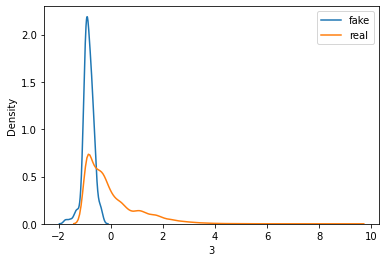

>Saved: drive/My Drive/Thesis/20201031-165407_g_model_05130.h5, and drive/My Drive/Thesis/20201031-165407_c_model_05130.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.986
60th percentile of preds: 0.542
60th percentile of preds: 0.876
                Age        Amount  ...    Purpose_X9           BAD
count  21950.000000  21950.000000  ...  21950.000000  21950.000000
mean       0.335236     -0.484581  ...     -0.008121      0.499499
std        0.163369      0.178980  ...      0.134428      0.500011
min       -0.581170     -1.462513  ...     -0.634130      0.000000
25%        0.231485     -0.607112  ...     -0.103153      0.000000
50%        0.318505     -0.488069  ...      0.003543      0.000000
75%        0.412515     -0.361344  ...      0.090652      1.000000
max        1.564900      0.156728  ...      0.442604      1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.98


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.81
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 79: 
tao: 0.029347077496057174
accepts: 110 with 0.0% bad

> iteration 80: #accepts 8910
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_247 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_820 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_656 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_328 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_328 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_821 (Dense)            (None, 100)               10100     
_________________________

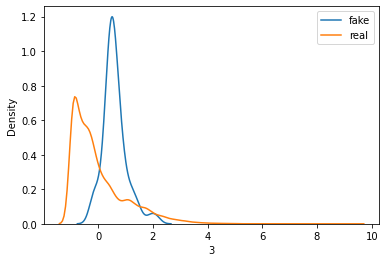

>Saved: drive/My Drive/Thesis/20201031-165733_g_model_01730.h5, and drive/My Drive/Thesis/20201031-165733_c_model_01730.h5


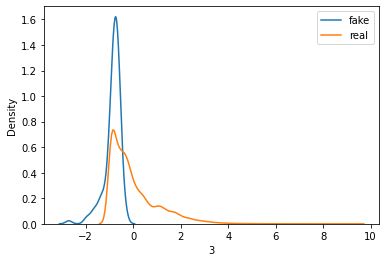

>Saved: drive/My Drive/Thesis/20201031-165953_g_model_03460.h5, and drive/My Drive/Thesis/20201031-165953_c_model_03460.h5


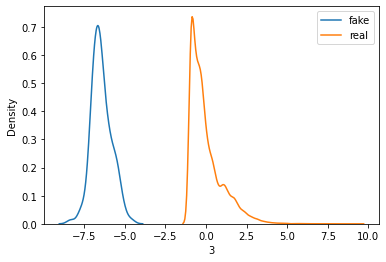

>Saved: drive/My Drive/Thesis/20201031-170214_g_model_05190.h5, and drive/My Drive/Thesis/20201031-170214_c_model_05190.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.986
60th percentile of preds: 1.0
60th percentile of preds: 0.996
                Age        Amount  ...    Purpose_X9           BAD
count  22225.000000  22225.000000  ...  22225.000000  22225.000000
mean      -2.413120      0.170720  ...     -0.840518      0.499213
std        0.550757      0.344303  ...      0.295988      0.500011
min       -5.900892     -0.684379  ...     -1.680482      0.000000
25%       -2.753097     -0.093767  ...     -1.050552      0.000000
50%       -2.329070      0.130555  ...     -0.856168      0.000000
75%       -1.985014      0.388656  ...     -0.683735      1.000000
max       -1.269347      1.761476  ...      0.959140      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.986
60th percentile of preds: 0.992
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 80: 
tao: 0.03313771224394105
accepts: 110 with 0.0% bad

> iteration 81: #accepts 9020
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_250 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_830 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_664 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_332 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_332 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_831 (Dense)            (None, 100)               10100     
__________________________

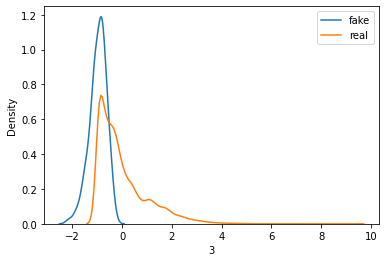

>Saved: drive/My Drive/Thesis/20201031-170528_g_model_01750.h5, and drive/My Drive/Thesis/20201031-170528_c_model_01750.h5


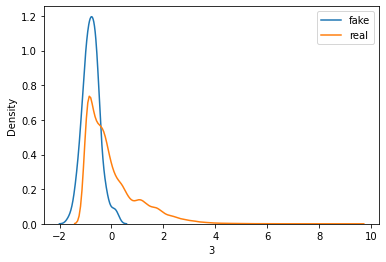

>Saved: drive/My Drive/Thesis/20201031-170750_g_model_03500.h5, and drive/My Drive/Thesis/20201031-170750_c_model_03500.h5


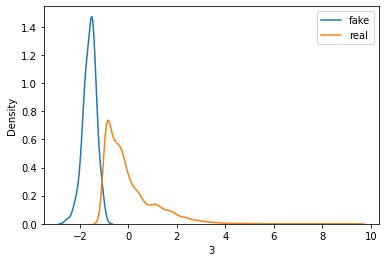

>Saved: drive/My Drive/Thesis/20201031-171014_g_model_05250.h5, and drive/My Drive/Thesis/20201031-171014_c_model_05250.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.986
60th percentile of preds: 0.906
60th percentile of preds: 0.981
                Age        Amount  ...    Purpose_X9           BAD
count  22500.000000  22500.000000  ...  22500.000000  22500.000000
mean      -1.259503      0.804059  ...     -0.247361      0.505156
std        0.280501      0.337432  ...      0.182302      0.499985
min       -2.250368     -0.231286  ...     -1.010342      0.000000
25%       -1.453448      0.563061  ...     -0.369231      0.000000
50%       -1.292488      0.781006  ...     -0.260367      1.000000
75%       -1.094342      1.018421  ...     -0.141002      1.000000
max        0.237009      3.486626  ...      1.037931      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.984


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.936
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 81: 
tao: 0.02285967048040577
accepts: 110 with 0.01818181818181818% bad

> iteration 82: #accepts 9130
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_253 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_840 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_672 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_336 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_336 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_841 (Dense)            (None, 100)               10100     
__________

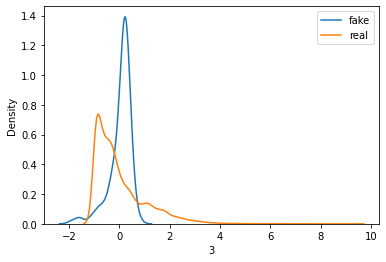

>Saved: drive/My Drive/Thesis/20201031-171355_g_model_01770.h5, and drive/My Drive/Thesis/20201031-171355_c_model_01770.h5


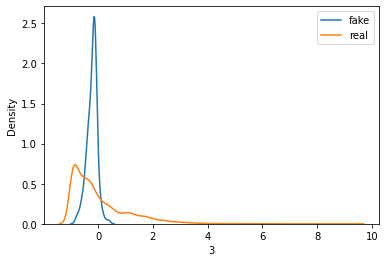

>Saved: drive/My Drive/Thesis/20201031-171630_g_model_03540.h5, and drive/My Drive/Thesis/20201031-171630_c_model_03540.h5


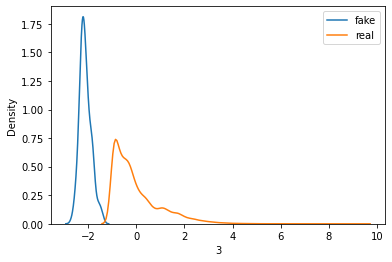

>Saved: drive/My Drive/Thesis/20201031-171903_g_model_05310.h5, and drive/My Drive/Thesis/20201031-171903_c_model_05310.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.986
60th percentile of preds: 0.994
60th percentile of preds: 0.998
                Age        Amount  ...    Purpose_X9           BAD
count  22775.000000  22775.000000  ...  22775.000000  22775.000000
mean      -2.050288     -1.296073  ...     -0.034224      0.501866
std        0.319847      0.328213  ...      0.190863      0.500007
min       -3.481759     -2.882178  ...     -1.065580      0.000000
25%       -2.241658     -1.517256  ...     -0.145649      0.000000
50%       -2.108033     -1.280278  ...     -0.017674      1.000000
75%       -1.896107     -1.063652  ...      0.091299      1.000000
max       -0.489217      0.135366  ...      0.982719      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.974
60th percentile of preds: 0.981
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 82: 
tao: 0.029515135132296796
accepts: 110 with 0.00909090909090909% bad

> iteration 83: #accepts 9240
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_256 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_850 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_680 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_340 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_340 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_851 (Dense)            (None, 100)               10100     
_________

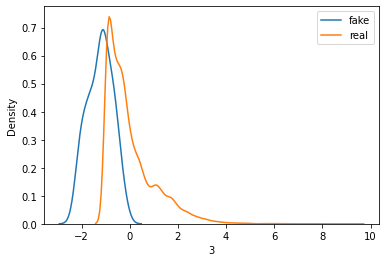

>Saved: drive/My Drive/Thesis/20201031-172245_g_model_01800.h5, and drive/My Drive/Thesis/20201031-172245_c_model_01800.h5


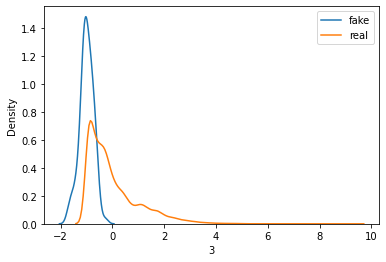

>Saved: drive/My Drive/Thesis/20201031-172513_g_model_03600.h5, and drive/My Drive/Thesis/20201031-172513_c_model_03600.h5


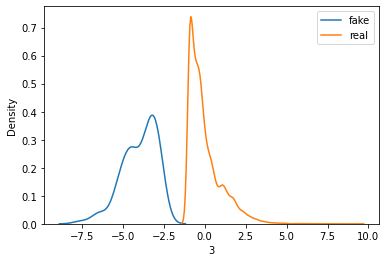

>Saved: drive/My Drive/Thesis/20201031-172740_g_model_05400.h5, and drive/My Drive/Thesis/20201031-172740_c_model_05400.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.986
60th percentile of preds: 0.988
60th percentile of preds: 0.998
                Age        Amount  ...    Purpose_X9           BAD
count  23050.000000  23050.000000  ...  23050.000000  23050.000000
mean      -1.776469     -1.093262  ...     -0.936107      0.499610
std        0.605581      0.342053  ...      0.310314      0.500011
min       -3.866520     -2.135303  ...     -1.932865      0.000000
25%       -2.333954     -1.329332  ...     -1.168381      0.000000
50%       -1.841547     -1.050494  ...     -0.988671      0.000000
75%       -1.221920     -0.845760  ...     -0.718459      1.000000
max       -0.458394      0.178151  ...      0.190715      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.985
60th percentile of preds: 0.985
60th percentile of preds: 0.979


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 83: 
tao: 0.027912417347131607
accepts: 110 with 0.00909090909090909% bad

> iteration 84: #accepts 9350
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_259 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_860 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_688 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_344 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_344 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_861 (Dense)            (None, 100)               10100     
_________

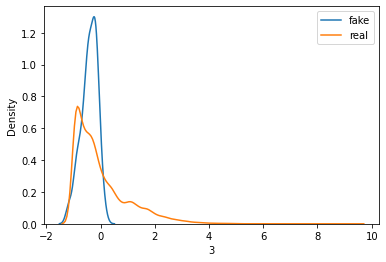

>Saved: drive/My Drive/Thesis/20201031-173102_g_model_01820.h5, and drive/My Drive/Thesis/20201031-173102_c_model_01820.h5


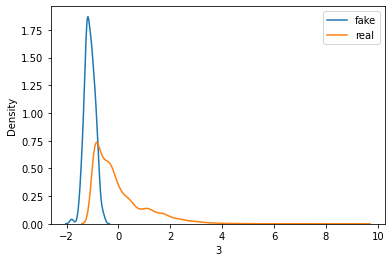

>Saved: drive/My Drive/Thesis/20201031-173330_g_model_03640.h5, and drive/My Drive/Thesis/20201031-173330_c_model_03640.h5


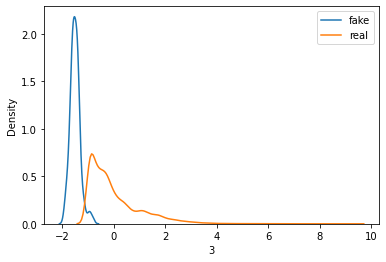

>Saved: drive/My Drive/Thesis/20201031-173558_g_model_05460.h5, and drive/My Drive/Thesis/20201031-173558_c_model_05460.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.987
60th percentile of preds: 0.936
60th percentile of preds: 0.983
                Age        Amount  ...    Purpose_X9           BAD
count  23325.000000  23325.000000  ...  23325.000000  23325.000000
mean      -0.779103     -0.983400  ...     -0.064332      0.505209
std        0.233657      0.203721  ...      0.161509      0.499984
min       -2.583932     -1.944370  ...     -0.872767      0.000000
25%       -0.930692     -1.100753  ...     -0.171193      0.000000
50%       -0.804589     -0.991770  ...     -0.059049      1.000000
75%       -0.632803     -0.874561  ...      0.041835      1.000000
max        0.097329      0.504523  ...      0.628826      1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.993
60th percentile of preds: 0.926
60th percentile of preds: 0.979


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 84: 
tao: 0.025040287378142522
accepts: 110 with 0.01818181818181818% bad

> iteration 85: #accepts 9460
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_262 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_870 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_696 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_348 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_348 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_871 (Dense)            (None, 100)               10100     
_________

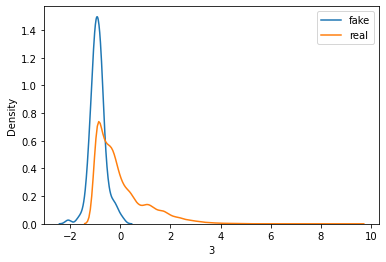

>Saved: drive/My Drive/Thesis/20201031-173937_g_model_01840.h5, and drive/My Drive/Thesis/20201031-173937_c_model_01840.h5


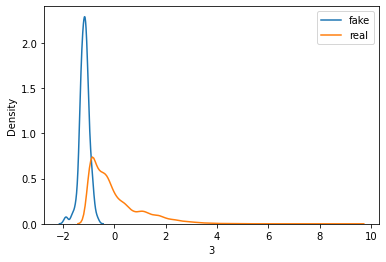

>Saved: drive/My Drive/Thesis/20201031-174210_g_model_03680.h5, and drive/My Drive/Thesis/20201031-174210_c_model_03680.h5


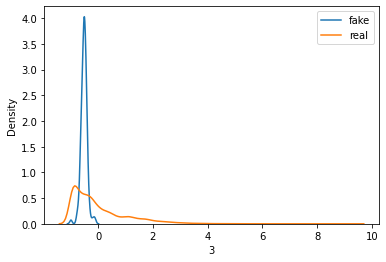

>Saved: drive/My Drive/Thesis/20201031-174443_g_model_05520.h5, and drive/My Drive/Thesis/20201031-174443_c_model_05520.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.986
60th percentile of preds: 0.785
60th percentile of preds: 0.944
                Age        Amount  ...    Purpose_X9           BAD
count  23600.000000  23600.000000  ...  23600.000000  23600.000000
mean       0.494660      0.045589  ...      0.302176      0.499661
std        0.147941      0.136404  ...      0.129311      0.500010
min       -0.457588     -1.041717  ...     -0.424205      0.000000
25%        0.425917     -0.023137  ...      0.222841      0.000000
50%        0.504986      0.050240  ...      0.310579      0.000000
75%        0.574506      0.130054  ...      0.392331      1.000000
max        1.388896      0.693737  ...      0.926958      1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.983
60th percentile of preds: 0.915
60th percentile of preds: 0.979


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 85: 
tao: 0.03361726644068123
accepts: 110 with 0.03636363636363636% bad

> iteration 86: #accepts 9570
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_265 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_880 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_704 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_352 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_352 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_881 (Dense)            (None, 100)               10100     
__________

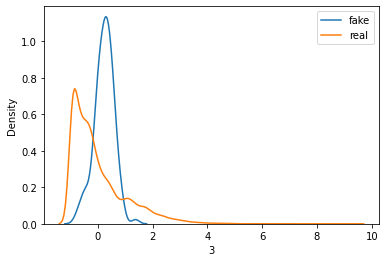

>Saved: drive/My Drive/Thesis/20201031-174824_g_model_01860.h5, and drive/My Drive/Thesis/20201031-174824_c_model_01860.h5


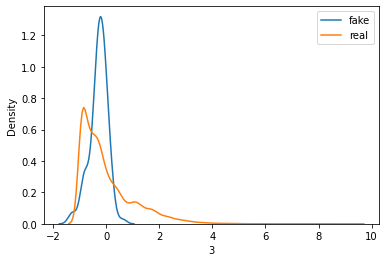

>Saved: drive/My Drive/Thesis/20201031-175055_g_model_03720.h5, and drive/My Drive/Thesis/20201031-175055_c_model_03720.h5


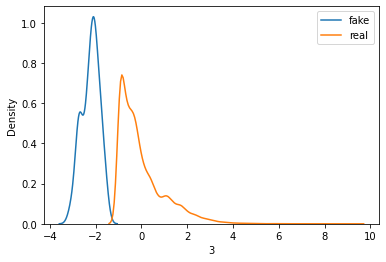

>Saved: drive/My Drive/Thesis/20201031-175326_g_model_05580.h5, and drive/My Drive/Thesis/20201031-175326_c_model_05580.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.987
60th percentile of preds: 0.863
60th percentile of preds: 0.982
                Age        Amount  ...    Purpose_X9           BAD
count  23875.000000  23875.000000  ...  23875.000000  23875.000000
mean      -1.814343      1.619215  ...     -0.203909      0.500147
std        0.295651      0.424762  ...      0.257652      0.500010
min       -3.266023      0.355784  ...     -1.557054      0.000000
25%       -2.001261      1.312252  ...     -0.391427      0.000000
50%       -1.828630      1.603512  ...     -0.200261      1.000000
75%       -1.641858      1.914115  ...     -0.006269      1.000000
max       -0.581981      3.843443  ...      0.672668      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.99
60th percentile of preds: 0.921
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 86: 
tao: 0.02675378220365481
accepts: 110 with 0.03636363636363636% bad

> iteration 87: #accepts 9680
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_268 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_890 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_712 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_356 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_356 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_891 (Dense)            (None, 100)               10100     
__________

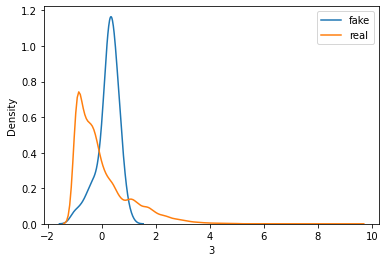

>Saved: drive/My Drive/Thesis/20201031-175650_g_model_01880.h5, and drive/My Drive/Thesis/20201031-175650_c_model_01880.h5


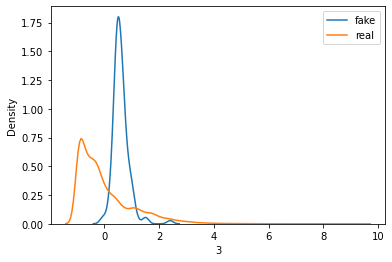

>Saved: drive/My Drive/Thesis/20201031-175929_g_model_03760.h5, and drive/My Drive/Thesis/20201031-175929_c_model_03760.h5


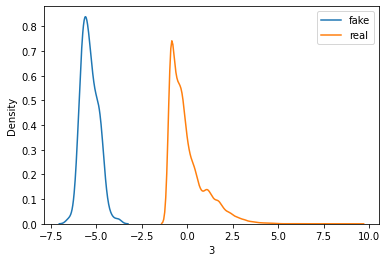

>Saved: drive/My Drive/Thesis/20201031-180205_g_model_05640.h5, and drive/My Drive/Thesis/20201031-180205_c_model_05640.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.986
60th percentile of preds: 0.967
60th percentile of preds: 0.999
                Age        Amount  ...    Purpose_X9           BAD
count  24150.000000  24150.000000  ...  24150.000000  24150.000000
mean      -3.336498      0.089363  ...      0.577484      0.503023
std        0.300451      0.283562  ...      0.225695      0.500001
min       -5.253022     -1.535880  ...     -0.538118      0.000000
25%       -3.543273     -0.066817  ...      0.443136      0.000000
50%       -3.377665      0.119246  ...      0.600366      1.000000
75%       -3.139928      0.281558  ...      0.733593      1.000000
max       -2.248355      1.005376  ...      2.118156      1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.981


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.992
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 87: 
tao: 0.022829385723778885
accepts: 110 with 0.00909090909090909% bad

> iteration 88: #accepts 9790
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_271 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_900 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_720 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_360 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_360 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_901 (Dense)            (None, 100)               10100     
_________

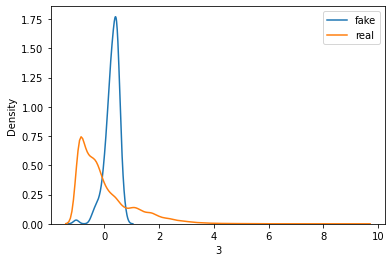

>Saved: drive/My Drive/Thesis/20201031-180559_g_model_01900.h5, and drive/My Drive/Thesis/20201031-180559_c_model_01900.h5


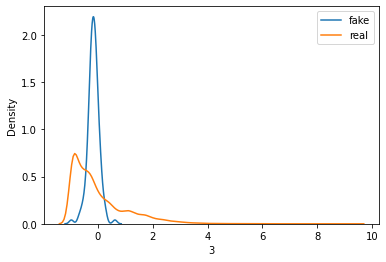

>Saved: drive/My Drive/Thesis/20201031-180835_g_model_03800.h5, and drive/My Drive/Thesis/20201031-180835_c_model_03800.h5


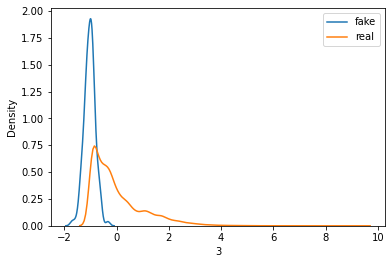

>Saved: drive/My Drive/Thesis/20201031-181118_g_model_05700.h5, and drive/My Drive/Thesis/20201031-181118_c_model_05700.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.986
60th percentile of preds: 0.761
60th percentile of preds: 0.947
                Age        Amount  ...    Purpose_X9           BAD
count  24425.000000  24425.000000  ...  24425.000000  24425.000000
mean      -1.492007     -0.177812  ...     -0.329348      0.497932
std        0.376599      0.218477  ...      0.168826      0.500006
min       -4.926960     -0.774803  ...     -1.986743      0.000000
25%       -1.617121     -0.335698  ...     -0.405539      0.000000
50%       -1.439342     -0.221503  ...     -0.321723      0.000000
75%       -1.289812     -0.043337  ...     -0.242245      1.000000
max       -0.260542      0.934029  ...      0.536654      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.974


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.899


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 88: 
tao: 0.027258743765131547
accepts: 110 with 0.00909090909090909% bad

> iteration 89: #accepts 9900
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_274 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_910 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_728 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_364 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_364 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_911 (Dense)            (None, 100)               10100     
_________

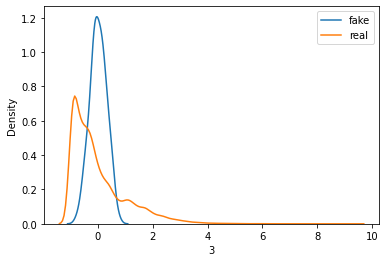

>Saved: drive/My Drive/Thesis/20201031-181519_g_model_01920.h5, and drive/My Drive/Thesis/20201031-181519_c_model_01920.h5


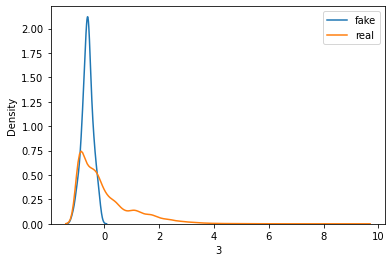

>Saved: drive/My Drive/Thesis/20201031-181759_g_model_03840.h5, and drive/My Drive/Thesis/20201031-181759_c_model_03840.h5


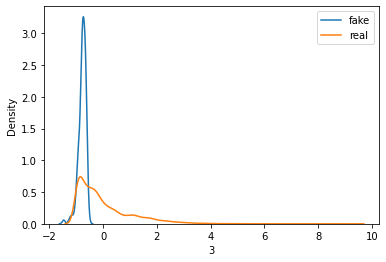

>Saved: drive/My Drive/Thesis/20201031-182038_g_model_05760.h5, and drive/My Drive/Thesis/20201031-182038_c_model_05760.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.986
60th percentile of preds: 0.487
60th percentile of preds: 0.853
                Age        Amount  ...    Purpose_X9          BAD
count  24700.000000  24700.000000  ...  24700.000000  24700.00000
mean       0.212939     -0.427317  ...     -0.013994      0.50004
std        0.170017      0.145279  ...      0.102167      0.50001
min       -0.529450     -1.163003  ...     -0.496960      0.00000
25%        0.103335     -0.517857  ...     -0.079870      0.00000
50%        0.201935     -0.407900  ...     -0.025621      1.00000
75%        0.311261     -0.330010  ...      0.039962      1.00000
max        1.269908      0.341640  ...      0.474073      1.00000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.983
60th percentile of preds: 0.81
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 89: 
tao: 0.027232356325733446
accepts: 110 with 0.03636363636363636% bad

> iteration 90: #accepts 10010
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_277 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_920 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_736 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_368 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_368 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_921 (Dense)            (None, 100)               10100     
________

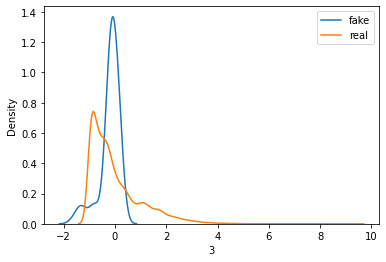

>Saved: drive/My Drive/Thesis/20201031-182436_g_model_01950.h5, and drive/My Drive/Thesis/20201031-182436_c_model_01950.h5


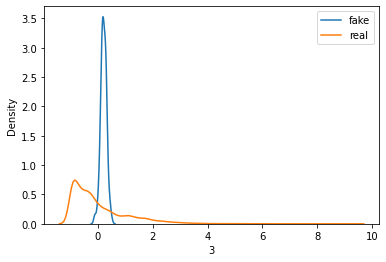

>Saved: drive/My Drive/Thesis/20201031-182719_g_model_03900.h5, and drive/My Drive/Thesis/20201031-182719_c_model_03900.h5


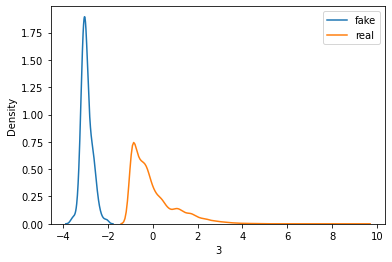

>Saved: drive/My Drive/Thesis/20201031-183003_g_model_05850.h5, and drive/My Drive/Thesis/20201031-183003_c_model_05850.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.986
60th percentile of preds: 0.993
60th percentile of preds: 0.998
                Age        Amount  ...    Purpose_X9           BAD
count  24975.000000  24975.000000  ...  24975.000000  24975.000000
mean      -3.191344     -0.036134  ...     -0.186590      0.497457
std        0.228140      0.163759  ...      0.130452      0.500004
min       -4.513825     -0.562238  ...     -0.640780      0.000000
25%       -3.340921     -0.168388  ...     -0.255179      0.000000
50%       -3.210852     -0.064132  ...     -0.186073      0.000000
75%       -3.066442      0.077243  ...     -0.132361      1.000000
max       -1.793416      0.743372  ...      0.431715      1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.982


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.988
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 90: 
tao: 0.030496661067873448
accepts: 110 with 0.00909090909090909% bad

> iteration 91: #accepts 10120
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_280 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_930 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_744 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_372 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_372 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_931 (Dense)            (None, 100)               10100     
________

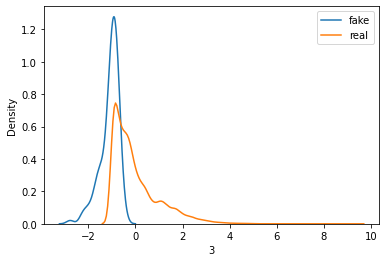

>Saved: drive/My Drive/Thesis/20201031-183413_g_model_01970.h5, and drive/My Drive/Thesis/20201031-183413_c_model_01970.h5


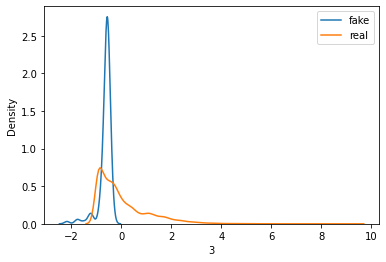

>Saved: drive/My Drive/Thesis/20201031-183659_g_model_03940.h5, and drive/My Drive/Thesis/20201031-183659_c_model_03940.h5


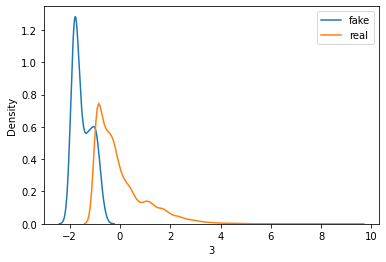

>Saved: drive/My Drive/Thesis/20201031-183942_g_model_05910.h5, and drive/My Drive/Thesis/20201031-183942_c_model_05910.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.986
60th percentile of preds: 0.871
60th percentile of preds: 0.981
                Age        Amount  ...    Purpose_X9           BAD
count  25250.000000  25250.000000  ...  25250.000000  25250.000000
mean      -1.354237     -0.849445  ...     -0.811978      0.500198
std        0.315209      0.186501  ...      0.178677      0.500010
min       -4.024107     -1.642754  ...     -1.587444      0.000000
25%       -1.614807     -0.986103  ...     -0.933215      0.000000
50%       -1.433323     -0.898449  ...     -0.765621      1.000000
75%       -1.127007     -0.762429  ...     -0.687519      1.000000
max       -0.253391      0.084435  ...      0.287696      1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.977


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.954


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 91: 
tao: 0.03357058576635156
accepts: 110 with 0.01818181818181818% bad

> iteration 92: #accepts 10230
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_283 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_940 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_752 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_376 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_376 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_941 (Dense)            (None, 100)               10100     
_________

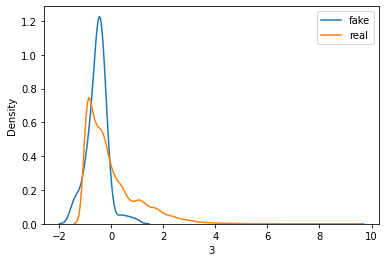

>Saved: drive/My Drive/Thesis/20201031-184353_g_model_01990.h5, and drive/My Drive/Thesis/20201031-184353_c_model_01990.h5


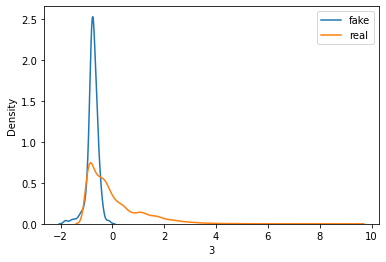

>Saved: drive/My Drive/Thesis/20201031-184639_g_model_03980.h5, and drive/My Drive/Thesis/20201031-184639_c_model_03980.h5


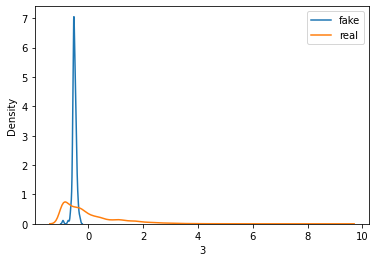

>Saved: drive/My Drive/Thesis/20201031-184924_g_model_05970.h5, and drive/My Drive/Thesis/20201031-184924_c_model_05970.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.986
60th percentile of preds: 0.411
60th percentile of preds: 0.824
                Age        Amount  ...    Purpose_X9           BAD
count  25525.000000  25525.000000  ...  25525.000000  25525.000000
mean       0.155481      0.179059  ...     -0.292499      0.504172
std        0.103928      0.112509  ...      0.112778      0.499992
min       -0.639196     -0.214342  ...     -1.362746      0.000000
25%        0.133096      0.116801  ...     -0.324908      0.000000
50%        0.184775      0.145204  ...     -0.275934      1.000000
75%        0.215078      0.197878  ...     -0.222159      1.000000
max        0.371810      1.005575  ...      0.150074      1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.999


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.837
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 92: 
tao: 0.02523995574973887
accepts: 110 with 0.00909090909090909% bad

> iteration 93: #accepts 10340
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_286 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_950 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_760 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_380 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_380 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_951 (Dense)            (None, 100)               10100     
_________

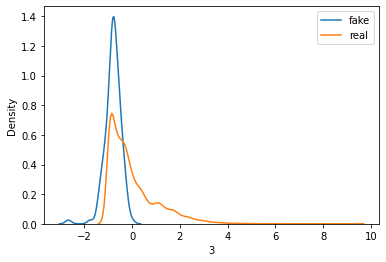

>Saved: drive/My Drive/Thesis/20201031-185334_g_model_02010.h5, and drive/My Drive/Thesis/20201031-185334_c_model_02010.h5


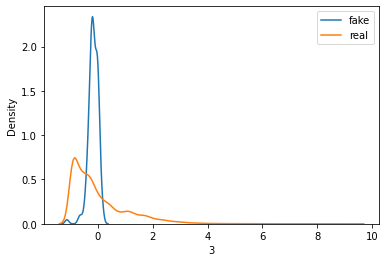

>Saved: drive/My Drive/Thesis/20201031-185620_g_model_04020.h5, and drive/My Drive/Thesis/20201031-185620_c_model_04020.h5


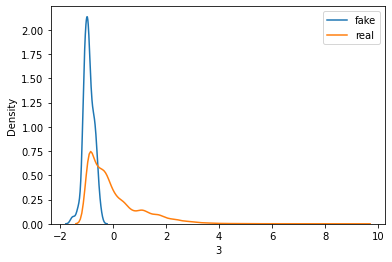

>Saved: drive/My Drive/Thesis/20201031-185907_g_model_06030.h5, and drive/My Drive/Thesis/20201031-185907_c_model_06030.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.986
60th percentile of preds: 0.695
60th percentile of preds: 0.942
                Age        Amount  ...    Purpose_X9           BAD
count  25800.000000  25800.000000  ...  25800.000000  25800.000000
mean      -0.931380      0.624039  ...     -0.094136      0.504767
std        0.225804      0.134903  ...      0.096879      0.499987
min       -3.492889      0.043670  ...     -0.916112      0.000000
25%       -1.061172      0.540838  ...     -0.140326      0.000000
50%       -0.934769      0.596812  ...     -0.104467      1.000000
75%       -0.803798      0.699697  ...     -0.046198      1.000000
max       -0.308340      1.396789  ...      0.341077      1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.985


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.904
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 93: 
tao: 0.027762653208221702
accepts: 110 with 0.00909090909090909% bad

> iteration 94: #accepts 10450
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_289 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_960 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_768 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_384 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_384 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_961 (Dense)            (None, 100)               10100     
________

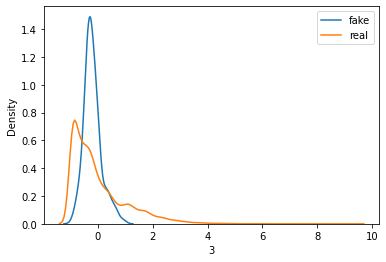

>Saved: drive/My Drive/Thesis/20201031-190315_g_model_02030.h5, and drive/My Drive/Thesis/20201031-190315_c_model_02030.h5


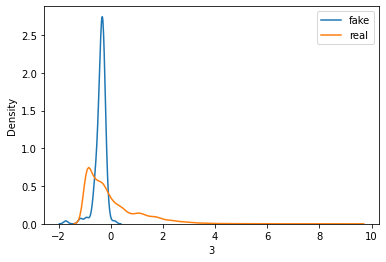

>Saved: drive/My Drive/Thesis/20201031-190604_g_model_04060.h5, and drive/My Drive/Thesis/20201031-190604_c_model_04060.h5


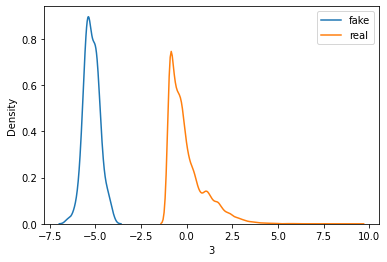

>Saved: drive/My Drive/Thesis/20201031-190853_g_model_06090.h5, and drive/My Drive/Thesis/20201031-190853_c_model_06090.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.986
60th percentile of preds: 0.999
60th percentile of preds: 0.999
                Age        Amount  ...    Purpose_X9           BAD
count  26075.000000  26075.000000  ...  26075.000000  26075.000000
mean      -4.095819      0.360405  ...     -0.851697      0.499521
std        0.488176      0.282592  ...      0.191628      0.500009
min       -7.482427     -1.213878  ...     -1.961556      0.000000
25%       -4.499482      0.200296  ...     -0.969087      0.000000
50%       -4.113657      0.307852  ...     -0.885842      0.000000
75%       -3.722783      0.443648  ...     -0.746963      1.000000
max       -2.255530      1.756353  ...     -0.035589      1.000000

[8 rows x 52 columns]
60th percentile of preds: 0.992
60th percentile of preds: 0.993
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 94: 
tao: 0.03255906665917897
accepts: 110 with 0.00909090909090909% bad

> iteration 95: #accepts 10560
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_292 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_970 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_776 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_388 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_388 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_971 (Dense)            (None, 100)               10100     
_________

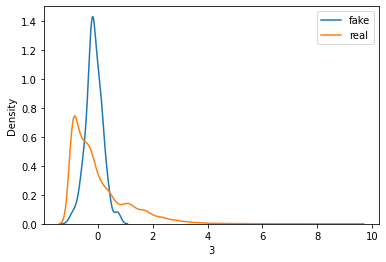

>Saved: drive/My Drive/Thesis/20201031-191310_g_model_02050.h5, and drive/My Drive/Thesis/20201031-191310_c_model_02050.h5


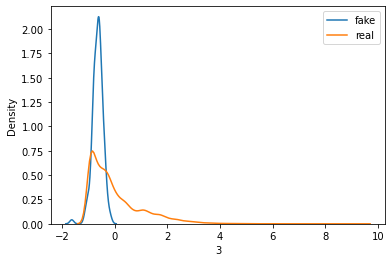

>Saved: drive/My Drive/Thesis/20201031-191601_g_model_04100.h5, and drive/My Drive/Thesis/20201031-191601_c_model_04100.h5


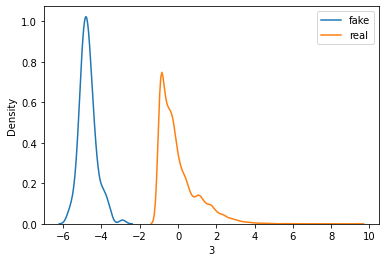

>Saved: drive/My Drive/Thesis/20201031-191851_g_model_06150.h5, and drive/My Drive/Thesis/20201031-191851_c_model_06150.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.986
60th percentile of preds: 0.979
60th percentile of preds: 0.998
                Age        Amount  ...    Purpose_X9           BAD
count  26350.000000  26350.000000  ...  26350.000000  26350.000000
mean      -3.461742     -0.628457  ...     -0.408957      0.498406
std        0.342071      0.371212  ...      0.246762      0.500007
min       -5.232946     -1.652500  ...     -1.249179      0.000000
25%       -3.681971     -0.925745  ...     -0.587411      0.000000
50%       -3.497344     -0.692223  ...     -0.475008      0.000000
75%       -3.279515     -0.365102  ...     -0.269451      1.000000
max       -1.678112      0.718029  ...      0.741664      1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.987


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.979
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 95: 
tao: 0.027273315148314055
accepts: 110 with 0.00909090909090909% bad

> iteration 96: #accepts 10670
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_295 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_980 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_784 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_392 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_392 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_981 (Dense)            (None, 100)               10100     
________

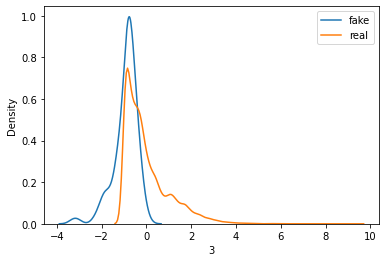

>Saved: drive/My Drive/Thesis/20201031-192308_g_model_02080.h5, and drive/My Drive/Thesis/20201031-192308_c_model_02080.h5


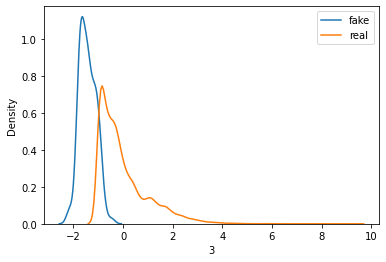

>Saved: drive/My Drive/Thesis/20201031-192600_g_model_04160.h5, and drive/My Drive/Thesis/20201031-192600_c_model_04160.h5


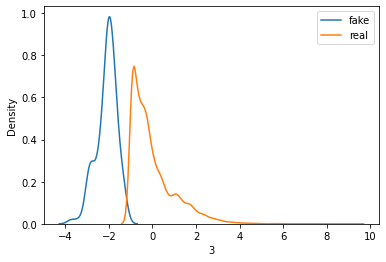

>Saved: drive/My Drive/Thesis/20201031-192855_g_model_06240.h5, and drive/My Drive/Thesis/20201031-192855_c_model_06240.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.986
60th percentile of preds: 0.946
60th percentile of preds: 0.995
                Age        Amount  ...    Purpose_X9           BAD
count  26625.000000  26625.000000  ...  26625.000000  26625.000000
mean      -3.020650      1.741434  ...     -0.228096      0.502047
std        0.353977      0.341049  ...      0.316677      0.500005
min       -5.426996      0.607783  ...     -1.127474      0.000000
25%       -3.305719      1.506097  ...     -0.468584      0.000000
50%       -3.013173      1.720599  ...     -0.244021      1.000000
75%       -2.747710      1.925656  ...      0.039336      1.000000
max       -1.785360      4.909378  ...      0.843892      1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.989
60th percentile of preds: 0.974
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 96: 
tao: 0.025716755766110898
accepts: 110 with 0.00909090909090909% bad

> iteration 97: #accepts 10780
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_298 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_990 (Dense)            (None, 100)               5200      
_________________________________________________________________
batch_normalization_792 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_396 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_396 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_991 (Dense)            (None, 100)               10100     
________

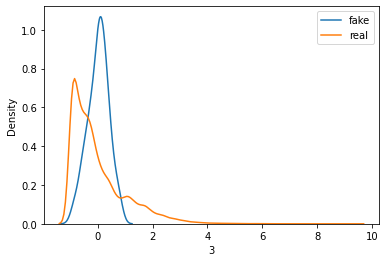

>Saved: drive/My Drive/Thesis/20201031-193310_g_model_02100.h5, and drive/My Drive/Thesis/20201031-193310_c_model_02100.h5


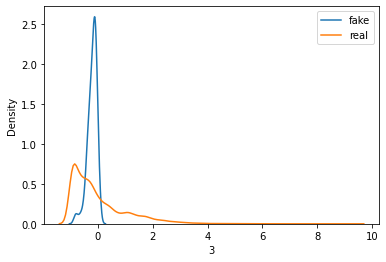

>Saved: drive/My Drive/Thesis/20201031-193609_g_model_04200.h5, and drive/My Drive/Thesis/20201031-193609_c_model_04200.h5


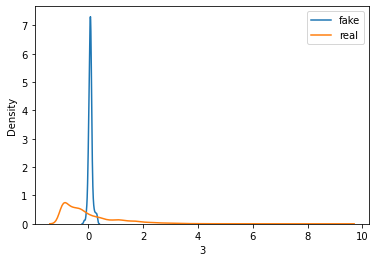

>Saved: drive/My Drive/Thesis/20201031-193909_g_model_06300.h5, and drive/My Drive/Thesis/20201031-193909_c_model_06300.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.986
60th percentile of preds: 0.529
60th percentile of preds: 0.889
                Age        Amount  ...    Purpose_X9           BAD
count  26900.000000  26900.000000  ...  26900.000000  26900.000000
mean       0.025951      0.531227  ...     -0.179764      0.502045
std        0.087739      0.088084  ...      0.076441      0.500005
min       -0.321891     -0.087900  ...     -0.595102      0.000000
25%       -0.025899      0.482433  ...     -0.212537      0.000000
50%        0.012295      0.524930  ...     -0.178631      1.000000
75%        0.055920      0.577281  ...     -0.142694      1.000000
max        0.707379      1.334348  ...      0.441580      1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.985


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.843
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 97: 
tao: 0.024217011992105728
accepts: 110 with 0.01818181818181818% bad

> iteration 98: #accepts 10890
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_301 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_1000 (Dense)           (None, 100)               5200      
_________________________________________________________________
batch_normalization_800 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_400 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_400 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_1001 (Dense)           (None, 100)               10100     
________

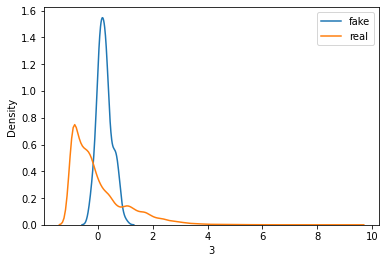

>Saved: drive/My Drive/Thesis/20201031-194331_g_model_02120.h5, and drive/My Drive/Thesis/20201031-194331_c_model_02120.h5


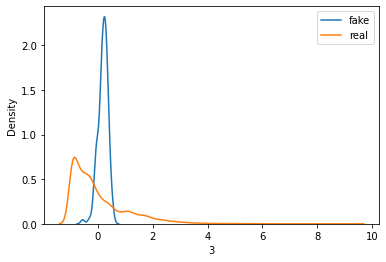

>Saved: drive/My Drive/Thesis/20201031-194628_g_model_04240.h5, and drive/My Drive/Thesis/20201031-194628_c_model_04240.h5


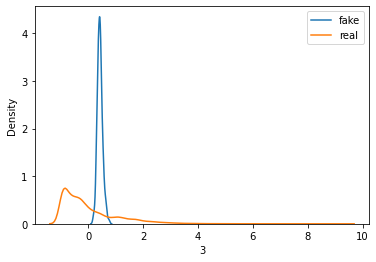

>Saved: drive/My Drive/Thesis/20201031-194926_g_model_06360.h5, and drive/My Drive/Thesis/20201031-194926_c_model_06360.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.985
60th percentile of preds: 0.472
60th percentile of preds: 0.852
                Age        Amount  ...    Purpose_X9           BAD
count  27175.000000  27175.000000  ...  27175.000000  27175.000000
mean       0.475122     -0.037679  ...      0.138588      0.497369
std        0.087707      0.093242  ...      0.073589      0.500002
min        0.003591     -0.399317  ...     -0.156159      0.000000
25%        0.426417     -0.100995  ...      0.091449      0.000000
50%        0.484884     -0.039988  ...      0.130202      0.000000
75%        0.530039      0.033535  ...      0.176703      1.000000
max        0.902467      0.600698  ...      0.654180      1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.982


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.793
60th percentile of preds: 0.978


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


iter 98: 
tao: 0.02560159212756568
accepts: 110 with 0.02727272727272727% bad

> iteration 99: #accepts 11000
Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_304 (InputLayer)       [(None, 51)]              0         
_________________________________________________________________
dense_1010 (Dense)           (None, 100)               5200      
_________________________________________________________________
batch_normalization_808 (Bat (None, 100)               400       
_________________________________________________________________
leaky_re_lu_404 (LeakyReLU)  (None, 100)               0         
_________________________________________________________________
dropout_404 (Dropout)        (None, 100)               0         
_________________________________________________________________
dense_1011 (Dense)           (None, 100)               10100     
_________

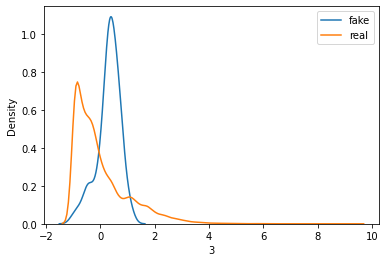

>Saved: drive/My Drive/Thesis/20201031-195343_g_model_02140.h5, and drive/My Drive/Thesis/20201031-195343_c_model_02140.h5


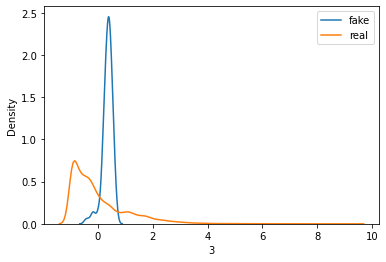

>Saved: drive/My Drive/Thesis/20201031-195643_g_model_04280.h5, and drive/My Drive/Thesis/20201031-195643_c_model_04280.h5


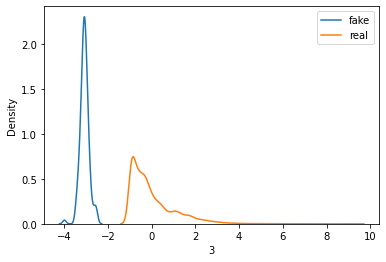

>Saved: drive/My Drive/Thesis/20201031-195946_g_model_06420.h5, and drive/My Drive/Thesis/20201031-195946_c_model_06420.h5


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.985
60th percentile of preds: 0.796
60th percentile of preds: 0.979
                Age        Amount  ...    Purpose_X9           BAD
count  27450.000000  27450.000000  ...  27450.000000  27450.000000
mean      -0.900711      0.528788  ...     -0.706806      0.498215
std        0.200382      0.163192  ...      0.144329      0.500006
min       -3.102378     -0.085604  ...     -1.376020      0.000000
25%       -0.980794      0.423271  ...     -0.805048      0.000000
50%       -0.889160      0.509846  ...     -0.717137      0.000000
75%       -0.802121      0.620281  ...     -0.621127      1.000000
max       -0.063283      1.874254  ...      0.212723      1.000000

[8 rows x 52 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.996


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


60th percentile of preds: 0.944
60th percentile of preds: 0.978
iter 99: 
tao: 0.021757056480997516
accepts: 110 with 0.00909090909090909% bad


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [47]:
D_all_0, c_model, g_model, benchmark, method_1, method_2, method_3, method_all, oracle = acceptance_loop(clf="LR", train=df, test=S, target_col=target_col, reject_col=reject_col, feat_idx=best_feat_idx,
                                                                                                 n_0=500, n=275, h=h, alpha=alpha, j_max=j_max, folder=folder, 
                                                                                                 conditional=True, noise_dim=noise_dim,learning_rate=learning_rate, 
                                                                                                 dropout=dropout, max_epochs=30, batch_size=batch_size)

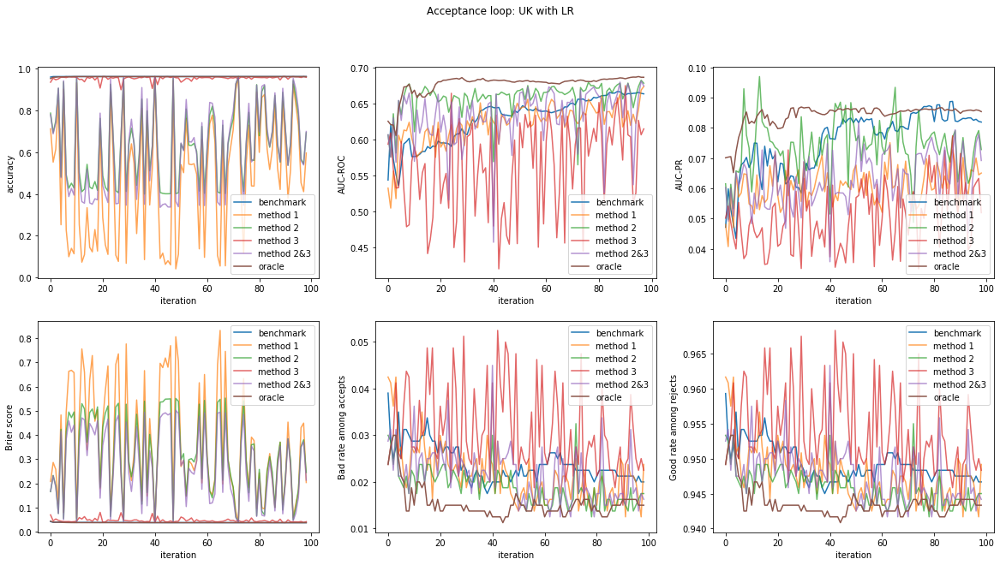

In [229]:
ig, ax = plt.subplots(2,3, figsize=(20,10))
fig.suptitle("Acceptance loop: UK with LR")

ax[0,0].plot(benchmark.index, benchmark.iloc[:,0], label="benchmark")
ax[0,0].plot(method_1.index, method_1.iloc[:,0], label = "method 1", alpha=0.7)
ax[0,0].plot(method_2.index, method_2.iloc[:,0], label = "method 2", alpha=0.7)
ax[0,0].plot(method_3.index, method_3.iloc[:,0], label = "method 3", alpha=0.7)
ax[0,0].plot(method_all.index, method_all.iloc[:,0], label = "method 2&3", alpha=0.7)
ax[0,0].plot(oracle.index, oracle.iloc[:,0], label="oracle")
ax[0,0].legend()
ax[0,0].set(xlabel="iteration", ylabel="accuracy")

ax[0,1].plot(benchmark.index, benchmark.iloc[:,1], label="benchmark")
ax[0,1].plot(method_1.index, method_1.iloc[:,1], label = "method 1", alpha=0.7)
ax[0,1].plot(method_2.index, method_2.iloc[:,1], label = "method 2", alpha=0.7)
ax[0,1].plot(method_3.index, method_3.iloc[:,1], label = "method 3", alpha=0.7)
ax[0,1].plot(method_all.index, method_all.iloc[:,1], label = "method 2&3", alpha=0.7)
ax[0,1].plot(oracle.index, oracle.iloc[:,1], label="oracle")
ax[0,1].legend()
ax[0,1].set(xlabel="iteration", ylabel="AUC-ROC")

ax[0,2].plot(benchmark.index, benchmark.iloc[:,2], label="benchmark")
ax[0,2].plot(method_1.index, method_1.iloc[:,2], label = "method 1", alpha=0.7)
ax[0,2].plot(method_2.index, method_2.iloc[:,2], label = "method 2", alpha=0.7)
ax[0,2].plot(method_3.index, method_3.iloc[:,2], label = "method 3", alpha=0.7)
ax[0,2].plot(method_all.index, method_all.iloc[:,2], label = "method 2&3", alpha=0.7)
ax[0,2].plot(oracle.index, oracle.iloc[:,2], label="oracle")
ax[0,2].legend()
ax[0,2].set(xlabel="iteration", ylabel="AUC-PR")

ax[1,0].plot(benchmark.index, benchmark.iloc[:,3], label="benchmark")
ax[1,0].plot(method_1.index, method_1.iloc[:,3], label = "method 1", alpha=0.7)
ax[1,0].plot(method_2.index, method_2.iloc[:,3], label = "method 2", alpha=0.7)
ax[1,0].plot(method_3.index, method_3.iloc[:,3], label = "method 3", alpha=0.7)
ax[1,0].plot(method_all.index, method_all.iloc[:,3], label = "method 2&3", alpha=0.7)
ax[1,0].plot(oracle.index, oracle.iloc[:,3], label="oracle")
ax[1,0].legend()
ax[1,0].set(xlabel="iteration", ylabel="Brier score")

ax[1,1].plot(benchmark.index, benchmark.iloc[:,4], label="benchmark")
ax[1,1].plot(method_1.index, method_1.iloc[:,4], label = "method 1", alpha=0.7)
ax[1,1].plot(method_2.index, method_2.iloc[:,4], label = "method 2", alpha=0.7)
ax[1,1].plot(method_3.index, method_3.iloc[:,4], label = "method 3", alpha=0.7)
ax[1,1].plot(method_all.index, method_all.iloc[:,4], label = "method 2&3", alpha=0.7)
ax[1,1].plot(oracle.index, oracle.iloc[:,4], label="oracle")
ax[1,1].legend()
ax[1,1].set(xlabel="iteration", ylabel="Bad rate among accepts")

ax[1,2].plot(benchmark.index, benchmark.iloc[:,5], label="benchmark")
ax[1,2].plot(method_1.index, method_1.iloc[:,5], label = "method 1", alpha=0.7)
ax[1,2].plot(method_2.index, method_2.iloc[:,5], label = "method 2", alpha=0.7)
ax[1,2].plot(method_3.index, method_3.iloc[:,5], label = "method 3", alpha=0.7)
ax[1,2].plot(method_all.index, method_all.iloc[:,5], label = "method 2&3", alpha=0.7)
ax[1,2].plot(oracle.index, oracle.iloc[:,5], label="oracle")
ax[1,2].legend()
ax[1,2].set(xlabel="iteration", ylabel="Good rate among rejects")

fig.savefig("uk_LR_loop_graph.png")

plt.show()

In [230]:
uk_method1_gaps = make_gaps(method_1, benchmark)
uk_method2_gaps = make_gaps(method_2, benchmark)
uk_method3_gaps = make_gaps(method_3, benchmark)
uk_method4_gaps = make_gaps(method_all, benchmark)

print(uk_method1_gaps)
print(uk_method2_gaps)
print(uk_method3_gaps)
print(uk_method4_gaps)

      accuracy   AUC-ROC    AUC_PR        BS       ABR       RGR
max   0.000000  0.070113  0.021455  0.793729  0.014981  0.010000
min  -0.917541 -0.115233 -0.031820  0.001814 -0.012484 -0.008333
mean -0.485192 -0.007352 -0.014810  0.329552 -0.002336 -0.001559
      accuracy   AUC-ROC    AUC_PR        BS       ABR       RGR
max   0.000000  0.118369  0.032722  0.514280  0.009988  0.006667
min  -0.560720 -0.091495 -0.036380  0.001387 -0.013733 -0.009167
mean -0.332505  0.029310 -0.001765  0.277509 -0.005073 -0.003385
      accuracy   AUC-ROC    AUC_PR        BS       ABR       RGR
max   0.000000  0.073946  0.010593  0.041847  0.032459  0.021667
min  -0.062969 -0.224935 -0.052008  0.000313 -0.015287 -0.010141
mean -0.008142 -0.066151 -0.025181  0.008613  0.006958  0.004645
      accuracy   AUC-ROC    AUC_PR        BS       ABR       RGR
max  -0.000500  0.118825  0.021997  0.463691  0.024969  0.016667
min  -0.624188 -0.187630 -0.040706  0.001333 -0.013733 -0.009167
mean -0.343243  0.003676 

### Bibliography

Baesens, B., Van Gestel, T., Viaene, S., Stepanova, M., Suykens, J. and Vanthienen, J. (2003) “Benchmarking state-of-the-art classification algorithms for credit scoring,” Jour- nal of the Operational Research Society, Vol. 54, No. 6, pp. 627–635, DOI: 10.1057/pal- grave.jors.2601545.

Brownlee, J. (2019) “How to Implement a Semi-Supervised GAN (SGAN) From Scratch in Keras," URL: https://machinelearningmastery.com/semi-supervised-generative-adversarial-network/.

Kaggle (2020) “Home Credit Dataset,” URL: https://www.kaggle.com/c/home-credit-default-risk.

Kozodoi, N., Alamgir, M., Gatsoulis, Y., Lessmann, S., Moreira-Matias, L., and Papakonstantinou, K. (2020) “Fighting the Sampling Bias: A Framework for Training and Evaluating Scoring Models,” Working paper.

Salimans, T., I. Goodfellow, W. Zaremba, V. Cheung, A. Radford, and X. Chen (2016) “Improved Techniques for Training GANs,” arXiv: 1606.03498.